# load the stuck position

In [1]:
import sys
sys.path.insert(0, './..')
import os
import numpy as np
import matplotlib.pyplot as plt
from HopfiledNetwork import *
from utils import *
import json

In [2]:
matrix = np.load("data/stuck.npz")

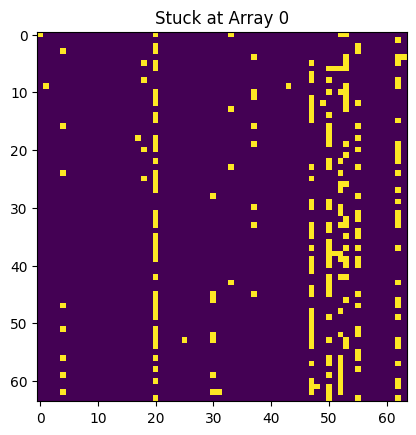

Number of stuck memristors:  239
Number of total memristors:  4096
Percentage of stuck memristors:  5.8349609375 %


In [3]:
stuck_0 = matrix['stuck0']
plt.imshow(stuck_0)
# plt.colorbar()
plt.title("Stuck at Array 0")
plt.show()

count_stuck = np.sum(stuck_0 == 1)
print("Number of stuck memristors: ", count_stuck)
print("Number of total memristors: ", stuck_0.shape[0]*stuck_0.shape[1])
print("Percentage of stuck memristors: ", count_stuck /
      (stuck_0.shape[0]*stuck_0.shape[1])*100, "%")

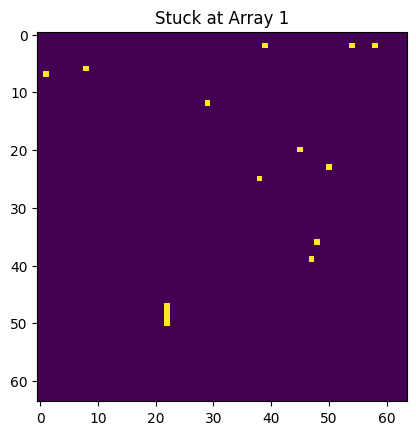

Number of stuck memristors:  15
Number of total memristors:  4096
Percentage of stuck memristors:  0.3662109375 %


In [4]:
stuck_1 = matrix['stuck1']
plt.imshow(stuck_1)
plt.title("Stuck at Array 1")
plt.show()

count_stuck = np.sum(stuck_1 == 1)
print("Number of stuck memristors: ", count_stuck)
print("Number of total memristors: ", stuck_0.shape[0]*stuck_0.shape[1])
print("Percentage of stuck memristors: ", count_stuck /
      (stuck_0.shape[0]*stuck_0.shape[1])*100, "%")

True
Number of stuck memristors:  252
Number of total memristors:  4096
Percentage of stuck memristors:  6.15234375 %


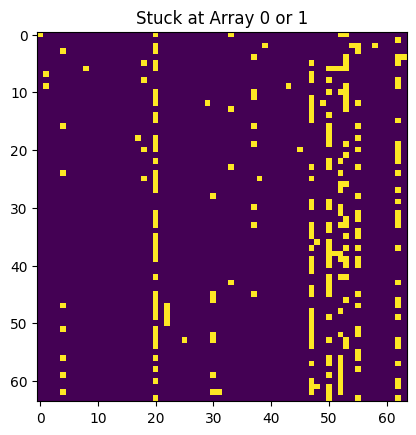

In [5]:
stuck_matrix = stuck_0 + stuck_1
stuck_matrix = stuck_matrix > 0
print(np.max(stuck_matrix))
plt.imshow(stuck_matrix)
plt.title("Stuck at Array 0 or 1")


count_stuck = np.sum(stuck_matrix == 1)
print("Number of stuck memristors: ", count_stuck)
print("Number of total memristors: ", stuck_0.shape[0]*stuck_0.shape[1])
print("Percentage of stuck memristors: ", count_stuck /
      (stuck_0.shape[0]*stuck_0.shape[1])*100, "%")

# load the stored data

In [6]:
path = 'memristor_simulation'
result_path = os.path.join('./results/', path)
if not os.path.exists(result_path):
    os.makedirs(result_path)

num_path = os.path.join('./results/', path, 'numerical')
if not os.path.exists(num_path):
    os.makedirs(num_path)

fig_path = os.path.join('./results/', path, 'fig')
if not os.path.exists(fig_path):
    os.makedirs(fig_path)

model_path = os.path.join('./results/', path, 'models')
if not os.path.exists(model_path):
    os.makedirs(model_path)

In [7]:
from skimage.filters import threshold_mean


def preprocessing(img):
    # Resize image
    # img = resize(img, (w, h), mode='reflect')
    w, h = img.shape

    # Thresholding
    thresh = threshold_mean(img)
    binary = img > thresh
    shift = 2*(binary*1)-1  # Boolian to int

    # Reshape
    flatten = np.reshape(shift, (w*h))
    return flatten


def get_corrupted_input(input, corruption_level):
    corrupted = np.copy(input)
    inv = np.random.binomial(n=1, p=corruption_level, size=len(input))
    for i, v in enumerate(input):
        if inv[i]:
            corrupted[i] = -1 * v
    return corrupted

In [8]:
import numpy as np


def generate_image(description):
    image = np.zeros((7, 7), dtype=int)
    for i in range(7):
        for j in range(7):
            image[i, j] = int(description[i * 7 + j])
    return image


def digital_number(num):
    digits = {
        '0': "0011100 0100010 0100010 0100010 0100010 0100010 0011100",
        '1': "0001100 0000100 0000100 0000100 0000100 0000100 0001111",
        '2': "0011100 0100010 0000010 0001100 0010000 0100000 0111110",
        '3': "0011100 0100010 0000010 0001100 0000010 0100010 0011100",
        '4': "0001000 0011000 0101000 1001000 1111111 0001000 0001000",
        '5': "0111110 0100000 0111100 0000010 0000010 0100010 0011100",
        '6': "0011100 0100010 0100000 0111100 0100010 0100010 0011100",
        '7': "0111110 0000010 0000100 0001000 0001000 0010000 0010000",
        '8': "0011100 0100010 0100010 0011100 0100010 0100010 0011100",
        '9': "0011100 0100010 0100010 0011100 0000010 0100010 0011100",
    }

    images = []
    for i in range(num):
        digit_str = str(i)
        digit_description = digits[digit_str].replace(" ", "")  # Remove spaces
        image = generate_image(digit_description)
        images.append(image)
    return images


patterns = digital_number(10)
digital_data = np.array([preprocessing(d) for d in patterns])
# for i in range(10):
#     plt.imshow(patterns[i])
#     plt.show()

In [9]:
import numpy as np


# 字母A到Z的二值图片描述
letters = {
    'A': "0001100 0010010 0100001 0111111 0100001 0100001 0000000",
    'B': "1111100 1000010 1000010 1111100 1000010 1000010 1111100",
    'C': "0111110 1000001 1000000 1000000 1000001 1000001 0111110",
    'D': "1111100 1000010 1000010 1000010 1000010 1000010 1111100",
    'E': "1111111 1000000 1000000 1111111 1000000 1000000 1111111",
    'F': "1111111 1000000 1000000 1111111 1000000 1000000 1000000",
    'G': "0111110 1000001 1000000 1000111 1000001 1000001 0111110",
    'H': "1000010 1000010 1000010 1111110 1000010 1000010 1000010",
    'I': "0111111 0001100 0001100 0001100 0001100 0001100 0111111",
    'J': "0001111 0000010 0000010 1000010 1000010 1000010 0111100",
    'K': "1000010 1000100 1001000 1110000 1001000 1000100 1000010",
    'L': "1000000 1000000 1000000 1000000 1000000 1000000 1111111",
    'M': "1000001 1100011 1010101 1001001 1000001 1000001 1000001",
    'N': "1000001 1100001 1010001 1001001 1000101 1000011 1000001",
    'O': "0111110 1000001 1000001 1000001 1000001 1000001 0111110",
    'P': "1111100 1000010 1000010 1111100 1000000 1000000 1000000",
    'Q': "0111110 1000001 1000001 1000001 1000101 1000010 0111101",
    'R': "1111100 1000010 1000010 1111100 1001000 1000100 1000010",
    'S': "0111110 1000001 1000000 0111110 0000001 1000001 0111110",
    'T': "1111111 0001000 0001000 0001000 0001000 0001000 0001000",
    'U': "1000010 1000010 1000010 1000010 1000010 1000010 0111100",
    'V': "1000001 1000001 1000001 0100010 0100010 0010100 0001000",
    'W': "1000001 1000001 1000001 1001001 1010101 1100011 1000001",
    'X': "1000001 0100010 0010100 0001000 0010100 0100010 1000001",
    'Y': "1000010 0100100 0011000 0011000 0011000 0011000 0011000",
    'Z': "1111111 0000010 0000100 0001000 0010000 0100000 1111111"
}
# 生成并显示字母A到Z的二值图片
letter_image = []
for letter, description in letters.items():
    description = description.replace(" ", "")  # 移除空格
    image = generate_image(description)
    letter_image.append((2*image-1).flatten())
letter_image = np.array(letter_image)
# plt.imshow(image, cmap='gray')
# plt.show()

(10, 49)
(26, 49)
(14, 49)


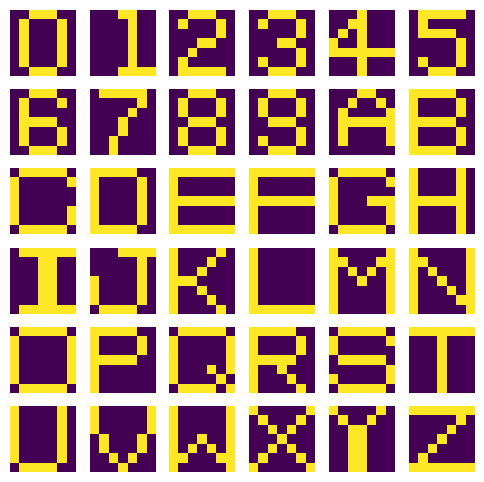

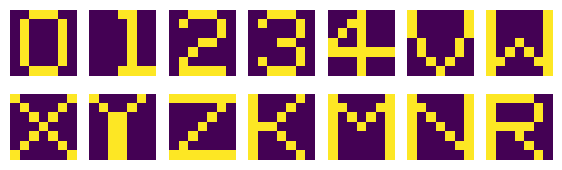

In [10]:
# translate the data to torch version
import torch
n = 10

print(digital_data.shape)
print(letter_image.shape)


# concat the data
digital_letter_data = np.concatenate((digital_data, letter_image))
# for i in range(len(stored_data)):
#     plt.imshow(stored_data[i].reshape(7,7))
#     plt.show()
axs, fig = plt.subplots(6, 6, figsize=(6, 6))
for i in range(36):
    plt.subplot(6, 6, i+1)
    plt.imshow(digital_letter_data[i].reshape(7, 7))
    plt.axis('off')

new_stored_data = np.concatenate((digital_letter_data[0:5], digital_letter_data[31:36]))
select_letter = []
select_letter.append(digital_letter_data[20])
select_letter.append(digital_letter_data[22])
select_letter.append(digital_letter_data[23])
select_letter.append(digital_letter_data[27])
new_stored_data = np.concatenate((new_stored_data, select_letter))
print(new_stored_data.shape)


axs, fig = plt.subplots(2, 7, figsize=(7, 2))
for i in range(14):
    plt.subplot(2, 7, i+1)
    plt.imshow(new_stored_data[i].reshape(7, 7))
    plt.axis('off')

stored_data = new_stored_data
stored_data = torch.from_numpy(stored_data).float()
stored_data = stored_data[0:n]

[[-3.76779451e-03 -2.35646878e-02  0.00000000e+00 ...  1.93002353e-05
   0.00000000e+00 -4.53797647e-04]
 [ 8.01787401e-02 -2.24423016e-02  0.00000000e+00 ...  3.82740235e-04
   3.46870588e-06 -4.58357647e-05]
 [ 3.36502714e-02  9.54984314e-04  0.00000000e+00 ... -6.67614541e-03
   7.08861176e-05 -7.01281898e-03]
 ...
 [ 1.13574588e-04  2.19790701e-02  0.00000000e+00 ... -3.61805929e-03
   0.00000000e+00  5.92871987e-01]
 [ 8.93167059e-05  7.42058418e-01  0.00000000e+00 ...  5.10156863e-04
   0.00000000e+00  3.29345462e-02]
 [ 0.00000000e+00  1.71037354e-01  0.00000000e+00 ...  0.00000000e+00
   0.00000000e+00 -9.63447686e-03]]
(10000,)
(64, 10000)
[7 2 1 ... 4 5 6]


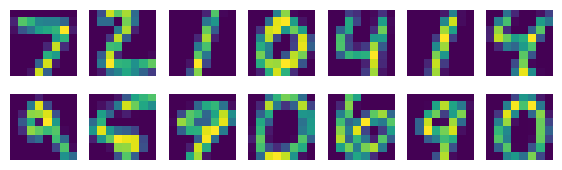

[0 0 0 ... 9 9 9]


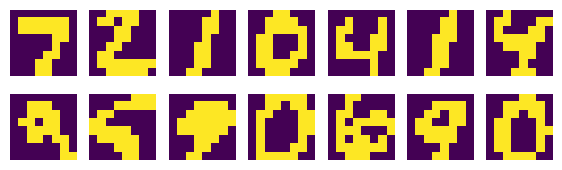

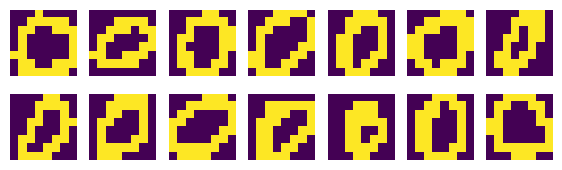

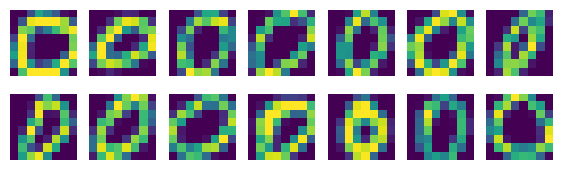

In [11]:
import scipy.io

# 用loadmat函数加载.mat文件
mat_data = scipy.io.loadmat('data/mnist_test_8x8.mat')
print(mat_data['data'])
mnist_data = mat_data['data']
mnist_label=mat_data['labels'].flatten()
print(mnist_label.shape)


new_mnist_data=[]
print(mnist_data.shape)
print(mnist_label)
for i in range(len(mnist_data[1])):
    mid_data=mnist_data[:,i].reshape(8,8).T
    mid_data=mid_data.flatten()
    new_mnist_data.append(mid_data)
new_mnist_data=np.array(new_mnist_data)
new_mnist_data=2*np.clip(new_mnist_data,0,1)-1



plt.figure(figsize=(7, 2))
for i in range(14):
    plt.subplot(2, 7, i+1)
    plt.imshow(new_mnist_data[i].reshape(8, 8))
    plt.axis('off')
plt.show()

new_mnist_data_binary=[]
for i in range(len(new_mnist_data)):
    mid_data=new_mnist_data[i] 
    mid_data= preprocessing(mid_data.reshape(8,8))
    new_mnist_data_binary.append(mid_data)
new_mnist_data_binary=np.array(new_mnist_data_binary)

sorting_indices = np.argsort(mnist_label)
sorted_mnist_data = new_mnist_data[sorting_indices]
print(mnist_label[sorting_indices])

new_mnist_data_binary_order=[]
for i in range(len(sorted_mnist_data)):
    mid_data=sorted_mnist_data[i]
    mid_data= preprocessing(mid_data.reshape(8,8))
    new_mnist_data_binary_order.append(mid_data)
new_mnist_data_binary_order=np.array(new_mnist_data_binary_order)

new_mnist_data_order=[]
for i in range(len(sorted_mnist_data)):
    mid_data=sorted_mnist_data[i]
    mid_data=mid_data.flatten()
    new_mnist_data_order.append(mid_data)
new_mnist_data_order=np.array(new_mnist_data_order)


plt.figure(figsize=(7, 2))
for i in range(14):
    plt.subplot(2, 7, i+1)
    plt.imshow(new_mnist_data_binary[i].reshape(8, 8))
    plt.axis('off')
plt.show()

plt.figure(figsize=(7, 2))
for i in range(14):
    plt.subplot(2, 7, i+1)
    plt.imshow(new_mnist_data_binary_order[i].reshape(8, 8))
    plt.axis('off')
plt.show()

plt.figure(figsize=(7, 2))
for i in range(14):
    plt.subplot(2, 7, i+1)
    plt.imshow(new_mnist_data_order[i].reshape(8, 8))
    plt.axis('off')
plt.show()

# load MNIST Data

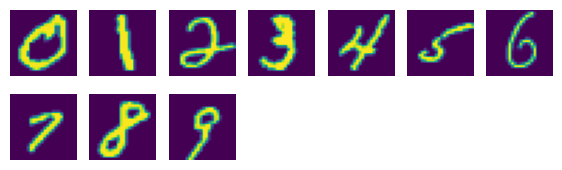

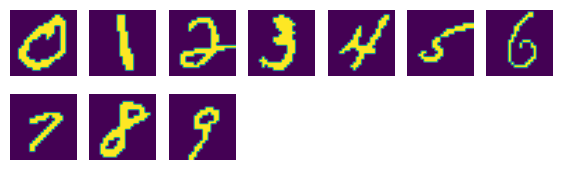

In [12]:
import torch
from torchvision import transforms, datasets
from PIL import Image

def load_sequence_mnist(seed, seq_len, order=True, binary=True):
    # Set the random seed for reproducibility
    torch.manual_seed(seed)

    # Define the transform to convert the images to PyTorch tensors
    transform = transforms.Compose([
        transforms.ToTensor(),
    ])

    # Load the MNIST dataset
    mnist = datasets.MNIST(root='./data', train=True, download=True, transform=transform)

    # Initialize an empty tensor to store the sequence of digits
    sequence = torch.zeros((seq_len, 24, 24))

    if order:
        # Loop through each digit class and randomly sample one image from each class
        for i in range(seq_len):
            indices = torch.where(mnist.targets == i)[0]

            # Choose the first index in the list (0-based indexing)
            idx = 1 if indices.size()[0] > 0 else None

            if idx is not None:
                img, _ = mnist[indices[idx]]
                # 这里可以使用img进行接下来的操作

            # Crop to 24x24
            img = transforms.functional.crop(img, 2, 2, 24, 24)

            # Resize to 8x8
            img = transforms.functional.resize(img, (24,24), interpolation=Image.BICUBIC)

            sequence[i] = img.squeeze()

    else:
        # Sample `seq_len` random images from the MNIST dataset
        indices = torch.randint(0, len(mnist), (seq_len,))
        for i, idx in enumerate(indices):
            img, _ = mnist[idx]

            # Crop to 24x24
            # img = transforms.functional.crop(img, 2, 2, 24, 24)
            # Resize to 8x8
            img = transforms.functional.resize(img, (28, 28), interpolation=Image.BICUBIC)

            sequence[i] = (2*img-1).squeeze()

    if binary:
        sequence[sequence > 0.5] = 1
        sequence[sequence <= 0.5] = -1

    return sequence



num_mnist=10
mnist_data=load_sequence_mnist(1, num_mnist, order=True, binary=False)
plt.figure(figsize=(7, 2))
for i in range(10):
    plt.subplot(2, 7, i+1)
    plt.imshow(mnist_data[i].reshape(24, 24))
    plt.axis('off')
mnist_data=mnist_data.reshape(num_mnist,576)


mnist_data_binary=load_sequence_mnist(1, num_mnist, order=True, binary=True)
plt.figure(figsize=(7, 2))
for i in range(10):
    plt.subplot(2, 7, i+1)
    plt.imshow(mnist_data_binary[i].reshape(24, 24))
    plt.axis('off')
mnist_data_binary=mnist_data_binary.reshape(num_mnist,576)

# Load EMNIST Data

['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z', 'a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j', 'k', 'l', 'm', 'n', 'o', 'p', 'q', 'r', 's', 't', 'u', 'v', 'w', 'x', 'y', 'z']
{'0': 0, '1': 1, '2': 2, '3': 3, '4': 4, '5': 5, '6': 6, '7': 7, '8': 8, '9': 9, 'A': 10, 'B': 11, 'C': 12, 'D': 13, 'E': 14, 'F': 15, 'G': 16, 'H': 17, 'I': 18, 'J': 19, 'K': 20, 'L': 21, 'M': 22, 'N': 23, 'O': 24, 'P': 25, 'Q': 26, 'R': 27, 'S': 28, 'T': 29, 'U': 30, 'V': 31, 'W': 32, 'X': 33, 'Y': 34, 'Z': 35, 'a': 36, 'b': 37, 'c': 38, 'd': 39, 'e': 40, 'f': 41, 'g': 42, 'h': 43, 'i': 44, 'j': 45, 'k': 46, 'l': 47, 'm': 48, 'n': 49, 'o': 50, 'p': 51, 'q': 52, 'r': 53, 's': 54, 't': 55, 'u': 56, 'v': 57, 'w': 58, 'x': 59, 'y': 60, 'z': 61}


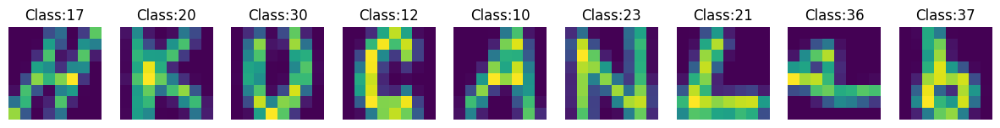

(9, 64)


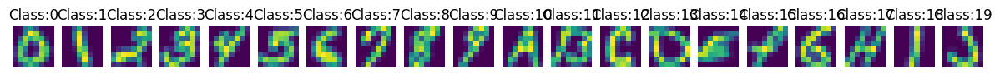

(20, 64)


In [25]:
import torchvision
from torchvision import transforms

transform = transforms.Compose([
    transforms.CenterCrop(24),  # 将图像居中裁剪为24x24
    transforms.Resize(8),  # 将图像调整为8x8
    transforms.ToTensor(),  # 将图像转换为张量
    transforms.Normalize((0.5,), (0.5,))  # 标准化图像
])
emnist_train = torchvision.datasets.EMNIST(root='./data', split='byclass', train=True, transform=transform, download=True)

print(emnist_train.classes)
print(emnist_train.class_to_idx)

class_hku=[17,20,30,12,10,23,21,36,37]
class_emnist=[0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19]
def select_one_sample_per_class(dataset, classes, sample_index=0):
    selected_samples = {}
    for class_idx in classes:
        class_count = 0
        for idx, (image, label) in enumerate(dataset):
            if label == class_idx:
                if class_count == sample_index:
                    selected_samples[class_idx] = (image, label)
                    break
                class_count += 1
    return selected_samples


# 使用自定义函数挑选每个类别的一个样本
selected_samples = select_one_sample_per_class(emnist_train, class_hku, sample_index=1)
emnist_samples = select_one_sample_per_class(emnist_train, class_emnist, sample_index=1)

# 创建一个新的图形
plt.figure(figsize=(15, 5))
hku_classes=[]
# 打印每个类别挑选的样本
for i, (class_idx, (sample_image, sample_label)) in enumerate(selected_samples.items()):
    plt.subplot(1, len(selected_samples), i + 1)
    plt.title("Class:{}".format(class_idx))
    sample_image = sample_image.squeeze().numpy().T
    hku_classes.append(sample_image.flatten())
    plt.imshow(sample_image)
    plt.axis('off')  # 关闭坐标轴
plt.show()
hku_classes=np.array(hku_classes)
print(hku_classes.shape)


# 创建一个新的图形
plt.figure(figsize=(15, 5))
emnist_classes=[]
# 打印每个类别挑选的样本
for i, (class_idx, (sample_image, sample_label)) in enumerate(emnist_samples.items()):
    plt.subplot(1, len(emnist_samples), i + 1)
    plt.title("Class:{}".format(class_idx))
    sample_image = sample_image.squeeze().numpy().T
    emnist_classes.append(sample_image.flatten())
    plt.imshow(sample_image)
    plt.axis('off')  # 关闭坐标轴
plt.show()
emnist_classes=np.array(emnist_classes)
print(emnist_classes.shape)

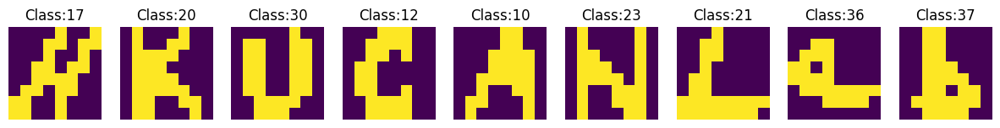

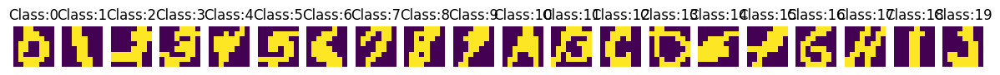

Binary Images Shape: (20, 8, 8)


In [26]:
import numpy as np
import matplotlib.pyplot as plt

# 使用自适应阈值化将图像转换为二值图像
def adaptive_thresholding(image):
    # 将图像转换为灰度图像
    gray_image = image.squeeze().numpy()  # 将张量转换为NumPy数组并去除尺寸为1的维度
    mean_threshold = np.mean(gray_image)
    # 应用自适应阈值二值化
    binary_image = np.where(gray_image > mean_threshold, 1, -1)  # 这里简单地使用0.5作为阈值，您也可以根据需要调整
    return binary_image

# 调整后的样本
selected_samples = select_one_sample_per_class(emnist_train, class_hku, sample_index=1)

# 创建一个新的图形
plt.figure(figsize=(15, 5))

# 存储二值化后的图像
binary_hku_images = []

# 对每个类别的样本应用自适应阈值二值化
for i, (class_idx, (sample_image, sample_label)) in enumerate(selected_samples.items()):
    plt.subplot(1, len(selected_samples), i + 1)
    plt.title("Class:{}".format(class_idx))
    # 应用自适应阈值二值化
    binary_image = adaptive_thresholding(sample_image)
    binary_hku_images.append(binary_image)
    plt.imshow(binary_image.T)  # 设置颜色映射范围为0到1
    plt.axis('off')  # 关闭坐标轴
plt.show()

# 将二值化后的图像转换为数组
binary_hku_images = np.array(binary_hku_images)


# 调整后的样本
selected_samples = select_one_sample_per_class(emnist_train, class_emnist, sample_index=1)

# 创建一个新的图形
plt.figure(figsize=(15, 5))

# 存储二值化后的图像
binary_emnist_images = []

# 对每个类别的样本应用自适应阈值二值化
for i, (class_idx, (sample_image, sample_label)) in enumerate(selected_samples.items()):
    plt.subplot(1, len(selected_samples), i + 1)
    plt.title("Class:{}".format(class_idx))
    # 应用自适应阈值二值化
    binary_image = adaptive_thresholding(sample_image)
    binary_emnist_images.append(binary_image)
    plt.imshow(binary_image.T)  # 设置颜色映射范围为0到1
    plt.axis('off')  # 关闭坐标轴
plt.show()

# 将二值化后的图像转换为数组
binary_images = np.array(binary_emnist_images)
print("Binary Images Shape:", binary_images.shape)



In [27]:
import torchvision
from torchvision import transforms
import random

transform = transforms.Compose([
    transforms.CenterCrop(24),  # 将图像居中裁剪为24x24
    transforms.Resize(8),  # 将图像调整为8x8
    transforms.ToTensor(),  # 将图像转换为张量
    transforms.Normalize((0.5,), (0.5,))  # 标准化图像
])

emnist_train = torchvision.datasets.EMNIST(root='./data', split='byclass', train=True, transform=transform, download=True)

num_samples = 1000  # 你想要处理的样本数量

# 将数据集转换为列表
emnist_train_list = list(emnist_train)
EMNIST_data=[]
# 随机选择num_samples个样本
random_samples = random.sample(emnist_train_list, num_samples)

# 打印每个类别挑选的样本
for i, (sample_image, sample_label) in enumerate(random_samples):
    sample_image = sample_image.squeeze().numpy().T
    EMNIST_data.append(sample_image.flatten())
EMNIST_data=np.array(EMNIST_data)
print(EMNIST_data.shape)

# 创建一个新的图形
plt.figure(figsize=(15, 5))
for i in range(10):
    plt.subplot(1, 10, i + 1)
    plt.imshow(EMNIST_data[i].reshape(8, 8))
    plt.axis('off')  # 关闭坐标轴
plt.show()

# 使用自适应阈值化将图像转换为二值图像
EMNIST_data_binary=[]   
for i in range(len(EMNIST_data)):
    gray_image = EMNIST_data[i].reshape(8,8)
    mean_threshold = np.mean(gray_image)
    # 应用自适应阈值二值化
    binary_image = np.where(gray_image > mean_threshold, 1, -1)  # 这里简单地使用0.5作为阈值，您也可以根据需要调整
    EMNIST_data_binary.append(binary_image.flatten())
EMNIST_data_binary=np.array(EMNIST_data_binary)

# 创建一个新的图形
plt.figure(figsize=(15, 5))
for i in range(10):
    plt.subplot(1, 10, i + 1)
    plt.imshow(EMNIST_data_binary[i].reshape(8, 8))
    plt.axis('off')  # 关闭坐标轴
plt.show()

KeyboardInterrupt: 

(1000, 64)


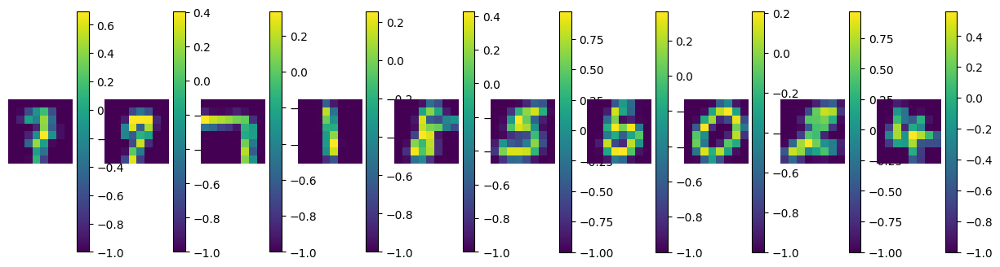

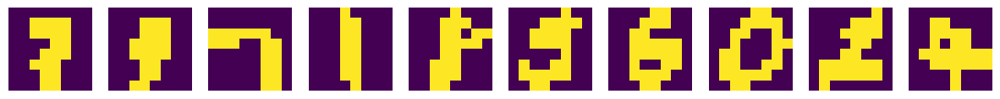

In [ ]:
import torchvision
from torchvision import transforms
import random

transform = transforms.Compose([
    transforms.CenterCrop(24),  # 将图像居中裁剪为24x24
    transforms.Resize(8),  # 将图像调整为8x8
    transforms.ToTensor(),  # 将图像转换为张量
    transforms.Normalize((0.5,), (0.5,))  # 标准化图像
])

mnist_train = torchvision.datasets.MNIST(root='../data', train=True, transform=transform, download=True)

num_samples = 1000  # 你想要处理的样本数量

# 将数据集转换为列表
emnist_train_list = list(mnist_train)
MNIST_data=[]
# 随机选择num_samples个样本
random_samples = random.sample(emnist_train_list, num_samples)

# 打印每个类别挑选的样本
for i, (sample_image, sample_label) in enumerate(random_samples):
    sample_image = sample_image.squeeze().numpy().T
    MNIST_data.append(sample_image.flatten())
MNIST_data=np.array(MNIST_data)
print(MNIST_data.shape)

# 创建一个新的图形
plt.figure(figsize=(15, 5))
for i in range(10):
    plt.subplot(1, 10, i + 1)
    plt.imshow(MNIST_data[i].reshape(8, 8).T)
    plt.colorbar()
    plt.axis('off')  # 关闭坐标轴
plt.show()

# 使用自适应阈值化将图像转换为二值图像
MNIST_data_binary=[]   
for i in range(len(MNIST_data)):
    gray_image = MNIST_data[i].reshape(8,8)
    mean_threshold = np.mean(gray_image)
    # 应用自适应阈值二值化
    binary_image = np.where(gray_image > mean_threshold, 1, -1)  # 这里简单地使用0.5作为阈值，您也可以根据需要调整
    MNIST_data_binary.append(binary_image.flatten())
MNIST_data_binary=np.array(MNIST_data_binary)

# 创建一个新的图形
plt.figure(figsize=(15, 5))
for i in range(10):
    plt.subplot(1, 10, i + 1)
    plt.imshow(MNIST_data_binary[i].reshape(8, 8).T)
    plt.axis('off')  # 关闭坐标轴
plt.show()

# Multilayer Hopfield Neural Network for Associate Memory

## multilayer hnn for binary patterns

### demostration

In [17]:
num_samples = 10
stored_data_list=torch.from_numpy(new_mnist_data_binary).float()
stored_data = stored_data_list[0:num_samples]

In [13]:
n=405
num_samples = 2
stored_data_list=torch.from_numpy(new_mnist_data_binary_order).float()
stored_data = stored_data_list[n::1000]
stored_data=stored_data[0:num_samples]

In [50]:
print(stored_data.shape)
print(binary_hku_images.shape)
binary_hku_images=torch.from_numpy(binary_hku_images).permute(0,2,1).float()
binary_hku_images=binary_hku_images.reshape(9,64)
print(binary_hku_images.shape)

stored_data = torch.cat((stored_data, binary_hku_images), 0)
print(stored_data.shape)


torch.Size([10, 64])
(9, 8, 8)
torch.Size([9, 64])
torch.Size([19, 64])


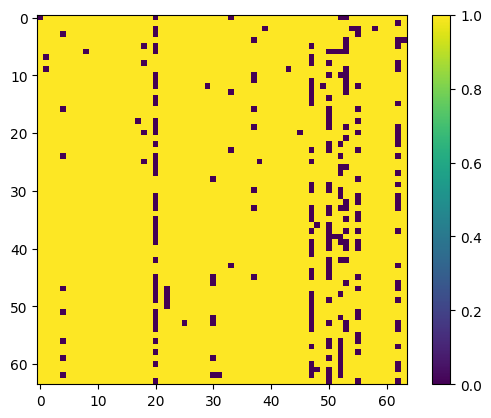

iteration= 99
pattern shape torch.Size([2, 64])
iteration= 99
Epoch [2568/20000], Loss: 9.971102166161927e-09
Epoch [2568/20000], Loss: 9.971102166161927e-09
Epoch [9129/40000], Loss: 9.999384431580438e-09
Epoch [9129/40000], Loss: 9.999384431580438e-09
hnn loss 9.971102166161927e-09
multi_hnn loss 9.999384431580438e-09


In [30]:

device='cpu'
input_size=stored_data.shape[1]
encoder_dim=4
num_hidden_layers=1
nonlin='tanh'
learn_lr=0.001
learn_iters=20000
params={
    'input_size':input_size,
    'encoder_dim':encoder_dim,
    'num_hidden_layers':num_hidden_layers,
    'nonlin':nonlin,
    'learn_lr':learn_lr,
    'learn_iters':learn_iters,
    'device':device,
    'recall_iters':100,
    'data_type':'binary',
}

#plot settings
plot_weight_flag=True

#memristor variation and stuck at fault
mem_var=0.0
stuck_at_fault_rate=0.0
mask_0=1-stuck_0
mask_1=1-stuck_1

mem_stuck_mask=mask_0*mask_1
mem_stuck_mask=torch.from_numpy(mem_stuck_mask).float()
# mem_stuck_mask=torch.ones(input_size,input_size)

# mem_stuck_mask=generate_mask(1,49,stuck_at_fault_rate)
plt.imshow(mem_stuck_mask)
plt.colorbar()
plt.show()




# create the network
hnn=SingleLayerHNN_lambda(input_size=input_size)
multi_hnn=MultiLayerHNN_beta(input_dim=input_size,encoding_dim=encoder_dim,num_hidden_layers=num_hidden_layers,nolinear=nonlin)


Hebb = HopfieldNet(num_neurons=input_size)
Storkey = HopfieldNet(num_neurons=input_size)
Pinv=HopfieldNet(num_neurons=input_size)
Oja=HopfieldNet(num_neurons=input_size)
Equilibrium=HopfieldNet(num_neurons=input_size)
IterativeStorkey=HopfieldNet(num_neurons=input_size)

# train the network
Hebb.learn_patterns(stored_data, rule='Hebb',options={})
Storkey.learn_patterns(stored_data, rule='Storkey',options={})     
Pinv.learn_patterns(stored_data, rule='Pinv',options={})
Oja.learn_patterns(stored_data, rule='Oja',options={})
Equilibrium.learn_patterns(stored_data, rule='Equilibrium',options={})
IterativeStorkey.learn_patterns(stored_data, rule='IterativeStorkey',options={})  

optimizer_hnn = torch.optim.RMSprop(hnn.parameters(), lr=learn_lr)
optimizer_multi = torch.optim.RMSprop(multi_hnn.parameters(), lr=learn_lr/2)

hnn.set_mask(mask=mem_stuck_mask)
hnn.noise_level=mem_var*4
hnn_losses=train_multilayer_batch(hnn, optimizer_hnn, stored_data, learn_iters, device)
hnn.add_variation(var=mem_var)

multi_hnn.noise_level=mem_var*0
multi_hnn_losses=train_multilayer_batch(multi_hnn, optimizer_multi, stored_data, 2*learn_iters, device)
multi_hnn.add_variation(var=mem_var)

print('hnn loss',hnn_losses[-1])
print('multi_hnn loss',multi_hnn_losses[-1])

Hebb.add_weight_variation(variation=mem_var)
Storkey.add_weight_variation(variation=mem_var)
IterativeStorkey.add_weight_variation(variation=mem_var)
Pinv.add_weight_variation(variation=mem_var)
Oja.add_weight_variation(variation=mem_var)
Equilibrium.add_weight_variation(variation=mem_var)

Hebb.add_mask(mask=mem_stuck_mask)
Storkey.add_mask(mask=mem_stuck_mask)
IterativeStorkey.add_mask(mask=mem_stuck_mask)
Pinv.add_mask(mask=mem_stuck_mask)
Oja.add_mask(mask=mem_stuck_mask)
Equilibrium.add_mask(mask=mem_stuck_mask)

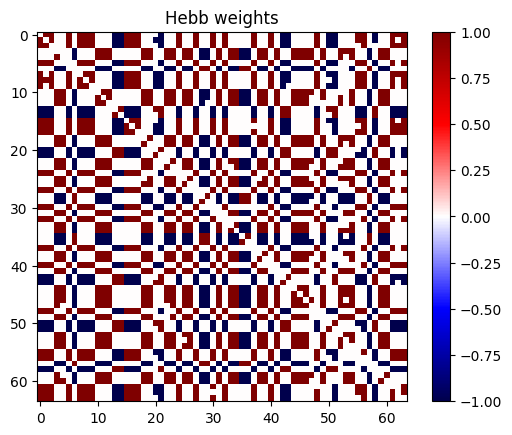

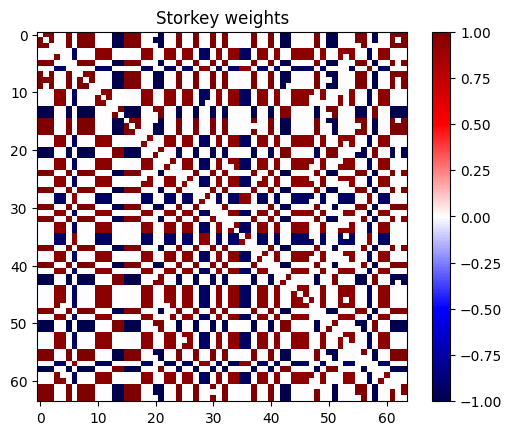

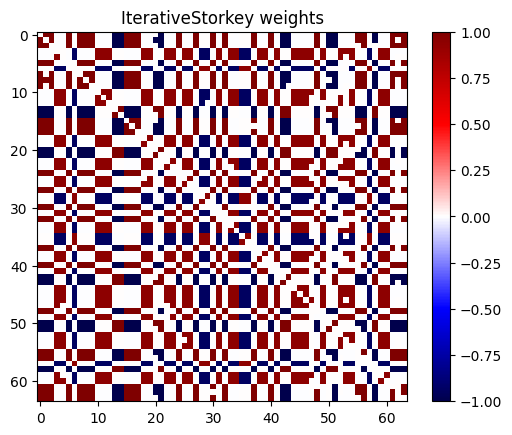

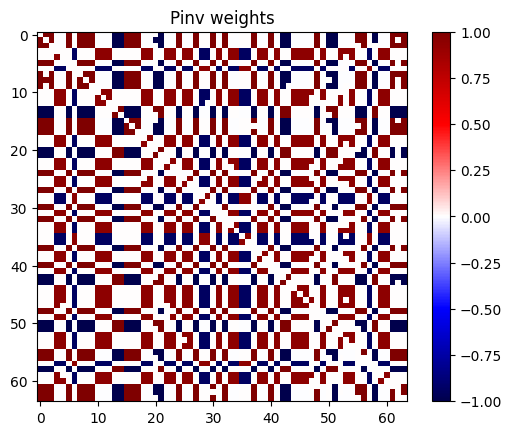

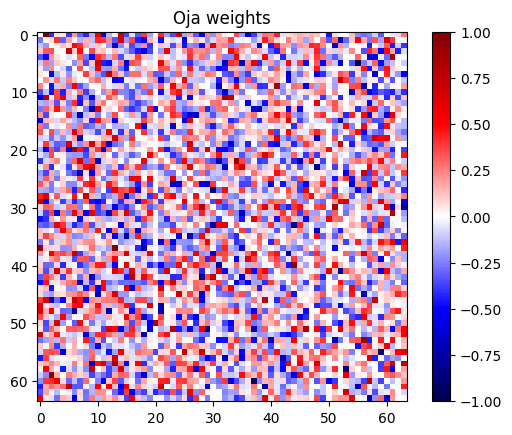

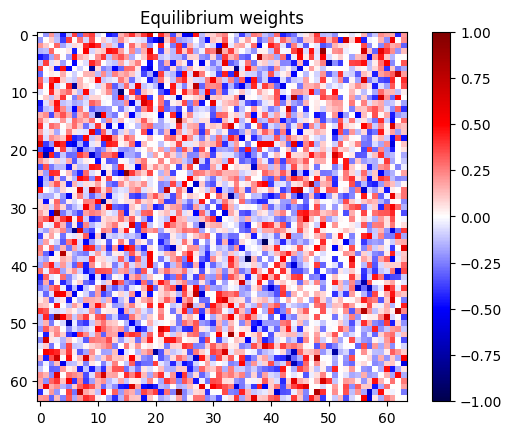

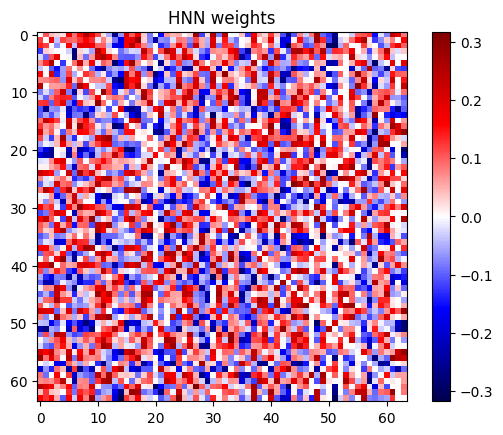

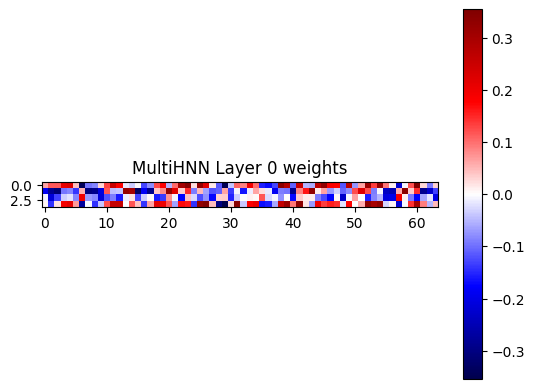

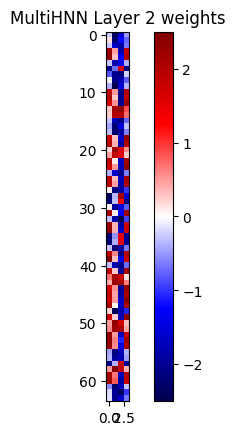

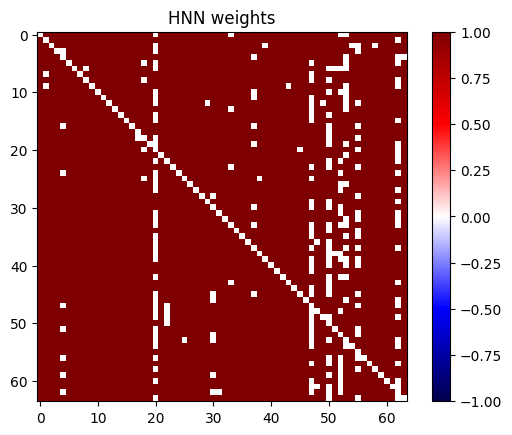

In [31]:
plot_weight_flag=True
if plot_weight_flag:
    plot_weight(to_np(Hebb.weights),'Hebb')
    plot_weight(to_np(Storkey.weights),'Storkey')
    plot_weight(to_np(IterativeStorkey.weights),'IterativeStorkey')
    plot_weight(to_np(Pinv.weights),'Pinv')
    plot_weight(to_np(Oja.weights),'Oja')
    plot_weight(to_np(Equilibrium.weights),'Equilibrium')
    plot_weight(to_np(hnn.linear.weight)*to_np(hnn.mask),'HNN')
    for i,layer in enumerate(multi_hnn.encoder):
        if i%2==0:
            plot_weight(to_np(multi_hnn.encoder[i].weight),f'MultiHNN Layer {i}')
    plot_weight(to_np(multi_hnn.decoder[0].weight),'MultiHNN Layer 2')

    plot_weight(to_np(hnn.mask),'HNN')

In [32]:
params['recall_iters']=10
params['mid_state']=True
test_data=np.array([get_corrupted_input(d,0.1) for d in stored_data])
test_data = torch.from_numpy(test_data).float()

sync=True

# recall data
HNN_recall,HNN_mid_recall = singlelayer_recall(hnn, test_data, params)
MultiHNN_recall,MultiHNN_mid_recall=singlelayer_recall(multi_hnn, test_data, params)
Hebb_recall=Hebb.retrieve_pattern(test_data, sync=sync,chnn=False)
Storkey_recall=Storkey.retrieve_pattern(test_data, sync=sync,chnn=False)
IterativeStorkey_recall=IterativeStorkey.retrieve_pattern(test_data, sync=sync,chnn=False)
Pinv_recall=Pinv.retrieve_pattern(test_data, sync=sync,chnn=False)
Oja_recall=Oja.retrieve_pattern(test_data, sync=sync,chnn=False)
Equilibrium_recall=Equilibrium.retrieve_pattern(test_data, sync=sync,chnn=False)


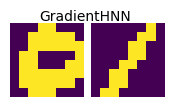

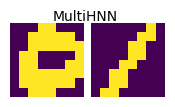

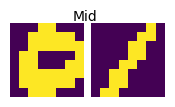

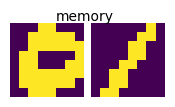

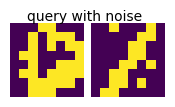

<Figure size 640x480 with 0 Axes>

In [33]:
path = 'memristor_assocaite_memory'
fig_path = os.path.join('./results/', path, 'fig')
if not os.path.exists(fig_path):
    os.makedirs(fig_path)

params['plot_num_per_row'] = 12
params['data_set'] = 'mnist'
params['repeat'] = 10

plot_recalls(HNN_recall, 'GradientHNN', fig_path, params)
plot_recalls(MultiHNN_recall, 'MultiHNN', fig_path, params)
plot_recalls(MultiHNN_mid_recall[1], 'Mid', fig_path, params)
plot_memory(stored_data, 1, fig_path, params)
plot_memory_noise(test_data, 1, fig_path, params)

In [28]:
np.savez("associate_memory_2pattern_20250328.npz",weight=hnn.linear.weight.cpu().detach().numpy(),mask=hnn.mask.cpu().detach().numpy(),stuck_0=stuck_0,stuck_1=stuck_1,patterns=stored_data)

In [34]:
np.savez("associate_memory_multi_2pattern_20250328.npz",encoder_weight=to_np(multi_hnn.encoder[0].weight),decoder_weight=to_np(multi_hnn.decoder[0].weight),patterns=stored_data)

In [21]:
np.savez("associate_memory_multi_20250328.npz",encoder_weight=to_np(multi_hnn.encoder[0].weight),decoder_weight=to_np(multi_hnn.decoder[0].weight),patterns=stored_data)

In [55]:
np.savez("associate_memory_hku_multi.npz",encoder_weight=to_np(multi_hnn.encoder[0].weight),decoder_weight=to_np(multi_hnn.decoder[0].weight),patterns=stored_data)

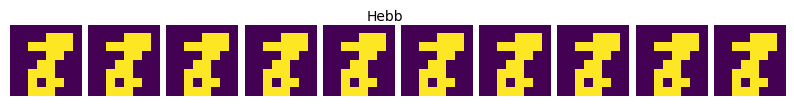

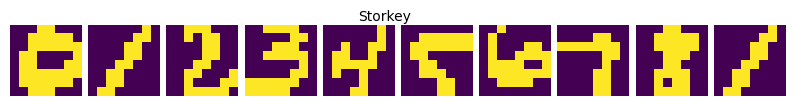

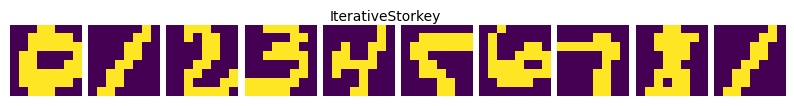

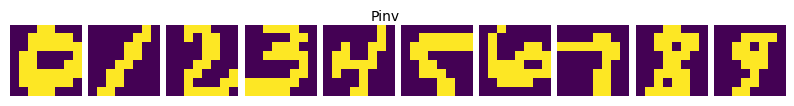

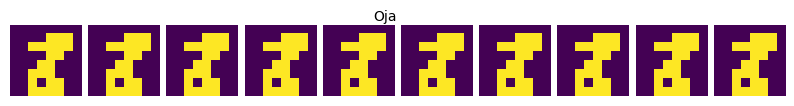

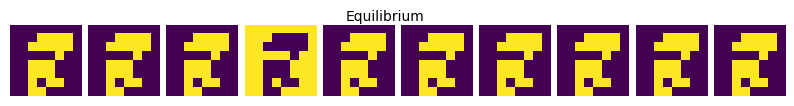

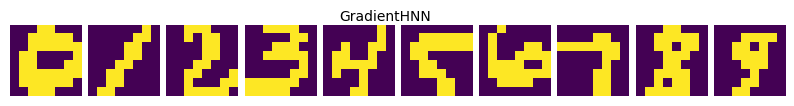

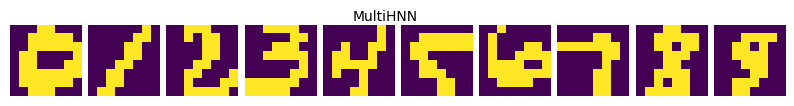

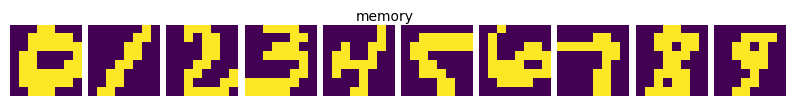

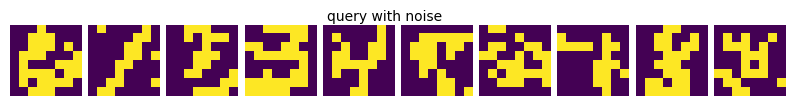

<Figure size 640x480 with 0 Axes>

In [20]:
path = 'memristor_assocaite_memory'
fig_path = os.path.join('./results/', path, 'fig')
if not os.path.exists(fig_path):
    os.makedirs(fig_path)

params['plot_num_per_row'] = 12
params['data_set'] = 'mnist'
params['repeat'] = 10
# plot recall data
plot_recalls(Hebb_recall, 'Hebb', fig_path, params)
plot_recalls(Storkey_recall, 'Storkey', fig_path, params)
plot_recalls(IterativeStorkey_recall, 'IterativeStorkey', fig_path, params)
plot_recalls(Pinv_recall, 'Pinv', fig_path, params)
plot_recalls(Oja_recall, 'Oja', fig_path, params)
plot_recalls(Equilibrium_recall, 'Equilibrium', fig_path, params)
plot_recalls(HNN_recall, 'GradientHNN', fig_path, params)
plot_recalls(MultiHNN_recall, 'MultiHNN', fig_path, params)
# plot the original memories
plot_memory(stored_data, 1, fig_path, params)
plot_memory_noise(test_data, 1, fig_path, params)

### binary pattern (contrast)

In [24]:
# load the stored patterns
n_patterns=10
stored_data_list=torch.from_numpy(new_mnist_data_binary).float()
# stored_data_list=torch.from_numpy(digital_letter_data).float()
stored_data=stored_data_list[0:n_patterns]
print(stored_data.shape)

torch.Size([10, 64])


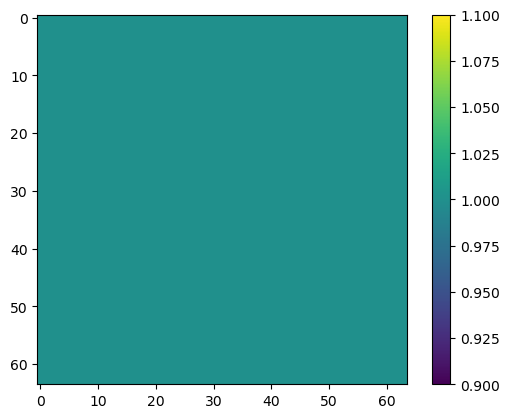

iteration= 9999
pattern shape torch.Size([1, 64])
iteration= 99
Epoch [0/400], Epoch_Loss: 1.0414748191833496
Epoch [10/400], Epoch_Loss: 0.005592880770564079
Epoch [20/400], Epoch_Loss: 0.0030867361929267645
Epoch [30/400], Epoch_Loss: 0.002110968576744199
Epoch [40/400], Epoch_Loss: 0.001587291480973363
Epoch [50/400], Epoch_Loss: 0.0012598378816619515
Epoch [60/400], Epoch_Loss: 0.001035532564856112
Epoch [70/400], Epoch_Loss: 0.0008722548373043537
Epoch [80/400], Epoch_Loss: 0.0007481247303076088
Epoch [90/400], Epoch_Loss: 0.0006506329518742859
Epoch [100/400], Epoch_Loss: 0.0005721013294532895
Epoch [110/400], Epoch_Loss: 0.0005075520602986217
Epoch [120/400], Epoch_Loss: 0.0004536152700893581
Epoch [130/400], Epoch_Loss: 0.00040792557410895824
Epoch [140/400], Epoch_Loss: 0.0003687744901981205
Epoch [150/400], Epoch_Loss: 0.00033489614725112915
Epoch [160/400], Epoch_Loss: 0.0003053321852348745
Epoch [170/400], Epoch_Loss: 0.00027934330864809453
Epoch [180/400], Epoch_Loss: 0.00

KeyboardInterrupt: 

In [19]:
device='cuda'
input_size=stored_data.shape[1]
encoder_dim=32
num_hidden_layers=1
nonlin='tanh'
learn_lr=0.01
learn_iters=200
distance_type='cos'
params={
    'input_size':input_size,
    'encoder_dim':encoder_dim,
    'num_hidden_layers':num_hidden_layers,
    'nonlin':nonlin,
    'learn_lr':learn_lr,
    'learn_iters':learn_iters,
    'device':device,
    'recall_iters':100,
    'data_type':'binary',
    'mid_state':False,
}

torch.manual_seed(1)

#plot settings
plot_weight_flag=True

#memristor variation and stuck at fault
num_simulations=10
num_pattern_list=np.arange(1,40,2)
stuck_at_fault_rate=0.0
mem_var=0.0
mask_0=1-stuck_0
mask_1=1-stuck_1
weight_decay=0.0

mem_stuck_mask=mask_0*mask_1
mem_stuck_mask=torch.from_numpy(mem_stuck_mask).float()
mem_stuck_mask=torch.ones(input_size,input_size)
# mem_stuck_mask=generate_mask(1,49,stuck_at_fault_rate)
plt.imshow(mem_stuck_mask)
plt.colorbar()
plt.show()





Hebb_similarity_list=[]
Storkey_similarity_list=[]
IterativeStorkey_similarity_list=[]
Pinv_similarity_list=[]
HNN_similarity_list=[]
MultiHNN_similarity_list=[]
Oja_similarity_list=[]
Equilibrium_similarity_list=[]

for _ in range(num_simulations):
    for num_pattern in num_pattern_list:
        # 生成随机排列的索引
        random_indices = torch.randperm(stored_data_list.size(0))[:num_pattern]
        # 使用随机索引选择数据
        stored_data = stored_data_list[random_indices]

        # create the network
        hnn=SingleLayerHNN_lambda(input_size=input_size)
        multi_hnn=MultiLayerHNN_beta(input_dim=input_size,encoding_dim=encoder_dim,num_hidden_layers=num_hidden_layers,nolinear=nonlin)


        Hebb = HopfieldNet(num_neurons=input_size)
        Storkey = HopfieldNet(num_neurons=input_size)
        Pinv=HopfieldNet(num_neurons=input_size)
        IterativeStorkey=HopfieldNet(num_neurons=input_size)
        Oja=HopfieldNet(num_neurons=input_size)
        Equilibrium=HopfieldNet(num_neurons=input_size)

        # train the network
        Hebb.learn_patterns(stored_data, rule='Hebb',options={})
        Storkey.learn_patterns(stored_data, rule='Storkey',options={})     
        Pinv.learn_patterns(stored_data, rule='Pinv',options={})
        IterativeStorkey.learn_patterns(stored_data, rule='IterativeStorkey',options={})  
        Oja.learn_patterns(stored_data, rule='Oja',options={})
        Equilibrium.learn_patterns(stored_data, rule='Equilibrium',options={})

        optimizer_hnn = torch.optim.RMSprop(hnn.parameters(), lr=learn_lr,weight_decay=weight_decay)
        optimizer_multi = torch.optim.RMSprop(multi_hnn.parameters(), lr=learn_lr/2,weight_decay=weight_decay)
        multi_hnn_losses=train_multilayer_hnn(multi_hnn, optimizer_multi, stored_data, 2*learn_iters, device)
        hnn.set_mask(mask=mem_stuck_mask)
        hnn_losses=train_multilayer_hnn(hnn, optimizer_hnn, stored_data, learn_iters, device)

        #corrupt the data
        params['recall_iters']=100
        test_data=np.array([get_corrupted_input(d,0.1) for d in stored_data])
        test_data = torch.from_numpy(test_data).float()



        hnn.add_variation(var=mem_var)
        Hebb.add_weight_variation(variation=mem_var)
        Storkey.add_weight_variation(variation=mem_var)
        IterativeStorkey.add_weight_variation(variation=mem_var)
        Pinv.add_weight_variation(variation=mem_var)
        Oja.add_weight_variation(variation=mem_var)
        Equilibrium.add_weight_variation(variation=mem_var)

        Hebb.add_mask(mask=mem_stuck_mask)
        Storkey.add_mask(mask=mem_stuck_mask)
        IterativeStorkey.add_mask(mask=mem_stuck_mask)
        Pinv.add_mask(mask=mem_stuck_mask)
        Oja.add_mask(mask=mem_stuck_mask)
        Equilibrium.add_mask(mask=mem_stuck_mask)


        # recall data
        HNN_recall = singlelayer_recall(hnn, test_data, params)
        MultiHNN_recall=singlelayer_recall(multi_hnn, test_data, params)
        Hebb_recall=Hebb.retrieve_pattern(test_data, sync=True,chnn=False)
        Storkey_recall=Storkey.retrieve_pattern(test_data, sync=True,chnn=False)
        IterativeStorkey_recall=IterativeStorkey.retrieve_pattern(test_data, sync=True,chnn=False)
        Pinv_recall=Pinv.retrieve_pattern(test_data, sync=True,chnn=False)
        Oja_recall=Oja.retrieve_pattern(test_data, sync=True,chnn=False)
        Equilibrium_recall=Equilibrium.retrieve_pattern(test_data, sync=True,chnn=False)

        # calculate similarity
        Hebb_similarity=torch.mean(calculate_sim(stored_data,Hebb_recall,distance_type=distance_type))
        Storkey_similarity=torch.mean(calculate_sim(stored_data,Storkey_recall,distance_type=distance_type))
        IterativeStorkey_similarity=torch.mean(calculate_sim(stored_data,IterativeStorkey_recall,distance_type=distance_type))
        Pinv_similarity=torch.mean(calculate_sim(stored_data,Pinv_recall,distance_type=distance_type))
        HNN_similarity=torch.mean(calculate_sim(stored_data,HNN_recall,distance_type=distance_type))
        MultiHNN_similarity=torch.mean(calculate_sim(stored_data,MultiHNN_recall,distance_type=distance_type))
        Oja_similarity=torch.mean(calculate_sim(stored_data,Oja_recall,distance_type=distance_type))
        Equilibrium_similarity=torch.mean(calculate_sim(stored_data,Equilibrium_recall,distance_type=distance_type))
    

        Hebb_similarity_list.append(to_np(Hebb_similarity))
        Storkey_similarity_list.append(to_np(Storkey_similarity))
        IterativeStorkey_similarity_list.append(to_np(IterativeStorkey_similarity))
        Pinv_similarity_list.append(to_np(Pinv_similarity))
        HNN_similarity_list.append(to_np(HNN_similarity))
        MultiHNN_similarity_list.append(to_np(MultiHNN_similarity))
        Oja_similarity_list.append(to_np(Oja_similarity))
        Equilibrium_similarity_list.append(to_np(Equilibrium_similarity))

input_similarities=torch.mean(calculate_sim(stored_data,test_data,distance_type=distance_type))
Hebb_similarity_list=np.array(Hebb_similarity_list).reshape(num_simulations,-1)
Storkey_similarity_list=np.array(Storkey_similarity_list).reshape(num_simulations,-1)
IterativeStorkey_similarity_list=np.array(IterativeStorkey_similarity_list).reshape(num_simulations,-1)
Pinv_similarity_list=np.array(Pinv_similarity_list).reshape(num_simulations,-1)
HNN_similarity_list=np.array(HNN_similarity_list).reshape(num_simulations,-1)
MultiHNN_similarity_list=np.array(MultiHNN_similarity_list).reshape(num_simulations,-1)
Oja_similarity_list=np.array(Oja_similarity_list).reshape(num_simulations,-1)
Equilibrium_similarity_list=np.array(Equilibrium_similarity_list).reshape(num_simulations,-1)

# np.savez('AssociateMemory.npz',num_pattern_list=num_pattern_list,Hebb_similarity_list=Hebb_similarity_list,Storkey_similarity_list=Storkey_similarity_list,IterativeStorkey_similarity_list=IterativeStorkey_similarity_list,Pinv_similarity_list=Pinv_similarity_list,HNN_similarity_list=HNN_similarity_list,MultiHNN_similarity_list=MultiHNN_similarity_list,Oja_similarity_list=Oja_similarity_list,Equilibrium_similarity_list=Equilibrium_similarity_list,input_similarities=input_similarities)

plt.figure(figsize=(5,4))
plt.errorbar(num_pattern_list,np.mean(Hebb_similarity_list,axis=0),yerr=np.std(Hebb_similarity_list,axis=0),label='Hebb',marker='o')
plt.errorbar(num_pattern_list,np.mean(Storkey_similarity_list,axis=0),yerr=np.std(Storkey_similarity_list,axis=0),label='Storkey',marker='o')
plt.errorbar(num_pattern_list,np.mean(IterativeStorkey_similarity_list,axis=0),yerr=np.std(IterativeStorkey_similarity_list,axis=0),label='IterativeStorkey',marker='o')
plt.errorbar(num_pattern_list,np.mean(Pinv_similarity_list,axis=0),yerr=np.std(Pinv_similarity_list,axis=0),label='Pinv',marker='o')
plt.errorbar(num_pattern_list,np.mean(HNN_similarity_list,axis=0),yerr=np.std(HNN_similarity_list,axis=0),label='GradientHNN',marker='o')
plt.errorbar(num_pattern_list,np.mean(MultiHNN_similarity_list,axis=0),yerr=np.std(MultiHNN_similarity_list,axis=0),label='MultiHNN',marker='o')
plt.errorbar(num_pattern_list,np.mean(Oja_similarity_list,axis=0),yerr=np.std(Oja_similarity_list,axis=0),label='Oja',marker='o')
plt.errorbar(num_pattern_list,np.mean(Equilibrium_similarity_list,axis=0),yerr=np.std(Equilibrium_similarity_list,axis=0),label='Equilibrium',marker='o')
plt.xlabel('Number of Stored Patterns')
plt.ylabel('Similarity')
plt.title('Similarity vs Number of Stored Patterns')
plt.legend()
plt.show()



# plot setting
params['plot_num_per_row'] = 12
params['data_set'] = 'mnist'
params['repeat'] = 10
params['plot_num_per_row'] = 10
params['recall_iters']=100
params['mid_state']=False

plot_memory(stored_data, 1, fig_path, params)
plot_memory_noise(test_data, 1, fig_path, params)

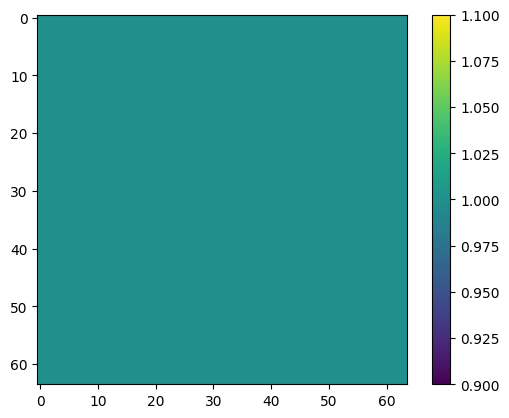

  2%|▎         | 1/40 [00:00<00:31,  1.26it/s]

Epoch [2303/10000], Loss: 9.9891890315007e-09
Epoch [2303/10000], Loss: 9.9891890315007e-09


  5%|▌         | 2/40 [00:01<00:34,  1.11it/s]

Epoch [2681/10000], Loss: 9.97429339122391e-09
Epoch [2681/10000], Loss: 9.97429339122391e-09


  8%|▊         | 3/40 [00:02<00:35,  1.03it/s]

Epoch [2876/10000], Loss: 9.987273230649407e-09
Epoch [2876/10000], Loss: 9.987273230649407e-09


 10%|█         | 4/40 [00:03<00:36,  1.03s/it]

Epoch [3047/10000], Loss: 9.987320304105651e-09
Epoch [3047/10000], Loss: 9.987320304105651e-09


 12%|█▎        | 5/40 [00:05<00:38,  1.11s/it]

Epoch [3210/10000], Loss: 9.99170879367739e-09
Epoch [3210/10000], Loss: 9.99170879367739e-09


 15%|█▌        | 6/40 [00:06<00:40,  1.18s/it]

Epoch [3570/10000], Loss: 9.99271243529165e-09
Epoch [3570/10000], Loss: 9.99271243529165e-09


 18%|█▊        | 7/40 [00:07<00:40,  1.24s/it]

Epoch [3587/10000], Loss: 9.99653604338846e-09
Epoch [3587/10000], Loss: 9.99653604338846e-09


 20%|██        | 8/40 [00:09<00:42,  1.33s/it]

Epoch [4087/10000], Loss: 9.992620064736002e-09
Epoch [4087/10000], Loss: 9.992620064736002e-09


 22%|██▎       | 9/40 [00:10<00:43,  1.41s/it]

Epoch [4148/10000], Loss: 9.99860993999846e-09
Epoch [4148/10000], Loss: 9.99860993999846e-09


 25%|██▌       | 10/40 [00:12<00:44,  1.50s/it]

Epoch [4311/10000], Loss: 9.997959793395239e-09
Epoch [4311/10000], Loss: 9.997959793395239e-09


 28%|██▊       | 11/40 [00:14<00:46,  1.59s/it]

Epoch [4592/10000], Loss: 9.998829320068126e-09
Epoch [4592/10000], Loss: 9.998829320068126e-09


 30%|███       | 12/40 [00:18<01:04,  2.30s/it]

Epoch [9999/10000], Loss: 0.0027173939161002636


 32%|███▎      | 13/40 [00:20<01:00,  2.23s/it]

Epoch [5156/10000], Loss: 9.997000560701963e-09
Epoch [5156/10000], Loss: 9.997000560701963e-09


 35%|███▌      | 14/40 [00:22<00:59,  2.30s/it]

Epoch [6120/10000], Loss: 9.99680072055753e-09
Epoch [6120/10000], Loss: 9.99680072055753e-09


 38%|███▊      | 15/40 [00:25<00:57,  2.28s/it]

Epoch [5718/10000], Loss: 9.998911032482738e-09
Epoch [5718/10000], Loss: 9.998911032482738e-09


 40%|████      | 16/40 [00:27<00:55,  2.31s/it]

Epoch [5919/10000], Loss: 9.998738725869316e-09
Epoch [5919/10000], Loss: 9.998738725869316e-09


 42%|████▎     | 17/40 [00:30<00:54,  2.39s/it]

Epoch [6458/10000], Loss: 9.998765371221907e-09
Epoch [6458/10000], Loss: 9.998765371221907e-09


 45%|████▌     | 18/40 [00:34<01:03,  2.88s/it]

Epoch [9999/10000], Loss: 0.005357148591428995


 48%|████▊     | 19/40 [00:36<01:00,  2.86s/it]

Epoch [7037/10000], Loss: 9.998657901633123e-09
Epoch [7037/10000], Loss: 9.998657901633123e-09


 50%|█████     | 20/40 [00:40<01:04,  3.20s/it]

Epoch [9999/10000], Loss: 0.004807699006050825


 52%|█████▎    | 21/40 [00:44<01:01,  3.22s/it]

Epoch [8002/10000], Loss: 9.999389760650956e-09
Epoch [8002/10000], Loss: 9.999389760650956e-09


 55%|█████▌    | 22/40 [00:48<01:01,  3.41s/it]

Epoch [9999/10000], Loss: 0.0021815309301018715


 57%|█████▊    | 23/40 [00:52<01:00,  3.57s/it]

Epoch [9999/10000], Loss: 0.001388896955177188


 60%|██████    | 24/40 [00:55<00:58,  3.68s/it]

Epoch [9999/10000], Loss: 0.0013297945261001587


 62%|██████▎   | 25/40 [00:59<00:54,  3.63s/it]

Epoch [8929/10000], Loss: 9.999632233359534e-09
Epoch [8929/10000], Loss: 9.999632233359534e-09


 65%|██████▌   | 26/40 [01:03<00:52,  3.72s/it]

Epoch [9999/10000], Loss: 0.0036764799151569605


 68%|██████▊   | 27/40 [01:07<00:49,  3.84s/it]

Epoch [9999/10000], Loss: 0.004716991446912289


 70%|███████   | 28/40 [01:11<00:47,  3.93s/it]

Epoch [9999/10000], Loss: 0.004168474581092596


 72%|███████▎  | 29/40 [01:15<00:43,  3.93s/it]

Epoch [9999/10000], Loss: 0.003289485117420554


 75%|███████▌  | 30/40 [01:19<00:39,  3.91s/it]

Epoch [9999/10000], Loss: 0.004237300716340542


 78%|███████▊  | 31/40 [01:23<00:35,  3.95s/it]

Epoch [9999/10000], Loss: 0.0071721444837749004


 80%|████████  | 32/40 [01:27<00:31,  3.99s/it]

Epoch [9999/10000], Loss: 0.0019841401372104883


 82%|████████▎ | 33/40 [01:31<00:27,  3.99s/it]

Epoch [9999/10000], Loss: 0.0009615535964258015


 85%|████████▌ | 34/40 [01:35<00:23,  3.97s/it]

Epoch [9999/10000], Loss: 0.0055970302782952785


 88%|████████▊ | 35/40 [01:39<00:19,  3.97s/it]

Epoch [9999/10000], Loss: 0.006340600084513426


 90%|█████████ | 36/40 [01:43<00:15,  3.99s/it]

Epoch [9999/10000], Loss: 0.004401426762342453


 92%|█████████▎| 37/40 [01:47<00:11,  4.00s/it]

Epoch [9999/10000], Loss: 0.003996825311332941


 95%|█████████▌| 38/40 [01:51<00:08,  4.01s/it]

Epoch [9999/10000], Loss: 0.005000019446015358


 98%|█████████▊| 39/40 [01:55<00:03,  3.97s/it]

Epoch [9999/10000], Loss: 0.005681836977601051


100%|██████████| 40/40 [01:59<00:00,  3.99s/it]

Epoch [9999/10000], Loss: 0.007120274472981691


100%|██████████| 40/40 [01:59<00:00,  2.99s/it]


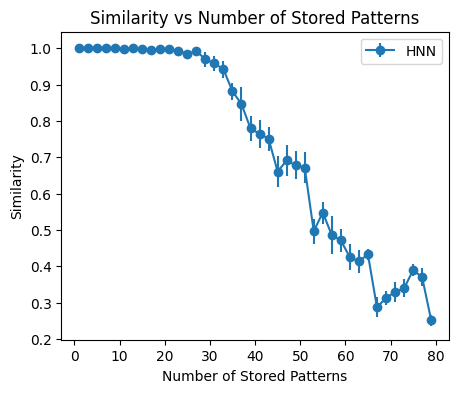

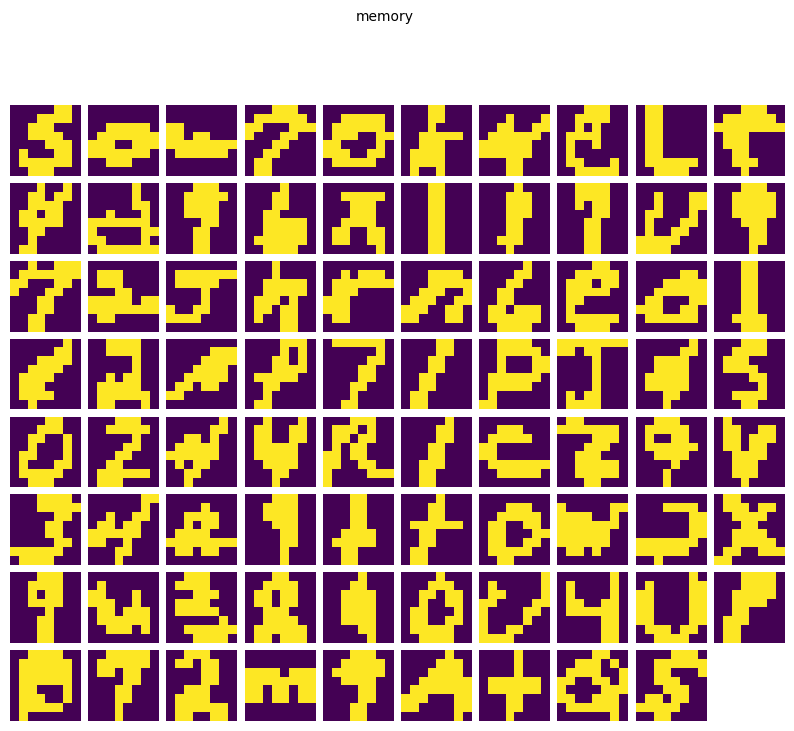

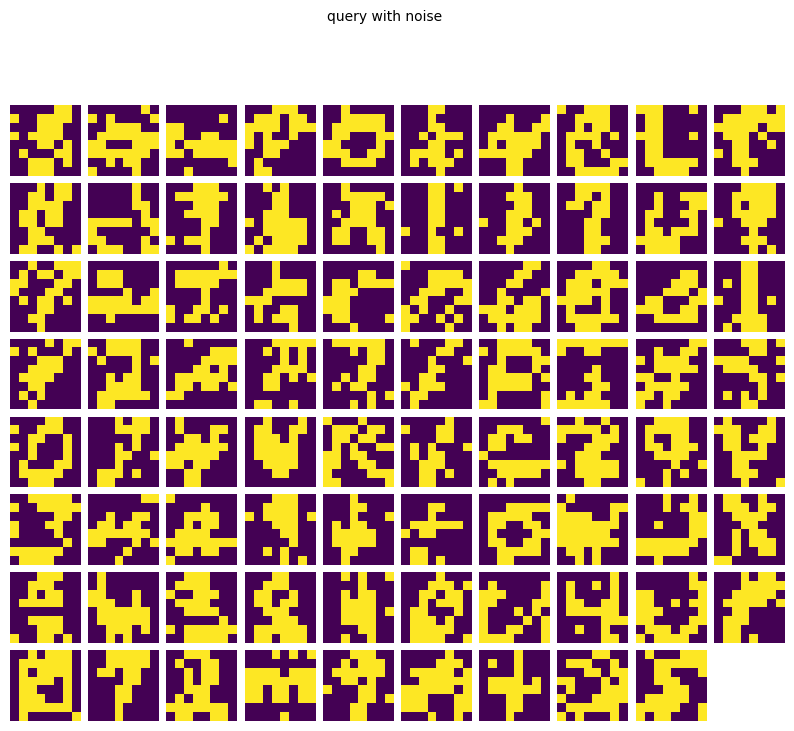

<Figure size 640x480 with 0 Axes>

In [32]:
#calculate the single layer HNN results
from tqdm import tqdm

EMNIST_chose=False

if EMNIST_chose:
    stored_data_list=torch.from_numpy(EMNIST_data_binary).float()
device='cuda'
input_size=stored_data.shape[1]
encoder_dim=24
num_hidden_layers=1
nonlin='tanh'
learn_lr=0.001
learn_iters=10000
distance_type='cos'
params={
    'input_size':input_size,
    'encoder_dim':encoder_dim,
    'num_hidden_layers':num_hidden_layers,
    'nonlin':nonlin,
    'learn_lr':learn_lr,
    'learn_iters':learn_iters,
    'device':device,
    'recall_iters':100,
    'data_type':'binary',
    'mid_state':False,
}


#plot settings
plot_weight_flag=True

#memristor variation and stuck at fault
num_simulations=10
num_pattern_list=np.arange(1,80,2)
stuck_at_fault_rate=0.0
mem_var=0.0
mask_0=1-stuck_0
mask_1=1-stuck_1
weight_decay=0.0

mem_stuck_mask=mask_0*mask_1
mem_stuck_mask=torch.from_numpy(mem_stuck_mask).float()
mem_stuck_mask=torch.ones(input_size,input_size)
# mem_stuck_mask=generate_mask(1,49,stuck_at_fault_rate)
plt.imshow(mem_stuck_mask)
plt.colorbar()
plt.show()

torch.manual_seed(1)
HNN_similarity_list=[]



for num_pattern in tqdm(num_pattern_list):
    # 生成随机排列的索引
    random_indices = torch.randperm(stored_data_list.size(0))[:num_pattern]
    # 使用随机索引选择数据
    stored_data = stored_data_list[random_indices]
    # create the network
    hnn=SingleLayerHNN_lambda(input_size=input_size)
    optimizer_hnn = torch.optim.RMSprop(hnn.parameters(), lr=learn_lr,weight_decay=weight_decay)
    hnn.set_mask(mask=mem_stuck_mask)
    hnn_losses=train_multilayer_batch(hnn, optimizer_hnn, stored_data, learn_iters, device)
    #corrupt the data
    for _ in range(num_simulations):
        params['recall_iters']=100
        test_data=np.array([get_corrupted_input(d,0.1) for d in stored_data])
        test_data = torch.from_numpy(test_data).float()
        # recall data
        HNN_recall=singlelayer_recall(hnn, test_data, params)
        HNN_similarity=torch.mean(calculate_sim(stored_data,HNN_recall,distance_type=distance_type))
        HNN_similarity_list.append(to_np(HNN_similarity))
HNN_similarity_list=np.array(HNN_similarity_list).reshape(-1,num_simulations).T

if EMNIST_chose:
    np.savez(num_path+f'/HNN_Asso_EMNIST.npz',num_pattern_list=num_pattern_list,HNN_similarity_list=HNN_similarity_list)
else:
    np.savez(num_path+f'/HNN_Asso.npz',num_pattern_list=num_pattern_list,HNN_similarity_list=HNN_similarity_list)

plt.figure(figsize=(5,4))
plt.errorbar(num_pattern_list,np.mean(HNN_similarity_list,axis=0),yerr=np.std(HNN_similarity_list,axis=0),label='HNN',marker='o')
plt.xlabel('Number of Stored Patterns')
plt.ylabel('Similarity')
plt.title('Similarity vs Number of Stored Patterns')
plt.legend()
plt.show()



# plot setting
params['plot_num_per_row'] = 12
params['data_set'] = 'mnist'
params['repeat'] = 10
params['plot_num_per_row'] = 10
params['recall_iters']=100
params['mid_state']=False

plot_memory(stored_data, 1, fig_path, params)
plot_memory_noise(test_data, 1, fig_path, params)

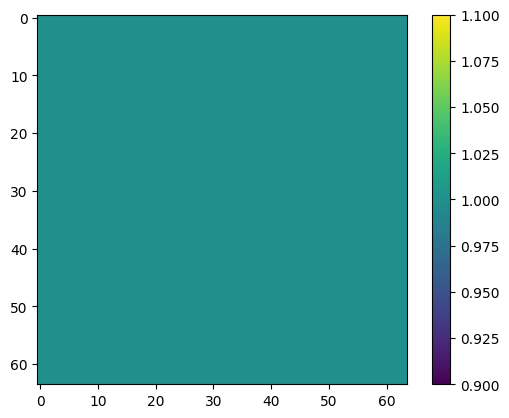

  2%|▎         | 1/40 [00:01<00:47,  1.22s/it]

Epoch [2300/10000], Loss: 9.96653426454941e-09
Epoch [2300/10000], Loss: 9.96653426454941e-09


  5%|▌         | 2/40 [00:02<00:54,  1.44s/it]

Epoch [2600/10000], Loss: 9.99383953370625e-09
Epoch [2600/10000], Loss: 9.99383953370625e-09


  8%|▊         | 3/40 [00:04<01:00,  1.63s/it]

Epoch [2799/10000], Loss: 9.979203241528012e-09
Epoch [2799/10000], Loss: 9.979203241528012e-09


 10%|█         | 4/40 [00:06<01:03,  1.76s/it]

Epoch [2991/10000], Loss: 9.994534977408875e-09
Epoch [2991/10000], Loss: 9.994534977408875e-09


 12%|█▎        | 5/40 [00:08<01:06,  1.89s/it]

Epoch [3097/10000], Loss: 9.990158034156593e-09
Epoch [3097/10000], Loss: 9.990158034156593e-09


 15%|█▌        | 6/40 [00:10<01:07,  1.98s/it]

Epoch [3265/10000], Loss: 9.997380701065595e-09
Epoch [3265/10000], Loss: 9.997380701065595e-09


 18%|█▊        | 7/40 [00:13<01:08,  2.07s/it]

Epoch [3378/10000], Loss: 9.990085203526178e-09
Epoch [3378/10000], Loss: 9.990085203526178e-09


 20%|██        | 8/40 [00:15<01:08,  2.15s/it]

Epoch [3484/10000], Loss: 9.99286076108774e-09
Epoch [3484/10000], Loss: 9.99286076108774e-09


 22%|██▎       | 9/40 [00:17<01:09,  2.24s/it]

Epoch [3572/10000], Loss: 9.99926275113694e-09
Epoch [3572/10000], Loss: 9.99926275113694e-09


 25%|██▌       | 10/40 [00:20<01:09,  2.32s/it]

Epoch [3774/10000], Loss: 9.996679928292451e-09
Epoch [3774/10000], Loss: 9.996679928292451e-09


 28%|██▊       | 11/40 [00:23<01:09,  2.41s/it]

Epoch [3942/10000], Loss: 9.994676197777608e-09
Epoch [3942/10000], Loss: 9.994676197777608e-09


 30%|███       | 12/40 [00:25<01:09,  2.49s/it]

Epoch [3988/10000], Loss: 9.993891936233013e-09
Epoch [3988/10000], Loss: 9.993891936233013e-09


 32%|███▎      | 13/40 [00:28<01:10,  2.61s/it]

Epoch [4218/10000], Loss: 9.999832961682387e-09
Epoch [4218/10000], Loss: 9.999832961682387e-09


 35%|███▌      | 14/40 [00:31<01:10,  2.72s/it]

Epoch [4374/10000], Loss: 9.996345085028224e-09
Epoch [4374/10000], Loss: 9.996345085028224e-09


 38%|███▊      | 15/40 [00:34<01:10,  2.81s/it]

Epoch [4312/10000], Loss: 9.997611627454717e-09
Epoch [4312/10000], Loss: 9.997611627454717e-09


 40%|████      | 16/40 [00:37<01:09,  2.89s/it]

Epoch [4491/10000], Loss: 9.996436567405453e-09
Epoch [4491/10000], Loss: 9.996436567405453e-09


 42%|████▎     | 17/40 [00:40<01:07,  2.95s/it]

Epoch [4624/10000], Loss: 9.997391359206631e-09
Epoch [4624/10000], Loss: 9.997391359206631e-09


 45%|████▌     | 18/40 [00:44<01:07,  3.07s/it]

Epoch [4876/10000], Loss: 9.997294547758884e-09
Epoch [4876/10000], Loss: 9.997294547758884e-09


 48%|████▊     | 19/40 [00:47<01:06,  3.17s/it]

Epoch [4905/10000], Loss: 9.99614968577589e-09
Epoch [4905/10000], Loss: 9.99614968577589e-09


 50%|█████     | 20/40 [00:51<01:05,  3.28s/it]

Epoch [5011/10000], Loss: 9.998925243337453e-09
Epoch [5011/10000], Loss: 9.998925243337453e-09


 52%|█████▎    | 21/40 [00:54<01:04,  3.37s/it]

Epoch [5131/10000], Loss: 9.998354144613586e-09
Epoch [5131/10000], Loss: 9.998354144613586e-09
Epoch [5262/10000], Loss: 9.999150840656057e-09
Epoch [5262/10000], Loss: 9.999150840656057e-09


 55%|█████▌    | 22/40 [00:58<01:01,  3.43s/it]

Epoch [5353/10000], Loss: 9.998117889153946e-09
Epoch [5353/10000], Loss: 9.998117889153946e-09


 57%|█████▊    | 23/40 [01:02<01:00,  3.55s/it]

Epoch [5260/10000], Loss: 9.998789352039239e-09
Epoch [5260/10000], Loss: 9.998789352039239e-09


 60%|██████    | 24/40 [01:05<00:57,  3.62s/it]

Epoch [5583/10000], Loss: 9.99674210078183e-09
Epoch [5583/10000], Loss: 9.99674210078183e-09


 62%|██████▎   | 25/40 [01:09<00:56,  3.75s/it]

Epoch [5727/10000], Loss: 9.997374483816657e-09
Epoch [5727/10000], Loss: 9.997374483816657e-09


 65%|██████▌   | 26/40 [01:13<00:53,  3.83s/it]

Epoch [5865/10000], Loss: 9.9996171343264e-09
Epoch [5865/10000], Loss: 9.9996171343264e-09


 68%|██████▊   | 27/40 [01:18<00:51,  3.93s/it]

Epoch [5632/10000], Loss: 9.99994220762801e-09
Epoch [5632/10000], Loss: 9.99994220762801e-09


 70%|███████   | 28/40 [01:21<00:47,  3.94s/it]

Epoch [5829/10000], Loss: 9.997385141957693e-09
Epoch [5829/10000], Loss: 9.997385141957693e-09


 72%|███████▎  | 29/40 [01:26<00:44,  4.01s/it]

Epoch [5946/10000], Loss: 9.99780880306389e-09
Epoch [5946/10000], Loss: 9.99780880306389e-09


 75%|███████▌  | 30/40 [01:30<00:40,  4.09s/it]

Epoch [6064/10000], Loss: 9.997668470873577e-09
Epoch [6064/10000], Loss: 9.997668470873577e-09


 78%|███████▊  | 31/40 [01:34<00:37,  4.16s/it]

Epoch [6086/10000], Loss: 9.999180150543907e-09
Epoch [6086/10000], Loss: 9.999180150543907e-09


 80%|████████  | 32/40 [01:39<00:33,  4.20s/it]

Epoch [6322/10000], Loss: 9.998444738812395e-09
Epoch [6322/10000], Loss: 9.998444738812395e-09


 82%|████████▎ | 33/40 [01:43<00:30,  4.32s/it]

Epoch [6261/10000], Loss: 9.99896609954476e-09
Epoch [6261/10000], Loss: 9.99896609954476e-09


 85%|████████▌ | 34/40 [01:48<00:26,  4.37s/it]

Epoch [6474/10000], Loss: 9.997637384628888e-09
Epoch [6474/10000], Loss: 9.997637384628888e-09


 88%|████████▊ | 35/40 [01:53<00:22,  4.54s/it]

Epoch [6452/10000], Loss: 9.998021077706198e-09
Epoch [6452/10000], Loss: 9.998021077706198e-09


 90%|█████████ | 36/40 [01:57<00:18,  4.60s/it]

Epoch [6554/10000], Loss: 9.997763505964485e-09
Epoch [6554/10000], Loss: 9.997763505964485e-09


 92%|█████████▎| 37/40 [02:02<00:13,  4.64s/it]

Epoch [6698/10000], Loss: 9.997824790275445e-09
Epoch [6698/10000], Loss: 9.997824790275445e-09


 95%|█████████▌| 38/40 [02:07<00:09,  4.74s/it]

Epoch [6587/10000], Loss: 9.999888916922828e-09
Epoch [6587/10000], Loss: 9.999888916922828e-09


 98%|█████████▊| 39/40 [02:12<00:04,  4.76s/it]

Epoch [6733/10000], Loss: 9.998132100008661e-09
Epoch [6733/10000], Loss: 9.998132100008661e-09


100%|██████████| 40/40 [02:17<00:00,  3.43s/it]


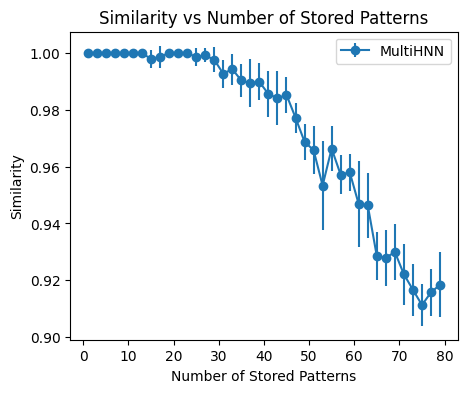

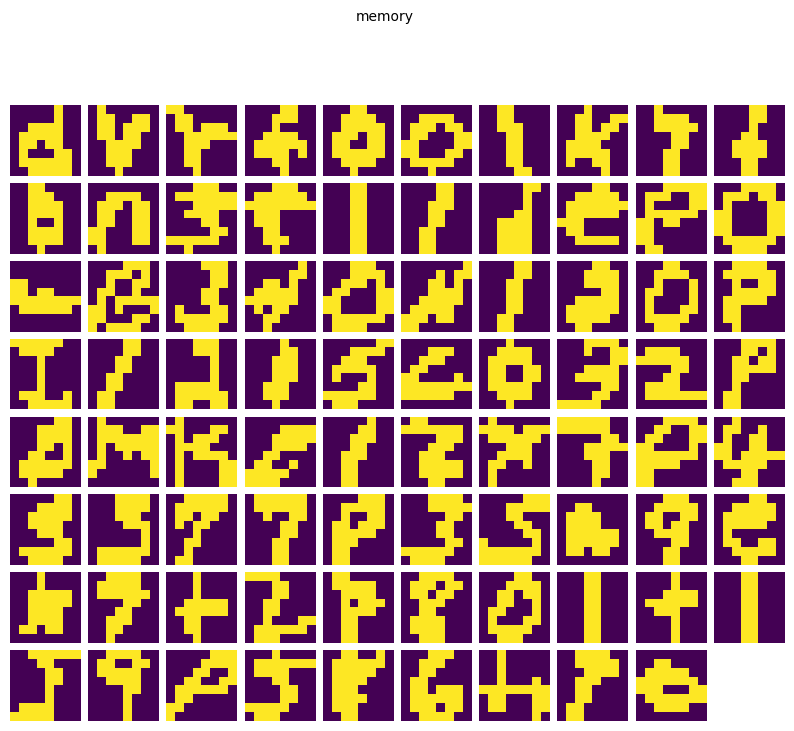

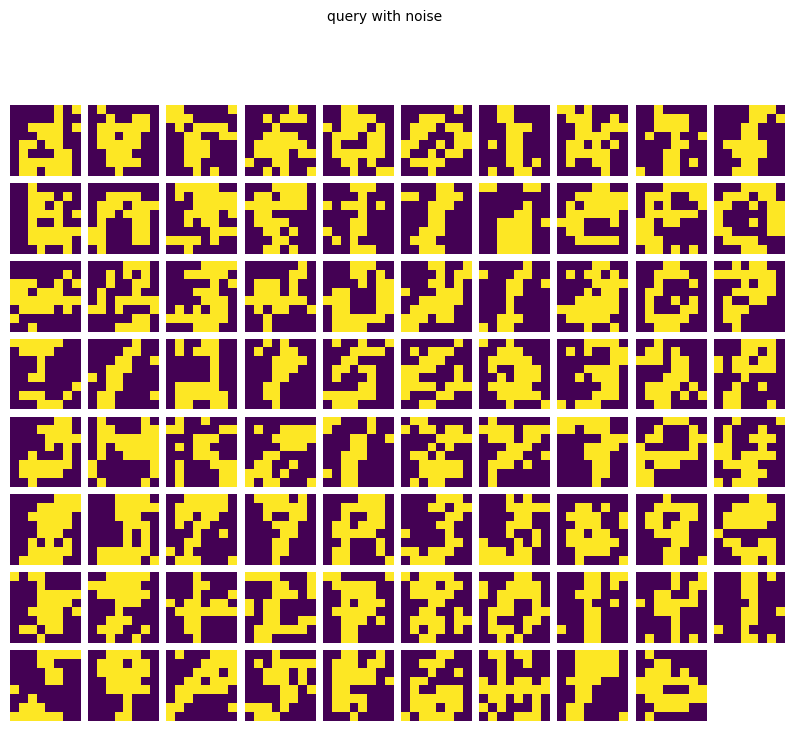

<Figure size 640x480 with 0 Axes>

In [37]:
#calculate the multilayer results
from tqdm import tqdm

device='cuda'
input_size=stored_data.shape[1]
encoder_dim=48
num_hidden_layers=1
nonlin='tanh'
learn_lr=0.001
learn_iters=10000
distance_type='cos'
params={
    'input_size':input_size,
    'encoder_dim':encoder_dim,
    'num_hidden_layers':num_hidden_layers,
    'nonlin':nonlin,
    'learn_lr':learn_lr,
    'learn_iters':learn_iters,
    'device':device,
    'recall_iters':100,
    'data_type':'binary',
    'mid_state':False,
}



#plot settings
plot_weight_flag=True

#memristor variation and stuck at fault
num_simulations=10
num_pattern_list=np.arange(1,80,2)
stuck_at_fault_rate=0.0
mem_var=0.0
mask_0=1-stuck_0
mask_1=1-stuck_1
weight_decay=0.0

mem_stuck_mask=mask_0*mask_1
mem_stuck_mask=torch.from_numpy(mem_stuck_mask).float()
mem_stuck_mask=torch.ones(input_size,input_size)
# mem_stuck_mask=generate_mask(1,49,stuck_at_fault_rate)
plt.imshow(mem_stuck_mask)
plt.colorbar()
plt.show()

torch.manual_seed(1)
MultiHNN_similarity_list=[]



for num_pattern in tqdm(num_pattern_list):
    # 生成随机排列的索引
    random_indices = torch.randperm(stored_data_list.size(0))[:num_pattern]
    # 使用随机索引选择数据
    stored_data = stored_data_list[random_indices]
    # create the network
    multi_hnn=MultiLayerHNN_beta(input_dim=input_size,encoding_dim=encoder_dim,num_hidden_layers=num_hidden_layers,nolinear=nonlin)
    optimizer_multi = torch.optim.RMSprop(multi_hnn.parameters(), lr=learn_lr,weight_decay=weight_decay)
    multi_hnn_losses=train_multilayer_batch(multi_hnn, optimizer_multi, stored_data, learn_iters, device)
    #corrupt the data
    for _ in range(num_simulations):
        params['recall_iters']=100
        test_data=np.array([get_corrupted_input(d,0.1) for d in stored_data])
        test_data = torch.from_numpy(test_data).float()
        # recall data
        MultiHNN_recall=singlelayer_recall(multi_hnn, test_data, params)
        MultiHNN_similarity=torch.mean(calculate_sim(stored_data,MultiHNN_recall,distance_type=distance_type))
        MultiHNN_similarity_list.append(to_np(MultiHNN_similarity))
MultiHNN_similarity_list=np.array(MultiHNN_similarity_list).reshape(-1,num_simulations).T

np.savez(num_path+f'/MultiLyaer_Asso_{num_hidden_layers}_{encoder_dim}.npz',num_pattern_list=num_pattern_list,MultiHNN_similarity_list=MultiHNN_similarity_list)

plt.figure(figsize=(5,4))
plt.errorbar(num_pattern_list,np.mean(MultiHNN_similarity_list,axis=0),yerr=np.std(MultiHNN_similarity_list,axis=0),label='MultiHNN',marker='o')
plt.xlabel('Number of Stored Patterns')
plt.ylabel('Similarity')
plt.title('Similarity vs Number of Stored Patterns')
plt.legend()
plt.show()



# plot setting
params['plot_num_per_row'] = 12
params['data_set'] = 'mnist'
params['repeat'] = 10
params['plot_num_per_row'] = 10
params['recall_iters']=100
params['mid_state']=False

plot_memory(stored_data, 1, fig_path, params)
plot_memory_noise(test_data, 1, fig_path, params)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


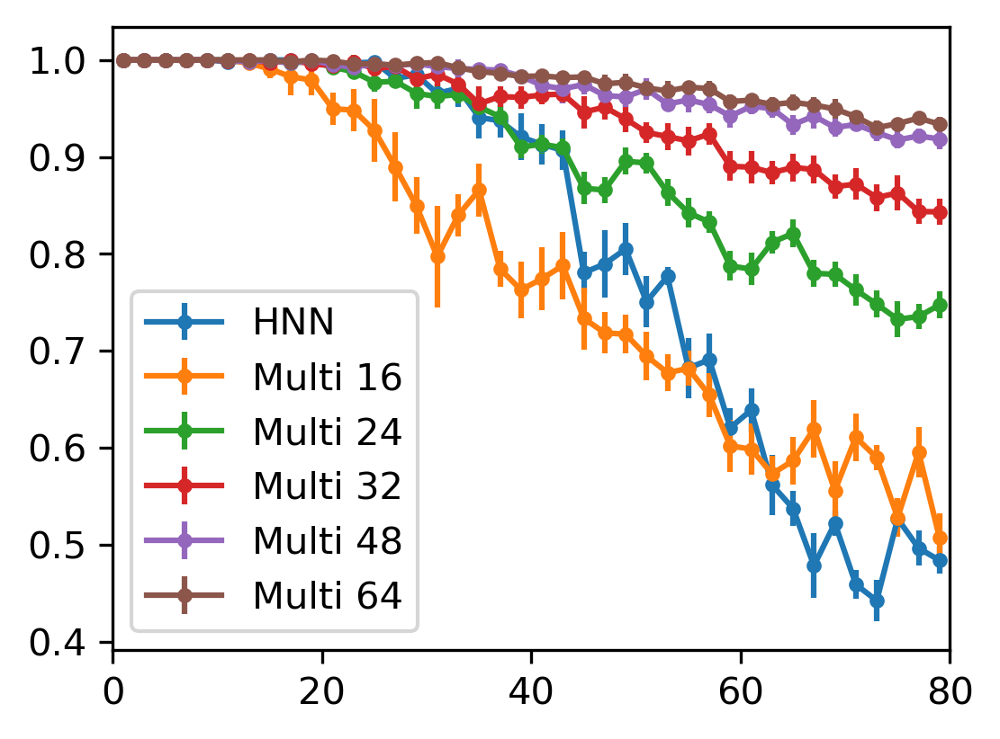

In [58]:
#plot Contrast of different learning rule
result=np.load('HNN_Asso.npz')
num_pattern_list=result['num_pattern_list']
HNN_similarity_list=result['HNN_similarity_list']
result=np.load('MultiLyaer_Asso_1_64.npz')
MultiHNN_similarity_list_64=result['MultiHNN_similarity_list']
result=np.load('MultiLyaer_Asso_1_48.npz')
MultiHNN_similarity_list_48=result['MultiHNN_similarity_list']
result=np.load('MultiLyaer_Asso_1_32.npz')
MultiHNN_similarity_list_32=result['MultiHNN_similarity_list']
result=np.load('MultiLyaer_Asso_1_24.npz')
MultiHNN_similarity_list_24=result['MultiHNN_similarity_list']
result=np.load('MultiLyaer_Asso_1_16.npz')
MultiHNN_similarity_list_16=result['MultiHNN_similarity_list']
result=np.load('MultiLyaer_Asso_1_96.npz')
MultiHNN_similarity_list_96=result['MultiHNN_similarity_list']
result=np.load('MultiLyaer_Asso_1_128.npz')
MultiHNN_similarity_list_128=result['MultiHNN_similarity_list']
result=np.load('MultiLyaer_Asso_2_16.npz')
MultiHNN_similarity_list_16_2=result['MultiHNN_similarity_list']
result=np.load('MultiLyaer_Asso_2_32.npz')
MultiHNN_similarity_list_32_2=result['MultiHNN_similarity_list']
result=np.load('MultiLyaer_Asso_2_64.npz')
MultiHNN_similarity_list_64_2=result['MultiHNN_similarity_list']
result=np.load('MultiLyaer_Asso_2_96.npz')
MultiHNN_similarity_list_96_2=result['MultiHNN_similarity_list']
result=np.load('MultiLyaer_Asso_2_128.npz')
MultiHNN_similarity_list_128_2=result['MultiHNN_similarity_list']
result=np.load('MultiLyaer_Asso_3_16.npz')
MultiHNN_similarity_list_16_3=result['MultiHNN_similarity_list']
result=np.load('MultiLyaer_Asso_3_32.npz')
MultiHNN_similarity_list_32_3=result['MultiHNN_similarity_list']
result=np.load('MultiLyaer_Asso_3_64.npz')
MultiHNN_similarity_list_64_3=result['MultiHNN_similarity_list']
result=np.load('MultiLyaer_Asso_3_96.npz')
MultiHNN_similarity_list_96_3=result['MultiHNN_similarity_list']

plt.figure(figsize=(4,3),dpi=300)
plt.errorbar(num_pattern_list,np.mean(HNN_similarity_list,axis=0),yerr=np.std(HNN_similarity_list,axis=0),label='HNN',marker='.')
plt.errorbar(num_pattern_list,np.mean(MultiHNN_similarity_list_16,axis=0),yerr=np.std(MultiHNN_similarity_list_16,axis=0),label='Multi 16',marker='.')
plt.errorbar(num_pattern_list,np.mean(MultiHNN_similarity_list_24,axis=0),yerr=np.std(MultiHNN_similarity_list_32,axis=0),label='Multi 24',marker='.')
plt.errorbar(num_pattern_list,np.mean(MultiHNN_similarity_list_32,axis=0),yerr=np.std(MultiHNN_similarity_list_32,axis=0),label='Multi 32',marker='.')
plt.errorbar(num_pattern_list,np.mean(MultiHNN_similarity_list_48,axis=0),yerr=np.std(MultiHNN_similarity_list_48,axis=0),label='Multi 48',marker='.')
plt.errorbar(num_pattern_list,np.mean(MultiHNN_similarity_list_64,axis=0),yerr=np.std(MultiHNN_similarity_list_64,axis=0),label='Multi 64',marker='.')
# plt.errorbar(num_pattern_list,np.mean(MultiHNN_similarity_list_96,axis=0),yerr=np.std(MultiHNN_similarity_list_96,axis=0),label='MultiHNN 96',marker='o')
# plt.errorbar(num_pattern_list,np.mean(MultiHNN_similarity_list_128,axis=0),yerr=np.std(MultiHNN_similarity_list_128,axis=0),label='MultiHNN 128',marker='o')
# plt.errorbar(num_pattern_list,np.mean(MultiHNN_similarity_list_16_2,axis=0),yerr=np.std(MultiHNN_similarity_list_16_2,axis=0),label='MultiHNN 16 2',marker='o')
# plt.errorbar(num_pattern_list,np.mean(MultiHNN_similarity_list_32_2,axis=0),yerr=np.std(MultiHNN_similarity_list_32_2,axis=0),label='MultiHNN 32 2',marker='o')
# plt.errorbar(num_pattern_list,np.mean(MultiHNN_similarity_list_64_2,axis=0),yerr=np.std(MultiHNN_similarity_list_64_2,axis=0),label='MultiHNN 64 2',marker='o')
# plt.errorbar(num_pattern_list,np.mean(MultiHNN_similarity_list_96_2,axis=0),yerr=np.std(MultiHNN_similarity_list_96_2,axis=0),label='MultiHNN 96 2',marker='o')
# plt.errorbar(num_pattern_list,np.mean(MultiHNN_similarity_list_128_2,axis=0),yerr=np.std(MultiHNN_similarity_list_128_2,axis=0),label='MultiHNN 128 2',marker='o')
# plt.errorbar(num_pattern_list,np.mean(MultiHNN_similarity_list_16_3,axis=0),yerr=np.std(MultiHNN_similarity_list_16_3,axis=0),label='MultiHNN 16 3',marker='o')
# plt.errorbar(num_pattern_list,np.mean(MultiHNN_similarity_list_32_3,axis=0),yerr=np.std(MultiHNN_similarity_list_32_3,axis=0),label='MultiHNN 32 3',marker='o')
# plt.errorbar(num_pattern_list,np.mean(MultiHNN_similarity_list_64_3,axis=0),yerr=np.std(MultiHNN_similarity_list_64_3,axis=0),label='MultiHNN 64 3',marker='o')
# plt.errorbar(num_pattern_list,np.mean(MultiHNN_similarity_list_96_3,axis=0),yerr=np.std(MultiHNN_similarity_list_96_3,axis=0),label='MultiHNN 96 3',marker='o')
plt.xlim([0,80])
# plt.xlabel('Number of Stored Patterns')
# plt.ylabel('Similarity')
# plt.title('Similarity vs Number of Stored Patterns')
# plt.savefig('HNN_MultiHNN_Contrast.eps',bbox_inches='tight')

plt.legend()
plt.savefig('fig/HNN_MultiHNN_Contrast_high.eps',bbox_inches='tight')
plt.show()


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


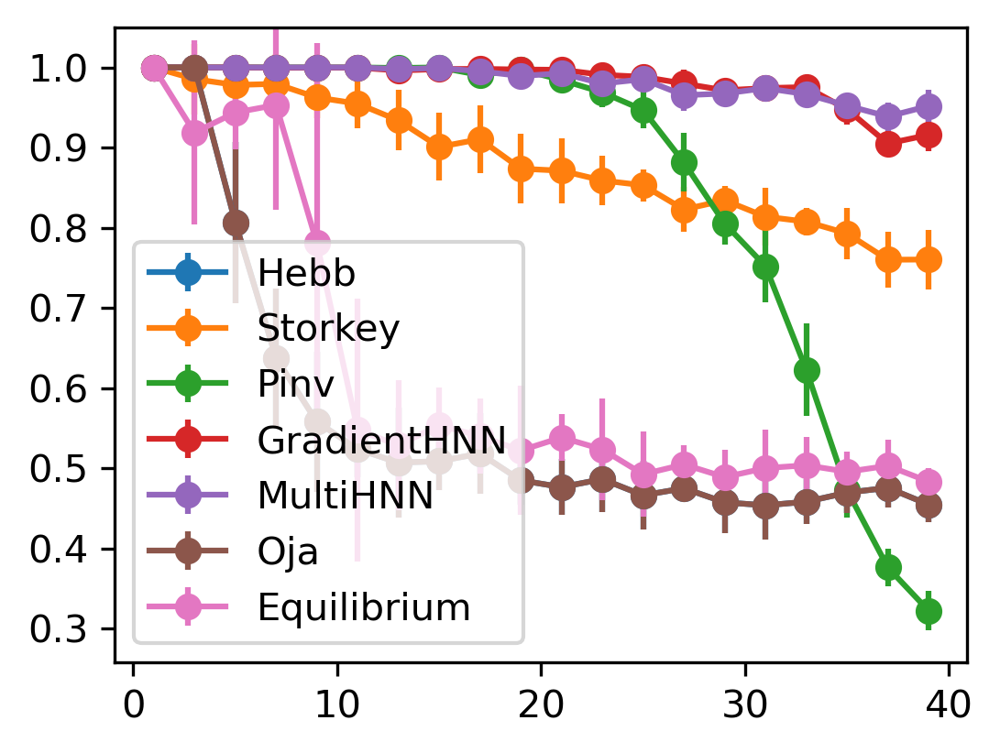

In [24]:
# plot the contrast result
results=np.load('AssociateMemory.npz')
num_pattern_list=results['num_pattern_list']
Hebb_similarity_list=results['Hebb_similarity_list']
Storkey_similarity_list=results['Storkey_similarity_list']
IterativeStorkey_similarity_list=results['IterativeStorkey_similarity_list']
Pinv_similarity_list=results['Pinv_similarity_list']
HNN_similarity_list=results['HNN_similarity_list']
MultiHNN_similarity_list=results['MultiHNN_similarity_list']
Oja_similarity_list=results['Oja_similarity_list']
Equilibrium_similarity_list=results['Equilibrium_similarity_list']
input_similarities=results['input_similarities']



plt.figure(figsize=(4,3),dpi=300)
plt.errorbar(num_pattern_list,np.mean(Hebb_similarity_list,axis=0),yerr=np.std(Hebb_similarity_list,axis=0),label='Hebb',marker='o')
plt.errorbar(num_pattern_list,np.mean(Storkey_similarity_list,axis=0),yerr=np.std(Storkey_similarity_list,axis=0),label='Storkey',marker='o')
# plt.errorbar(num_pattern_list,np.mean(IterativeStorkey_similarity_list,axis=0),yerr=np.std(IterativeStorkey_similarity_list,axis=0),label='IterativeStorkey',marker='o')
plt.errorbar(num_pattern_list,np.mean(Pinv_similarity_list,axis=0),yerr=np.std(Pinv_similarity_list,axis=0),label='Pinv',marker='o')
plt.errorbar(num_pattern_list,np.mean(HNN_similarity_list,axis=0),yerr=np.std(HNN_similarity_list,axis=0),label='GradientHNN',marker='o')
plt.errorbar(num_pattern_list,np.mean(MultiHNN_similarity_list,axis=0),yerr=np.std(MultiHNN_similarity_list,axis=0),label='MultiHNN',marker='o')
plt.errorbar(num_pattern_list,np.mean(Oja_similarity_list,axis=0),yerr=np.std(Oja_similarity_list,axis=0),label='Oja',marker='o')
plt.errorbar(num_pattern_list,np.mean(Equilibrium_similarity_list,axis=0),yerr=np.std(Equilibrium_similarity_list,axis=0),label='Equilibrium',marker='o')
plt.ylim(ymax=1.05)
# plt.xlabel('Number of Stored Patterns')
# plt.ylabel('Similarity')
# plt.title('Similarity vs Number of Stored Patterns')
plt.legend()
plt.savefig('fig/AssociateMemory.eps',format='eps')
plt.show()


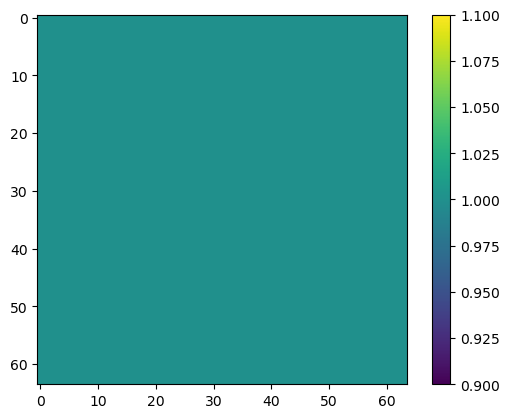

iteration= 9999
pattern shape torch.Size([1, 64])
iteration= 99
Epoch [0/400], Epoch_Loss: 0.9894379377365112
Epoch [10/400], Epoch_Loss: 0.0035655442625284195
Epoch [20/400], Epoch_Loss: 0.0020141981076449156
Epoch [30/400], Epoch_Loss: 0.0014096280792728066
Epoch [40/400], Epoch_Loss: 0.0010790313826873899
Epoch [50/400], Epoch_Loss: 0.0008685562061145902
Epoch [60/400], Epoch_Loss: 0.0007221319829113781
Epoch [70/400], Epoch_Loss: 0.0006141265039332211
Epoch [80/400], Epoch_Loss: 0.0005310730775818229
Epoch [90/400], Epoch_Loss: 0.0004651870985981077
Epoch [100/400], Epoch_Loss: 0.00041164198773913085
Epoch [110/400], Epoch_Loss: 0.00036728018312714994
Epoch [120/400], Epoch_Loss: 0.00032994512002915144
Epoch [130/400], Epoch_Loss: 0.0002981116995215416
Epoch [140/400], Epoch_Loss: 0.0002706699015107006
Epoch [150/400], Epoch_Loss: 0.0002467921585775912
Epoch [160/400], Epoch_Loss: 0.00022584755788557231
Epoch [170/400], Epoch_Loss: 0.00020734689314849675
Epoch [180/400], Epoch_Loss

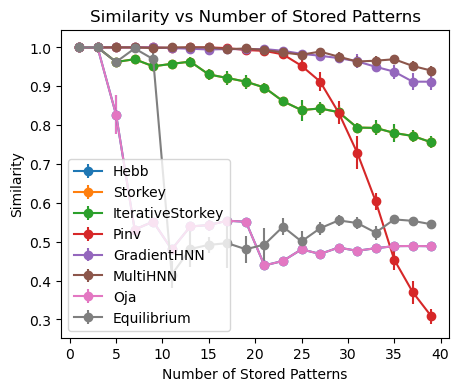

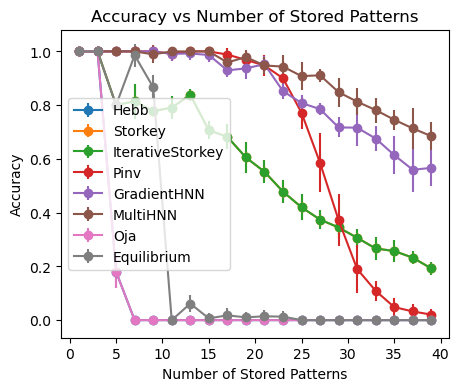

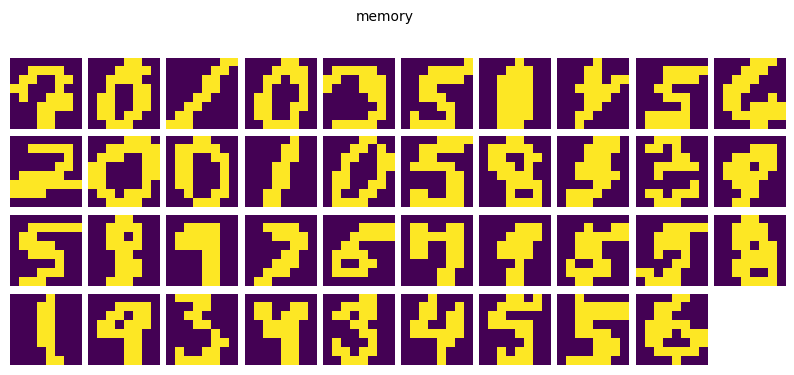

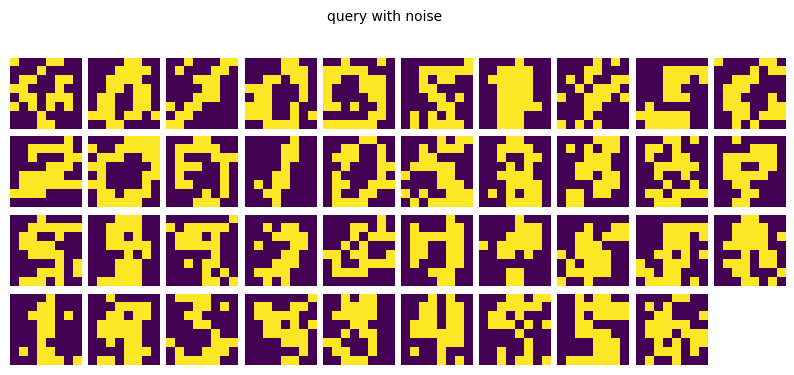

<Figure size 640x480 with 0 Axes>

In [37]:
# calculate accuracy
device='cuda'
input_size=stored_data.shape[1]
encoder_dim=32
num_hidden_layers=1
nonlin='tanh'
learn_lr=0.01
learn_iters=200
distance_type='cos'
params={
    'input_size':input_size,
    'encoder_dim':encoder_dim,
    'num_hidden_layers':num_hidden_layers,
    'nonlin':nonlin,
    'learn_lr':learn_lr,
    'learn_iters':learn_iters,
    'device':device,
    'recall_iters':100,
    'data_type':'binary',
    'mid_state':False,
}



#plot settings
plot_weight_flag=True

#memristor variation and stuck at fault
num_simulations_accuracy=10
num_pattern_list=np.arange(1,40,2)
stuck_at_fault_rate=0.0
mem_var=0.0
mask_0=1-stuck_0
mask_1=1-stuck_1
weight_decay=0.0

mem_stuck_mask=mask_0*mask_1
mem_stuck_mask=torch.from_numpy(mem_stuck_mask).float()
mem_stuck_mask=torch.ones(input_size,input_size)
# mem_stuck_mask=generate_mask(1,49,stuck_at_fault_rate)
plt.imshow(mem_stuck_mask)
plt.colorbar()
plt.show()





Hebb_similarity_list=[]
Storkey_similarity_list=[]
IterativeStorkey_similarity_list=[]
Pinv_similarity_list=[]
HNN_similarity_list=[]
MultiHNN_similarity_list=[]
Oja_similarity_list=[]
Equilibrium_similarity_list=[]

Hebb_accuracy_list=[]
Storkey_accuracy_list=[]
IterativeStorkey_accuracy_list=[]
Pinv_accuracy_list=[]
HNN_accuracy_list=[]
MultiHNN_accuracy_list=[]
Oja_accuracy_list=[]
Equilibrium_accuracy_list=[]

for num_pattern in num_pattern_list:
    seed=1
    torch.manual_seed(seed)
    # 生成随机排列的索引
    random_indices = torch.randperm(stored_data_list.size(0))[:num_pattern]
    # 使用随机索引选择数据
    stored_data = stored_data_list[random_indices]

    # create the network
    hnn=SingleLayerHNN_lambda(input_size=input_size)
    multi_hnn=MultiLayerHNN_beta(input_dim=input_size,encoding_dim=encoder_dim,num_hidden_layers=num_hidden_layers,nolinear=nonlin)


    Hebb = HopfieldNet(num_neurons=input_size)
    Storkey = HopfieldNet(num_neurons=input_size)
    Pinv=HopfieldNet(num_neurons=input_size)
    IterativeStorkey=HopfieldNet(num_neurons=input_size)
    Oja=HopfieldNet(num_neurons=input_size)
    Equilibrium=HopfieldNet(num_neurons=input_size)

    # train the network
    Hebb.learn_patterns(stored_data, rule='Hebb',options={})
    Storkey.learn_patterns(stored_data, rule='Storkey',options={})     
    Pinv.learn_patterns(stored_data, rule='Pinv',options={})
    IterativeStorkey.learn_patterns(stored_data, rule='IterativeStorkey',options={})  
    Oja.learn_patterns(stored_data, rule='Oja',options={})
    Equilibrium.learn_patterns(stored_data, rule='Equilibrium',options={})

    optimizer_hnn = torch.optim.RMSprop(hnn.parameters(), lr=learn_lr,weight_decay=weight_decay)
    optimizer_multi = torch.optim.RMSprop(multi_hnn.parameters(), lr=learn_lr/2,weight_decay=weight_decay)
    multi_hnn_losses=train_multilayer_hnn(multi_hnn, optimizer_multi, stored_data, 2*learn_iters, device)
    hnn.set_mask(mask=mem_stuck_mask)
    hnn_losses=train_multilayer_hnn(hnn, optimizer_hnn, stored_data, learn_iters, device)


    hnn.add_variation(var=mem_var)
    Hebb.add_weight_variation(variation=mem_var)
    Storkey.add_weight_variation(variation=mem_var)
    IterativeStorkey.add_weight_variation(variation=mem_var)
    Pinv.add_weight_variation(variation=mem_var)
    Oja.add_weight_variation(variation=mem_var)
    Equilibrium.add_weight_variation(variation=mem_var)

    Hebb.add_mask(mask=mem_stuck_mask)
    Storkey.add_mask(mask=mem_stuck_mask)
    IterativeStorkey.add_mask(mask=mem_stuck_mask)
    Pinv.add_mask(mask=mem_stuck_mask)
    Oja.add_mask(mask=mem_stuck_mask)
    Equilibrium.add_mask(mask=mem_stuck_mask)

    for _ in range(num_simulations_accuracy):
        #corrupt the data
        params['recall_iters']=100
        test_data=np.array([get_corrupted_input(d,0.1) for d in stored_data])
        test_data = torch.from_numpy(test_data).float()

        # recall data
        HNN_recall = singlelayer_recall(hnn, test_data, params)
        MultiHNN_recall=singlelayer_recall(multi_hnn, test_data, params)
        Hebb_recall=Hebb.retrieve_pattern(test_data, sync=True,chnn=False)
        Storkey_recall=Storkey.retrieve_pattern(test_data, sync=True,chnn=False)
        IterativeStorkey_recall=IterativeStorkey.retrieve_pattern(test_data, sync=True,chnn=False)
        Pinv_recall=Pinv.retrieve_pattern(test_data, sync=True,chnn=False)
        Oja_recall=Oja.retrieve_pattern(test_data, sync=True,chnn=False)
        Equilibrium_recall=Equilibrium.retrieve_pattern(test_data, sync=True,chnn=False)


        # calculate similarity
        Hebb_similarity=torch.mean(calculate_sim(stored_data,Hebb_recall,distance_type=distance_type))
        Storkey_similarity=torch.mean(calculate_sim(stored_data,Storkey_recall,distance_type=distance_type))
        IterativeStorkey_similarity=torch.mean(calculate_sim(stored_data,IterativeStorkey_recall,distance_type=distance_type))
        Pinv_similarity=torch.mean(calculate_sim(stored_data,Pinv_recall,distance_type=distance_type))
        HNN_similarity=torch.mean(calculate_sim(stored_data,HNN_recall,distance_type=distance_type))
        MultiHNN_similarity=torch.mean(calculate_sim(stored_data,MultiHNN_recall,distance_type=distance_type))
        Oja_similarity=torch.mean(calculate_sim(stored_data,Oja_recall,distance_type=distance_type))
        Equilibrium_similarity=torch.mean(calculate_sim(stored_data,Equilibrium_recall,distance_type=distance_type))

        Hebb_accuracy=torch.sum(torch.eq((calculate_sim(stored_data,Hebb_recall,distance_type='hamming')),0)).item()/num_pattern
        Storkey_accuracy=torch.sum(torch.eq((calculate_sim(stored_data,Storkey_recall,distance_type='hamming')),0)).item()/num_pattern
        IterativeStorkey_accuracy=torch.sum(torch.eq((calculate_sim(stored_data,IterativeStorkey_recall,distance_type='hamming')),0)).item()/num_pattern
        Pinv_accuracy=torch.sum(torch.eq((calculate_sim(stored_data,Pinv_recall,distance_type='hamming')),0)).item()/num_pattern
        HNN_accuracy=torch.sum(torch.eq((calculate_sim(stored_data,HNN_recall,distance_type='hamming')),0)).item()/num_pattern
        MultiHNN_accuracy=torch.sum(torch.eq((calculate_sim(stored_data,MultiHNN_recall,distance_type='hamming')),0)).item()/num_pattern
        Oja_accuracy=torch.sum(torch.eq((calculate_sim(stored_data,Oja_recall,distance_type='hamming')),0)).item()/num_pattern
        Equilibrium_accuracy=torch.sum(torch.eq((calculate_sim(stored_data,Equilibrium_recall,distance_type='hamming')),0)).item()/num_pattern

        Hebb_similarity_list.append(to_np(Hebb_similarity))
        Storkey_similarity_list.append(to_np(Storkey_similarity))
        IterativeStorkey_similarity_list.append(to_np(IterativeStorkey_similarity))
        Pinv_similarity_list.append(to_np(Pinv_similarity))
        HNN_similarity_list.append(to_np(HNN_similarity))
        MultiHNN_similarity_list.append(to_np(MultiHNN_similarity))
        Oja_similarity_list.append(to_np(Oja_similarity))
        Equilibrium_similarity_list.append(to_np(Equilibrium_similarity))

        Hebb_accuracy_list.append(Hebb_accuracy)
        Storkey_accuracy_list.append(Storkey_accuracy)
        IterativeStorkey_accuracy_list.append(IterativeStorkey_accuracy)
        Pinv_accuracy_list.append(Pinv_accuracy)
        HNN_accuracy_list.append(HNN_accuracy)
        MultiHNN_accuracy_list.append(MultiHNN_accuracy)
        Oja_accuracy_list.append(Oja_accuracy)
        Equilibrium_accuracy_list.append(Equilibrium_accuracy)
        

input_similarities=torch.mean(calculate_sim(stored_data,test_data,distance_type=distance_type))
Hebb_similarity_list=np.array(Hebb_similarity_list).reshape(-1,num_simulations_accuracy)
Storkey_similarity_list=np.array(Storkey_similarity_list).reshape(-1,num_simulations_accuracy)
IterativeStorkey_similarity_list=np.array(IterativeStorkey_similarity_list).reshape(-1,num_simulations_accuracy)
Pinv_similarity_list=np.array(Pinv_similarity_list).reshape(-1,num_simulations_accuracy)
HNN_similarity_list=np.array(HNN_similarity_list).reshape(-1,num_simulations_accuracy)
MultiHNN_similarity_list=np.array(MultiHNN_similarity_list).reshape(-1,num_simulations_accuracy)
Oja_similarity_list=np.array(Oja_similarity_list).reshape(-1,num_simulations_accuracy)
Equilibrium_similarity_list=np.array(Equilibrium_similarity_list).reshape(-1,num_simulations_accuracy)

Hebb_accuracy_list=np.array(Hebb_accuracy_list).reshape(-1,num_simulations_accuracy)
Storkey_accuracy_list=np.array(Storkey_accuracy_list).reshape(-1,num_simulations_accuracy)
IterativeStorkey_accuracy_list=np.array(IterativeStorkey_accuracy_list).reshape(-1,num_simulations_accuracy)
Pinv_accuracy_list=np.array(Pinv_accuracy_list).reshape(-1,num_simulations_accuracy)
HNN_accuracy_list=np.array(HNN_accuracy_list).reshape(-1,num_simulations_accuracy)
MultiHNN_accuracy_list=np.array(MultiHNN_accuracy_list).reshape(-1,num_simulations_accuracy)
Oja_accuracy_list=np.array(Oja_accuracy_list).reshape(-1,num_simulations_accuracy)
Equilibrium_accuracy_list=np.array(Equilibrium_accuracy_list).reshape(-1,num_simulations_accuracy)



plt.figure(figsize=(5,4))
plt.errorbar(num_pattern_list,np.mean(Hebb_similarity_list,axis=1),yerr=np.std(Hebb_similarity_list,axis=1),label='Hebb',marker='o')
plt.errorbar(num_pattern_list,np.mean(Storkey_similarity_list,axis=1),yerr=np.std(Storkey_similarity_list,axis=1),label='Storkey',marker='o')
plt.errorbar(num_pattern_list,np.mean(IterativeStorkey_similarity_list,axis=1),yerr=np.std(IterativeStorkey_similarity_list,axis=1),label='IterativeStorkey',marker='o')
plt.errorbar(num_pattern_list,np.mean(Pinv_similarity_list,axis=1),yerr=np.std(Pinv_similarity_list,axis=1),label='Pinv',marker='o')
plt.errorbar(num_pattern_list,np.mean(HNN_similarity_list,axis=1),yerr=np.std(HNN_similarity_list,axis=1),label='GradientHNN',marker='o')
plt.errorbar(num_pattern_list,np.mean(MultiHNN_similarity_list,axis=1),yerr=np.std(MultiHNN_similarity_list,axis=1),label='MultiHNN',marker='o')
plt.errorbar(num_pattern_list,np.mean(Oja_similarity_list,axis=1),yerr=np.std(Oja_similarity_list,axis=1),label='Oja',marker='o')
plt.errorbar(num_pattern_list,np.mean(Equilibrium_similarity_list,axis=1),yerr=np.std(Equilibrium_similarity_list,axis=1),label='Equilibrium',marker='o')
plt.xlabel('Number of Stored Patterns')
plt.ylabel('Similarity')
plt.title('Similarity vs Number of Stored Patterns')
plt.legend()
plt.show()


plt.figure(figsize=(5,4))
plt.errorbar(num_pattern_list,np.mean(Hebb_accuracy_list,axis=1),yerr=np.std(Hebb_accuracy_list,axis=1),label='Hebb',marker='o')
plt.errorbar(num_pattern_list,np.mean(Storkey_accuracy_list,axis=1),yerr=np.std(Storkey_accuracy_list,axis=1),label='Storkey',marker='o')
plt.errorbar(num_pattern_list,np.mean(IterativeStorkey_accuracy_list,axis=1),yerr=np.std(IterativeStorkey_accuracy_list,axis=1),label='IterativeStorkey',marker='o')
plt.errorbar(num_pattern_list,np.mean(Pinv_accuracy_list,axis=1),yerr=np.std(Pinv_accuracy_list,axis=1),label='Pinv',marker='o')
plt.errorbar(num_pattern_list,np.mean(HNN_accuracy_list,axis=1),yerr=np.std(HNN_accuracy_list,axis=1),label='GradientHNN',marker='o')
plt.errorbar(num_pattern_list,np.mean(MultiHNN_accuracy_list,axis=1),yerr=np.std(MultiHNN_accuracy_list,axis=1),label='MultiHNN',marker='o')
plt.errorbar(num_pattern_list,np.mean(Oja_accuracy_list,axis=1),yerr=np.std(Oja_accuracy_list,axis=1),label='Oja',marker='o')
plt.errorbar(num_pattern_list,np.mean(Equilibrium_accuracy_list,axis=1),yerr=np.std(Equilibrium_accuracy_list,axis=1),label='Equilibrium',marker='o')
plt.xlabel('Number of Stored Patterns')
plt.ylabel('Accuracy')
plt.title('Accuracy vs Number of Stored Patterns')
plt.legend()
plt.show()



# plot setting
params['plot_num_per_row'] = 12
params['data_set'] = 'mnist'
params['repeat'] = 10
params['plot_num_per_row'] = 10
params['recall_iters']=100
params['mid_state']=False

plot_memory(stored_data, 1, fig_path, params)
plot_memory_noise(test_data, 1, fig_path, params)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


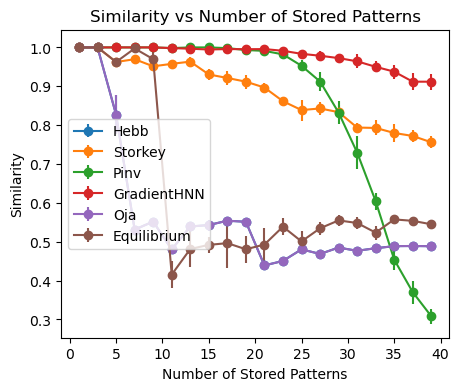

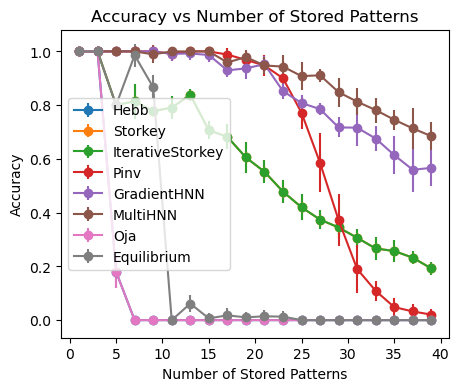

In [40]:
plt.figure(figsize=(5,4))
plt.errorbar(num_pattern_list,np.mean(Hebb_similarity_list,axis=1),yerr=np.std(Hebb_similarity_list,axis=1),label='Hebb',marker='o')
plt.errorbar(num_pattern_list,np.mean(Storkey_similarity_list,axis=1),yerr=np.std(Storkey_similarity_list,axis=1),label='Storkey',marker='o')
# plt.errorbar(num_pattern_list,np.mean(IterativeStorkey_similarity_list,axis=1),yerr=np.std(IterativeStorkey_similarity_list,axis=1),label='IterativeStorkey',marker='o')
plt.errorbar(num_pattern_list,np.mean(Pinv_similarity_list,axis=1),yerr=np.std(Pinv_similarity_list,axis=1),label='Pinv',marker='o')
plt.errorbar(num_pattern_list,np.mean(HNN_similarity_list,axis=1),yerr=np.std(HNN_similarity_list,axis=1),label='GradientHNN',marker='o')
# plt.errorbar(num_pattern_list,np.mean(MultiHNN_similarity_list,axis=1),yerr=np.std(MultiHNN_similarity_list,axis=1),label='MultiHNN',marker='o')
plt.errorbar(num_pattern_list,np.mean(Oja_similarity_list,axis=1),yerr=np.std(Oja_similarity_list,axis=1),label='Oja',marker='o')
plt.errorbar(num_pattern_list,np.mean(Equilibrium_similarity_list,axis=1),yerr=np.std(Equilibrium_similarity_list,axis=1),label='Equilibrium',marker='o')
plt.xlabel('Number of Stored Patterns')
plt.ylabel('Similarity')
plt.title('Similarity vs Number of Stored Patterns')
plt.legend()
plt.savefig('fig/mnist_similarity_associate_memory.eps',format='eps')
plt.savefig('fig/mnist_similarity_associate_memory.pdf',format='pdf')
plt.show()



plt.figure(figsize=(5,4))
plt.errorbar(num_pattern_list,np.mean(Hebb_accuracy_list,axis=1),yerr=np.std(Hebb_accuracy_list,axis=1),label='Hebb',marker='o')
plt.errorbar(num_pattern_list,np.mean(Storkey_accuracy_list,axis=1),yerr=np.std(Storkey_accuracy_list,axis=1),label='Storkey',marker='o')
plt.errorbar(num_pattern_list,np.mean(IterativeStorkey_accuracy_list,axis=1),yerr=np.std(IterativeStorkey_accuracy_list,axis=1),label='IterativeStorkey',marker='o')
plt.errorbar(num_pattern_list,np.mean(Pinv_accuracy_list,axis=1),yerr=np.std(Pinv_accuracy_list,axis=1),label='Pinv',marker='o')
plt.errorbar(num_pattern_list,np.mean(HNN_accuracy_list,axis=1),yerr=np.std(HNN_accuracy_list,axis=1),label='GradientHNN',marker='o')
plt.errorbar(num_pattern_list,np.mean(MultiHNN_accuracy_list,axis=1),yerr=np.std(MultiHNN_accuracy_list,axis=1),label='MultiHNN',marker='o')
plt.errorbar(num_pattern_list,np.mean(Oja_accuracy_list,axis=1),yerr=np.std(Oja_accuracy_list,axis=1),label='Oja',marker='o')
plt.errorbar(num_pattern_list,np.mean(Equilibrium_accuracy_list,axis=1),yerr=np.std(Equilibrium_accuracy_list,axis=1),label='Equilibrium',marker='o')
plt.xlabel('Number of Stored Patterns')
plt.ylabel('Accuracy')
plt.title('Accuracy vs Number of Stored Patterns')
plt.legend()
plt.show()

### binary pattern (variation)

In [54]:
# load the stored patterns
num_pattern=20
stored_data=torch.from_numpy(new_mnist_data_binary[0:num_pattern]).float()

In [48]:
# load the order of the stored patterns
n=405
num_samples = 10
stored_data_list=torch.from_numpy(new_mnist_data_binary_order).float()
stored_data = stored_data_list[n::1000]
stored_data=stored_data[0:num_samples]

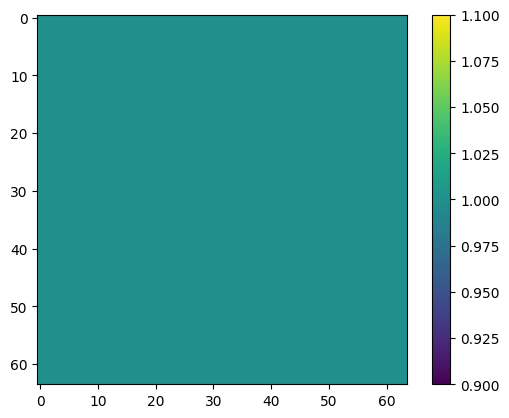

iteration= 99
pattern shape torch.Size([10, 64])
iteration= 99


KeyboardInterrupt: 

In [44]:
device='cuda'
input_size=stored_data.shape[1]
encoder_dim=16
num_hidden_layers=1
nonlin='tanh'
learn_lr=1e-3
learn_iters=20000
distance_type='cos'
params={
    'input_size':input_size,
    'encoder_dim':encoder_dim,
    'num_hidden_layers':num_hidden_layers,
    'nonlin':nonlin,
    'learn_lr':learn_lr,
    'learn_iters':learn_iters,
    'device':device,
    'recall_iters':100,
    'data_type':'binary',
    'mid_state':False,
}

#plot settings
plot_weight_flag=True

#memristor variation and stuck at fault
num_simulations=20
mem_var_list=np.arange(0,0.40,0.02)
stuck_at_fault_rate=0.0
mask_0=1-stuck_0
mask_1=1-stuck_1

mem_stuck_mask=mask_0*mask_1
mem_stuck_mask=torch.from_numpy(mem_stuck_mask).float()
mem_stuck_mask=torch.ones(input_size,input_size)
# mem_stuck_mask=generate_mask(1,49,stuck_at_fault_rate)
plt.imshow(mem_stuck_mask)
plt.colorbar()
plt.show()


Hebb = HopfieldNet(num_neurons=input_size)
Storkey = HopfieldNet(num_neurons=input_size)
Pinv=HopfieldNet(num_neurons=input_size)
IterativeStorkey=HopfieldNet(num_neurons=input_size)
Oja=HopfieldNet(num_neurons=input_size)
Equilibrium=HopfieldNet(num_neurons=input_size)



# train the network
Hebb.learn_patterns(stored_data, rule='Hebb',options={})
Storkey.learn_patterns(stored_data, rule='Storkey',options={})     
Pinv.learn_patterns(stored_data, rule='Pinv',options={})
IterativeStorkey.learn_patterns(stored_data, rule='IterativeStorkey',options={})  
Oja.learn_patterns(stored_data, rule='Oja',options={})
Equilibrium.learn_patterns(stored_data, rule='Equilibrium',options={})


#corrupt the data
params['recall_iters']=100
test_data=np.array([get_corrupted_input(d,0.1) for d in stored_data])
test_data=test_data.reshape(-1,input_size)
test_data = torch.from_numpy(test_data).float()


Hebb_similarity_list=[]
Storkey_similarity_list=[]
IterativeStorkey_similarity_list=[]
Pinv_similarity_list=[]
HNN_similarity_list=[]
MultiHNN_similarity_list=[]
Oja_similarity_list=[]
Equilibrium_similarity_list=[]




for _ in range(num_simulations):
    for mem_var in mem_var_list:


        # learn_iters+=20
        # create the network
        hnn=SingleLayerHNN_lambda(input_size=input_size)
        multi_hnn=MultiLayerHNN_beta(input_dim=input_size,encoding_dim=encoder_dim,num_hidden_layers=num_hidden_layers,nolinear=nonlin)

        optimizer_hnn = torch.optim.RMSprop(hnn.parameters(), lr=learn_lr)
        optimizer_multi = torch.optim.RMSprop(multi_hnn.parameters(), lr=learn_lr/2)

        # multi_hnn.noise_level=mem_var*0.5
        multi_hnn_losses=train_multilayer_batch(multi_hnn, optimizer_multi, stored_data, 2*learn_iters, device)

        hnn.set_mask(mask=mem_stuck_mask)
        hnn.noise_level=mem_var*0
        hnn_losses=train_multilayer_batch(hnn, optimizer_hnn, stored_data, learn_iters, device)

        hnn.add_variation(var=mem_var)
        multi_hnn.add_variation(var=mem_var)
        Hebb.add_weight_variation(variation=mem_var)
        Storkey.add_weight_variation(variation=mem_var)
        IterativeStorkey.add_weight_variation(variation=mem_var)
        Pinv.add_weight_variation(variation=mem_var)
        Oja.add_weight_variation(variation=mem_var)
        Equilibrium.add_weight_variation(variation=mem_var)

        Hebb.add_mask(mask=mem_stuck_mask)
        Storkey.add_mask(mask=mem_stuck_mask)
        IterativeStorkey.add_mask(mask=mem_stuck_mask)
        Pinv.add_mask(mask=mem_stuck_mask)
        Oja.add_mask(mask=mem_stuck_mask)
        Equilibrium.add_mask(mask=mem_stuck_mask)

        # recall data
        HNN_recall = singlelayer_recall(hnn, test_data, params)
        MultiHNN_recall=singlelayer_recall(multi_hnn, test_data, params)
        Hebb_recall=Hebb.retrieve_pattern(test_data, sync=True,chnn=False)
        Storkey_recall=Storkey.retrieve_pattern(test_data, sync=True,chnn=False)
        IterativeStorkey_recall=IterativeStorkey.retrieve_pattern(test_data, sync=True,chnn=False)
        Pinv_recall=Pinv.retrieve_pattern(test_data, sync=True,chnn=False)
        Oja_recall=Oja.retrieve_pattern(test_data, sync=True,chnn=False)
        Equilibrium_recall=Equilibrium.retrieve_pattern(test_data, sync=True,chnn=False)

        # calculate similarity
        Hebb_similarity=torch.mean(calculate_sim(stored_data,Hebb_recall,distance_type=distance_type))
        Storkey_similarity=torch.mean(calculate_sim(stored_data,Storkey_recall,distance_type=distance_type))
        IterativeStorkey_similarity=torch.mean(calculate_sim(stored_data,IterativeStorkey_recall,distance_type=distance_type))
        Pinv_similarity=torch.mean(calculate_sim(stored_data,Pinv_recall,distance_type=distance_type))
        HNN_similarity=torch.mean(calculate_sim(stored_data,HNN_recall,distance_type=distance_type))
        MultiHNN_similarity=torch.mean(calculate_sim(stored_data,MultiHNN_recall,distance_type=distance_type))
        Oja_similarity=torch.mean(calculate_sim(stored_data,Oja_recall,distance_type=distance_type))
        Equilibrium_similarity=torch.mean(calculate_sim(stored_data,Equilibrium_recall,distance_type=distance_type))


        Hebb_similarity_list.append(to_np(Hebb_similarity))
        Storkey_similarity_list.append(to_np(Storkey_similarity))
        IterativeStorkey_similarity_list.append(to_np(IterativeStorkey_similarity))
        Pinv_similarity_list.append(to_np(Pinv_similarity))
        HNN_similarity_list.append(to_np(HNN_similarity))
        MultiHNN_similarity_list.append(to_np(MultiHNN_similarity))
        Oja_similarity_list.append(to_np(Oja_similarity))
        Equilibrium_similarity_list.append(to_np(Equilibrium_similarity))


input_similarities=torch.mean(calculate_sim(stored_data,test_data,distance_type=distance_type))
Hebb_similarity_list=np.array(Hebb_similarity_list).reshape(num_simulations,-1)
Storkey_similarity_list=np.array(Storkey_similarity_list).reshape(num_simulations,-1)
IterativeStorkey_similarity_list=np.array(IterativeStorkey_similarity_list).reshape(num_simulations,-1)
Pinv_similarity_list=np.array(Pinv_similarity_list).reshape(num_simulations,-1)
HNN_similarity_list=np.array(HNN_similarity_list).reshape(num_simulations,-1)
MultiHNN_similarity_list=np.array(MultiHNN_similarity_list).reshape(num_simulations,-1)
Oja_similarity_list=np.array(Oja_similarity_list).reshape(num_simulations,-1)
Equilibrium_similarity_list=np.array(Equilibrium_similarity_list).reshape(num_simulations,-1)

np.savez('AssociateMemory_variation.npz',mem_var_list=mem_var_list,Hebb_similarity_list=Hebb_similarity_list,Storkey_similarity_list=Storkey_similarity_list,IterativeStorkey_similarity_list=IterativeStorkey_similarity_list,Pinv_similarity_list=Pinv_similarity_list,HNN_similarity_list=HNN_similarity_list,MultiHNN_similarity_list=MultiHNN_similarity_list,Oja_similarity_list=Oja_similarity_list,Equilibrium_similarity_list=Equilibrium_similarity_list,input_similarities=input_similarities)

plt.figure(figsize=(5,4))
plt.errorbar(mem_var_list,np.mean(Hebb_similarity_list,axis=0),yerr=np.std(Hebb_similarity_list,axis=0),label='Hebb',marker='o')
plt.errorbar(mem_var_list,np.mean(Storkey_similarity_list,axis=0),yerr=np.std(Storkey_similarity_list,axis=0),label='Storkey',marker='o')
plt.errorbar(mem_var_list,np.mean(IterativeStorkey_similarity_list,axis=0),yerr=np.std(IterativeStorkey_similarity_list,axis=0),label='IterativeStorkey',marker='o')
plt.errorbar(mem_var_list,np.mean(Pinv_similarity_list,axis=0),yerr=np.std(Pinv_similarity_list,axis=0),label='Pinv',marker='o')
plt.errorbar(mem_var_list,np.mean(HNN_similarity_list,axis=0),yerr=np.std(HNN_similarity_list,axis=0),label='GradientHNN',marker='o')
plt.errorbar(mem_var_list,np.mean(MultiHNN_similarity_list,axis=0),yerr=np.std(MultiHNN_similarity_list,axis=0),label='MultiHNN',marker='o')
plt.errorbar(mem_var_list,np.mean(Oja_similarity_list,axis=0),yerr=np.std(Oja_similarity_list,axis=0),label='Oja',marker='o')
plt.errorbar(mem_var_list,np.mean(Equilibrium_similarity_list,axis=0),yerr=np.std(Equilibrium_similarity_list,axis=0),label='Equilibrium',marker='o')
plt.axhline(y=input_similarities,ls=":",c="gray")
plt.title('Cosine Similarity Vs Memristor Variation')
plt.xlabel('Memristor Variation')
plt.ylabel('Cosine Similarity')
plt.legend()
plt.show()


# plot setting
params['plot_num_per_row'] = 12
params['data_set'] = 'mnist'
params['repeat'] = 10
params['plot_num_per_row'] = 10
params['recall_iters']=100
params['mid_state']=False

plot_memory(stored_data, 1, fig_path, params)
plot_memory_noise(test_data, 1, fig_path, params)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


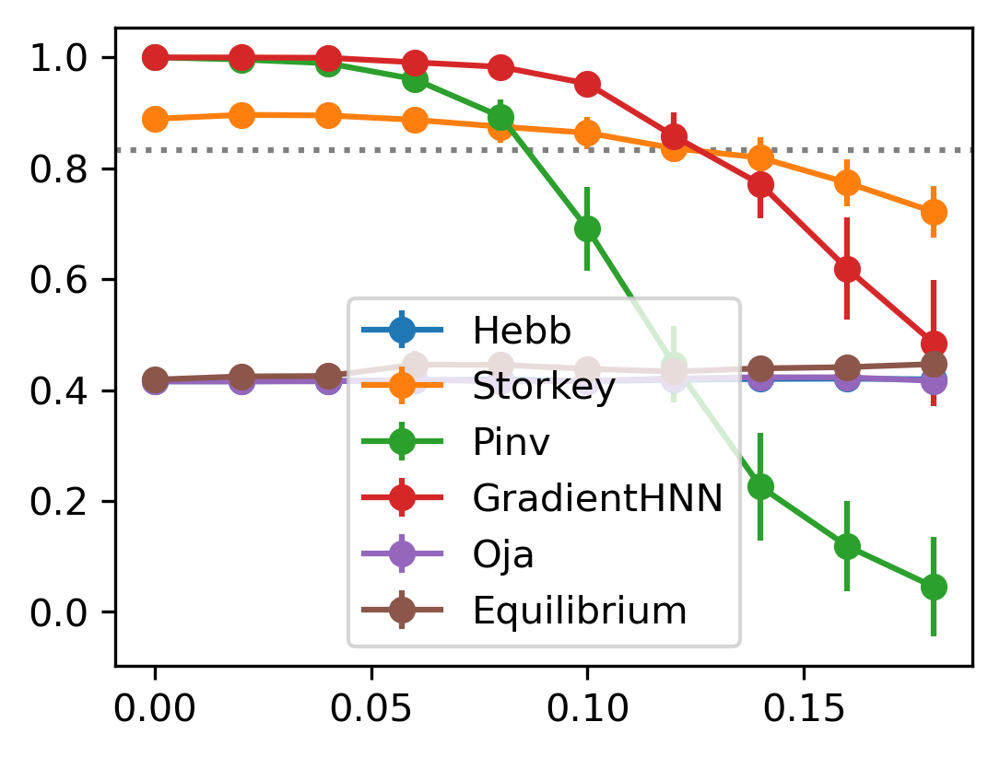

In [33]:
results=np.load('AssociateMemory_variation.npz')
mem_var_list=results['mem_var_list']
Hebb_similarity_list=results['Hebb_similarity_list']
Storkey_similarity_list=results['Storkey_similarity_list']
IterativeStorkey_similarity_list=results['IterativeStorkey_similarity_list']
Pinv_similarity_list=results['Pinv_similarity_list']
HNN_similarity_list=results['HNN_similarity_list']
MultiHNN_similarity_list=results['MultiHNN_similarity_list']
Oja_similarity_list=results['Oja_similarity_list']
Equilibrium_similarity_list=results['Equilibrium_similarity_list']
input_similarities=results['input_similarities']

plt.figure(figsize=(4,3),dpi=300)
plt.errorbar(mem_var_list,np.mean(Hebb_similarity_list,axis=0),yerr=np.std(Hebb_similarity_list,axis=0),label='Hebb',marker='o')
plt.errorbar(mem_var_list,np.mean(Storkey_similarity_list,axis=0),yerr=np.std(Storkey_similarity_list,axis=0),label='Storkey',marker='o')
# plt.errorbar(mem_var_list,np.mean(IterativeStorkey_similarity_list,axis=0),yerr=np.std(IterativeStorkey_similarity_list,axis=0),label='IterativeStorkey',marker='o')
plt.errorbar(mem_var_list,np.mean(Pinv_similarity_list,axis=0),yerr=np.std(Pinv_similarity_list,axis=0),label='Pinv',marker='o')
plt.errorbar(mem_var_list,np.mean(HNN_similarity_list,axis=0),yerr=np.std(HNN_similarity_list,axis=0),label='GradientHNN',marker='o')
# plt.errorbar(mem_var_list,np.mean(MultiHNN_similarity_list,axis=0),yerr=np.std(MultiHNN_similarity_list,axis=0),label='MultiHNN',marker='o')
plt.errorbar(mem_var_list,np.mean(Oja_similarity_list,axis=0),yerr=np.std(Oja_similarity_list,axis=0),label='Oja',marker='o')
plt.errorbar(mem_var_list,np.mean(Equilibrium_similarity_list,axis=0),yerr=np.std(Equilibrium_similarity_list,axis=0),label='Equilibrium',marker='o')
plt.axhline(y=input_similarities,ls=":",c="gray")
# plt.title('Cosine Similarity Vs Memristor Variation')
# plt.xlabel('Memristor Variation')
# plt.ylabel('Cosine Similarity')
plt.legend()
plt.savefig('fig/AssociateMemory_Variation.eps',format='eps')
plt.show()


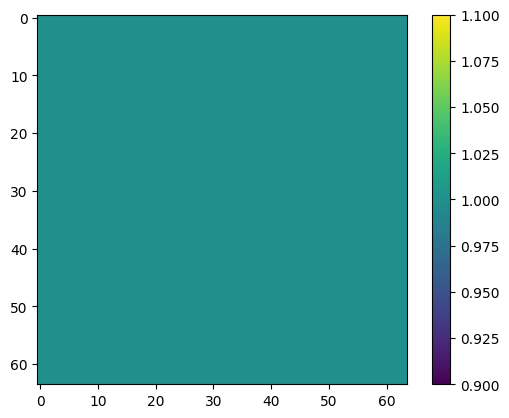

Epoch [3321/10000], Loss: 9.993324390222824e-09
Epoch [3321/10000], Loss: 9.993324390222824e-09


/tmp/ipykernel_544907/20410515.py:57: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  hnn.load_state_dict(torch.load('hnn_weights.pth'))


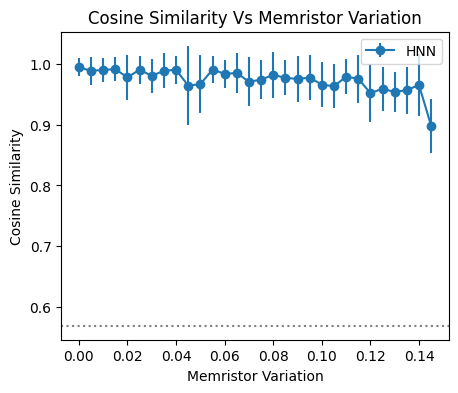

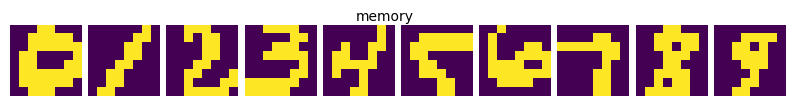

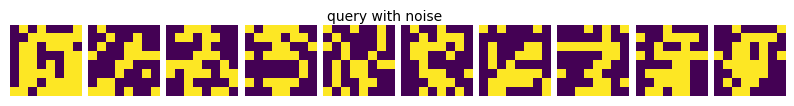

<Figure size 640x480 with 0 Axes>

In [54]:
#calculate the accuracy versus the memristor variation  in single HNN
device='cuda'
input_size=stored_data.shape[1]
encoder_dim=16
num_hidden_layers=1
nonlin='tanh'
learn_lr=1e-3
learn_iters=10000
distance_type='cos'
params={
    'input_size':input_size,
    'encoder_dim':encoder_dim,
    'num_hidden_layers':num_hidden_layers,
    'nonlin':nonlin,
    'learn_lr':learn_lr,
    'learn_iters':learn_iters,
    'device':device,
    'recall_iters':100,
    'data_type':'binary',
    'mid_state':False,
}

#plot settings
plot_weight_flag=True

#memristor variation and stuck at fault
num_simulations=20
# mem_var_list=np.arange(0,0.50,0.02)
mem_var_list=np.arange(0,0.15,0.005)
stuck_at_fault_rate=0.0
mask_0=1-stuck_0
mask_1=1-stuck_1

mem_stuck_mask=mask_0*mask_1
mem_stuck_mask=torch.from_numpy(mem_stuck_mask).float()
mem_stuck_mask=torch.ones(input_size,input_size)
# mem_stuck_mask=generate_mask(1,49,stuck_at_fault_rate)
plt.imshow(mem_stuck_mask)
plt.colorbar()
plt.show()


HNN_similarity_list=[]


# create the network
hnn=SingleLayerHNN_lambda(input_size=input_size)
optimizer_hnn = torch.optim.RMSprop(hnn.parameters(), lr=learn_lr)
# multi_hnn.noise_level=mem_var*0.5
hnn.set_mask(mask=mem_stuck_mask)
hnn.noise_level=0
hnn_losses=train_multilayer_batch(hnn, optimizer_hnn, stored_data, learn_iters, device)

torch.save(hnn.state_dict(), 'hnn_weights.pth')

for mem_var in mem_var_list:
    hnn.load_state_dict(torch.load('hnn_weights.pth'))
    hnn.add_variation(var=mem_var)
    for _ in range(num_simulations):
        #corrupt the data
        params['recall_iters']=100
        test_data=np.array([get_corrupted_input(d,0.2) for d in stored_data])
        test_data=test_data.reshape(-1,input_size)
        test_data = torch.from_numpy(test_data).float()
        # recall data
        HNN_recall=singlelayer_recall(hnn, test_data, params)
        # calculate similarity
        HNN_similarity=torch.mean(calculate_sim(stored_data,HNN_recall,distance_type=distance_type))
        HNN_similarity_list.append(to_np(HNN_similarity))

HNN_similarity_list=np.array(HNN_similarity_list).reshape(-1,num_simulations).T
input_similarities=torch.mean(calculate_sim(stored_data,test_data,distance_type=distance_type))

np.savez(num_path+f'/HNN_Asso_var.npz',mem_var_list=mem_var_list,HNN_similarity_list=HNN_similarity_list,input_similarities=input_similarities)

plt.figure(figsize=(5,4))
plt.errorbar(mem_var_list,np.mean(HNN_similarity_list,axis=0),yerr=np.std(HNN_similarity_list,axis=0),label='HNN',marker='o')
plt.axhline(y=input_similarities,ls=":",c="gray")
plt.title('Cosine Similarity Vs Memristor Variation')
plt.xlabel('Memristor Variation')
plt.ylabel('Cosine Similarity')
plt.legend()
plt.show()


# plot setting
params['plot_num_per_row'] = 12
params['data_set'] = 'mnist'
params['repeat'] = 10
params['plot_num_per_row'] = 10
params['recall_iters']=100
params['mid_state']=False

plot_memory(stored_data, 1, fig_path, params)
plot_memory_noise(test_data, 1, fig_path, params)

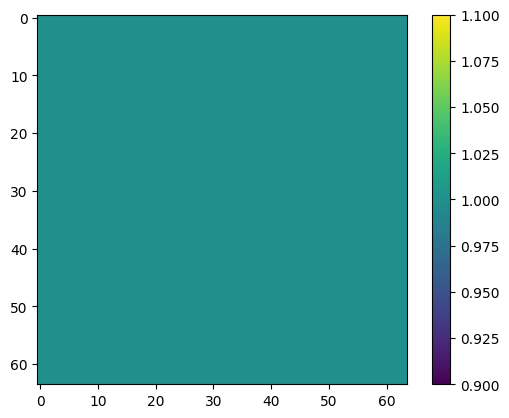

Epoch [8699/20000], Loss: 9.999100214486134e-09
Epoch [8699/20000], Loss: 9.999100214486134e-09


/tmp/ipykernel_544907/3375702606.py:56: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  multi_hnn.load_state_dict(torch.load('multi_hnn_weights.pth'))


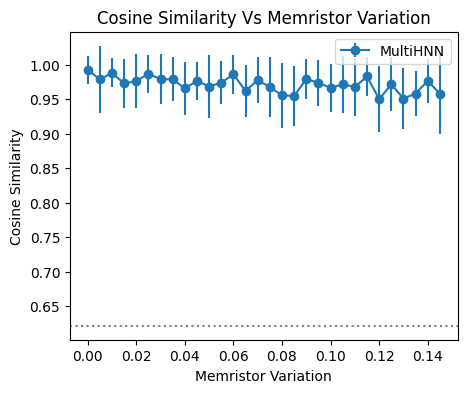

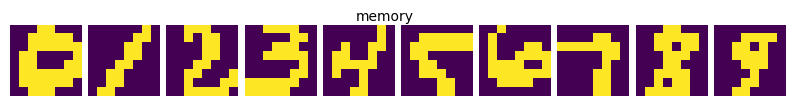

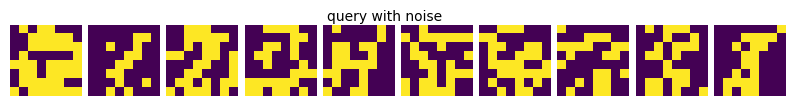

<Figure size 640x480 with 0 Axes>

In [53]:
#calculate the accuracy versus the memristor variation
device='cuda'
input_size=stored_data.shape[1]
encoder_dim=16
num_hidden_layers=1
nonlin='tanh'
learn_lr=1e-3
learn_iters=10000
distance_type='cos'
params={
    'input_size':input_size,
    'encoder_dim':encoder_dim,
    'num_hidden_layers':num_hidden_layers,
    'nonlin':nonlin,
    'learn_lr':learn_lr,
    'learn_iters':learn_iters,
    'device':device,
    'recall_iters':100,
    'data_type':'binary',
    'mid_state':False,
}

#plot settings
plot_weight_flag=True

#memristor variation and stuck at fault
num_simulations=20
# mem_var_list=np.arange(0,0.50,0.02)
mem_var_list=np.arange(0,0.15,0.005)
stuck_at_fault_rate=0.0
mask_0=1-stuck_0
mask_1=1-stuck_1

mem_stuck_mask=mask_0*mask_1
mem_stuck_mask=torch.from_numpy(mem_stuck_mask).float()
mem_stuck_mask=torch.ones(input_size,input_size)
# mem_stuck_mask=generate_mask(1,49,stuck_at_fault_rate)
plt.imshow(mem_stuck_mask)
plt.colorbar()
plt.show()


MultiHNN_similarity_list=[]


# create the network
multi_hnn=MultiLayerHNN_beta(input_dim=input_size,encoding_dim=encoder_dim,num_hidden_layers=num_hidden_layers,nolinear=nonlin)
optimizer_multi = torch.optim.RMSprop(multi_hnn.parameters(), lr=learn_lr/2)
# multi_hnn.noise_level=mem_var*0.5
multi_hnn_losses=train_multilayer_batch(multi_hnn, optimizer_multi, stored_data, 2*learn_iters, device)


torch.save(multi_hnn.state_dict(), 'multi_hnn_weights.pth')

for mem_var in mem_var_list:
    multi_hnn.load_state_dict(torch.load('multi_hnn_weights.pth'))
    multi_hnn.add_variation(var=mem_var)
    for _ in range(num_simulations):
        #corrupt the data
        params['recall_iters']=100
        test_data=np.array([get_corrupted_input(d,0.2) for d in stored_data])
        test_data=test_data.reshape(-1,input_size)
        test_data = torch.from_numpy(test_data).float()
        # recall data
        MultiHNN_recall=singlelayer_recall(multi_hnn, test_data, params)
        # calculate similarity
        MultiHNN_similarity=torch.mean(calculate_sim(stored_data,MultiHNN_recall,distance_type=distance_type))
        MultiHNN_similarity_list.append(to_np(MultiHNN_similarity))

MultiHNN_similarity_list=np.array(MultiHNN_similarity_list).reshape(-1,num_simulations).T
input_similarities=torch.mean(calculate_sim(stored_data,test_data,distance_type=distance_type))

np.savez(num_path+f'/MultiLyaer_Asso_{num_hidden_layers}_{encoder_dim}_var.npz',mem_var_list=mem_var_list,MultiHNN_similarity_list=MultiHNN_similarity_list,input_similarities=input_similarities)

plt.figure(figsize=(5,4))
plt.errorbar(mem_var_list,np.mean(MultiHNN_similarity_list,axis=0),yerr=np.std(MultiHNN_similarity_list,axis=0),label='MultiHNN',marker='o')
plt.axhline(y=input_similarities,ls=":",c="gray")
plt.title('Cosine Similarity Vs Memristor Variation')
plt.xlabel('Memristor Variation')
plt.ylabel('Cosine Similarity')
plt.legend()
plt.show()


# plot setting
params['plot_num_per_row'] = 12
params['data_set'] = 'mnist'
params['repeat'] = 10
params['plot_num_per_row'] = 10
params['recall_iters']=100
params['mid_state']=False

plot_memory(stored_data, 1, fig_path, params)
plot_memory_noise(test_data, 1, fig_path, params)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


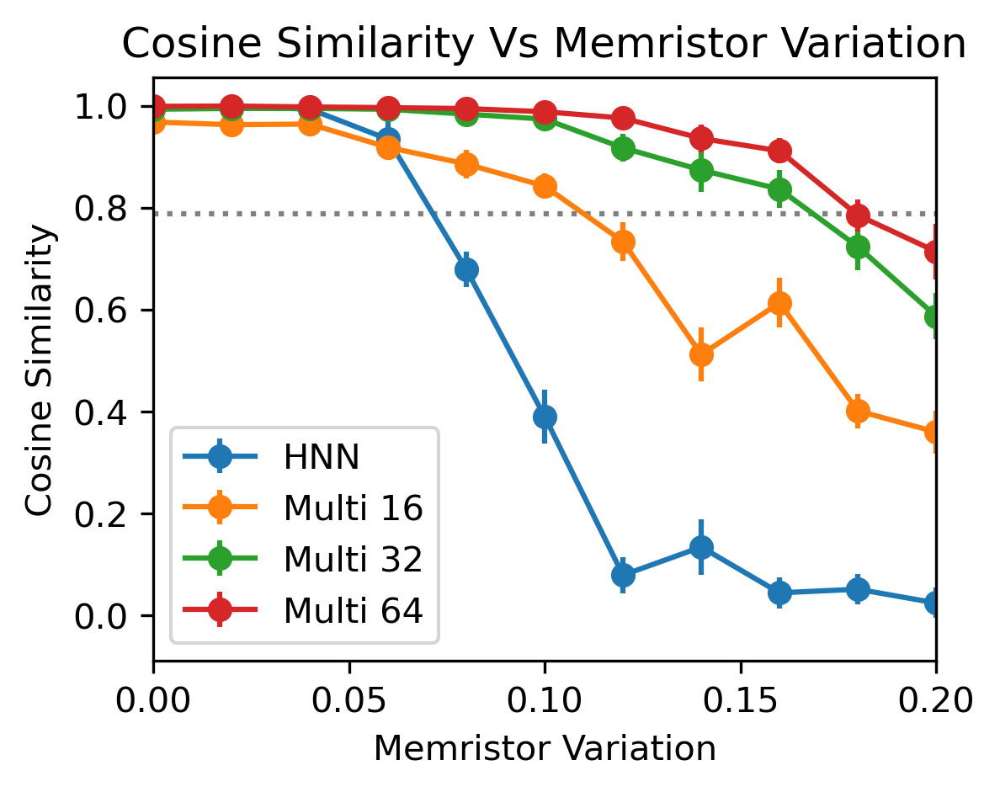

In [18]:
result=np.load(f'HNN_Asso_var.npz')
HNN_similarity_list=result['HNN_similarity_list']
result=np.load(f'MultiLyaer_Asso_1_16_var.npz')
mem_var_list=result['mem_var_list']
MultiHNN_similarity_list_16=result['MultiHNN_similarity_list']
input_similarities=result['input_similarities']
result=np.load(f'MultiLyaer_Asso_1_32_var.npz')
MultiHNN_similarity_list_32=result['MultiHNN_similarity_list']
result=np.load(f'MultiLyaer_Asso_1_64_var.npz')
MultiHNN_similarity_list_64=result['MultiHNN_similarity_list']
result=np.load(f'MultiLyaer_Asso_1_96_var.npz')
MultiHNN_similarity_list_96=result['MultiHNN_similarity_list']
result=np.load(f'MultiLyaer_Asso_1_128_var.npz')
MultiHNN_similarity_list_128=result['MultiHNN_similarity_list']

plt.figure(figsize=(4,3),dpi=300)
plt.errorbar(mem_var_list,np.mean(HNN_similarity_list,axis=0),yerr=np.std(HNN_similarity_list,axis=0),label='HNN',marker='o')
plt.errorbar(mem_var_list,np.mean(MultiHNN_similarity_list_16,axis=0),yerr=np.std(MultiHNN_similarity_list_16,axis=0),label='Multi 16',marker='o')
plt.errorbar(mem_var_list,np.mean(MultiHNN_similarity_list_32,axis=0),yerr=np.std(MultiHNN_similarity_list_32,axis=0),label='Multi 32',marker='o')
plt.errorbar(mem_var_list,np.mean(MultiHNN_similarity_list_64,axis=0),yerr=np.std(MultiHNN_similarity_list_64,axis=0),label='Multi 64',marker='o')
# plt.errorbar(mem_var_list,np.mean(MultiHNN_similarity_list_96,axis=0),yerr=np.std(MultiHNN_similarity_list_96,axis=0),label='Multi 96',marker='o')
# plt.errorbar(mem_var_list,np.mean(MultiHNN_similarity_list_128,axis=0),yerr=np.std(MultiHNN_similarity_list_128,axis=0),label='Multi 128',marker='o')
plt.axhline(y=input_similarities,ls=":",c="gray")
plt.xlim([0,0.2])
plt.title('Cosine Similarity Vs Memristor Variation')
plt.xlabel('Memristor Variation')
plt.ylabel('Cosine Similarity')
plt.legend()
plt.savefig('fig/MultiLayer_Asso_var.eps',format='eps')
plt.show()

### binary patterns (stuck at fault)

In [63]:
# load the stored patterns
num_pattern=10
stored_data=torch.from_numpy(new_mnist_data_binary[0:num_pattern]).float()

iteration= 9999
pattern shape torch.Size([10, 64])
iteration= 99
Epoch [0/400], Epoch_Loss: 1.033768653869629
Epoch [10/400], Epoch_Loss: 0.04108268599957228
Epoch [20/400], Epoch_Loss: 0.016243293322622778
Epoch [30/400], Epoch_Loss: 0.0058869281318038695
Epoch [40/400], Epoch_Loss: 0.002655438054352999
Epoch [50/400], Epoch_Loss: 0.0014127582428045567
Epoch [60/400], Epoch_Loss: 0.0007950572529807687
Epoch [70/400], Epoch_Loss: 0.0004601612192345783
Epoch [80/400], Epoch_Loss: 0.00027057283004978673
Epoch [90/400], Epoch_Loss: 0.0001606168152648024
Epoch [100/400], Epoch_Loss: 9.591415364411661e-05
Epoch [110/400], Epoch_Loss: 5.749066622229293e-05
Epoch [120/400], Epoch_Loss: 3.45421687597991e-05
Epoch [130/400], Epoch_Loss: 2.0789631889783774e-05
Epoch [140/400], Epoch_Loss: 1.2529208106570877e-05
Epoch [150/400], Epoch_Loss: 7.55898413444811e-06
Epoch [160/400], Epoch_Loss: 4.564627192849001e-06
Epoch [170/400], Epoch_Loss: 2.7589793035076584e-06
Epoch [180/400], Epoch_Loss: 1.669

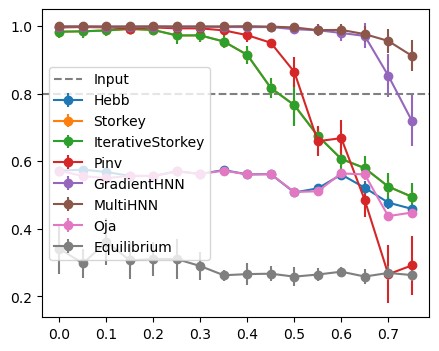

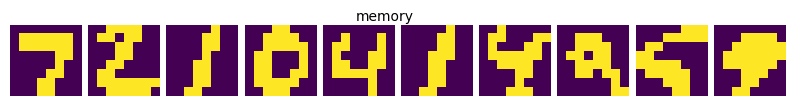

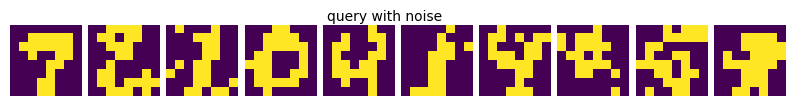

<Figure size 640x480 with 0 Axes>

In [22]:

device='cpu'
input_size=stored_data.shape[1]
encoder_dim=32
num_hidden_layers=1
nonlin='tanh'
learn_lr=0.01
learn_iters=200
distance_type='cos'
params={
    'input_size':input_size,
    'encoder_dim':encoder_dim,
    'num_hidden_layers':num_hidden_layers,
    'nonlin':nonlin,
    'learn_lr':learn_lr,
    'learn_iters':learn_iters,
    'device':device,
    'recall_iters':100,
    'data_type':'binary',
    'plot_num_per_row':10,
    'data_set':'mnist',
    'repeat':0,
}

#plot settings
plot_weight_flag=True
num_simulations=20
#memristor variation and stuck at fault
mem_var=0.0
stuck_at_fault_list=np.arange(0,0.8,0.05)



Hebb_similarity_list=[]
Storkey_similarity_list=[]
IterativeStorkey_similarity_list=[]
Pinv_similarity_list=[]
HNN_similarity_list=[]
MultiHNN_similarity_list=[]
Oja_similarity_list=[]
Equilibrium_similarity_list=[]

input_similarities_list=[]

for i in range (num_simulations):
    for stuck_at_fault_rate in stuck_at_fault_list:
        # create the network
        hnn=SingleLayerHNN_lambda(input_size=input_size)
        multi_hnn=MultiLayerHNN_beta(input_dim=input_size,encoding_dim=encoder_dim,num_hidden_layers=num_hidden_layers,nolinear=nonlin,noise_level=0.0,mask_prob=stuck_at_fault_rate)


        Hebb = HopfieldNet(num_neurons=input_size)
        Storkey = HopfieldNet(num_neurons=input_size)
        Pinv=HopfieldNet(num_neurons=input_size)
        IterativeStorkey=HopfieldNet(num_neurons=input_size)
        Oja=HopfieldNet(num_neurons=input_size)
        Equilibrium=HopfieldNet(num_neurons=input_size)

        # train the network
        Hebb.learn_patterns(stored_data, rule='Hebb',options={})
        Storkey.learn_patterns(stored_data, rule='Storkey',options={})     
        Pinv.learn_patterns(stored_data, rule='Pinv',options={})
        IterativeStorkey.learn_patterns(stored_data, rule='IterativeStorkey',options={})  
        Oja.learn_patterns(stored_data, rule='Oja',options={})
        Equilibrium.learn_patterns(stored_data, rule='Equilibrium',options={})


        optimizer_hnn = torch.optim.RMSprop(hnn.parameters(), lr=learn_lr)
        optimizer_multi = torch.optim.RMSprop(multi_hnn.parameters(), lr=learn_lr/2)

        multi_hnn.noise_level=mem_var*0.1
        multi_hnn_losses=train_multilayer_hnn(multi_hnn, optimizer_multi, stored_data, 2*learn_iters, device)

        mem_stuck_mask=generate_mask(input_size,stuck_at_fault_rate,seed=1)
        hnn.set_mask(mask=mem_stuck_mask)
        hnn.noise_level=mem_var*4
        hnn_losses=train_multilayer_hnn(hnn, optimizer_hnn, stored_data, learn_iters, device)

        hnn.add_variation(var=mem_var)
        multi_hnn.add_variation(var=mem_var)
        Hebb.add_weight_variation(variation=mem_var)
        Storkey.add_weight_variation(variation=mem_var)
        IterativeStorkey.add_weight_variation(variation=mem_var)
        Pinv.add_weight_variation(variation=mem_var)
        Oja.add_weight_variation(variation=mem_var)
        Equilibrium.add_weight_variation(variation=mem_var)

        Hebb.add_mask(mask=mem_stuck_mask)
        Storkey.add_mask(mask=mem_stuck_mask)
        IterativeStorkey.add_mask(mask=mem_stuck_mask)
        Pinv.add_mask(mask=mem_stuck_mask)
        Oja.add_mask(mask=mem_stuck_mask)
        Equilibrium.add_mask(mask=mem_stuck_mask)

        # recall setting
        params['recall_iters']=100
        test_data=np.array([get_corrupted_input(d,0.1) for d in stored_data])
        test_data = torch.from_numpy(test_data).float()

        # recall data
        HNN_recall = singlelayer_recall(hnn, test_data, params)
        MultiHNN_recall=singlelayer_recall(multi_hnn, test_data, params)
        Hebb_recall=Hebb.retrieve_pattern(test_data, sync=True,chnn=False)
        Storkey_recall=Storkey.retrieve_pattern(test_data, sync=True,chnn=False)
        IterativeStorkey_recall=IterativeStorkey.retrieve_pattern(test_data, sync=True,chnn=False)
        Pinv_recall=Pinv.retrieve_pattern(test_data, sync=True,chnn=False)
        Oja_recall=Oja.retrieve_pattern(test_data, sync=True,chnn=False)
        Equilibrium_recall=Equilibrium.retrieve_pattern(test_data, sync=True,chnn=False)


        print(type(stored_data))
        # calculate similarity
        Hebb_similarity=torch.mean(calculate_sim(stored_data,Hebb_recall,distance_type=distance_type))
        Storkey_similarity=torch.mean(calculate_sim(stored_data,Storkey_recall,distance_type=distance_type))
        IterativeStorkey_similarity=torch.mean(calculate_sim(stored_data,IterativeStorkey_recall,distance_type=distance_type))
        Pinv_similarity=torch.mean(calculate_sim(stored_data,Pinv_recall,distance_type=distance_type))
        HNN_similarity=torch.mean(calculate_sim(stored_data,HNN_recall,distance_type=distance_type))
        MultiHNN_similarity=torch.mean(calculate_sim(stored_data,MultiHNN_recall,distance_type=distance_type))
        Oja_similarity=torch.mean(calculate_sim(stored_data,Oja_recall,distance_type=distance_type))
        Equilibrium_similarity=torch.mean(calculate_sim(stored_data,Equilibrium_recall,distance_type=distance_type))

        Hebb_similarity_list.append(to_np(Hebb_similarity).item())
        Storkey_similarity_list.append(to_np(Storkey_similarity).item())
        IterativeStorkey_similarity_list.append(to_np(IterativeStorkey_similarity).item())
        Pinv_similarity_list.append(to_np(Pinv_similarity).item())
        HNN_similarity_list.append(to_np(HNN_similarity).item())
        MultiHNN_similarity_list.append(to_np(MultiHNN_similarity).item())
        Oja_similarity_list.append(to_np(Oja_similarity).item())
        Equilibrium_similarity_list.append(to_np(Equilibrium_similarity).item())


        input_similarities_list.append(to_np(torch.mean(calculate_sim(stored_data,test_data,distance_type=distance_type))).item())
input_similarities=np.mean(input_similarities_list)
results={}
results['Hebb_similarity_list']=Hebb_similarity_list
results['Storkey_similarity_list']=Storkey_similarity_list
results['IterativeStorkey_similarity_list']=IterativeStorkey_similarity_list
results['Pinv_similarity_list']=Pinv_similarity_list
results['HNN_similarity_list']=HNN_similarity_list
results['MultiHNN_similarity_list']=MultiHNN_similarity_list
results['Oja_similarity_list']=Oja_similarity_list
results['Equilibrium_similarity_list']=Equilibrium_similarity_list

results['stuck_at_fault_list']=stuck_at_fault_list.tolist()
results['mem_var']=mem_var
results['input_similarities']=input_similarities.item()

print(results)
json.dump(results, open(num_path + f"/memristor_stuck_at_fault_variation={mem_var}_datatype={params['data_type']}_numiter={params['learn_iters']}.json", 'w'))

np.savez('AssociateMemory_stuck_at_fault.npz',mem_var=mem_var,stuck_at_fault_list=stuck_at_fault_list,Hebb_similarity_list=Hebb_similarity_list,Storkey_similarity_list=Storkey_similarity_list,IterativeStorkey_similarity_list=IterativeStorkey_similarity_list,Pinv_similarity_list=Pinv_similarity_list,HNN_similarity_list=HNN_similarity_list,MultiHNN_similarity_list=MultiHNN_similarity_list,Oja_similarity_list=Oja_similarity_list,Equilibrium_similarity_list=Equilibrium_similarity_list,input_similarities=input_similarities)
Hebb_similarity_list=np.array(Hebb_similarity_list).reshape(num_simulations,-1)
Storkey_similarity_list=np.array(Storkey_similarity_list).reshape(num_simulations,-1)
IterativeStorkey_similarity_list=np.array(IterativeStorkey_similarity_list).reshape(num_simulations,-1)
Pinv_similarity_list=np.array(Pinv_similarity_list).reshape(num_simulations,-1)
HNN_similarity_list=np.array(HNN_similarity_list).reshape(num_simulations,-1)
MultiHNN_similarity_list=np.array(MultiHNN_similarity_list).reshape(num_simulations,-1)
Oja_similarity_list=np.array(Oja_similarity_list).reshape(num_simulations,-1)
Equilibrium_similarity_list=np.array(Equilibrium_similarity_list).reshape(num_simulations,-1)



plt.figure(figsize=(5,4))
plt.errorbar(stuck_at_fault_list,np.mean(Hebb_similarity_list,axis=0),yerr=np.std(Hebb_similarity_list,axis=0),label='Hebb',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(Storkey_similarity_list,axis=0),yerr=np.std(Storkey_similarity_list,axis=0),label='Storkey',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(IterativeStorkey_similarity_list,axis=0),yerr=np.std(IterativeStorkey_similarity_list,axis=0),label='IterativeStorkey',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(Pinv_similarity_list,axis=0),yerr=np.std(Pinv_similarity_list,axis=0),label='Pinv',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(HNN_similarity_list,axis=0),yerr=np.std(HNN_similarity_list,axis=0),label='GradientHNN',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(MultiHNN_similarity_list,axis=0),yerr=np.std(MultiHNN_similarity_list,axis=0),label='MultiHNN',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(Oja_similarity_list,axis=0),yerr=np.std(Oja_similarity_list,axis=0),label='Oja',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(Equilibrium_similarity_list,axis=0),yerr=np.std(Equilibrium_similarity_list,axis=0),label='Equilibrium',marker='o')
plt.axhline(y=input_similarities,label='Input',linestyle='--',color='gray')
plt.legend()

# plot_recalls(Pinv_recall, 'Pinv', fig_path, params)
# plot_recalls(HNN_recall, 'HNN', fig_path, params)
plot_memory(stored_data, 1, fig_path, params)
plot_memory_noise(test_data, 1, fig_path, params)

In [18]:
device='cpu'
input_size=stored_data.shape[1]
encoder_dim=32
num_hidden_layers=1
nonlin='tanh'
learn_lr=0.01
learn_iters=200
distance_type='cos'
params={
    'input_size':input_size,
    'encoder_dim':encoder_dim,
    'num_hidden_layers':num_hidden_layers,
    'nonlin':nonlin,
    'learn_lr':learn_lr,
    'learn_iters':learn_iters,
    'device':device,
    'recall_iters':100,
    'data_type':'binary',
    'plot_num_per_row':10,
    'data_set':'mnist',
    'repeat':0,
}

#plot settings
plot_weight_flag=True
num_simulations=10
#memristor variation and stuck at fault
mem_var=0.0
stuck_at_fault_list=np.arange(0,0.8,0.05)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


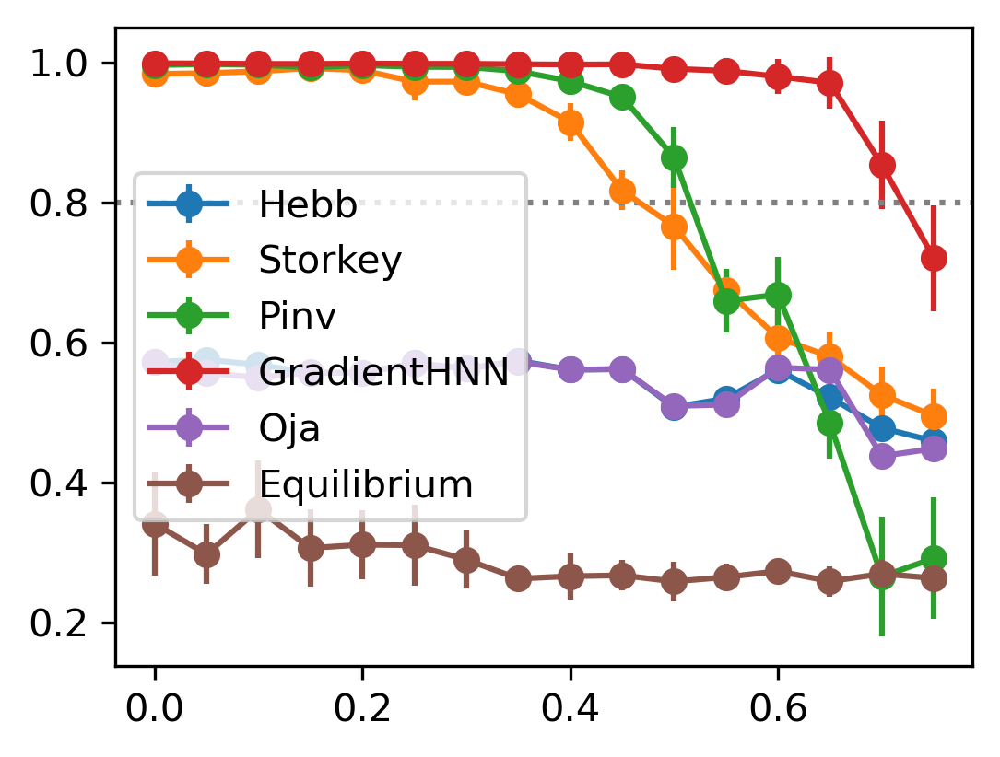

In [32]:
results=np.load('AssociateMemory_stuck_at_fault.npz')
mem_var=results['mem_var']
stuck_at_fault_list=results['stuck_at_fault_list']
Hebb_similarity_list=results['Hebb_similarity_list']
Storkey_similarity_list=results['Storkey_similarity_list']
IterativeStorkey_similarity_list=results['IterativeStorkey_similarity_list']
Pinv_similarity_list=results['Pinv_similarity_list']
HNN_similarity_list=results['HNN_similarity_list']
MultiHNN_similarity_list=results['MultiHNN_similarity_list']
Oja_similarity_list=results['Oja_similarity_list']
Equilibrium_similarity_list=results['Equilibrium_similarity_list']
input_similarities=results['input_similarities']


Hebb_similarity_list=np.array(Hebb_similarity_list).reshape(num_simulations,-1)
Storkey_similarity_list=np.array(Storkey_similarity_list).reshape(num_simulations,-1)
IterativeStorkey_similarity_list=np.array(IterativeStorkey_similarity_list).reshape(num_simulations,-1)
Pinv_similarity_list=np.array(Pinv_similarity_list).reshape(num_simulations,-1)
HNN_similarity_list=np.array(HNN_similarity_list).reshape(num_simulations,-1)
MultiHNN_similarity_list=np.array(MultiHNN_similarity_list).reshape(num_simulations,-1)
Oja_similarity_list=np.array(Oja_similarity_list).reshape(num_simulations,-1)
Equilibrium_similarity_list=np.array(Equilibrium_similarity_list).reshape(num_simulations,-1)

plt.figure(figsize=(4,3),dpi=300)
plt.errorbar(stuck_at_fault_list,np.mean(Hebb_similarity_list,axis=0),yerr=np.std(Hebb_similarity_list,axis=0),label='Hebb',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(Storkey_similarity_list,axis=0),yerr=np.std(Storkey_similarity_list,axis=0),label='Storkey',marker='o')
# plt.errorbar(stuck_at_fault_list,np.mean(IterativeStorkey_similarity_list,axis=0),yerr=np.std(IterativeStorkey_similarity_list,axis=0),label='IterativeStorkey',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(Pinv_similarity_list,axis=0),yerr=np.std(Pinv_similarity_list,axis=0),label='Pinv',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(HNN_similarity_list,axis=0),yerr=np.std(HNN_similarity_list,axis=0),label='GradientHNN',marker='o')
# plt.errorbar(stuck_at_fault_list,np.mean(MultiHNN_similarity_list,axis=0),yerr=np.std(MultiHNN_similarity_list,axis=0),label='MultiHNN',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(Oja_similarity_list,axis=0),yerr=np.std(Oja_similarity_list,axis=0),label='Oja',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(Equilibrium_similarity_list,axis=0),yerr=np.std(Equilibrium_similarity_list,axis=0),label='Equilibrium',marker='o')
plt.axhline(y=input_similarities,ls=":",c="gray")
# plt.title(f'Similarity vs Stuck at Fault Ratio(var={mem_var})')
# plt.xlabel('Stuck at Fault Ratio')
# plt.ylabel('Similarity')
# plt.errorbar(stuck_at_fault_list,np.mean(MultiHNN_similarity_list,axis=0),yerr=np.std(MultiHNN_similarity_list,axis=0),label='MultiHNN',marker='o')
plt.legend()
plt.savefig(f'fig/AssociateMemory_stuck.eps',format='eps')
plt.show()


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


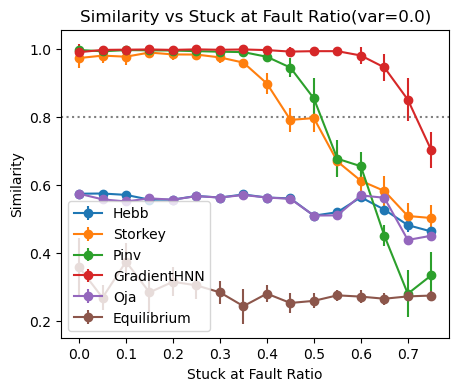

In [23]:
mem_var=0.0
data_type='binary'
learn_iters=200
# 指定JSON文件路径
json_file_path = num_path + f"/memristor_stuck_at_fault_variation={mem_var}_datatype={data_type}_numiter={params['learn_iters']}.json"
# 从JSON文件中读取数据
with open(json_file_path, 'r') as json_file:
    data = json.load(json_file)
Hebb_similarity_list=data['Hebb_similarity_list']
Storkey_similarity_list=data['Storkey_similarity_list']
IterativeStorkey_similarity_list=data['IterativeStorkey_similarity_list']
Pinv_similarity_list=data['Pinv_similarity_list']
HNN_similarity_list=data['HNN_similarity_list']
MultiHNN_similarity_list=data['MultiHNN_similarity_list']
Oja_similarity_list=data['Oja_similarity_list']
Equilibrium_similarity_list=data['Equilibrium_similarity_list']
stuck_at_fault_list=data['stuck_at_fault_list']
input_similarities=data['input_similarities']

Hebb_similarity_list=np.array(Hebb_similarity_list).reshape(num_simulations,-1)
Storkey_similarity_list=np.array(Storkey_similarity_list).reshape(num_simulations,-1)
IterativeStorkey_similarity_list=np.array(IterativeStorkey_similarity_list).reshape(num_simulations,-1)
Pinv_similarity_list=np.array(Pinv_similarity_list).reshape(num_simulations,-1)
HNN_similarity_list=np.array(HNN_similarity_list).reshape(num_simulations,-1)
MultiHNN_similarity_list=np.array(MultiHNN_similarity_list).reshape(num_simulations,-1)
Oja_similarity_list=np.array(Oja_similarity_list).reshape(num_simulations,-1)
Equilibrium_similarity_list=np.array(Equilibrium_similarity_list).reshape(num_simulations,-1)

plt.figure(figsize=(5,4),dpi=100)
plt.errorbar(stuck_at_fault_list,np.mean(Hebb_similarity_list,axis=0),yerr=np.std(Hebb_similarity_list,axis=0),label='Hebb',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(Storkey_similarity_list,axis=0),yerr=np.std(Storkey_similarity_list,axis=0),label='Storkey',marker='o')
# plt.errorbar(stuck_at_fault_list,np.mean(IterativeStorkey_similarity_list,axis=0),yerr=np.std(IterativeStorkey_similarity_list,axis=0),label='IterativeStorkey',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(Pinv_similarity_list,axis=0),yerr=np.std(Pinv_similarity_list,axis=0),label='Pinv',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(HNN_similarity_list,axis=0),yerr=np.std(HNN_similarity_list,axis=0),label='GradientHNN',marker='o')
# plt.errorbar(stuck_at_fault_list,np.mean(MultiHNN_similarity_list,axis=0),yerr=np.std(MultiHNN_similarity_list,axis=0),label='MultiHNN',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(Oja_similarity_list,axis=0),yerr=np.std(Oja_similarity_list,axis=0),label='Oja',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(Equilibrium_similarity_list,axis=0),yerr=np.std(Equilibrium_similarity_list,axis=0),label='Equilibrium',marker='o')
plt.axhline(y=input_similarities,ls=":",c="gray")
plt.title(f'Similarity vs Stuck at Fault Ratio(var={mem_var})')
plt.xlabel('Stuck at Fault Ratio')
plt.ylabel('Similarity')
# plt.errorbar(stuck_at_fault_list,np.mean(MultiHNN_similarity_list,axis=0),yerr=np.std(MultiHNN_similarity_list,axis=0),label='MultiHNN',marker='o')
plt.legend()
plt.savefig(f'fig/mnist_similarity_stuck_var={mem_var}.eps',format='eps')
plt.savefig(f'fig/mnist_similarity_stuck_var={mem_var}.pdf',format='pdf')
plt.show()


  0%|          | 0/20 [00:00<?, ?it/s]

Epoch [3325/10000], Loss: 9.993463834234717e-09
Epoch [3325/10000], Loss: 9.993463834234717e-09


  5%|▌         | 1/20 [00:01<00:30,  1.62s/it]

Epoch [3392/10000], Loss: 9.992207949949261e-09
Epoch [3392/10000], Loss: 9.992207949949261e-09


 10%|█         | 2/20 [00:03<00:29,  1.64s/it]

Epoch [3440/10000], Loss: 9.989387095288293e-09
Epoch [3440/10000], Loss: 9.989387095288293e-09


 15%|█▌        | 3/20 [00:04<00:28,  1.65s/it]

Epoch [3530/10000], Loss: 9.996171002057963e-09
Epoch [3530/10000], Loss: 9.996171002057963e-09


 20%|██        | 4/20 [00:06<00:28,  1.79s/it]

Epoch [3617/10000], Loss: 9.99398785950234e-09
Epoch [3617/10000], Loss: 9.99398785950234e-09


 25%|██▌       | 5/20 [00:08<00:26,  1.77s/it]

Epoch [3747/10000], Loss: 9.99780969124231e-09
Epoch [3747/10000], Loss: 9.99780969124231e-09


 30%|███       | 6/20 [00:10<00:25,  1.79s/it]

Epoch [3866/10000], Loss: 9.99967308956684e-09
Epoch [3866/10000], Loss: 9.99967308956684e-09


 35%|███▌      | 7/20 [00:12<00:23,  1.81s/it]

Epoch [4093/10000], Loss: 9.999296501916888e-09
Epoch [4093/10000], Loss: 9.999296501916888e-09


 40%|████      | 8/20 [00:14<00:22,  1.86s/it]

Epoch [4333/10000], Loss: 9.993994964929698e-09
Epoch [4333/10000], Loss: 9.993994964929698e-09


 45%|████▌     | 9/20 [00:16<00:21,  1.93s/it]

Epoch [4680/10000], Loss: 9.999040706532014e-09
Epoch [4680/10000], Loss: 9.999040706532014e-09


 50%|█████     | 10/20 [00:18<00:20,  2.02s/it]

Epoch [5145/10000], Loss: 9.999629568824275e-09
Epoch [5145/10000], Loss: 9.999629568824275e-09


 55%|█████▌    | 11/20 [00:21<00:19,  2.15s/it]

Epoch [5698/10000], Loss: 9.997862093769072e-09
Epoch [5698/10000], Loss: 9.997862093769072e-09


 60%|██████    | 12/20 [00:23<00:18,  2.31s/it]

Epoch [6623/10000], Loss: 9.999538974625466e-09
Epoch [6623/10000], Loss: 9.999538974625466e-09


 65%|██████▌   | 13/20 [00:26<00:17,  2.53s/it]

Epoch [7727/10000], Loss: 9.997914496295834e-09
Epoch [7727/10000], Loss: 9.997914496295834e-09


 70%|███████   | 14/20 [00:30<00:17,  2.83s/it]

Epoch [9999/10000], Loss: 0.0031259930692613125


 75%|███████▌  | 15/20 [00:34<00:16,  3.34s/it]

Epoch [9999/10000], Loss: 0.012501582503318787


 80%|████████  | 16/20 [00:39<00:14,  3.71s/it]

Epoch [9999/10000], Loss: 0.032297492027282715


 85%|████████▌ | 17/20 [00:43<00:11,  3.95s/it]

Epoch [9999/10000], Loss: 0.0894927904009819


 90%|█████████ | 18/20 [00:48<00:08,  4.11s/it]

Epoch [9999/10000], Loss: 0.2251189947128296


 95%|█████████▌| 19/20 [00:52<00:04,  4.23s/it]

Epoch [9999/10000], Loss: 0.45181670784950256


100%|██████████| 20/20 [00:57<00:00,  2.87s/it]


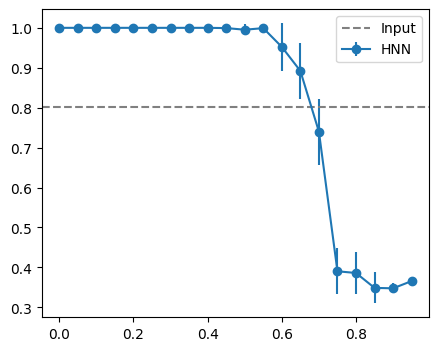

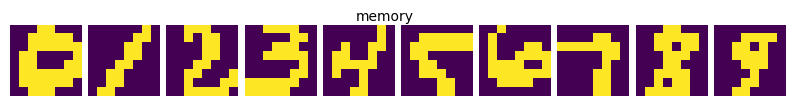

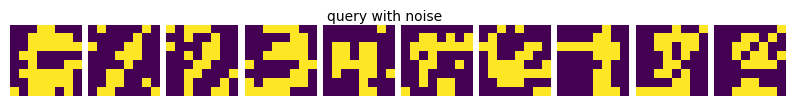

<Figure size 640x480 with 0 Axes>

In [28]:
# calculate the accuracy versus the memristor stuck at fault ratio for multi-layer HNN
from tqdm import tqdm
device='cpu'
input_size=stored_data.shape[1]
encoder_dim=32
num_hidden_layers=1
nonlin='tanh'
learn_lr=1e-3
learn_iters=10000
distance_type='cos'
params={
    'input_size':input_size,
    'encoder_dim':encoder_dim,
    'num_hidden_layers':num_hidden_layers,
    'nonlin':nonlin,
    'learn_lr':learn_lr,
    'learn_iters':learn_iters,
    'device':device,
    'recall_iters':100,
    'data_type':'binary',
    'plot_num_per_row':10,
    'data_set':'mnist',
    'repeat':0,
}

#plot settings
plot_weight_flag=True
num_simulations=20
#memristor variation and stuck at fault
mem_var=0.0
stuck_at_fault_list=np.arange(0,1,0.05)



HNN_similarity_list=[]
input_similarities_list=[]


for stuck_at_fault_rate in tqdm(stuck_at_fault_list):
    # create the network
    hnn=SingleLayerHNN_lambda(input_size=input_size)
    # train the network

    optimizer_hnn = torch.optim.RMSprop(hnn.parameters(), lr=learn_lr)
    mem_stuck_mask=generate_mask(input_size,stuck_at_fault_rate,seed=1)
    hnn.set_mask(mask=mem_stuck_mask)
    hnn.noise_level=mem_var*4
    hnn_losses=train_multilayer_batch(hnn, optimizer_hnn, stored_data, learn_iters, device)
    for i in range (num_simulations):
        # recall setting
        params['recall_iters']=100
        test_data=np.array([get_corrupted_input(d,0.1) for d in stored_data])
        test_data = torch.from_numpy(test_data).float()

        # recall data

        HNN_recall=singlelayer_recall(hnn, test_data, params)
        # calculate similarity
        HNN_similarity=torch.mean(calculate_sim(stored_data,HNN_recall,distance_type=distance_type))
        HNN_similarity_list.append(to_np(HNN_similarity).item())
        input_similarities_list.append(to_np(torch.mean(calculate_sim(stored_data,test_data,distance_type=distance_type))).item())
input_similarities=np.mean(input_similarities_list)
HNN_similarity_list=np.array(HNN_similarity_list).reshape(-1,num_simulations).T


np.savez(num_path+f'/HNN_Asso_SAF.npz',mem_var=mem_var,stuck_at_fault_list=stuck_at_fault_list,HNN_similarity_list=HNN_similarity_list,input_similarities=input_similarities)



plt.figure(figsize=(5,4))
plt.errorbar(stuck_at_fault_list,np.mean(HNN_similarity_list,axis=0),yerr=np.std(HNN_similarity_list,axis=0),label='HNN',marker='o')
plt.axhline(y=input_similarities,label='Input',linestyle='--',color='gray')
plt.legend()

# plot_recalls(Pinv_recall, 'Pinv', fig_path, params)
# plot_recalls(HNN_recall, 'HNN', fig_path, params)
plot_memory(stored_data, 1, fig_path, params)
plot_memory_noise(test_data, 1, fig_path, params)

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch [6397/20000], Loss: 9.999947536698528e-09
Epoch [6397/20000], Loss: 9.999947536698528e-09


  5%|▌         | 1/20 [00:04<01:18,  4.15s/it]

Epoch [6649/20000], Loss: 9.999050476494631e-09
Epoch [6649/20000], Loss: 9.999050476494631e-09


 10%|█         | 2/20 [00:08<01:16,  4.25s/it]

Epoch [6845/20000], Loss: 9.998848859993359e-09
Epoch [6845/20000], Loss: 9.998848859993359e-09


 15%|█▌        | 3/20 [00:12<01:14,  4.36s/it]

Epoch [7233/20000], Loss: 9.998139205436019e-09
Epoch [7233/20000], Loss: 9.998139205436019e-09


 20%|██        | 4/20 [00:17<01:11,  4.50s/it]

Epoch [7641/20000], Loss: 9.998897709806442e-09
Epoch [7641/20000], Loss: 9.998897709806442e-09


 25%|██▌       | 5/20 [00:23<01:13,  4.89s/it]

Epoch [8131/20000], Loss: 9.998769812114006e-09
Epoch [8131/20000], Loss: 9.998769812114006e-09


 30%|███       | 6/20 [00:28<01:11,  5.14s/it]

Epoch [8463/20000], Loss: 9.998795569288177e-09
Epoch [8463/20000], Loss: 9.998795569288177e-09


 35%|███▌      | 7/20 [00:35<01:12,  5.55s/it]

Epoch [8847/20000], Loss: 9.99807436841138e-09
Epoch [8847/20000], Loss: 9.99807436841138e-09


 40%|████      | 8/20 [00:41<01:07,  5.66s/it]

Epoch [10408/20000], Loss: 9.99869786966201e-09
Epoch [10408/20000], Loss: 9.99869786966201e-09


 45%|████▌     | 9/20 [00:48<01:07,  6.12s/it]

Epoch [10996/20000], Loss: 9.999979511121637e-09
Epoch [10996/20000], Loss: 9.999979511121637e-09


 50%|█████     | 10/20 [00:56<01:07,  6.75s/it]

Epoch [11731/20000], Loss: 9.998792016574498e-09
Epoch [11731/20000], Loss: 9.998792016574498e-09


 55%|█████▌    | 11/20 [01:04<01:04,  7.21s/it]

Epoch [12716/20000], Loss: 9.999423511430905e-09
Epoch [12716/20000], Loss: 9.999423511430905e-09


 60%|██████    | 12/20 [01:13<01:00,  7.57s/it]

Epoch [14856/20000], Loss: 9.998770700292425e-09
Epoch [14856/20000], Loss: 9.998770700292425e-09


 65%|██████▌   | 13/20 [01:22<00:57,  8.22s/it]

Epoch [17486/20000], Loss: 9.999192585041783e-09
Epoch [17486/20000], Loss: 9.999192585041783e-09


 70%|███████   | 14/20 [01:33<00:53,  8.94s/it]

Epoch [19999/20000], Loss: 1.0696284746813944e-08


 75%|███████▌  | 15/20 [01:46<00:51, 10.23s/it]

Epoch [19999/20000], Loss: 1.741455513126766e-08


 80%|████████  | 16/20 [02:00<00:44, 11.24s/it]

Epoch [19999/20000], Loss: 0.024722302332520485


 85%|████████▌ | 17/20 [02:12<00:34, 11.64s/it]

Epoch [19999/20000], Loss: 0.025937657803297043


 90%|█████████ | 18/20 [02:25<00:23, 11.94s/it]

Epoch [19999/20000], Loss: 0.1246597170829773


 95%|█████████▌| 19/20 [02:37<00:11, 11.97s/it]

Epoch [19999/20000], Loss: 0.35061246156692505


100%|██████████| 20/20 [02:49<00:00,  8.50s/it]


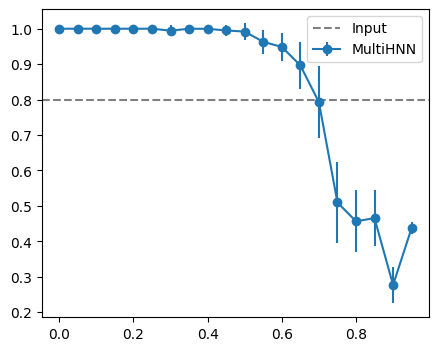

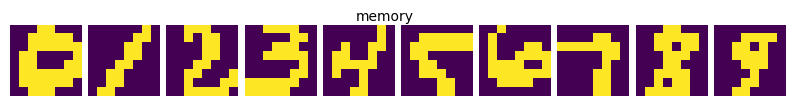

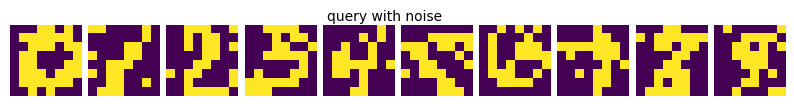

<Figure size 640x480 with 0 Axes>

In [35]:
# calculate the accuracy versus the memristor stuck at fault ratio for multi-layer HNN
from tqdm import tqdm
device='cpu'
input_size=stored_data.shape[1]
encoder_dim=24
num_hidden_layers=1
nonlin='tanh'
learn_lr=1e-3
learn_iters=10000
distance_type='cos'
params={
    'input_size':input_size,
    'encoder_dim':encoder_dim,
    'num_hidden_layers':num_hidden_layers,
    'nonlin':nonlin,
    'learn_lr':learn_lr,
    'learn_iters':learn_iters,
    'device':device,
    'recall_iters':100,
    'data_type':'binary',
    'plot_num_per_row':10,
    'data_set':'mnist',
    'repeat':0,
}

#plot settings
plot_weight_flag=True
num_simulations=20
#memristor variation and stuck at fault
mem_var=0.0
stuck_at_fault_list=np.arange(0,1,0.05)



MultiHNN_similarity_list=[]
input_similarities_list=[]


for stuck_at_fault_rate in tqdm(stuck_at_fault_list):
    # create the network
    multi_hnn=MultiLayerHNN_beta(input_dim=input_size,encoding_dim=encoder_dim,num_hidden_layers=num_hidden_layers,nolinear=nonlin,noise_level=0.0,mask_prob=stuck_at_fault_rate)
    # train the network
    optimizer_multi = torch.optim.RMSprop(multi_hnn.parameters(), lr=learn_lr/2)
    multi_hnn.noise_level=mem_var*0
    multi_hnn_losses=train_multilayer_batch(multi_hnn, optimizer_multi, stored_data, 2*learn_iters, device)
    for i in range (num_simulations):
        # recall setting
        params['recall_iters']=100
        test_data=np.array([get_corrupted_input(d,0.1) for d in stored_data])
        test_data = torch.from_numpy(test_data).float()

        # recall data

        MultiHNN_recall=singlelayer_recall(multi_hnn, test_data, params)
        # calculate similarity
        MultiHNN_similarity=torch.mean(calculate_sim(stored_data,MultiHNN_recall,distance_type=distance_type))
        MultiHNN_similarity_list.append(to_np(MultiHNN_similarity).item())
        input_similarities_list.append(to_np(torch.mean(calculate_sim(stored_data,test_data,distance_type=distance_type))).item())
input_similarities=np.mean(input_similarities_list)
MultiHNN_similarity_list=np.array(MultiHNN_similarity_list).reshape(-1,num_simulations).T


np.savez(num_path+f'/MultiLyaer_Asso_{num_hidden_layers}_{encoder_dim}_SAF.npz',mem_var=mem_var,stuck_at_fault_list=stuck_at_fault_list,MultiHNN_similarity_list=MultiHNN_similarity_list,input_similarities=input_similarities)



plt.figure(figsize=(5,4))
plt.errorbar(stuck_at_fault_list,np.mean(MultiHNN_similarity_list,axis=0),yerr=np.std(MultiHNN_similarity_list,axis=0),label='MultiHNN',marker='o')
plt.axhline(y=input_similarities,label='Input',linestyle='--',color='gray')
plt.legend()

# plot_recalls(Pinv_recall, 'Pinv', fig_path, params)
# plot_recalls(HNN_recall, 'HNN', fig_path, params)
plot_memory(stored_data, 1, fig_path, params)
plot_memory_noise(test_data, 1, fig_path, params)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


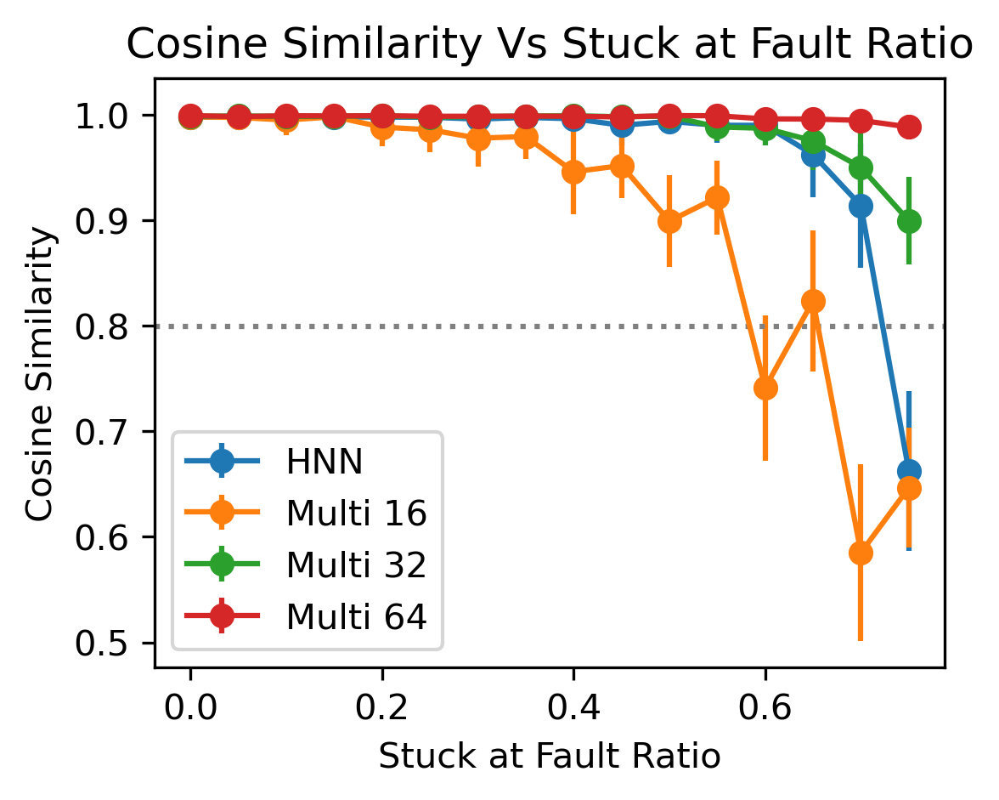

In [21]:
result=np.load('HNN_Asso_SAF.npz')
HNN_similarity_list=result['HNN_similarity_list']
result=np.load('MultiLyaer_Asso_1_16_SAF.npz')
MultiHNN_similarity_list_16=result['MultiHNN_similarity_list']
input_similarities=result['input_similarities']
stuck_at_fault_list=result['stuck_at_fault_list']
result=np.load('MultiLyaer_Asso_1_32_SAF.npz')
MultiHNN_similarity_list_32=result['MultiHNN_similarity_list']
result=np.load('MultiLyaer_Asso_1_64_SAF.npz')
MultiHNN_similarity_list_64=result['MultiHNN_similarity_list']
result=np.load('MultiLyaer_Asso_1_96_SAF.npz')
MultiHNN_similarity_list_96=result['MultiHNN_similarity_list']
result=np.load('MultiLyaer_Asso_1_128_SAF.npz')
MultiHNN_similarity_list_128=result['MultiHNN_similarity_list']

plt.figure(figsize=(4,3),dpi=300)
plt.errorbar(stuck_at_fault_list,np.mean(HNN_similarity_list,axis=0),yerr=np.std(HNN_similarity_list,axis=0),label='HNN',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(MultiHNN_similarity_list_16,axis=0),yerr=np.std(MultiHNN_similarity_list_16,axis=0),label='Multi 16',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(MultiHNN_similarity_list_32,axis=0),yerr=np.std(MultiHNN_similarity_list_32,axis=0),label='Multi 32',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(MultiHNN_similarity_list_64,axis=0),yerr=np.std(MultiHNN_similarity_list_64,axis=0),label='Multi 64',marker='o')
# plt.errorbar(stuck_at_fault_list,np.mean(MultiHNN_similarity_list_96,axis=0),yerr=np.std(MultiHNN_similarity_list_96,axis=0),label='Multi 96',marker='o')
# plt.errorbar(stuck_at_fault_list,np.mean(MultiHNN_similarity_list_128,axis=0),yerr=np.std(MultiHNN_similarity_list_128,axis=0),label='Multi 128',marker='o')
plt.axhline(y=input_similarities,ls=":",c="gray")
plt.title('Cosine Similarity Vs Stuck at Fault Ratio')
plt.xlabel('Stuck at Fault Ratio')
plt.ylabel('Cosine Similarity')
plt.legend()
plt.savefig('fig/MultiLayer_Asso_SAF.eps',format='eps')
plt.show()


## multilayer hnn for continuous patterns

### demostration (continuous patterns)

In [59]:
num_samples = 15
stored_data_list=torch.from_numpy(new_mnist_data).float()
stored_data = stored_data_list[0:num_samples]

In [14]:
n=405
num_samples = 10
stored_data_list=torch.from_numpy(new_mnist_data_order).float()
stored_data = stored_data_list[n::1000]
stored_data=stored_data[0:num_samples]

In [18]:
stored_data=torch.from_numpy(hku_classes).float()

In [15]:
def add_gaussian_noise_continuous(image, sigma=0.1):
    # 将图像和噪声都移到相同的设备上，例如cuda:0或cpu
    device = image.device
    noisy_image = image.clone()
    noise = torch.randn(image.size(), device=device) * sigma
    noisy_image = image + noise
    noisy_image = torch.clamp(noisy_image, -1, 1)  # 将像素值截断在0和1之间
    return noisy_image

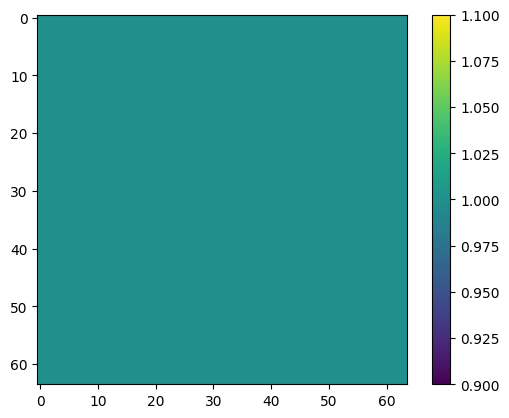

Epoch [1999/2000], Loss: 0.00010681237472454086
Epoch [3999/4000], Loss: 0.00012163544306531549


In [16]:

device='cpu'
input_size=stored_data.shape[1]
encoder_dim=32
num_hidden_layers=1
nonlin='tanh'
learn_lr=0.001
learn_iters=2000
params={
    'input_size':input_size,
    'encoder_dim':encoder_dim,
    'num_hidden_layers':num_hidden_layers,
    'nonlin':nonlin,
    'learn_lr':learn_lr,
    'learn_iters':learn_iters,
    'device':device,
    'recall_iters':100,
    'data_type':'continuous',
}

#plot settings
plot_weight_flag=True

#memristor variation and stuck at fault
mem_var=0.0
stuck_at_fault_rate=0.0
mask_0=1-stuck_0
mask_1=1-stuck_1

mem_stuck_mask=mask_0*mask_1
mem_stuck_mask=torch.from_numpy(mem_stuck_mask).float()
mem_stuck_mask=torch.ones(input_size,input_size)

# mem_stuck_mask=generate_mask(1,49,stuck_at_fault_rate)
plt.imshow(mem_stuck_mask)
plt.colorbar()
plt.show()




# create the network
hnn=SingleLayerHNN_lambda(input_size=input_size)
multi_hnn=MultiLayerHNN_beta(input_dim=input_size,encoding_dim=encoder_dim,num_hidden_layers=num_hidden_layers,nolinear=nonlin)


Hebb = HopfieldNet(num_neurons=input_size)
Storkey = HopfieldNet(num_neurons=input_size)
Pinv=HopfieldNet(num_neurons=input_size)
IterativeStorkey=HopfieldNet(num_neurons=input_size)

# train the network
Hebb.learn_patterns(stored_data, rule='Hebb',options={})
Storkey.learn_patterns(stored_data, rule='Storkey',options={})     
Pinv.learn_patterns(stored_data, rule='Pinv',options={})
IterativeStorkey.learn_patterns(stored_data, rule='IterativeStorkey',options={})  

optimizer_hnn = torch.optim.RMSprop(hnn.parameters(), lr=learn_lr)
optimizer_multi = torch.optim.RMSprop(multi_hnn.parameters(), lr=learn_lr)

hnn.set_mask(mask=mem_stuck_mask)
hnn.noise_level=mem_var*4
hnn_losses=train_multilayer_batch(hnn, optimizer_hnn, stored_data, learn_iters, device)
hnn.add_variation(var=mem_var)

multi_hnn.noise_level=mem_var*0
multi_hnn_losses=train_multilayer_batch(multi_hnn, optimizer_multi, stored_data, 2*learn_iters, device)
multi_hnn.add_variation(var=mem_var)

Hebb.add_weight_variation(variation=mem_var)
Storkey.add_weight_variation(variation=mem_var)
IterativeStorkey.add_weight_variation(variation=mem_var)
Pinv.add_weight_variation(variation=mem_var)
Hebb.add_mask(mask=mem_stuck_mask)
Storkey.add_mask(mask=mem_stuck_mask)
IterativeStorkey.add_mask(mask=mem_stuck_mask)
Pinv.add_mask(mask=mem_stuck_mask)


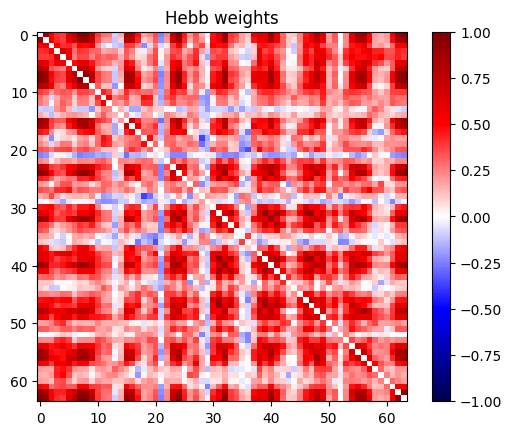

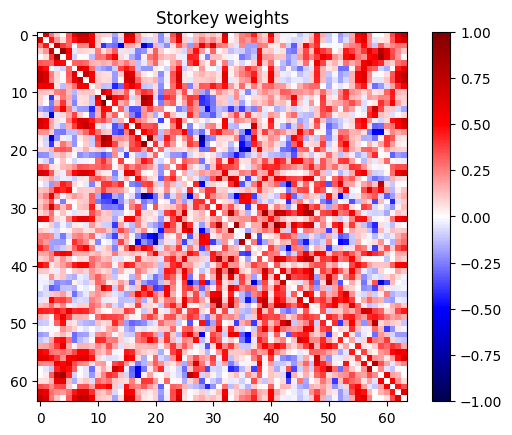

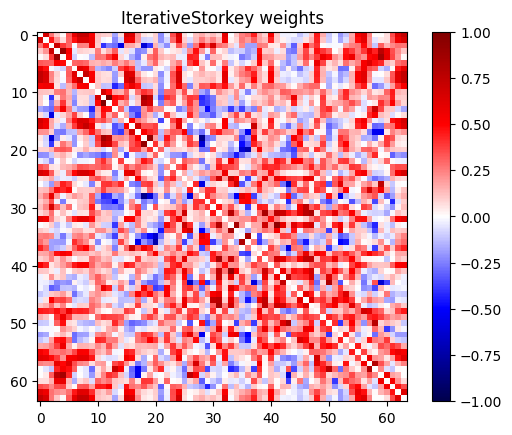

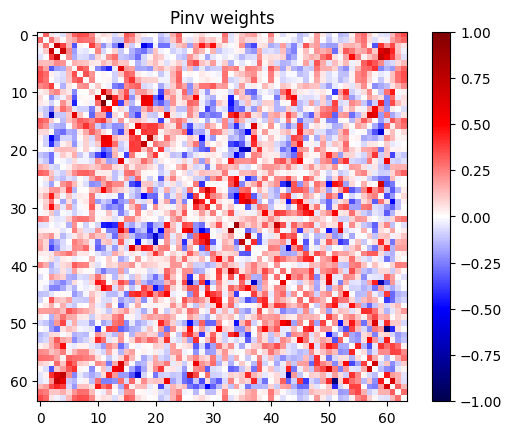

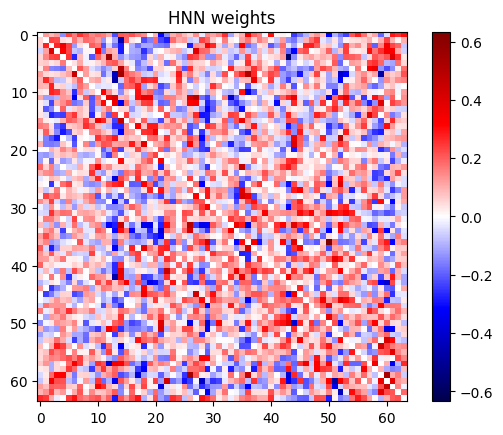

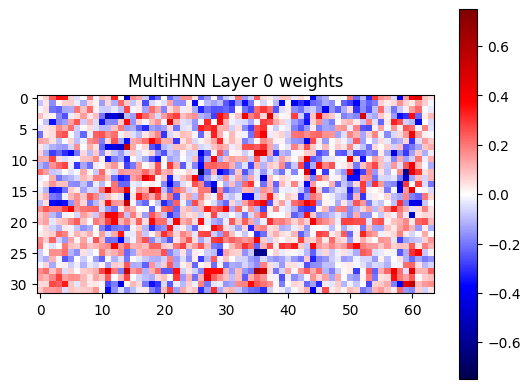

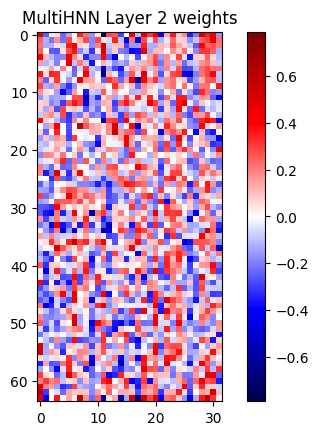

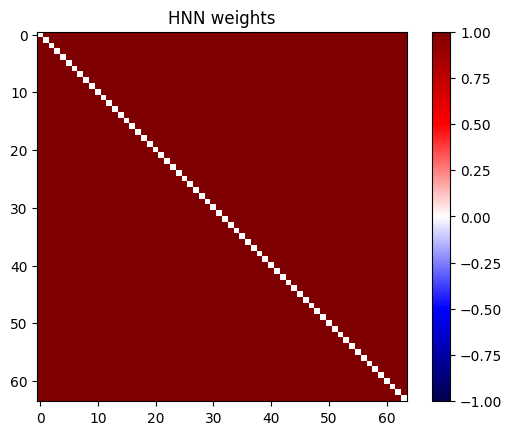

In [17]:
plot_weight_flag=True
if plot_weight_flag:
    plot_weight(to_np(Hebb.weights),'Hebb')
    plot_weight(to_np(Storkey.weights),'Storkey')
    plot_weight(to_np(IterativeStorkey.weights),'IterativeStorkey')
    plot_weight(to_np(Pinv.weights),'Pinv')
    plot_weight(to_np(hnn.linear.weight)*to_np(hnn.mask),'HNN')
    for i,layer in enumerate(multi_hnn.encoder):
        if i%2==0:
            plot_weight(to_np(multi_hnn.encoder[i].weight),f'MultiHNN Layer {i}')
    plot_weight(to_np(multi_hnn.decoder[0].weight),'MultiHNN Layer 2')

    plot_weight(to_np(hnn.mask),'HNN')

In [29]:
params['recall_iters']=100
params['mid_state']=True
test_data=np.array([add_gaussian_noise_continuous(d.reshape(8,8),0.3) for d in stored_data])
test_data=test_data.reshape(-1,input_size)
test_data = torch.from_numpy(test_data).float()

sync=True

# recall data
HNN_recall,HNN_mid_recall = singlelayer_recall(hnn, test_data, params)
MultiHNN_recall,MultiHNN_mid_recall=singlelayer_recall(multi_hnn, test_data, params)
Hebb_recall=Hebb.retrieve_pattern(test_data, sync=sync,chnn=False)
Storkey_recall=Storkey.retrieve_pattern(test_data, sync=sync,chnn=False)
IterativeStorkey_recall=IterativeStorkey.retrieve_pattern(test_data, sync=sync,chnn=False)
Pinv_recall=Pinv.retrieve_pattern(test_data, sync=sync,chnn=False)


In [25]:
def plot_recall(recall, model_name,fig_path, params):
    seq_len = recall.shape[0]
    num_per_row=params["plot_num_per_row"]
    num_row=math.ceil(seq_len/num_per_row)
    if seq_len<=num_per_row:
        num_per_row=seq_len
        num_row=1
    # Create a 2D array of subplots
    fig, axs = plt.subplots(num_row, num_per_row, figsize=(num_per_row, num_row))

    for j in range(seq_len):
        row, col = divmod(j, num_per_row)
        if seq_len==1:
            ax = axs
        else:
            ax = axs[col] if num_row == 1 else axs[row, col]
        if recall.shape[1]==784 or recall.shape[1]!=3072:
            n=int(math.sqrt(recall.shape[1]))
            if recall.shape[1]==392:
                n=28
            img=to_np(recall[j].reshape(n, math.ceil(recall.shape[1]/n)))
        else:
            img=to_np(recall[j].reshape((3, 32, 32)).permute(1, 2, 0))
        ax.imshow(img, cmap='viridis')
        ax.axis('off')
    # 如果子图的数量不是num_per_row的倍数，将其余的子图删除
    for i in range(seq_len, num_per_row * num_row):
        row, col = divmod(i, num_per_row)
        fig.delaxes(axs[row, col])
    plt.suptitle(model_name,y=1.0,fontsize=10)
    # plt.subplots_adjust(top=0.85)  # 调整标题和子图之间的间距
    plt.subplots_adjust(wspace=0.1, hspace=0.1)
    # plt.tight_layout()
    
    # Save as PNG file
    png_filename = fig_path + f'/{model_name}_len{seq_len}_data{params["data_type"]}_{params["data_set"]}_repeat{int(params["repeat"])}percen'
    plt.savefig(png_filename)
    print(f"Saved PNG file to: {png_filename}")
    
    # Save as SVG file with explicit error handling
    try:
        svg_filename = fig_path + f'/{model_name}_len{seq_len}_data{params["data_type"]}_{params["data_set"]}_repeat{int(params["repeat"])}percen.svg'
        plt.savefig(svg_filename, format='svg', dpi=300, bbox_inches='tight')
        print(f"Saved SVG file to: {svg_filename}")
    except Exception as e:
        print(f"Error saving SVG file: {e}")

Saved PNG file to: ./results/memristor_assocaite_memory/fig/GradientHNN_len10_datacontinuous_mnist_repeat10percen
Saved SVG file to: ./results/memristor_assocaite_memory/fig/GradientHNN_len10_datacontinuous_mnist_repeat10percen.svg


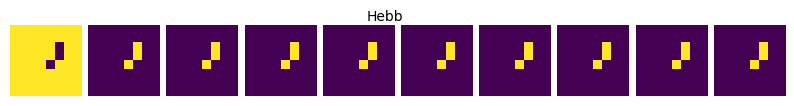

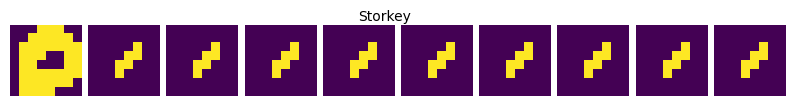

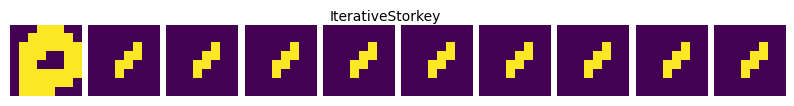

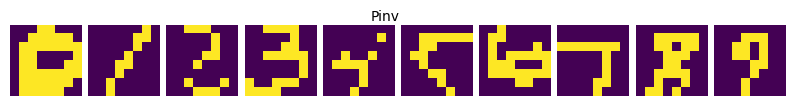

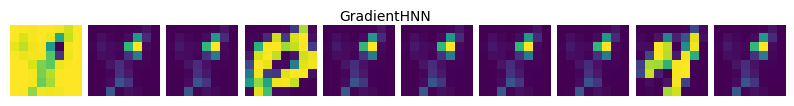

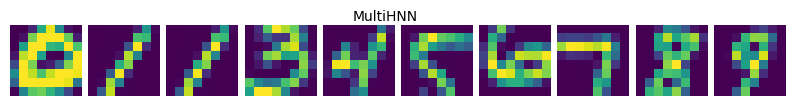

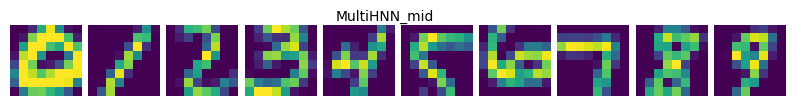

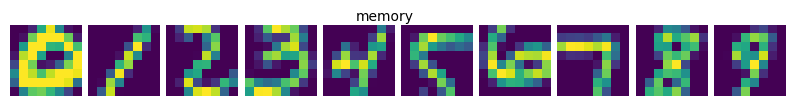

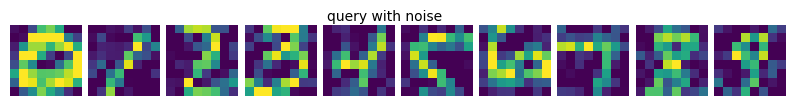

<Figure size 640x480 with 0 Axes>

In [30]:
path = 'memristor_assocaite_memory'
fig_path = os.path.join('./results/', path, 'fig')
if not os.path.exists(fig_path):
    os.makedirs(fig_path)

params['plot_num_per_row'] = 12
params['data_set'] = 'mnist'
params['repeat'] = 10
# plot recall data
plot_recalls(Hebb_recall, 'Hebb', fig_path, params)
plot_recalls(Storkey_recall, 'Storkey', fig_path, params)
plot_recalls(IterativeStorkey_recall, 'IterativeStorkey', fig_path, params)
plot_recalls(Pinv_recall, 'Pinv', fig_path, params)
plot_recall(HNN_recall, 'GradientHNN', fig_path, params)
plot_recalls(MultiHNN_recall, 'MultiHNN', fig_path, params)
plot_recalls(MultiHNN_mid_recall[1], 'MultiHNN_mid', fig_path, params)
# plot the original memories
plot_memory(stored_data, 1, fig_path, params)
plot_memory_noise(test_data, 1, fig_path, params)

In [22]:
# np.savez("associate_memory_multi_continuous_10.npz",encoder_weight=to_np(multi_hnn.encoder[0].weight),decoder_weight=to_np(multi_hnn.decoder[0].weight),patterns=stored_data)

np.savez("associate_memory_multi_continuous_hku.npz",encoder_weight=to_np(multi_hnn.encoder[0].weight),decoder_weight=to_np(multi_hnn.decoder[0].weight),patterns=stored_data)

### continuous pattern (contrast)

In [31]:
# load the stored patterns
num_patterns=10
stored_data=torch.from_numpy(new_mnist_data[0:num_patterns]).float()
stored_data_list=torch.from_numpy(new_mnist_data).float()
print(stored_data.shape)

def add_gaussian_noise_continuous(image, sigma=0.1):
    # 将图像和噪声都移到相同的设备上，例如cuda:0或cpu
    device = image.device
    noisy_image = image.clone()
    noise = torch.randn(image.size(), device=device) * sigma
    noisy_image = image + noise
    noisy_image = torch.clamp(noisy_image, -1, 1)  # 将像素值截断在0和1之间
    return noisy_image

torch.Size([10, 64])


In [57]:
n=405
num_samples = 10
stored_data_list=torch.from_numpy(new_mnist_data_order).float()
stored_data = stored_data_list[n::1000]
stored_data=stored_data[0:num_samples]

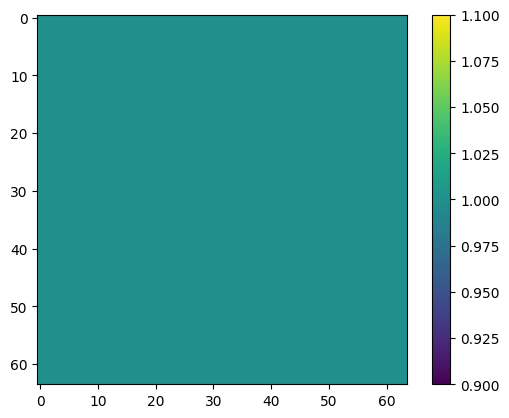

Epoch [19999/20000], Loss: 4.091647133463994e-05
Epoch [9999/10000], Loss: 7.973742322064936e-05
Epoch [19999/20000], Loss: 4.007936513517052e-05
Epoch [9999/10000], Loss: 0.00012041240552207455
Epoch [19999/20000], Loss: 2.5209199520759284e-05
Epoch [9999/10000], Loss: 0.00012428202899172902
Epoch [19999/20000], Loss: 2.791048609651625e-05
Epoch [9999/10000], Loss: 8.715540025150403e-05
Epoch [19999/20000], Loss: 2.640608545334544e-05
Epoch [9999/10000], Loss: 9.975237480830401e-05
Epoch [19999/20000], Loss: 1.5510911907767877e-05
Epoch [9999/10000], Loss: 0.00011655144044198096
Epoch [19999/20000], Loss: 1.818439704948105e-05
Epoch [9999/10000], Loss: 9.641263022786006e-05
Epoch [19999/20000], Loss: 1.3393478184298147e-05
Epoch [9999/10000], Loss: 9.718401997815818e-05
Epoch [19999/20000], Loss: 2.3802709620213136e-05
Epoch [9999/10000], Loss: 0.00012171712296549231
Epoch [19999/20000], Loss: 1.998209882003721e-05
Epoch [9999/10000], Loss: 9.672240412328392e-05
Epoch [19999/20000], L

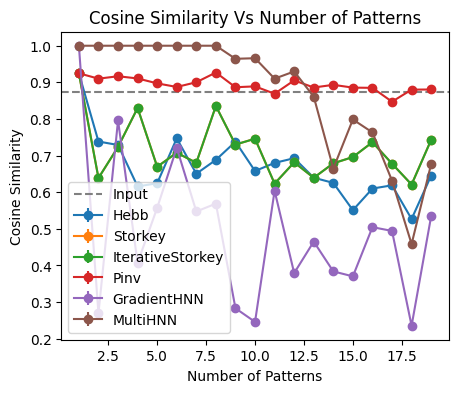

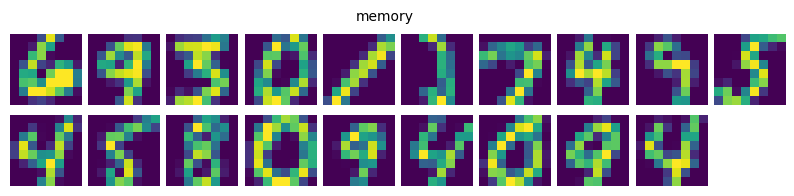

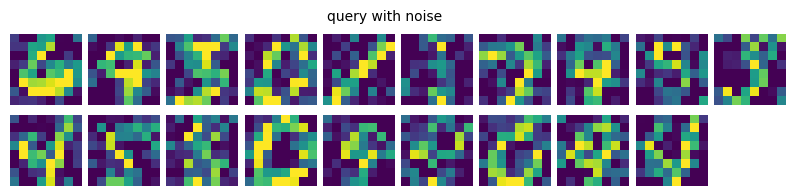

<Figure size 640x480 with 0 Axes>

In [58]:
device='cuda'
input_size=stored_data.shape[1]
encoder_dim=48
num_hidden_layers=1
nonlin='tanh'
learn_lr=0.001
learn_iters=10000
distance_type='cos'
params={
    'input_size':input_size,
    'encoder_dim':encoder_dim,
    'num_hidden_layers':num_hidden_layers,
    'nonlin':nonlin,
    'learn_lr':learn_lr,
    'learn_iters':learn_iters,
    'device':device,
    'recall_iters':100,
    'data_type':'continuous',
    'mid_state':False,
}



#plot settings
plot_weight_flag=True

#memristor variation and stuck at fault
num_pattern_list=np.arange(1,20,1)
stuck_at_fault_rate=0.0
mem_var=0.0
mask_0=1-stuck_0
mask_1=1-stuck_1
weight_decay=0.0

mem_stuck_mask=mask_0*mask_1
mem_stuck_mask=torch.from_numpy(mem_stuck_mask).float()
mem_stuck_mask=torch.ones(input_size,input_size)
# mem_stuck_mask=generate_mask(1,49,stuck_at_fault_rate)
plt.imshow(mem_stuck_mask)
plt.colorbar()
plt.show()





Hebb_similarity_list=[]
Storkey_similarity_list=[]
IterativeStorkey_similarity_list=[]
Pinv_similarity_list=[]
HNN_similarity_list=[]
MultiHNN_similarity_list=[]
num_simulations=10
for _ in range(num_simulations):
    for num_pattern in num_pattern_list:
        # 生成随机排列的索引
        random_indices = torch.randperm(stored_data_list.size(0))[:num_pattern]
        # 使用随机索引选择数据
        stored_data = stored_data_list[random_indices]

        # create the network
        hnn=SingleLayerHNN_lambda(input_size=input_size)
        multi_hnn=MultiLayerHNN_beta(input_dim=input_size,encoding_dim=encoder_dim,num_hidden_layers=num_hidden_layers,nolinear=nonlin)


        Hebb = HopfieldNet(num_neurons=input_size)
        Storkey = HopfieldNet(num_neurons=input_size)
        Pinv=HopfieldNet(num_neurons=input_size)
        IterativeStorkey=HopfieldNet(num_neurons=input_size)

        # train the network
        Hebb.learn_patterns(stored_data, rule='Hebb',options={})
        Storkey.learn_patterns(stored_data, rule='Storkey',options={})     
        Pinv.learn_patterns(stored_data, rule='Pinv',options={})
        IterativeStorkey.learn_patterns(stored_data, rule='IterativeStorkey',options={})  

        optimizer_hnn = torch.optim.RMSprop(hnn.parameters(), lr=learn_lr,weight_decay=weight_decay)
        optimizer_multi = torch.optim.RMSprop(multi_hnn.parameters(), lr=learn_lr/2,weight_decay=weight_decay)
        multi_hnn_losses=train_multilayer_batch(multi_hnn, optimizer_multi, stored_data, 2*learn_iters, device)
        hnn.set_mask(mask=mem_stuck_mask)
        hnn_losses=train_multilayer_batch(hnn, optimizer_hnn, stored_data, learn_iters, device)

        #corrupt the data
        params['recall_iters']=100
        test_data=np.array([add_gaussian_noise_continuous(d.reshape(8,8),0.5) for d in stored_data])
        test_data=test_data.reshape(-1,input_size)
        test_data = torch.from_numpy(test_data).float()



        hnn.add_variation(var=mem_var)
        Hebb.add_weight_variation(variation=mem_var)
        Storkey.add_weight_variation(variation=mem_var)
        IterativeStorkey.add_weight_variation(variation=mem_var)
        Pinv.add_weight_variation(variation=mem_var)


        Hebb.add_mask(mask=mem_stuck_mask)
        Storkey.add_mask(mask=mem_stuck_mask)
        IterativeStorkey.add_mask(mask=mem_stuck_mask)
        Pinv.add_mask(mask=mem_stuck_mask)



        # recall data
        HNN_recall = singlelayer_recall(hnn, test_data, params)
        MultiHNN_recall=singlelayer_recall(multi_hnn, test_data, params)
        Hebb_recall=Hebb.retrieve_pattern(test_data, sync=True,chnn=False)
        Storkey_recall=Storkey.retrieve_pattern(test_data, sync=True,chnn=False)
        IterativeStorkey_recall=IterativeStorkey.retrieve_pattern(test_data, sync=True,chnn=False)
        Pinv_recall=Pinv.retrieve_pattern(test_data, sync=True,chnn=False)

        # calculate similarity
        Hebb_similarity=torch.mean(calculate_sim(stored_data,Hebb_recall,distance_type=distance_type))
        Storkey_similarity=torch.mean(calculate_sim(stored_data,Storkey_recall,distance_type=distance_type))
        IterativeStorkey_similarity=torch.mean(calculate_sim(stored_data,IterativeStorkey_recall,distance_type=distance_type))
        Pinv_similarity=torch.mean(calculate_sim(stored_data,Pinv_recall,distance_type=distance_type))
        HNN_similarity=torch.mean(calculate_sim(stored_data,HNN_recall,distance_type=distance_type))
        MultiHNN_similarity=torch.mean(calculate_sim(stored_data,MultiHNN_recall,distance_type=distance_type))

        Hebb_similarity_list.append(to_np(Hebb_similarity))
        Storkey_similarity_list.append(to_np(Storkey_similarity))
        IterativeStorkey_similarity_list.append(to_np(IterativeStorkey_similarity))
        Pinv_similarity_list.append(to_np(Pinv_similarity))
        HNN_similarity_list.append(to_np(HNN_similarity))
        MultiHNN_similarity_list.append(to_np(MultiHNN_similarity))

input_similarities=torch.mean(calculate_sim(stored_data,test_data,distance_type=distance_type))
Hebb_similarity_list=np.array(Hebb_similarity_list).reshape(num_simulations,-1)
Storkey_similarity_list=np.array(Storkey_similarity_list).reshape(num_simulations,-1)
IterativeStorkey_similarity_list=np.array(IterativeStorkey_similarity_list).reshape(num_simulations,-1)
Pinv_similarity_list=np.array(Pinv_similarity_list).reshape(num_simulations,-1)
HNN_similarity_list=np.array(HNN_similarity_list).reshape(num_simulations,-1)
MultiHNN_similarity_list=np.array(MultiHNN_similarity_list).reshape(num_simulations,-1)

plt.figure(figsize=(5,4))
plt.errorbar(num_pattern_list,np.mean(Hebb_similarity_list,axis=0),yerr=np.std(Hebb_similarity_list,axis=0),label='Hebb',marker='o')
plt.errorbar(num_pattern_list,np.mean(Storkey_similarity_list,axis=0),yerr=np.std(Storkey_similarity_list,axis=0),label='Storkey',marker='o')
plt.errorbar(num_pattern_list,np.mean(IterativeStorkey_similarity_list,axis=0),yerr=np.std(IterativeStorkey_similarity_list,axis=0),label='IterativeStorkey',marker='o')
plt.errorbar(num_pattern_list,np.mean(Pinv_similarity_list,axis=0),yerr=np.std(Pinv_similarity_list,axis=0),label='Pinv',marker='o')
plt.errorbar(num_pattern_list,np.mean(HNN_similarity_list,axis=0),yerr=np.std(HNN_similarity_list,axis=0),label='GradientHNN',marker='o')
plt.errorbar(num_pattern_list,np.mean(MultiHNN_similarity_list,axis=0),yerr=np.std(MultiHNN_similarity_list,axis=0),label='MultiHNN',marker='o')
plt.axhline(y=input_similarities,label='Input',linestyle='--',color='gray')
plt.title('Cosine Similarity Vs Number of Patterns')
plt.xlabel('Number of Patterns')
plt.ylabel('Cosine Similarity')
plt.legend()
plt.show()



# plot setting
params['plot_num_per_row'] = 12
params['data_set'] = 'mnist'
params['repeat'] = 10
params['plot_num_per_row'] = 10
params['recall_iters']=100
params['mid_state']=False

plot_memory(stored_data, 1, fig_path, params)
plot_memory_noise(test_data, 1, fig_path, params)

In [59]:
np.savez('AssociateMemory_cont_48.npz',num_pattern_list=num_pattern_list,Hebb_similarity_list=Hebb_similarity_list,Storkey_similarity_list=Storkey_similarity_list,IterativeStorkey_similarity_list=IterativeStorkey_similarity_list,Pinv_similarity_list=Pinv_similarity_list,HNN_similarity_list=HNN_similarity_list,MultiHNN_similarity_list=MultiHNN_similarity_list,input_similarities=input_similarities)


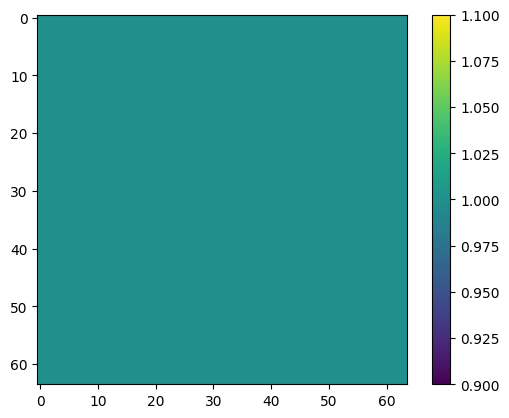

  5%|▌         | 1/20 [00:00<00:07,  2.57it/s]

Epoch [999/1000], Loss: 8.687042281962931e-05


 10%|█         | 2/20 [00:00<00:07,  2.49it/s]

Epoch [999/1000], Loss: 0.0001515021431259811


 15%|█▌        | 3/20 [00:01<00:07,  2.43it/s]

Epoch [999/1000], Loss: 0.00012786142178811133


 20%|██        | 4/20 [00:01<00:06,  2.41it/s]

Epoch [999/1000], Loss: 0.0001318908471148461


 25%|██▌       | 5/20 [00:02<00:06,  2.29it/s]

Epoch [999/1000], Loss: 0.0001611921179573983


 30%|███       | 6/20 [00:02<00:06,  2.27it/s]

Epoch [999/1000], Loss: 0.0001642912975512445


 35%|███▌      | 7/20 [00:02<00:05,  2.30it/s]

Epoch [999/1000], Loss: 0.00021895617828704417


 40%|████      | 8/20 [00:03<00:05,  2.30it/s]

Epoch [999/1000], Loss: 0.0002412554167676717


 45%|████▌     | 9/20 [00:03<00:04,  2.31it/s]

Epoch [999/1000], Loss: 0.00023251412494573742


 50%|█████     | 10/20 [00:04<00:04,  2.24it/s]

Epoch [999/1000], Loss: 0.00029910795274190605


 55%|█████▌    | 11/20 [00:05<00:04,  1.81it/s]

Epoch [1999/2000], Loss: 0.00021695459145121276


 60%|██████    | 12/20 [00:05<00:05,  1.58it/s]

Epoch [1999/2000], Loss: 0.00035963841946795583


 65%|██████▌   | 13/20 [00:06<00:04,  1.45it/s]

Epoch [1999/2000], Loss: 0.00036172076943330467


 70%|███████   | 14/20 [00:07<00:04,  1.39it/s]

Epoch [1999/2000], Loss: 0.00032954139169305563


 75%|███████▌  | 15/20 [00:08<00:03,  1.33it/s]

Epoch [1999/2000], Loss: 0.0005279608885757625


 80%|████████  | 16/20 [00:09<00:03,  1.29it/s]

Epoch [1999/2000], Loss: 0.0007760005537420511


 85%|████████▌ | 17/20 [00:10<00:02,  1.26it/s]

Epoch [1999/2000], Loss: 0.0007253522053360939


 90%|█████████ | 18/20 [00:10<00:01,  1.21it/s]

Epoch [1999/2000], Loss: 0.0006489472580142319


 95%|█████████▌| 19/20 [00:11<00:00,  1.14it/s]

Epoch [1999/2000], Loss: 0.0012585263466462493


100%|██████████| 20/20 [00:12<00:00,  1.55it/s]

Epoch [1999/2000], Loss: 0.0013636507792398334


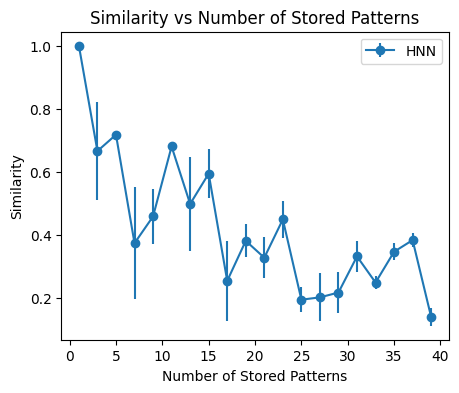

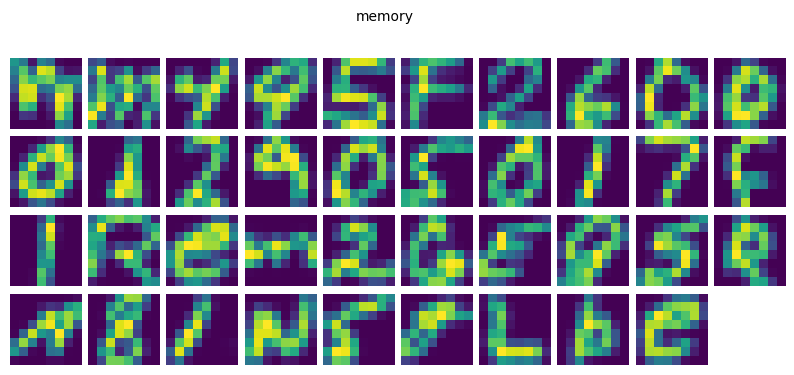

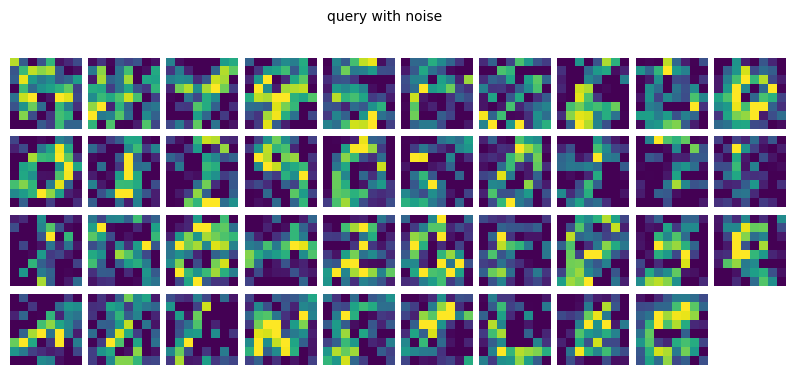

<Figure size 640x480 with 0 Axes>

In [38]:
#calculate the single layer HNN results
from tqdm import tqdm

EMNIST_chose=True

if EMNIST_chose:
    stored_data_list=torch.from_numpy(EMNIST_data).float()
device='cuda'
input_size=stored_data.shape[1]
encoder_dim=128
num_hidden_layers=1
nonlin='tanh'
learn_lr=0.001
learn_iters=10000
distance_type='cos'
params={
    'input_size':input_size,
    'encoder_dim':encoder_dim,
    'num_hidden_layers':num_hidden_layers,
    'nonlin':nonlin,
    'learn_lr':learn_lr,
    'learn_iters':learn_iters,
    'device':device,
    'recall_iters':100,
    'data_type':'continuous',
    'mid_state':False,
}


#plot settings
plot_weight_flag=True

#memristor variation and stuck at fault
num_simulations=10
num_pattern_list=np.arange(1,40,2)
stuck_at_fault_rate=0.0
mem_var=0.0
mask_0=1-stuck_0
mask_1=1-stuck_1
weight_decay=0.0

mem_stuck_mask=mask_0*mask_1
mem_stuck_mask=torch.from_numpy(mem_stuck_mask).float()
mem_stuck_mask=torch.ones(input_size,input_size)
# mem_stuck_mask=generate_mask(1,49,stuck_at_fault_rate)
plt.imshow(mem_stuck_mask)
plt.colorbar()
plt.show()

torch.manual_seed(1)
HNN_similarity_list=[]



for num_pattern in tqdm(num_pattern_list):
    if num_pattern>20:
        learn_iters=2000
        learn_lr=0.0003
    else: 
        learn_iters=1000
        learn_lr=0.001
    # 生成随机排列的索引
    random_indices = torch.randperm(stored_data_list.size(0))[:num_pattern]
    # 使用随机索引选择数据
    stored_data = stored_data_list[random_indices]
    # create the network
    hnn=SingleLayerHNN_lambda(input_size=input_size)
    optimizer_hnn = torch.optim.RMSprop(hnn.parameters(), lr=learn_lr,weight_decay=weight_decay)
    hnn.set_mask(mask=mem_stuck_mask)
    hnn_losses=train_multilayer_batch(hnn, optimizer_hnn, stored_data, learn_iters, device)
    #corrupt the data
    for _ in range(num_simulations):
        params['recall_iters']=100
        test_data=np.array([add_gaussian_noise_continuous(d.reshape(8,8),0.5) for d in stored_data])
        test_data=test_data.reshape(-1,input_size)
        test_data = torch.from_numpy(test_data).float()
        # recall data
        HNN_recall=singlelayer_recall(hnn, test_data, params)
        HNN_similarity=torch.mean(calculate_sim(stored_data,HNN_recall,distance_type=distance_type))
        HNN_similarity_list.append(to_np(HNN_similarity))
HNN_similarity_list=np.array(HNN_similarity_list).reshape(-1,num_simulations).T

if EMNIST_chose:
    np.savez(num_path+f'/HNN_Asso_EMNIST_cont.npz',num_pattern_list=num_pattern_list,HNN_similarity_list=HNN_similarity_list)
else:
    np.savez(num_path+f'/HNN_Asso_cont.npz',num_pattern_list=num_pattern_list,HNN_similarity_list=HNN_similarity_list)

plt.figure(figsize=(5,4))
plt.errorbar(num_pattern_list,np.mean(HNN_similarity_list,axis=0),yerr=np.std(HNN_similarity_list,axis=0),label='HNN',marker='o')
plt.xlabel('Number of Stored Patterns')
plt.ylabel('Similarity')
plt.title('Similarity vs Number of Stored Patterns')
plt.legend()
plt.show()



# plot setting
params['plot_num_per_row'] = 12
params['data_set'] = 'mnist'
params['repeat'] = 10
params['plot_num_per_row'] = 10
params['recall_iters']=100
params['mid_state']=False

plot_memory(stored_data, 1, fig_path, params)
plot_memory_noise(test_data, 1, fig_path, params)

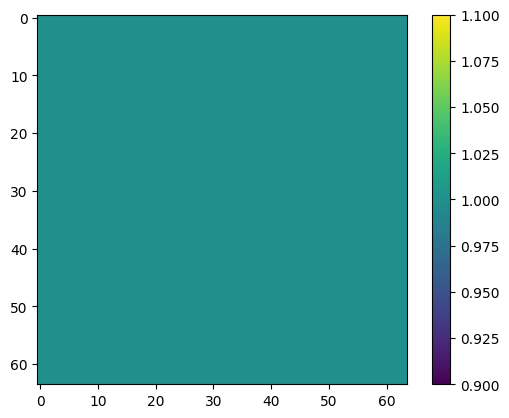

  5%|▌         | 1/20 [00:01<00:25,  1.33s/it]

Epoch [1999/2000], Loss: 0.0002590507210697979


 10%|█         | 2/20 [00:02<00:26,  1.49s/it]

Epoch [1999/2000], Loss: 9.14679912966676e-05


 15%|█▌        | 3/20 [00:04<00:27,  1.60s/it]

Epoch [1999/2000], Loss: 0.0011602096492424607


 20%|██        | 4/20 [00:06<00:26,  1.63s/it]

Epoch [1999/2000], Loss: 0.0006742319092154503


 25%|██▌       | 5/20 [00:08<00:24,  1.65s/it]

Epoch [1999/2000], Loss: 0.0008025011047720909


 30%|███       | 6/20 [00:09<00:23,  1.68s/it]

Epoch [1999/2000], Loss: 0.0009031656663864851


 35%|███▌      | 7/20 [00:11<00:21,  1.69s/it]

Epoch [1999/2000], Loss: 0.0013826891081407666


 40%|████      | 8/20 [00:13<00:19,  1.65s/it]

Epoch [1999/2000], Loss: 0.000984454876743257


 45%|████▌     | 9/20 [00:14<00:17,  1.57s/it]

Epoch [1999/2000], Loss: 0.0008824158576317132


 50%|█████     | 10/20 [00:15<00:15,  1.54s/it]

Epoch [1999/2000], Loss: 0.001419236185029149


 55%|█████▌    | 11/20 [00:17<00:13,  1.51s/it]

Epoch [1999/2000], Loss: 0.0010504124220460653


 60%|██████    | 12/20 [00:18<00:11,  1.48s/it]

Epoch [1999/2000], Loss: 0.0012216507457196712


 65%|██████▌   | 13/20 [00:20<00:10,  1.51s/it]

Epoch [1999/2000], Loss: 0.0009444226161576807


 70%|███████   | 14/20 [00:21<00:09,  1.55s/it]

Epoch [1999/2000], Loss: 0.0010527691338211298


 75%|███████▌  | 15/20 [00:23<00:08,  1.63s/it]

Epoch [1999/2000], Loss: 0.001144980895332992


 80%|████████  | 16/20 [00:25<00:06,  1.68s/it]

Epoch [1999/2000], Loss: 0.0011946117738261819
Epoch [1999/2000], Loss: 0.0012549982639029622


 85%|████████▌ | 17/20 [00:27<00:05,  1.72s/it]

Epoch [1999/2000], Loss: 0.002091191476210952


 95%|█████████▌| 19/20 [00:30<00:01,  1.71s/it]

Epoch [1999/2000], Loss: 0.0010613624472171068


100%|██████████| 20/20 [00:32<00:00,  1.62s/it]

Epoch [1999/2000], Loss: 0.00125935731921345


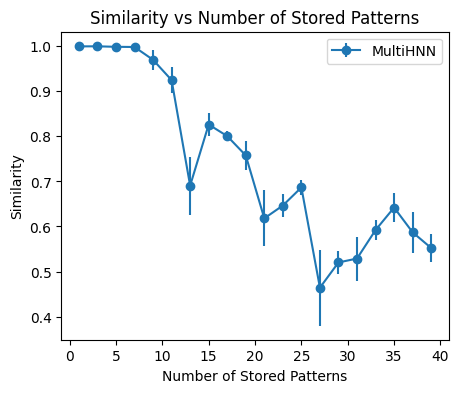

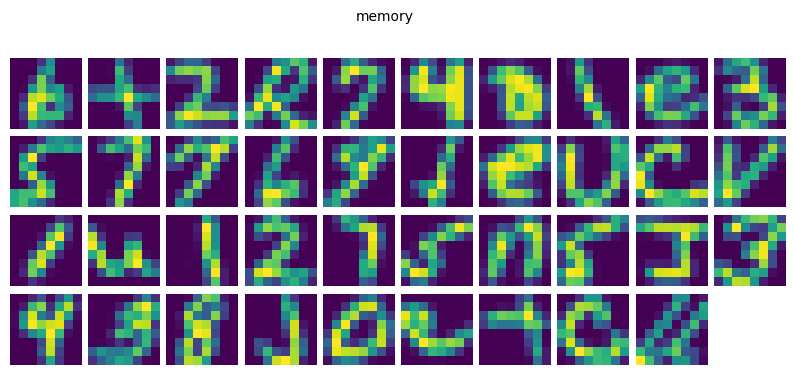

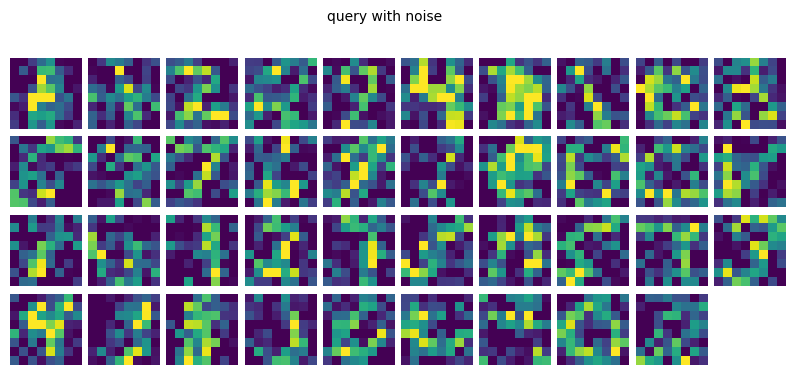

<Figure size 640x480 with 0 Axes>

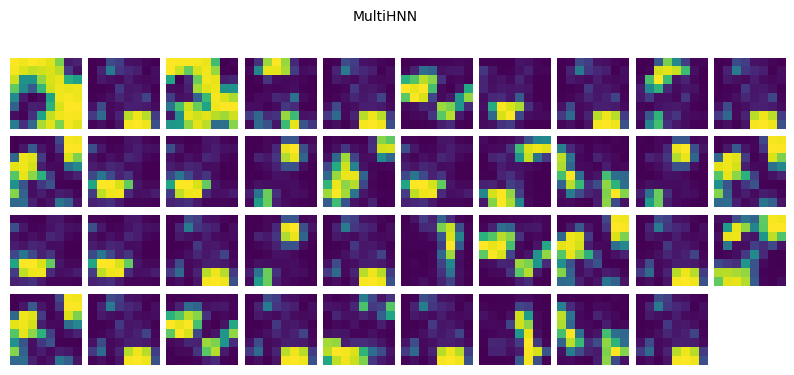

In [42]:
#calculate the multilayer results
from tqdm import tqdm


num_patterns=10
stored_data=torch.from_numpy(EMNIST_data[0:num_patterns]).float()
EMNIST_chose=True
if EMNIST_chose:
    stored_data_list=torch.from_numpy(EMNIST_data).float()

device='cuda'
input_size=stored_data.shape[1]
encoder_dim=64
num_hidden_layers=1
nonlin='tanh'
learn_lr=0.001
learn_iters=10000
distance_type='cos'
params={
    'input_size':input_size,
    'encoder_dim':encoder_dim,
    'num_hidden_layers':num_hidden_layers,
    'nonlin':nonlin,
    'learn_lr':learn_lr,
    'learn_iters':learn_iters,
    'device':device,
    'recall_iters':100,
    'data_type':'continuous',
    'mid_state':False,
}



#plot settings
plot_weight_flag=True

#memristor variation and stuck at fault
num_simulations=10
num_pattern_list=np.arange(1,40,2)
stuck_at_fault_rate=0.0
mem_var=0.0
mask_0=1-stuck_0
mask_1=1-stuck_1
weight_decay=0.0

mem_stuck_mask=mask_0*mask_1
mem_stuck_mask=torch.from_numpy(mem_stuck_mask).float()
mem_stuck_mask=torch.ones(input_size,input_size)
# mem_stuck_mask=generate_mask(1,49,stuck_at_fault_rate)
plt.imshow(mem_stuck_mask)
plt.colorbar()
plt.show()

torch.manual_seed(1)
MultiHNN_similarity_list=[]



for num_pattern in tqdm(num_pattern_list):
    if num_pattern>20:
        learn_iters=2000
        learn_lr=0.003
    else: 
        learn_iters=2000
        learn_lr=0.003
    # 生成随机排列的索引
    random_indices = torch.randperm(stored_data_list.size(0))[:num_pattern]
    # 使用随机索引选择数据
    stored_data = stored_data_list[random_indices]
    # create the network
    multi_hnn=MultiLayerHNN_beta(input_dim=input_size,encoding_dim=encoder_dim,num_hidden_layers=num_hidden_layers,nolinear=nonlin)
    optimizer_multi = torch.optim.RMSprop(multi_hnn.parameters(), lr=learn_lr,weight_decay=weight_decay)
    # optimizer_multi = torch.optim.Adam(multi_hnn.parameters(), lr=learn_lr,weight_decay=weight_decay)
    multi_hnn_losses=train_multilayer_batch(multi_hnn, optimizer_multi, stored_data, learn_iters, device)
    #corrupt the data
    for _ in range(num_simulations):
        params['recall_iters']=100
        test_data=np.array([add_gaussian_noise_continuous(d.reshape(8,8),0.5) for d in stored_data])
        test_data=test_data.reshape(-1,input_size)
        test_data = torch.from_numpy(test_data).float()
        # recall data
        MultiHNN_recall=singlelayer_recall(multi_hnn, test_data, params)
        MultiHNN_similarity=torch.mean(calculate_sim(stored_data,MultiHNN_recall,distance_type=distance_type))
        MultiHNN_similarity_list.append(to_np(MultiHNN_similarity))
MultiHNN_similarity_list=np.array(MultiHNN_similarity_list).reshape(-1,num_simulations).T

if EMNIST_chose:
    np.savez(num_path+f'/MultiLyaer_Asso_EMNIST_cont_{num_hidden_layers}_{encoder_dim}.npz',num_pattern_list=num_pattern_list,MultiHNN_similarity_list=MultiHNN_similarity_list)
else:
    np.savez(num_path+f'/MultiLyaer_Asso_cont_{num_hidden_layers}_{encoder_dim}.npz',num_pattern_list=num_pattern_list,MultiHNN_similarity_list=MultiHNN_similarity_list)

plt.figure(figsize=(5,4))
plt.errorbar(num_pattern_list,np.mean(MultiHNN_similarity_list,axis=0),yerr=np.std(MultiHNN_similarity_list,axis=0),label='MultiHNN',marker='o')
plt.xlabel('Number of Stored Patterns')
plt.ylabel('Similarity')
plt.title('Similarity vs Number of Stored Patterns')
plt.legend()
plt.show()



# plot setting
params['plot_num_per_row'] = 12
params['data_set'] = 'mnist'
params['repeat'] = 10
params['plot_num_per_row'] = 10
params['recall_iters']=100
params['mid_state']=False

plot_memory(stored_data, 1, fig_path, params)
plot_memory_noise(test_data, 1, fig_path, params)
plot_recalls(MultiHNN_recall, 'MultiHNN', fig_path, params)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


(10, 20)
(20,)


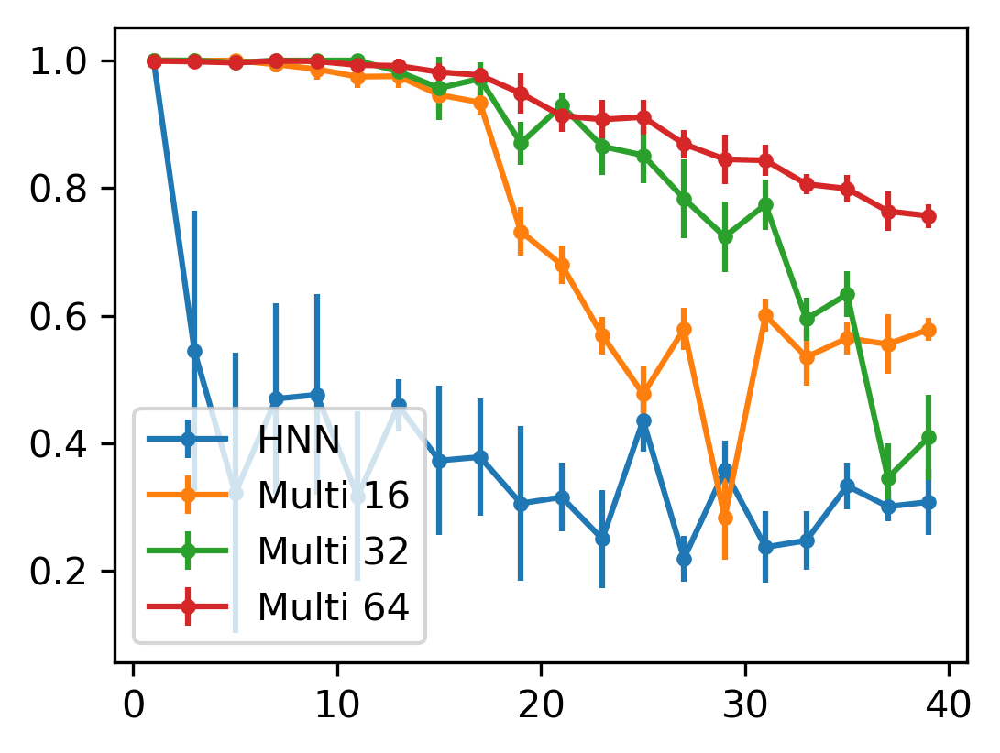

In [51]:
result=np.load('HNN_Asso_EMNIST_cont.npz')
HNN_similarity_list=result['HNN_similarity_list']
HNN_similarity_list=np.array(HNN_similarity_list)
HNN_similarity_list=HNN_similarity_list[:,0:20]
result=np.load('MultiLyaer_Asso_EMNIST_cont_1_16.npz')
num_pattern_list=result['num_pattern_list']

print(HNN_similarity_list.shape)
print(num_pattern_list.shape)
MultiHNN_similarity_list_16=result['MultiHNN_similarity_list']
result=np.load('MultiLyaer_Asso_EMNIST_cont_1_32.npz')
MultiHNN_similarity_list_32=result['MultiHNN_similarity_list']
result=np.load('MultiLyaer_Asso_EMNIST_cont_1_64.npz')
MultiHNN_similarity_list_64=result['MultiHNN_similarity_list']

plt.figure(figsize=(4,3),dpi=300)
plt.errorbar(num_pattern_list,np.mean(HNN_similarity_list,axis=0),yerr=np.std(HNN_similarity_list,axis=0),label='HNN',marker='.')
plt.errorbar(num_pattern_list,np.mean(MultiHNN_similarity_list_16,axis=0),yerr=np.std(MultiHNN_similarity_list_16,axis=0),label='Multi 16',marker='.')
plt.errorbar(num_pattern_list,np.mean(MultiHNN_similarity_list_32,axis=0),yerr=np.std(MultiHNN_similarity_list_32,axis=0),label='Multi 32',marker='.')
plt.errorbar(num_pattern_list,np.mean(MultiHNN_similarity_list_64,axis=0),yerr=np.std(MultiHNN_similarity_list_64,axis=0),label='Multi 64',marker='.')

# plt.title('Cosine Similarity Vs Number of Patterns')
# plt.xlabel('Number of Patterns')
# plt.ylabel('Cosine Similarity')
plt.legend()
plt.savefig('fig/MultiLayer_Asso_EMNIST_cont.eps',format='eps',bbox_inches='tight')
plt.show()


### continuous patterns (variation)

In [45]:
n=405
num_samples = 10
stored_data_list=torch.from_numpy(new_mnist_data_order).float()
stored_data = stored_data_list[n::1000]
stored_data=stored_data[0:num_samples]

In [43]:
stored_data=torch.from_numpy(hku_classes).float()

In [46]:
def add_gaussian_noise_continuous(image, sigma=0.1):
    # 将图像和噪声都移到相同的设备上，例如cuda:0或cpu
    device = image.device
    noisy_image = image.clone()
    noise = torch.randn(image.size(), device=device) * sigma
    noisy_image = image + noise
    noisy_image = torch.clamp(noisy_image, -1, 1)  # 将像素值截断在0和1之间
    return noisy_image
print(stored_data.shape)

torch.Size([10, 64])


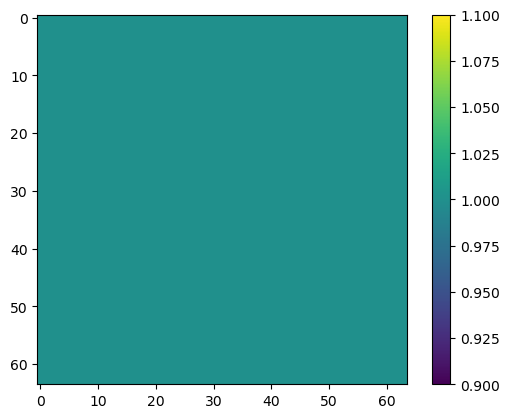

NameError: name 'add_gaussian_noise_continuous' is not defined

In [28]:
device='cuda'
input_size=stored_data.shape[1]
encoder_dim=32
num_hidden_layers=1
nonlin='tanh'
learn_lr=1e-2
learn_iters=200
distance_type='cos'
params={
    'input_size':input_size,
    'encoder_dim':encoder_dim,
    'num_hidden_layers':num_hidden_layers,
    'nonlin':nonlin,
    'learn_lr':learn_lr,
    'learn_iters':learn_iters,
    'device':device,
    'recall_iters':100,
    'data_type':'continuous',
    'mid_state':False,
}

#plot settings
plot_weight_flag=True

#memristor variation and stuck at fault
num_simulations=10
mem_var_list=np.arange(0,0.1,0.005)
stuck_at_fault_rate=0.0
mask_0=1-stuck_0
mask_1=1-stuck_1

mem_stuck_mask=mask_0*mask_1
mem_stuck_mask=torch.from_numpy(mem_stuck_mask).float()
mem_stuck_mask=torch.ones(input_size,input_size)
# mem_stuck_mask=generate_mask(1,49,stuck_at_fault_rate)
plt.imshow(mem_stuck_mask)
plt.colorbar()
plt.show()


Hebb = HopfieldNet(num_neurons=input_size)
Storkey = HopfieldNet(num_neurons=input_size)
Pinv=HopfieldNet(num_neurons=input_size)
IterativeStorkey=HopfieldNet(num_neurons=input_size)

# train the network
Hebb.learn_patterns(stored_data, rule='Hebb',options={})
Storkey.learn_patterns(stored_data, rule='Storkey',options={})     
Pinv.learn_patterns(stored_data, rule='Pinv',options={})
IterativeStorkey.learn_patterns(stored_data, rule='IterativeStorkey',options={})  



#corrupt the data
params['recall_iters']=100
test_data=np.array([add_gaussian_noise_continuous(d.reshape(8,8),0.5) for d in stored_data])
test_data=test_data.reshape(-1,input_size)
test_data = torch.from_numpy(test_data).float()


Hebb_similarity_list=[]
Storkey_similarity_list=[]
IterativeStorkey_similarity_list=[]
Pinv_similarity_list=[]
HNN_similarity_list=[]
MultiHNN_similarity_list=[]

for _ in range(num_simulations):
    learn_iters=200
    for mem_var in mem_var_list:
        # learn_iters+=20
        # create the network
        hnn=SingleLayerHNN_lambda(input_size=input_size)
        multi_hnn=MultiLayerHNN_beta(input_dim=input_size,encoding_dim=encoder_dim,num_hidden_layers=num_hidden_layers,nolinear=nonlin)

        optimizer_hnn = torch.optim.RMSprop(hnn.parameters(), lr=learn_lr)
        optimizer_multi = torch.optim.RMSprop(multi_hnn.parameters(), lr=learn_lr/2)

        # multi_hnn.noise_level=mem_var*0.2
        multi_hnn_losses=train_multilayer_hnn(multi_hnn, optimizer_multi, stored_data, 2*learn_iters, device)

        hnn.set_mask(mask=mem_stuck_mask)
        # hnn.noise_level=mem_var*4
        hnn_losses=train_multilayer_hnn(hnn, optimizer_hnn, stored_data, learn_iters, device)


        hnn.add_variation(var=mem_var)
        multi_hnn.add_variation(var=mem_var)
        Hebb.add_weight_variation(variation=mem_var)
        Storkey.add_weight_variation(variation=mem_var)
        IterativeStorkey.add_weight_variation(variation=mem_var)
        Pinv.add_weight_variation(variation=mem_var)


        Hebb.add_mask(mask=mem_stuck_mask)
        Storkey.add_mask(mask=mem_stuck_mask)
        IterativeStorkey.add_mask(mask=mem_stuck_mask)
        Pinv.add_mask(mask=mem_stuck_mask)



        # recall data
        HNN_recall = singlelayer_recall(hnn, test_data, params)
        MultiHNN_recall=singlelayer_recall(multi_hnn, test_data, params)
        Hebb_recall=Hebb.retrieve_pattern(test_data, sync=True,chnn=False)
        Storkey_recall=Storkey.retrieve_pattern(test_data, sync=True,chnn=False)
        IterativeStorkey_recall=IterativeStorkey.retrieve_pattern(test_data, sync=True,chnn=False)
        Pinv_recall=Pinv.retrieve_pattern(test_data, sync=True,chnn=False)

        # calculate similarity
        Hebb_similarity=torch.mean(calculate_sim(stored_data,Hebb_recall,distance_type=distance_type))
        Storkey_similarity=torch.mean(calculate_sim(stored_data,Storkey_recall,distance_type=distance_type))
        IterativeStorkey_similarity=torch.mean(calculate_sim(stored_data,IterativeStorkey_recall,distance_type=distance_type))
        Pinv_similarity=torch.mean(calculate_sim(stored_data,Pinv_recall,distance_type=distance_type))
        HNN_similarity=torch.mean(calculate_sim(stored_data,HNN_recall,distance_type=distance_type))
        MultiHNN_similarity=torch.mean(calculate_sim(stored_data,MultiHNN_recall,distance_type=distance_type))

        Hebb_similarity_list.append(to_np(Hebb_similarity))
        Storkey_similarity_list.append(to_np(Storkey_similarity))
        IterativeStorkey_similarity_list.append(to_np(IterativeStorkey_similarity))
        Pinv_similarity_list.append(to_np(Pinv_similarity))
        HNN_similarity_list.append(to_np(HNN_similarity))
        MultiHNN_similarity_list.append(to_np(MultiHNN_similarity))

input_similarities=torch.mean(calculate_sim(stored_data,test_data,distance_type=distance_type))
Hebb_similarity_list=np.array(Hebb_similarity_list).reshape(num_simulations,-1)
Storkey_similarity_list=np.array(Storkey_similarity_list).reshape(num_simulations,-1)
IterativeStorkey_similarity_list=np.array(IterativeStorkey_similarity_list).reshape(num_simulations,-1)
Pinv_similarity_list=np.array(Pinv_similarity_list).reshape(num_simulations,-1)
HNN_similarity_list=np.array(HNN_similarity_list).reshape(num_simulations,-1)
MultiHNN_similarity_list=np.array(MultiHNN_similarity_list).reshape(num_simulations,-1)

plt.figure(figsize=(5,4))
plt.errorbar(mem_var_list,np.mean(Hebb_similarity_list,axis=0),yerr=np.std(Hebb_similarity_list,axis=0),label='Hebb',marker='o')
plt.errorbar(mem_var_list,np.mean(Storkey_similarity_list,axis=0),yerr=np.std(Storkey_similarity_list,axis=0),label='Storkey',marker='o')
plt.errorbar(mem_var_list,np.mean(IterativeStorkey_similarity_list,axis=0),yerr=np.std(IterativeStorkey_similarity_list,axis=0),label='IterativeStorkey',marker='o')
plt.errorbar(mem_var_list,np.mean(Pinv_similarity_list,axis=0),yerr=np.std(Pinv_similarity_list,axis=0),label='Pinv',marker='o')
plt.errorbar(mem_var_list,np.mean(HNN_similarity_list,axis=0),yerr=np.std(HNN_similarity_list,axis=0),label='GradientHNN',marker='o')
plt.errorbar(mem_var_list,np.mean(MultiHNN_similarity_list,axis=0),yerr=np.std(MultiHNN_similarity_list,axis=0),label='MultiHNN',marker='o')
plt.axhline(y=input_similarities,label='Input',linestyle='--',color='gray')
plt.xlabel('Memristor Variation')
plt.ylabel('Similarity')
plt.title(f'Similarity vs Memristor Variation(num_pattern={num_pattern})')
plt.legend()
plt.show()



# plot setting
params['plot_num_per_row'] = 12
params['data_set'] = 'mnist'
params['repeat'] = 10
params['plot_num_per_row'] = 10
params['recall_iters']=100
params['mid_state']=False

plot_memory(stored_data, 1, fig_path, params)
plot_memory_noise(test_data, 1, fig_path, params)

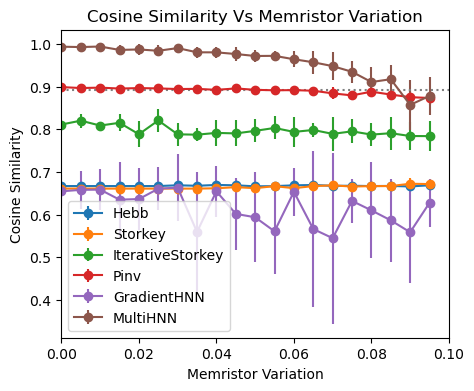

In [60]:
plt.figure(figsize=(5,4))
plt.errorbar(mem_var_list,np.mean(Hebb_similarity_list,axis=0),yerr=np.std(Hebb_similarity_list,axis=0),label='Hebb',marker='o')
plt.errorbar(mem_var_list,np.mean(Storkey_similarity_list,axis=0),yerr=np.std(Storkey_similarity_list,axis=0),label='Storkey',marker='o')
plt.errorbar(mem_var_list,np.mean(IterativeStorkey_similarity_list,axis=0),yerr=np.std(IterativeStorkey_similarity_list,axis=0),label='IterativeStorkey',marker='o')
plt.errorbar(mem_var_list,np.mean(Pinv_similarity_list,axis=0),yerr=np.std(Pinv_similarity_list,axis=0),label='Pinv',marker='o')
plt.errorbar(mem_var_list,np.mean(HNN_similarity_list,axis=0),yerr=np.std(HNN_similarity_list,axis=0),label='GradientHNN',marker='o')
plt.errorbar(mem_var_list,np.mean(MultiHNN_similarity_list,axis=0),yerr=np.std(MultiHNN_similarity_list,axis=0),label='MultiHNN',marker='o')
#画一条横线
plt.axhline(y=input_similarities,ls=":",c="gray")
plt.title('Cosine Similarity Vs Memristor Variation')
plt.xlabel('Memristor Variation')
plt.ylabel('Cosine Similarity')
plt.xlim([0,0.1])
plt.legend()


In [37]:
n=405
num_samples = 10
stored_data_list=torch.from_numpy(new_mnist_data_order).float()
stored_data = stored_data_list[n::1000]
stored_data=stored_data[0:num_samples]

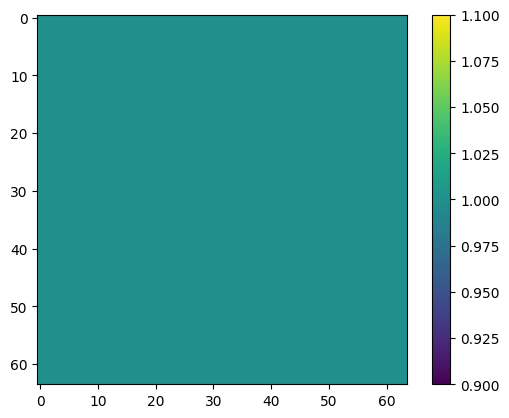

Epoch [9999/10000], Loss: 0.00010566682612989098


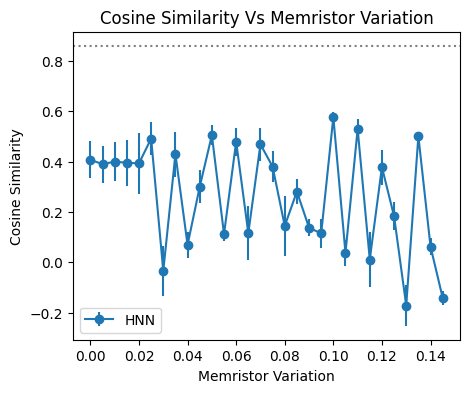

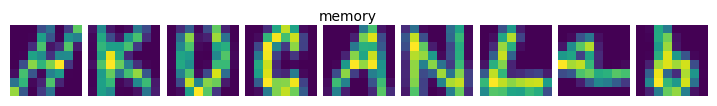

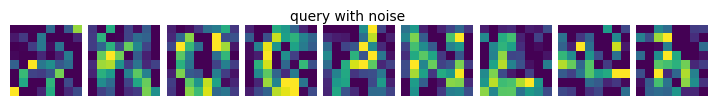

<Figure size 640x480 with 0 Axes>

In [44]:
#calculate the accuracy versus the memristor variation  in single HNN
device='cuda'
input_size=stored_data.shape[1]
encoder_dim=16
num_hidden_layers=1
nonlin='tanh'
learn_lr=1e-3
learn_iters=10000
distance_type='cos'
params={
    'input_size':input_size,
    'encoder_dim':encoder_dim,
    'num_hidden_layers':num_hidden_layers,
    'nonlin':nonlin,
    'learn_lr':learn_lr,
    'learn_iters':learn_iters,
    'device':device,
    'recall_iters':100,
    'data_type':'continuous',
    'mid_state':False,
}

# stored_data=torch.from_numpy(hku_classes).float()
#plot settings
plot_weight_flag=True

#memristor variation and stuck at fault
num_simulations=20
mem_var_list=np.arange(0,0.15,0.005)
stuck_at_fault_rate=0.0
mask_0=1-stuck_0
mask_1=1-stuck_1

mem_stuck_mask=mask_0*mask_1
mem_stuck_mask=torch.from_numpy(mem_stuck_mask).float()
mem_stuck_mask=torch.ones(input_size,input_size)
# mem_stuck_mask=generate_mask(1,49,stuck_at_fault_rate)
plt.imshow(mem_stuck_mask)
plt.colorbar()
plt.show()


HNN_similarity_list=[]


# create the network
hnn=SingleLayerHNN_lambda(input_size=input_size)
optimizer_hnn = torch.optim.RMSprop(hnn.parameters(), lr=learn_lr)
# multi_hnn.noise_level=mem_var*0.5
hnn.set_mask(mask=mem_stuck_mask)
hnn.noise_level=mem_var*0
hnn_losses=train_multilayer_batch(hnn, optimizer_hnn, stored_data, learn_iters, device)

torch.save(hnn.state_dict(), 'hnn_weights.pth')

for mem_var in mem_var_list:
    hnn.load_state_dict(torch.load('hnn_weights.pth'))
    hnn.add_variation(var=mem_var)
    for _ in range(num_simulations):
        #corrupt the data
        params['recall_iters']=100
        test_data=np.array([add_gaussian_noise_continuous(d.reshape(8,8),0.5) for d in stored_data])
        test_data=test_data.reshape(-1,input_size)
        test_data = torch.from_numpy(test_data).float()
        # recall data
        HNN_recall=singlelayer_recall(hnn, test_data, params)
        # calculate similarity
        HNN_similarity=torch.mean(calculate_sim(stored_data,HNN_recall,distance_type=distance_type))
        HNN_similarity_list.append(to_np(HNN_similarity))

HNN_similarity_list=np.array(HNN_similarity_list).reshape(-1,num_simulations).T
input_similarities=torch.mean(calculate_sim(stored_data,test_data,distance_type=distance_type))

np.savez(num_path+f'/HNN_Asso_cont_var.npz',mem_var_list=mem_var_list,HNN_similarity_list=HNN_similarity_list,input_similarities=input_similarities)

plt.figure(figsize=(5,4))
plt.errorbar(mem_var_list,np.mean(HNN_similarity_list,axis=0),yerr=np.std(HNN_similarity_list,axis=0),label='HNN',marker='o')
plt.axhline(y=input_similarities,ls=":",c="gray")
plt.title('Cosine Similarity Vs Memristor Variation')
plt.xlabel('Memristor Variation')
plt.ylabel('Cosine Similarity')
plt.legend()
plt.show()


# plot setting
params['plot_num_per_row'] = 12
params['data_set'] = 'mnist'
params['repeat'] = 10
params['plot_num_per_row'] = 10
params['recall_iters']=100
params['mid_state']=False

plot_memory(stored_data, 1, fig_path, params)
plot_memory_noise(test_data, 1, fig_path, params)

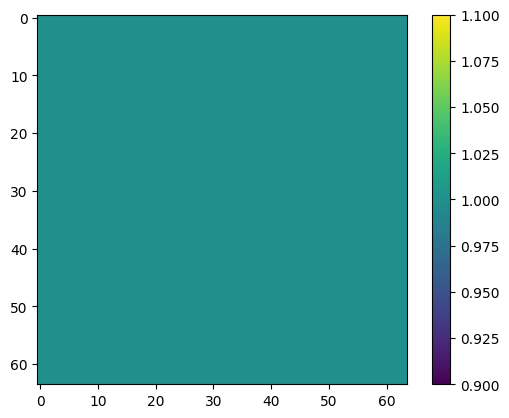

Epoch [39999/40000], Loss: 6.605761882383376e-06


/tmp/ipykernel_544907/1703878705.py:56: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  multi_hnn.load_state_dict(torch.load('multi_hnn_weights.pth'))


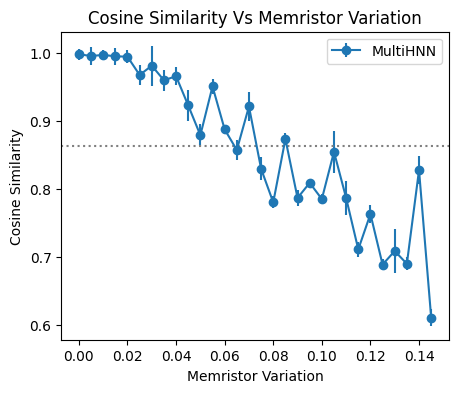

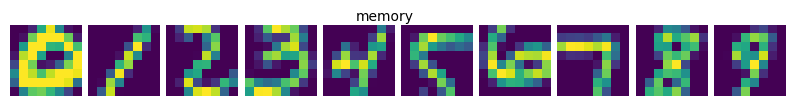

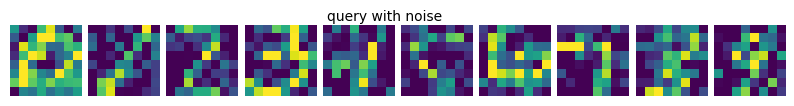

<Figure size 640x480 with 0 Axes>

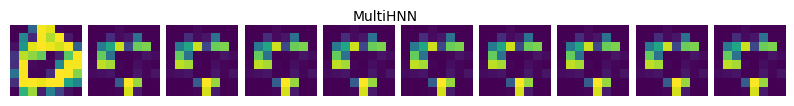

In [47]:
#calculate the accuracy versus the memristor variation

device='cuda'
input_size=stored_data.shape[1]
encoder_dim=32
num_hidden_layers=1
nonlin='tanh'
learn_lr=1e-3
learn_iters=20000
distance_type='cos'
params={
    'input_size':input_size,
    'encoder_dim':encoder_dim,
    'num_hidden_layers':num_hidden_layers,
    'nonlin':nonlin,
    'learn_lr':learn_lr,
    'learn_iters':learn_iters,
    'device':device,
    'recall_iters':100,
    'data_type':'continuous',
    'mid_state':False,
}

#plot settings
plot_weight_flag=True

#memristor variation and stuck at fault
num_simulations=20
mem_var_list=np.arange(0,0.15,0.005)
stuck_at_fault_rate=0.0
mask_0=1-stuck_0
mask_1=1-stuck_1

mem_stuck_mask=mask_0*mask_1
mem_stuck_mask=torch.from_numpy(mem_stuck_mask).float()
mem_stuck_mask=torch.ones(input_size,input_size)
# mem_stuck_mask=generate_mask(1,49,stuck_at_fault_rate)
plt.imshow(mem_stuck_mask)
plt.colorbar()
plt.show()


MultiHNN_similarity_list=[]


# create the network
multi_hnn=MultiLayerHNN_beta(input_dim=input_size,encoding_dim=encoder_dim,num_hidden_layers=num_hidden_layers,nolinear=nonlin)
optimizer_multi = torch.optim.RMSprop(multi_hnn.parameters(), lr=learn_lr/2)
# multi_hnn.noise_level=mem_var*0.5
multi_hnn_losses=train_multilayer_batch(multi_hnn, optimizer_multi, stored_data, 2*learn_iters, device)


torch.save(multi_hnn.state_dict(), 'multi_hnn_weights.pth')

for mem_var in mem_var_list:
    multi_hnn.load_state_dict(torch.load('multi_hnn_weights.pth'))
    multi_hnn.add_variation(var=mem_var)
    for _ in range(num_simulations):
        #corrupt the data
        params['recall_iters']=100
        test_data=np.array([add_gaussian_noise_continuous(d.reshape(8,8),0.5) for d in stored_data])
        test_data=test_data.reshape(-1,input_size)
        test_data = torch.from_numpy(test_data).float()
        # recall data
        MultiHNN_recall=singlelayer_recall(multi_hnn, test_data, params)
        # calculate similarity
        MultiHNN_similarity=torch.mean(calculate_sim(stored_data,MultiHNN_recall,distance_type=distance_type))
        MultiHNN_similarity_list.append(to_np(MultiHNN_similarity))

MultiHNN_similarity_list=np.array(MultiHNN_similarity_list).reshape(-1,num_simulations).T
input_similarities=torch.mean(calculate_sim(stored_data,test_data,distance_type=distance_type))

np.savez(num_path+f'/MultiLyaer_Asso_cont_{num_hidden_layers}_{encoder_dim}_var.npz',mem_var_list=mem_var_list,MultiHNN_similarity_list=MultiHNN_similarity_list,input_similarities=input_similarities)

plt.figure(figsize=(5,4))
plt.errorbar(mem_var_list,np.mean(MultiHNN_similarity_list,axis=0),yerr=np.std(MultiHNN_similarity_list,axis=0),label='MultiHNN',marker='o')
plt.axhline(y=input_similarities,ls=":",c="gray")
plt.title('Cosine Similarity Vs Memristor Variation')
plt.xlabel('Memristor Variation')
plt.ylabel('Cosine Similarity')
plt.legend()
plt.show()


# plot setting
params['plot_num_per_row'] = 12
params['data_set'] = 'mnist'
params['repeat'] = 10
params['plot_num_per_row'] = 10
params['recall_iters']=100
params['mid_state']=False

plot_memory(stored_data, 1, fig_path, params)
plot_memory_noise(test_data, 1, fig_path, params)
plot_recalls(MultiHNN_recall, 'MultiHNN', fig_path, params)

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


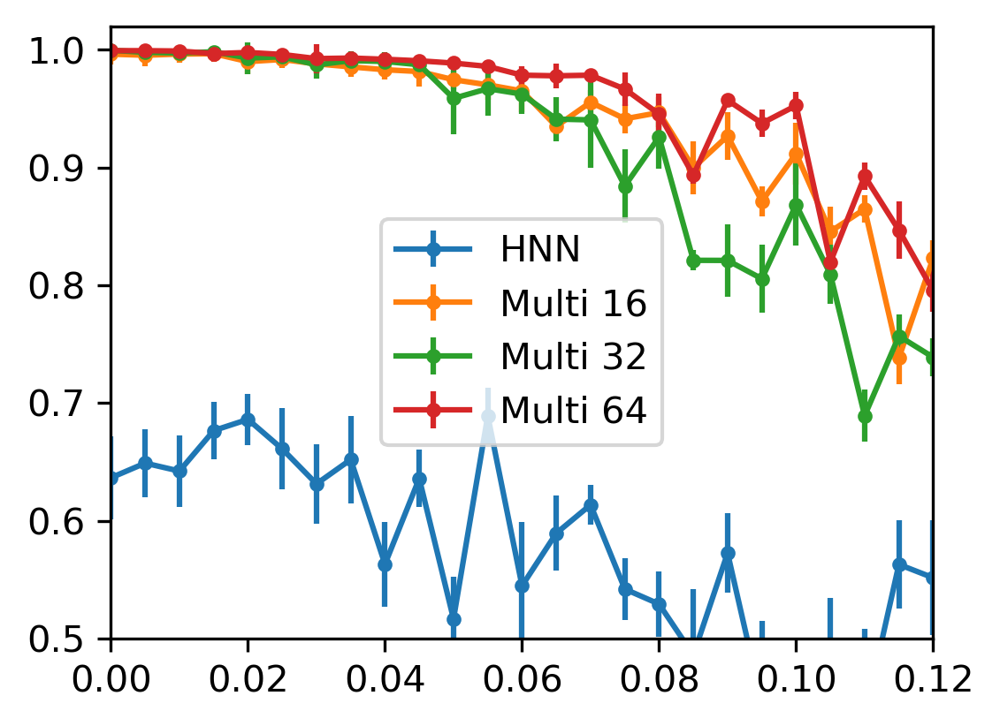

In [53]:
result=np.load('HNN_Asso_cont_var.npz')
HNN_similarity_list=result['HNN_similarity_list']
result=np.load('MultiLyaer_Asso_cont_1_16_var.npz')
mem_var_list=result['mem_var_list']
MultiHNN_similarity_list_16=result['MultiHNN_similarity_list']
result=np.load('MultiLyaer_Asso_cont_1_32_var.npz')
MultiHNN_similarity_list_32=result['MultiHNN_similarity_list']
result=np.load('MultiLyaer_Asso_cont_1_64_var.npz')
MultiHNN_similarity_list_64=result['MultiHNN_similarity_list']

# plot the results
plt.figure(figsize=(4,3),dpi=300)
plt.errorbar(mem_var_list,np.mean(HNN_similarity_list,axis=0),yerr=np.std(HNN_similarity_list,axis=0),label='HNN',marker='.')
plt.errorbar(mem_var_list,np.mean(MultiHNN_similarity_list_16,axis=0),yerr=np.std(MultiHNN_similarity_list_16,axis=0),label='Multi 16',marker='.')
plt.errorbar(mem_var_list,np.mean(MultiHNN_similarity_list_32,axis=0),yerr=np.std(MultiHNN_similarity_list_32,axis=0),label='Multi 32',marker='.')
plt.errorbar(mem_var_list,np.mean(MultiHNN_similarity_list_64,axis=0),yerr=np.std(MultiHNN_similarity_list_64,axis=0),label='Multi 64',marker='.')
# plt.title('Cosine Similarity Vs Memristor Variation')
# plt.xlabel('Memristor Variation')
# plt.ylabel('Cosine Similarity')
plt.xlim([0,0.12])
plt.ylim([0.5,1.02])
plt.legend()
plt.savefig('fig/MultiLayer_Asso_cont_var.eps',format='eps',bbox_inches='tight')
plt.show()


### continuous patterns (stuck at fault)

In [26]:
# load the stored patterns
num_pattern=10
stored_data=torch.from_numpy(new_mnist_data[0:num_pattern]).float()

def add_gaussian_noise_continuous(image, sigma=0.1):
    # 将图像和噪声都移到相同的设备上，例如cuda:0或cpu
    device = image.device
    noisy_image = image.clone()
    noise = torch.randn(image.size(), device=device) * sigma
    noisy_image = image + noise
    noisy_image = torch.clamp(noisy_image, -1, 1)  # 将像素值截断在0和1之间
    return noisy_image
print(stored_data.shape)

torch.Size([10, 64])


In [34]:
stored_data=torch.from_numpy(hku_classes).float()

Epoch [0/400], Epoch_Loss: 0.5449214667081833
Epoch [10/400], Epoch_Loss: 0.02226767232641578
Epoch [20/400], Epoch_Loss: 0.010950296372175218
Epoch [30/400], Epoch_Loss: 0.006142576481215656
Epoch [40/400], Epoch_Loss: 0.006040214817039669
Epoch [50/400], Epoch_Loss: 0.005209951917640864
Epoch [60/400], Epoch_Loss: 0.00578178835567087
Epoch [70/400], Epoch_Loss: 0.006242456892505288
Epoch [80/400], Epoch_Loss: 0.003862062352709472
Epoch [90/400], Epoch_Loss: 0.004830816201865673
Epoch [100/400], Epoch_Loss: 0.00725170646328479
Epoch [110/400], Epoch_Loss: 0.004171041166409851
Epoch [120/400], Epoch_Loss: 0.005476181488484144
Epoch [130/400], Epoch_Loss: 0.005691655911505222
Epoch [140/400], Epoch_Loss: 0.004545532411430031
Epoch [150/400], Epoch_Loss: 0.004829883854836225
Epoch [160/400], Epoch_Loss: 0.004143767454661429
Epoch [170/400], Epoch_Loss: 0.004442598600871862
Epoch [180/400], Epoch_Loss: 0.005007684184238315
Epoch [190/400], Epoch_Loss: 0.005467686126939953
Epoch [200/400],

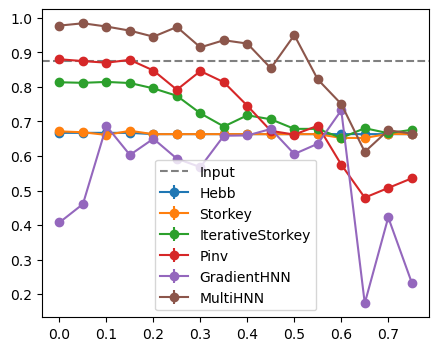

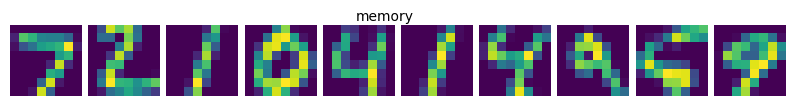

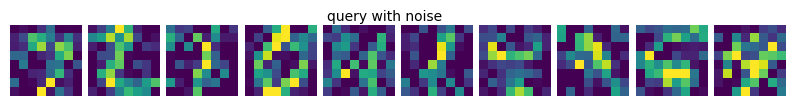

<Figure size 640x480 with 0 Axes>

In [24]:

device='cpu'
input_size=stored_data.shape[1]
encoder_dim=32
num_hidden_layers=1
nonlin='tanh'
learn_lr=0.01
learn_iters=200
distance_type='cos'
params={
    'input_size':input_size,
    'encoder_dim':encoder_dim,
    'num_hidden_layers':num_hidden_layers,
    'nonlin':nonlin,
    'learn_lr':learn_lr,
    'learn_iters':learn_iters,
    'device':device,
    'recall_iters':100,
    'data_type':'continuous',
    'plot_num_per_row':10,
    'data_set':'mnist',
    'repeat':0,
}

#plot settings
plot_weight_flag=True
num_simulations=10
#memristor variation and stuck at fault
mem_var=0.05
stuck_at_fault_list=np.arange(0,0.8,0.05)



Hebb_similarity_list=[]
Storkey_similarity_list=[]
IterativeStorkey_similarity_list=[]
Pinv_similarity_list=[]
HNN_similarity_list=[]
MultiHNN_similarity_list=[]
input_similarities_list=[]

for i in range (num_simulations):
    for stuck_at_fault_rate in stuck_at_fault_list:
        # create the network
        hnn=SingleLayerHNN_lambda(input_size=input_size)
        multi_hnn=MultiLayerHNN_beta(input_dim=input_size,encoding_dim=encoder_dim,num_hidden_layers=num_hidden_layers,nolinear=nonlin,noise_level=0.0,mask_prob=stuck_at_fault_rate)


        Hebb = HopfieldNet(num_neurons=input_size)
        Storkey = HopfieldNet(num_neurons=input_size)
        Pinv=HopfieldNet(num_neurons=input_size)
        IterativeStorkey=HopfieldNet(num_neurons=input_size)

        # train the network
        Hebb.learn_patterns(stored_data, rule='Hebb',options={})
        Storkey.learn_patterns(stored_data, rule='Storkey',options={})     
        Pinv.learn_patterns(stored_data, rule='Pinv',options={})
        IterativeStorkey.learn_patterns(stored_data, rule='IterativeStorkey',options={})  

        optimizer_hnn = torch.optim.RMSprop(hnn.parameters(), lr=learn_lr)
        optimizer_multi = torch.optim.RMSprop(multi_hnn.parameters(), lr=learn_lr/2)

        multi_hnn.noise_level=mem_var*0.1
        multi_hnn_losses=train_multilayer_hnn(multi_hnn, optimizer_multi, stored_data, 2*learn_iters, device)

        mem_stuck_mask=generate_mask(input_size,stuck_at_fault_rate,seed=1)
        hnn.set_mask(mask=mem_stuck_mask)
        # hnn.noise_level=mem_var*4
        hnn_losses=train_multilayer_hnn(hnn, optimizer_hnn, stored_data, learn_iters, device)

        hnn.add_variation(var=mem_var)
        multi_hnn.add_variation(var=mem_var)
        Hebb.add_weight_variation(variation=mem_var)
        Storkey.add_weight_variation(variation=mem_var)
        IterativeStorkey.add_weight_variation(variation=mem_var)
        Pinv.add_weight_variation(variation=mem_var)
        
        Hebb.add_mask(mask=mem_stuck_mask)
        Storkey.add_mask(mask=mem_stuck_mask)
        IterativeStorkey.add_mask(mask=mem_stuck_mask)
        Pinv.add_mask(mask=mem_stuck_mask)

        # recall setting
        params['recall_iters']=100
        test_data=np.array([add_gaussian_noise_continuous(d.reshape(8,8),0.5) for d in stored_data])
        test_data=test_data.reshape(-1,input_size)
        test_data = torch.from_numpy(test_data).float()

        # recall data
        HNN_recall = singlelayer_recall(hnn, test_data, params)
        MultiHNN_recall=singlelayer_recall(multi_hnn, test_data, params)
        Hebb_recall=Hebb.retrieve_pattern(test_data, sync=True,chnn=False)
        Storkey_recall=Storkey.retrieve_pattern(test_data, sync=True,chnn=False)
        IterativeStorkey_recall=IterativeStorkey.retrieve_pattern(test_data, sync=True,chnn=False)
        Pinv_recall=Pinv.retrieve_pattern(test_data, sync=True,chnn=False)

        print(type(stored_data))
        # calculate similarity
        Hebb_similarity=torch.mean(calculate_sim(stored_data,Hebb_recall,distance_type=distance_type))
        Storkey_similarity=torch.mean(calculate_sim(stored_data,Storkey_recall,distance_type=distance_type))
        IterativeStorkey_similarity=torch.mean(calculate_sim(stored_data,IterativeStorkey_recall,distance_type=distance_type))
        Pinv_similarity=torch.mean(calculate_sim(stored_data,Pinv_recall,distance_type=distance_type))
        HNN_similarity=torch.mean(calculate_sim(stored_data,HNN_recall,distance_type=distance_type))
        MultiHNN_similarity=torch.mean(calculate_sim(stored_data,MultiHNN_recall,distance_type=distance_type))

        Hebb_similarity_list.append(to_np(Hebb_similarity).item())
        Storkey_similarity_list.append(to_np(Storkey_similarity).item())
        IterativeStorkey_similarity_list.append(to_np(IterativeStorkey_similarity).item())
        Pinv_similarity_list.append(to_np(Pinv_similarity).item())
        HNN_similarity_list.append(to_np(HNN_similarity).item())
        MultiHNN_similarity_list.append(to_np(MultiHNN_similarity).item())

        input_similarities_list.append(to_np(torch.mean(calculate_sim(stored_data,test_data,distance_type=distance_type))).item())
input_similarities=np.mean(input_similarities_list)
results={}
results['Hebb_similarity_list']=Hebb_similarity_list
results['Storkey_similarity_list']=Storkey_similarity_list
results['IterativeStorkey_similarity_list']=IterativeStorkey_similarity_list
results['Pinv_similarity_list']=Pinv_similarity_list
results['HNN_similarity_list']=HNN_similarity_list
results['MultiHNN_similarity_list']=MultiHNN_similarity_list
results['stuck_at_fault_list']=stuck_at_fault_list.tolist()
results['mem_var']=mem_var
results['input_similarities']=input_similarities.item()

print(results)
json.dump(results, open(num_path + f"/memristor_stuck_at_fault_variation={mem_var}_datatype={params['data_type']}_numiter={params['learn_iters']}.json", 'w'))

Hebb_similarity_list=np.array(Hebb_similarity_list).reshape(num_simulations,-1)
Storkey_similarity_list=np.array(Storkey_similarity_list).reshape(num_simulations,-1)
IterativeStorkey_similarity_list=np.array(IterativeStorkey_similarity_list).reshape(num_simulations,-1)
Pinv_similarity_list=np.array(Pinv_similarity_list).reshape(num_simulations,-1)
HNN_similarity_list=np.array(HNN_similarity_list).reshape(num_simulations,-1)
MultiHNN_similarity_list=np.array(MultiHNN_similarity_list).reshape(num_simulations,-1)


plt.figure(figsize=(5,4))
plt.errorbar(stuck_at_fault_list,np.mean(Hebb_similarity_list,axis=0),yerr=np.std(Hebb_similarity_list,axis=0),label='Hebb',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(Storkey_similarity_list,axis=0),yerr=np.std(Storkey_similarity_list,axis=0),label='Storkey',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(IterativeStorkey_similarity_list,axis=0),yerr=np.std(IterativeStorkey_similarity_list,axis=0),label='IterativeStorkey',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(Pinv_similarity_list,axis=0),yerr=np.std(Pinv_similarity_list,axis=0),label='Pinv',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(HNN_similarity_list,axis=0),yerr=np.std(HNN_similarity_list,axis=0),label='GradientHNN',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(MultiHNN_similarity_list,axis=0),yerr=np.std(MultiHNN_similarity_list,axis=0),label='MultiHNN',marker='o')
plt.axhline(y=input_similarities,label='Input',linestyle='--',color='gray')
plt.legend()

# plot_recalls(Pinv_recall, 'Pinv', fig_path, params)
# plot_recalls(HNN_recall, 'HNN', fig_path, params)
plot_memory(stored_data, 1, fig_path, params)
plot_memory_noise(test_data, 1, fig_path, params)

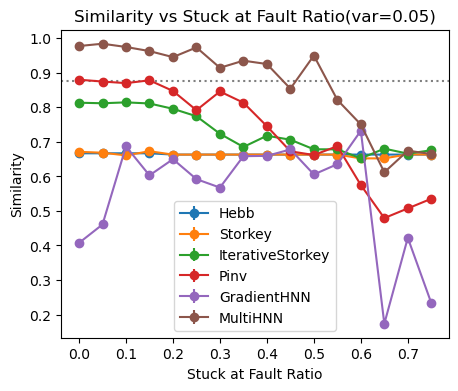

In [35]:
mem_var=0.05
data_type='continuous'
learn_iters=200
# 指定JSON文件路径
json_file_path = num_path + f"/memristor_stuck_at_fault_variation={mem_var}_datatype={data_type}_numiter={params['learn_iters']}.json"
# 从JSON文件中读取数据
with open(json_file_path, 'r') as json_file:
    data = json.load(json_file)
Hebb_similarity_list=data['Hebb_similarity_list']
Storkey_similarity_list=data['Storkey_similarity_list']
IterativeStorkey_similarity_list=data['IterativeStorkey_similarity_list']
Pinv_similarity_list=data['Pinv_similarity_list']
HNN_similarity_list=data['HNN_similarity_list']
MultiHNN_similarity_list=data['MultiHNN_similarity_list']
stuck_at_fault_list=data['stuck_at_fault_list']
input_similarities=data['input_similarities']

Hebb_similarity_list=np.array(Hebb_similarity_list).reshape(num_simulations,-1)
Storkey_similarity_list=np.array(Storkey_similarity_list).reshape(num_simulations,-1)
IterativeStorkey_similarity_list=np.array(IterativeStorkey_similarity_list).reshape(num_simulations,-1)
Pinv_similarity_list=np.array(Pinv_similarity_list).reshape(num_simulations,-1)
HNN_similarity_list=np.array(HNN_similarity_list).reshape(num_simulations,-1)
MultiHNN_similarity_list=np.array(MultiHNN_similarity_list).reshape(num_simulations,-1)

plt.figure(figsize=(5,4),dpi=100)
plt.errorbar(stuck_at_fault_list,np.mean(Hebb_similarity_list,axis=0),yerr=np.std(Hebb_similarity_list,axis=0),label='Hebb',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(Storkey_similarity_list,axis=0),yerr=np.std(Storkey_similarity_list,axis=0),label='Storkey',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(IterativeStorkey_similarity_list,axis=0),yerr=np.std(IterativeStorkey_similarity_list,axis=0),label='IterativeStorkey',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(Pinv_similarity_list,axis=0),yerr=np.std(Pinv_similarity_list,axis=0),label='Pinv',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(HNN_similarity_list,axis=0),yerr=np.std(HNN_similarity_list,axis=0),label='GradientHNN',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(MultiHNN_similarity_list,axis=0),yerr=np.std(MultiHNN_similarity_list,axis=0),label='MultiHNN',marker='o')
plt.axhline(y=input_similarities,ls=":",c="gray")
plt.title(f'Similarity vs Stuck at Fault Ratio(var={mem_var})')
plt.xlabel('Stuck at Fault Ratio')
plt.ylabel('Similarity')
# plt.errorbar(stuck_at_fault_list,np.mean(MultiHNN_similarity_list,axis=0),yerr=np.std(MultiHNN_similarity_list,axis=0),label='MultiHNN',marker='o')
plt.legend()

  5%|▌         | 1/20 [00:03<01:12,  3.83s/it]

Epoch [9999/10000], Loss: 0.00010537911293795332


 10%|█         | 2/20 [00:07<01:09,  3.88s/it]

Epoch [9999/10000], Loss: 9.626560495235026e-05


 15%|█▌        | 3/20 [00:11<01:05,  3.87s/it]

Epoch [9999/10000], Loss: 8.860267553245649e-05


 20%|██        | 4/20 [00:15<01:01,  3.82s/it]

Epoch [9999/10000], Loss: 7.93265353422612e-05


 25%|██▌       | 5/20 [00:19<00:59,  3.94s/it]

Epoch [9999/10000], Loss: 7.049125269986689e-05


 30%|███       | 6/20 [00:23<00:55,  3.95s/it]

Epoch [9999/10000], Loss: 6.243680400075391e-05


 35%|███▌      | 7/20 [00:27<00:50,  3.88s/it]

Epoch [9999/10000], Loss: 5.5107804655563086e-05


 40%|████      | 8/20 [00:30<00:46,  3.83s/it]

Epoch [9999/10000], Loss: 4.76866407552734e-05


 45%|████▌     | 9/20 [00:34<00:42,  3.82s/it]

Epoch [9999/10000], Loss: 4.1743358451640233e-05


 50%|█████     | 10/20 [00:38<00:38,  3.84s/it]

Epoch [9999/10000], Loss: 3.5900484363082796e-05


 55%|█████▌    | 11/20 [00:42<00:34,  3.87s/it]

Epoch [9999/10000], Loss: 3.060435483348556e-05


 60%|██████    | 12/20 [00:46<00:30,  3.87s/it]

Epoch [9999/10000], Loss: 2.646155917318538e-05


 65%|██████▌   | 13/20 [00:50<00:27,  3.89s/it]

Epoch [9999/10000], Loss: 2.232058068329934e-05


 70%|███████   | 14/20 [00:54<00:23,  3.89s/it]

Epoch [9999/10000], Loss: 2.514022526156623e-05


 75%|███████▌  | 15/20 [00:58<00:19,  3.91s/it]

Epoch [9999/10000], Loss: 2.5846422431641258e-05


 80%|████████  | 16/20 [01:02<00:15,  3.93s/it]

Epoch [9999/10000], Loss: 7.705388270551339e-05


 85%|████████▌ | 17/20 [01:06<00:11,  3.92s/it]

Epoch [9999/10000], Loss: 0.0005814047181047499


 90%|█████████ | 18/20 [01:10<00:08,  4.08s/it]

Epoch [9999/10000], Loss: 0.010467405430972576


 95%|█████████▌| 19/20 [01:14<00:04,  4.05s/it]

Epoch [9999/10000], Loss: 0.05639393627643585


100%|██████████| 20/20 [01:18<00:00,  3.92s/it]

Epoch [9999/10000], Loss: 0.11888188868761063


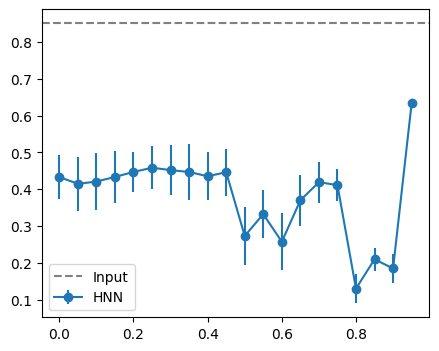

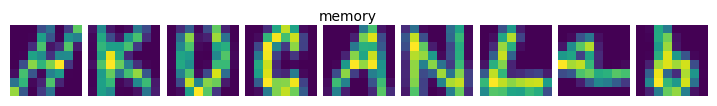

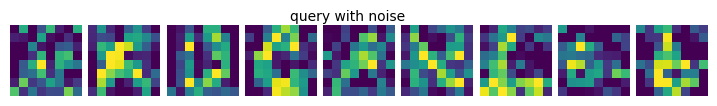

<Figure size 640x480 with 0 Axes>

In [22]:
# calculate the accuracy versus the memristor stuck at fault ratio for multi-layer HNN
from tqdm import tqdm
device='cpu'
input_size=stored_data.shape[1]
encoder_dim=32
num_hidden_layers=1
nonlin='tanh'
learn_lr=1e-3
learn_iters=10000
distance_type='cos'
params={
    'input_size':input_size,
    'encoder_dim':encoder_dim,
    'num_hidden_layers':num_hidden_layers,
    'nonlin':nonlin,
    'learn_lr':learn_lr,
    'learn_iters':learn_iters,
    'device':device,
    'recall_iters':100,
    'data_type':'continuous',
    'plot_num_per_row':10,
    'data_set':'mnist',
    'repeat':0,
}

#plot settings
plot_weight_flag=True
num_simulations=20
#memristor variation and stuck at fault
mem_var=0.0
stuck_at_fault_list=np.arange(0,1,0.05)



HNN_similarity_list=[]
input_similarities_list=[]


for stuck_at_fault_rate in tqdm(stuck_at_fault_list):
    # create the network
    hnn=SingleLayerHNN_lambda(input_size=input_size)
    # train the network

    optimizer_hnn = torch.optim.RMSprop(hnn.parameters(), lr=learn_lr)
    mem_stuck_mask=generate_mask(input_size,stuck_at_fault_rate,seed=1)
    hnn.set_mask(mask=mem_stuck_mask)
    hnn.noise_level=0.0
    hnn_losses=train_multilayer_batch(hnn, optimizer_hnn, stored_data, learn_iters, device)
    for i in range (num_simulations):
        # recall setting
        params['recall_iters']=100
        test_data=np.array([add_gaussian_noise_continuous(d.reshape(8,8),0.5) for d in stored_data])
        test_data=test_data.reshape(-1,input_size)
        test_data = torch.from_numpy(test_data).float()

        # recall data

        HNN_recall=singlelayer_recall(hnn, test_data, params)
        # calculate similarity
        HNN_similarity=torch.mean(calculate_sim(stored_data,HNN_recall,distance_type=distance_type))
        HNN_similarity_list.append(to_np(HNN_similarity).item())
        input_similarities_list.append(to_np(torch.mean(calculate_sim(stored_data,test_data,distance_type=distance_type))).item())
input_similarities=np.mean(input_similarities_list)
HNN_similarity_list=np.array(HNN_similarity_list).reshape(-1,num_simulations).T


np.savez(num_path+f'/HNN_Asso_cont_SAF.npz',mem_var=mem_var,stuck_at_fault_list=stuck_at_fault_list,HNN_similarity_list=HNN_similarity_list,input_similarities=input_similarities)



plt.figure(figsize=(5,4))
plt.errorbar(stuck_at_fault_list,np.mean(HNN_similarity_list,axis=0),yerr=np.std(HNN_similarity_list,axis=0),label='HNN',marker='o')
plt.axhline(y=input_similarities,label='Input',linestyle='--',color='gray')
plt.legend()

# plot_recalls(Pinv_recall, 'Pinv', fig_path, params)
# plot_recalls(HNN_recall, 'HNN', fig_path, params)
plot_memory(stored_data, 1, fig_path, params)
plot_memory_noise(test_data, 1, fig_path, params)

In [37]:
# calculate the accuracy versus the memristor stuck at fault ratio for multi-layer HNN
from tqdm import tqdm
device='cpu'
input_size=stored_data.shape[1]
encoder_dim=16
num_hidden_layers=1
nonlin='tanh'
learn_lr=1e-3
learn_iters=4000
distance_type='cos'
params={
    'input_size':input_size,
    'encoder_dim':encoder_dim,
    'num_hidden_layers':num_hidden_layers,
    'nonlin':nonlin,
    'learn_lr':learn_lr,
    'learn_iters':learn_iters,
    'device':device,
    'recall_iters':100,
    'data_type':'continuous',
    'plot_num_per_row':10,
    'data_set':'mnist',
    'repeat':0,
}

#plot settings
plot_weight_flag=True
num_simulations=1
#memristor variation and stuck at fault
mem_var=0.0
stuck_at_fault_list=np.arange(0,0.8,0.05)



MultiHNN_similarity_list=[]
input_similarities_list=[]


for stuck_at_fault_rate in tqdm(stuck_at_fault_list):
    # create the network
    multi_hnn=MultiLayerHNN_beta(input_dim=input_size,encoding_dim=encoder_dim,num_hidden_layers=num_hidden_layers,nolinear=nonlin,noise_level=0.0,mask_prob=stuck_at_fault_rate)
    # train the network
    optimizer_multi = torch.optim.Adam(multi_hnn.parameters(), lr=learn_lr/2)
    multi_hnn_losses=train_multilayer_hnn(multi_hnn, optimizer_multi, stored_data, 2*learn_iters, device)
    for i in range (num_simulations):
        # recall setting
        params['recall_iters']=100
        test_data=np.array([add_gaussian_noise_continuous(d.reshape(8,8),0.5) for d in stored_data])
        test_data=test_data.reshape(-1,input_size)
        test_data = torch.from_numpy(test_data).float()

        # recall data

        MultiHNN_recall=singlelayer_recall(multi_hnn, test_data, params)
        # calculate similarity
        MultiHNN_similarity=torch.mean(calculate_sim(stored_data,MultiHNN_recall,distance_type=distance_type))
        MultiHNN_similarity_list.append(to_np(MultiHNN_similarity).item())
        input_similarities_list.append(to_np(torch.mean(calculate_sim(stored_data,test_data,distance_type=distance_type))).item())
input_similarities=np.mean(input_similarities_list)
MultiHNN_similarity_list=np.array(MultiHNN_similarity_list).reshape(-1,num_simulations).T


np.savez(num_path+f'/MultiLyaer_Asso_cont_{num_hidden_layers}_{encoder_dim}_SAF.npz',mem_var=mem_var,stuck_at_fault_list=stuck_at_fault_list,MultiHNN_similarity_list=MultiHNN_similarity_list,input_similarities=input_similarities)



plt.figure(figsize=(5,4))
plt.errorbar(stuck_at_fault_list,np.mean(MultiHNN_similarity_list,axis=0),yerr=np.std(MultiHNN_similarity_list,axis=0),label='MultiHNN',marker='o')
plt.axhline(y=input_similarities,label='Input',linestyle='--',color='gray')
plt.legend()

# plot_recalls(Pinv_recall, 'Pinv', fig_path, params)
# plot_recalls(HNN_recall, 'HNN', fig_path, params)
plot_memory(stored_data, 1, fig_path, params)
plot_memory_noise(test_data, 1, fig_path, params)

  0%|          | 0/16 [00:03<?, ?it/s]


KeyboardInterrupt: 

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


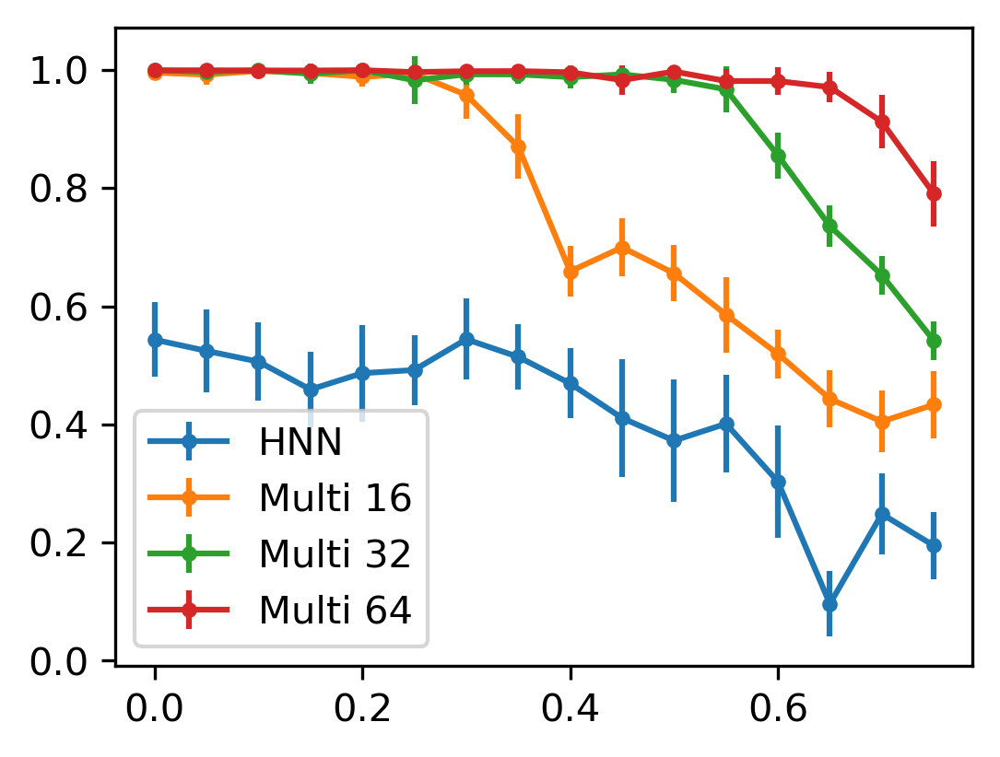

In [54]:
result=np.load('HNN_Asso_cont_SAF.npz')
HNN_similarity_list=result['HNN_similarity_list']
result=np.load('MultiLyaer_Asso_cont_1_16_SAF.npz')
mem_var=result['mem_var']
stuck_at_fault_list=result['stuck_at_fault_list']
MultiHNN_similarity_list_16=result['MultiHNN_similarity_list']
result=np.load('MultiLyaer_Asso_cont_1_32_SAF.npz')
MultiHNN_similarity_list_32=result['MultiHNN_similarity_list']
result=np.load('MultiLyaer_Asso_cont_1_64_SAF.npz')
MultiHNN_similarity_list_64=result['MultiHNN_similarity_list']

# plot the results
plt.figure(figsize=(4,3),dpi=300)
plt.errorbar(stuck_at_fault_list,np.mean(HNN_similarity_list,axis=0),yerr=np.std(HNN_similarity_list,axis=0),label='HNN',marker='.')
plt.errorbar(stuck_at_fault_list,np.mean(MultiHNN_similarity_list_16,axis=0),yerr=np.std(MultiHNN_similarity_list_16,axis=0),label='Multi 16',marker='.')
plt.errorbar(stuck_at_fault_list,np.mean(MultiHNN_similarity_list_32,axis=0),yerr=np.std(MultiHNN_similarity_list_32,axis=0),label='Multi 32',marker='.')
plt.errorbar(stuck_at_fault_list,np.mean(MultiHNN_similarity_list_64,axis=0),yerr=np.std(MultiHNN_similarity_list_64,axis=0),label='Multi 64',marker='.')
# plt.title('Cosine Similarity Vs Stuck at Fault Ratio')
# plt.xlabel('Stuck at Fault Ratio')
# plt.ylabel('Cosine Similarity')
plt.legend()
plt.savefig('fig/MultiLayer_Asso_cont_SAF.eps',format='eps',bbox_inches='tight')
plt.show()

# Multilayer Hopfiled Neural Network for Sequence Memory

## sequence memory for binary patterns

### contrast between different algorthms

In [13]:
#load data
num_samples = 100
stored_data_list=torch.from_numpy(new_mnist_data_binary).float()
# 生成随机排列的索引
random_indices = torch.randperm(stored_data_list.size(0))[:num_samples]
# 使用随机索引选择数据
stored_data = stored_data_list[random_indices]
print(stored_data.shape)

torch.Size([100, 64])


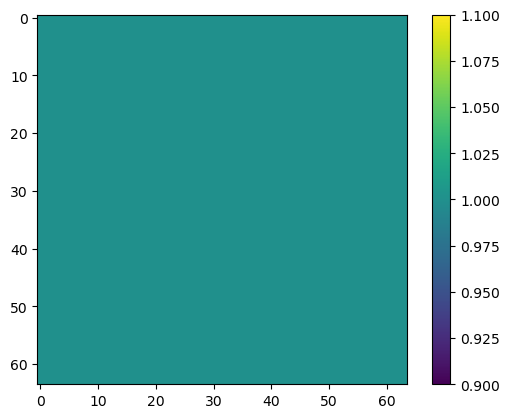

Epoch [1/200], Loss: 1.1562947034835815
Epoch [2/200], Loss: 0.41907167434692383
Epoch [3/200], Loss: 0.19804620742797852
Epoch [4/200], Loss: 0.10689371824264526
Epoch [5/200], Loss: 0.06628754734992981
Epoch [6/200], Loss: 0.048642661422491074
Epoch [7/200], Loss: 0.03884488716721535
Epoch [8/200], Loss: 0.03241514787077904
Epoch [9/200], Loss: 0.0278218574821949
Epoch [10/200], Loss: 0.02436157315969467
Epoch [11/200], Loss: 0.02165578119456768
Epoch [12/200], Loss: 0.01947985216975212
Epoch [13/200], Loss: 0.017691146582365036
Epoch [14/200], Loss: 0.016194384545087814
Epoch [15/200], Loss: 0.014923358336091042
Epoch [16/200], Loss: 0.013830546289682388
Epoch [17/200], Loss: 0.012880942784249783
Epoch [18/200], Loss: 0.012048166245222092
Epoch [19/200], Loss: 0.011311951093375683
Epoch [20/200], Loss: 0.010656464844942093
Epoch [21/200], Loss: 0.0100691644474864
Epoch [22/200], Loss: 0.009539971128106117
Epoch [23/200], Loss: 0.00906070414930582
Epoch [24/200], Loss: 0.008624649606

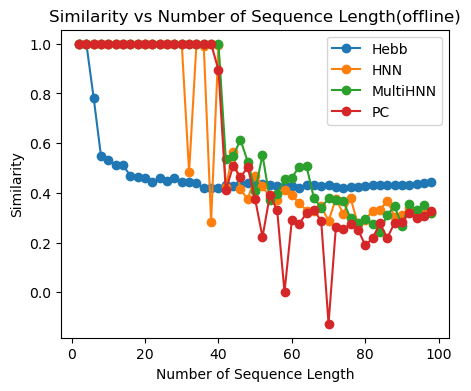

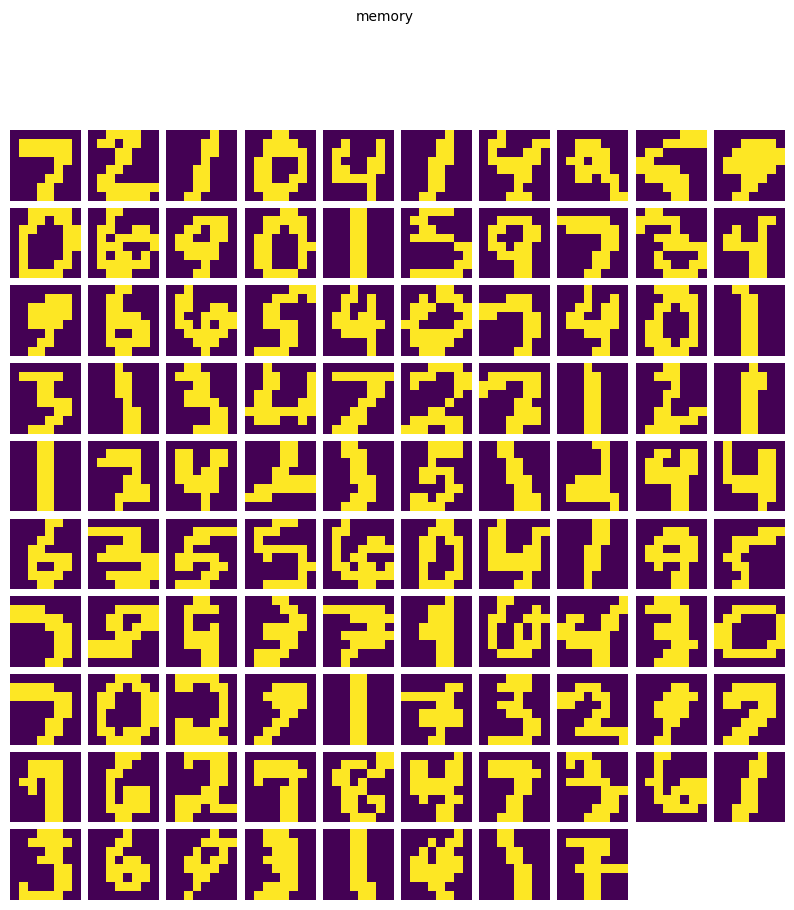

In [14]:
device='cpu'
input_size=stored_data.shape[1]
encoder_dim=32
num_hidden_layers=1
nonlin='tanh'
learn_lr=1e-3
learn_iters=200
params={
    'input_size':input_size,
    'encoder_dim':encoder_dim,
    'num_hidden_layers':num_hidden_layers,
    'nonlin':nonlin,
    'learn_lr':learn_lr,
    'learn_iters':learn_iters,
    'device':device,
    'recall_iters':100,
    'data_type':'binary',
    
    'sep':1,
    'plot_num_per_row':10,
}


params['data_set']='mnist'
params['repeat']=10
params['query_type']='offline'
params['distance_type']='cos'
#plot settings
plot_weight_flag=True

seq_length=np.arange(2,100,2)
#memristor variation and stuck at fault
mem_var=0.0
stuck_at_fault_rate=0.0

mask_0=1-stuck_0
mask_1=1-stuck_1

mem_stuck_mask=mask_0[0:input_size,0:input_size]*mask_1[0:input_size,0:input_size]
mem_stuck_mask=torch.from_numpy(mem_stuck_mask).float()
mem_stuck_mask=torch.ones(input_size,input_size)
# mem_stuck_mask=generate_mask(1,49,stuck_at_fault_rate)
plt.imshow(mem_stuck_mask)
plt.colorbar()
plt.show()

Hebb_similarities=[]
HNN_similarities=[]
MultiHNN_similarities=[]
PC_similarities=[]
for num_seq in seq_length:
    stored_data=stored_data_list[0:num_seq]
    # create the network
    hnn=SingleLayerHNN_lambda(input_size=input_size)
    multi_hnn=MultiLayerHNN_beta(input_dim=input_size,encoding_dim=encoder_dim,num_hidden_layers=num_hidden_layers,nolinear=nonlin)
    pc=SingleLayertPC(input_size=input_size,nonlin=params['nonlin'])
    multi_pc=MultilayertPC(hidden_size=encoder_dim,output_size=input_size)

    Hebb=ModernAsymmetricHopfieldNetwork(input_size=input_size,sep=params['sep'])
    optimizer_hnn = torch.optim.RMSprop(hnn.parameters(), lr=learn_lr)
    optimizer_multi = torch.optim.RMSprop(multi_hnn.parameters(), lr=learn_lr)
    optimizer_pc=torch.optim.RMSprop(pc.parameters(),lr=learn_lr)
    optimizer_multi_pc=torch.optim.RMSprop(multi_pc.parameters(),lr=learn_lr)

    hnn.clear_mask()
    hnn_losses=train_multilayer_sequence(hnn, optimizer_hnn, stored_data, learn_iters, device)
    hnn.add_variation(var=mem_var)
    multi_hnn_losses=train_multilayer_sequence(multi_hnn,optimizer_multi,stored_data,learn_iters,device)
    pc_losses=train_singlelayer_tPC(pc,optimizer_pc,stored_data,learn_iters,device)
    # multi_pc_losses=train_multilayer_tPC(multi_pc,optimizer_multi_pc,stored_data,learn_iters,inf_iters=100,inf_lr=1e-2,device=device)
    
    Hebb_recall=hn_sequence_recall(Hebb,stored_data,device,params)
    HNN_recall = singlelayer_sequence_recall(hnn, stored_data, device, params)
    MultiHNN_recall=singlelayer_sequence_recall(multi_hnn,stored_data,device,params)
    PC_recall=singlelayer_sequence_recall(pc,stored_data,device,params)

    Hebb_similarities.append(to_np(torch.mean(calculate_sim(Hebb_recall,stored_data,distance_type=params['distance_type']))))
    HNN_similarities.append(to_np(torch.mean(calculate_sim(HNN_recall,stored_data,distance_type=params['distance_type']))))
    MultiHNN_similarities.append(to_np(torch.mean(calculate_sim(MultiHNN_recall,stored_data,distance_type=params['distance_type']))))
    PC_similarities.append(to_np(torch.mean(calculate_sim(PC_recall,stored_data,distance_type=params['distance_type']))))
    
plt.figure(figsize=(5,4),dpi=100)
plt.plot(seq_length,Hebb_similarities,label='Hebb',marker='o')
plt.plot(seq_length,HNN_similarities,label='HNN',marker='o')
plt.plot(seq_length,MultiHNN_similarities,label='MultiHNN',marker='o')
plt.plot(seq_length,PC_similarities,label='PC',marker='o')
plt.legend()
plt.xlabel('Number of Sequence Length')
plt.ylabel('Similarity')
plt.title(f'Similarity vs Number of Sequence Length({params["query_type"]})')
plt.show()

plot_memory(stored_data, 1, fig_path, params)

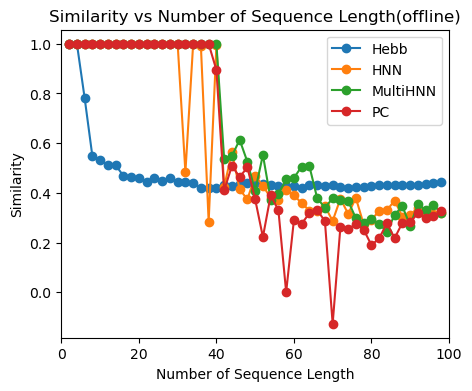

In [64]:
plt.figure(figsize=(5,4),dpi=100)
plt.plot(seq_length,Hebb_similarities,label='Hebb',marker='o')
plt.plot(seq_length,HNN_similarities,label='HNN',marker='o')
plt.plot(seq_length,MultiHNN_similarities,label='MultiHNN',marker='o')
plt.plot(seq_length,PC_similarities,label='PC',marker='o')
plt.legend()
plt.xlabel('Number of Sequence Length')
plt.ylabel('Similarity')
plt.xlim(0,100)
plt.title(f'Similarity vs Number of Sequence Length({params["query_type"]})')
plt.show()

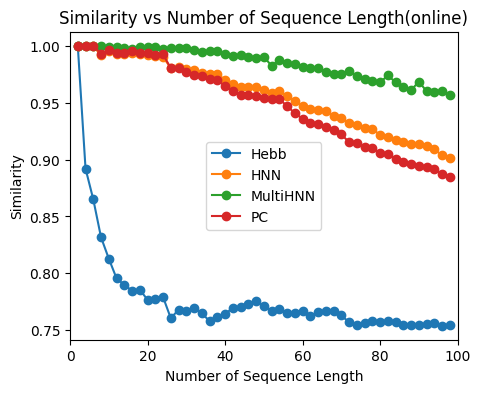

In [ ]:
plt.figure(figsize=(5,4),dpi=100)
plt.plot(seq_length,Hebb_similarities,label='Hebb',marker='o')
plt.plot(seq_length,HNN_similarities,label='HNN',marker='o')
plt.plot(seq_length,MultiHNN_similarities,label='MultiHNN',marker='o')
plt.plot(seq_length,PC_similarities,label='PC',marker='o')
plt.legend()
plt.xlabel('Number of Sequence Length')
plt.ylabel('Similarity')
plt.xlim(0,100)
plt.title(f'Similarity vs Number of Sequence Length({params["query_type"]})')
plt.show()

### Memristor Variation

In [40]:
#load data
num_samples = 100
stored_data_list=torch.from_numpy(new_mnist_data_binary).float()
# 生成随机排列的索引
random_indices = torch.randperm(stored_data_list.size(0))[:num_samples]
# 使用随机索引选择数据
stored_data = stored_data_list[random_indices]

stored_data=stored_data_list[0:num_samples]
print(stored_data.shape)

torch.Size([100, 64])


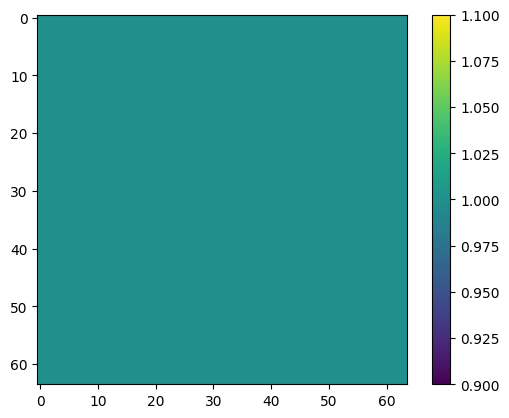

Epoch 10, loss 0.3417053349316119
Epoch 20, loss 0.23810723945498466
Epoch 30, loss 0.20777708180248738
Epoch 40, loss 0.17281845118850467
Epoch 50, loss 0.16876415833830832
Epoch 60, loss 0.1606789030251093
Epoch 70, loss 0.15274392814899326
Epoch 80, loss 0.13821755826793378
Epoch 90, loss 0.12979691207074215
Epoch 100, loss 0.12763187312812077
Epoch 110, loss 0.13008355399433638
Epoch 120, loss 0.11790705839230212
Epoch 130, loss 0.11361559943397878
Epoch 140, loss 0.11155222158267862
Epoch 150, loss 0.11459737797304115
Epoch 160, loss 0.10696964311973718
Epoch 170, loss 0.10028556778561326
Epoch 180, loss 0.09559943580243271
Epoch 190, loss 0.09584018527748411
Epoch 200, loss 0.08179562581362916
training PC complete, time: 0.6134841442108154
Epoch 10, loss 0.3417053349316119
Epoch 20, loss 0.23810723945498466
Epoch 30, loss 0.20777708180248738
Epoch 40, loss 0.17281845118850467
Epoch 50, loss 0.16876415833830832
Epoch 60, loss 0.1606789030251093
Epoch 70, loss 0.15274392814899326
E

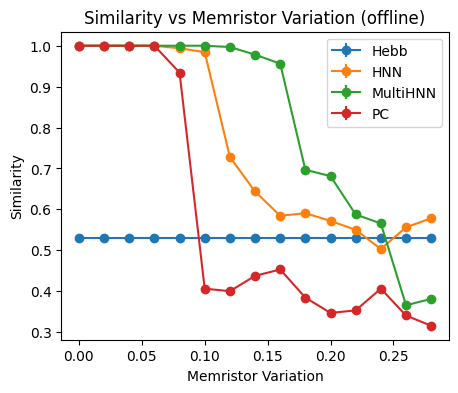

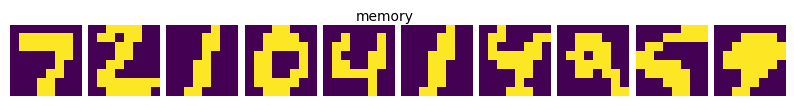

In [36]:
import json

device='cpu'
input_size=stored_data.shape[1]
encoder_dim=32
num_hidden_layers=1
nonlin='tanh'
learn_lr=1e-3
learn_iters=200
params={
    'input_size':input_size,
    'encoder_dim':encoder_dim,
    'num_hidden_layers':num_hidden_layers,
    'nonlin':nonlin,
    'learn_lr':learn_lr,
    'learn_iters':learn_iters,
    'device':device,
    'recall_iters':100,
    'data_type':'binary',
    
    'sep':1,
    'plot_num_per_row':10,
}


params['data_set']='mnist'
params['repeat']=10
params['query_type']='offline'
params['distance_type']='cos'
#plot settings
plot_weight_flag=True
num_simulation=1

#memristor variation and stuck at fault
mem_var_list=np.arange(0,0.3,0.02)
stuck_at_fault_rate=0.0
stored_data=stored_data[0:10]
mask_0=1-stuck_0
mask_1=1-stuck_1

mem_stuck_mask=mask_0[0:input_size,0:input_size]*mask_1[0:input_size,0:input_size]
mem_stuck_mask=torch.from_numpy(mem_stuck_mask).float()

mem_stuck_mask=torch.ones(input_size,input_size)
# mem_stuck_mask=generate_mask(1,49,stuck_at_fault_rate)
plt.imshow(mem_stuck_mask)
plt.colorbar()
plt.show()

Hebb_similarities=[]
HNN_similarities=[]
MultiHNN_similarities=[]
PC_similarities=[]
for _ in range(num_simulation):
    for mem_var in mem_var_list:
        # create the network
        hnn=SingleLayerHNN_lambda(input_size=input_size)
        multi_hnn=MultiLayerHNN_beta(input_dim=input_size,encoding_dim=encoder_dim,num_hidden_layers=num_hidden_layers,nolinear=nonlin)
        pc=SingleLayertPC(input_size=input_size,nonlin=params['nonlin'])
        multi_pc=MultilayertPC(hidden_size=encoder_dim,output_size=input_size)

        Hebb=ModernAsymmetricHopfieldNetwork(input_size=input_size,sep=params['sep'])
        optimizer_hnn = torch.optim.RMSprop(hnn.parameters(), lr=learn_lr)
        optimizer_multi = torch.optim.RMSprop(multi_hnn.parameters(), lr=learn_lr)
        optimizer_pc=torch.optim.RMSprop(pc.parameters(),lr=learn_lr)
        optimizer_multi_pc=torch.optim.RMSprop(multi_pc.parameters(),lr=learn_lr)

        hnn.clear_mask()
        hnn_losses=train_multilayer_sequence(hnn, optimizer_hnn, stored_data, learn_iters, device)
        hnn.add_variation(var=mem_var)
        multi_hnn_losses=train_multilayer_sequence(multi_hnn,optimizer_multi,stored_data,learn_iters,device)
        multi_hnn.add_variation(var=mem_var)
        pc_losses=train_singlelayer_tPC(pc,optimizer_pc,stored_data,learn_iters,device)
        pc.add_variation(variation=mem_var)  
        # multi_pc_losses=train_multilayer_tPC(multi_pc,optimizer_multi_pc,stored_data,learn_iters,inf_iters=100,inf_lr=1e-2,device=device)
        
        Hebb_recall=hn_sequence_recall(Hebb,stored_data,device,params)
        HNN_recall = singlelayer_sequence_recall(hnn, stored_data, device, params)
        MultiHNN_recall=singlelayer_sequence_recall(multi_hnn,stored_data,device,params)
        PC_recall=singlelayer_sequence_recall(pc,stored_data,device,params)

        Hebb_similarities.append(to_np(torch.mean(calculate_sim(Hebb_recall,stored_data,distance_type=params['distance_type']))).item())
        HNN_similarities.append(to_np(torch.mean(calculate_sim(HNN_recall,stored_data,distance_type=params['distance_type']))).item())
        MultiHNN_similarities.append(to_np(torch.mean(calculate_sim(MultiHNN_recall,stored_data,distance_type=params['distance_type']))).item())
        PC_similarities.append(to_np(torch.mean(calculate_sim(PC_recall,stored_data,distance_type=params['distance_type']))).item())

results={}
results['Hebb']=Hebb_similarities
results['HNN']=HNN_similarities
results['MultiHNN']=MultiHNN_similarities
results['PC']=PC_similarities
# json.dump(results, open(num_path + f"/memristor_sequence_variation_datatype={params['data_type']}_query_type={params['query_type']}.json", 'w'))

Hebb_similarities=np.array(Hebb_similarities).reshape(num_simulation,len(mem_var_list))
HNN_similarities=np.array(HNN_similarities).reshape(num_simulation,len(mem_var_list))
MultiHNN_similarities=np.array(MultiHNN_similarities).reshape(num_simulation,len(mem_var_list))
PC_similarities=np.array(PC_similarities).reshape(num_simulation,len(mem_var_list))



plt.figure(figsize=(5,4))
plt.errorbar(mem_var_list,np.mean(Hebb_similarities,axis=0),yerr=np.std(Hebb_similarities,axis=0),label='Hebb',marker='o')
plt.errorbar(mem_var_list,np.mean(HNN_similarities,axis=0),yerr=np.std(HNN_similarities,axis=0),label='HNN',marker='o')
plt.errorbar(mem_var_list,np.mean(MultiHNN_similarities,axis=0),yerr=np.std(MultiHNN_similarities,axis=0),label='MultiHNN',marker='o')
plt.errorbar(mem_var_list,np.mean(PC_similarities,axis=0),yerr=np.std(PC_similarities,axis=0),label='PC',marker='o')
plt.legend()
plt.xlabel('Memristor Variation')
plt.ylabel('Similarity')
plt.title(f'Similarity vs Memristor Variation ({params["query_type"]})')
plt.show()


plot_memory(stored_data, 1, fig_path, params)

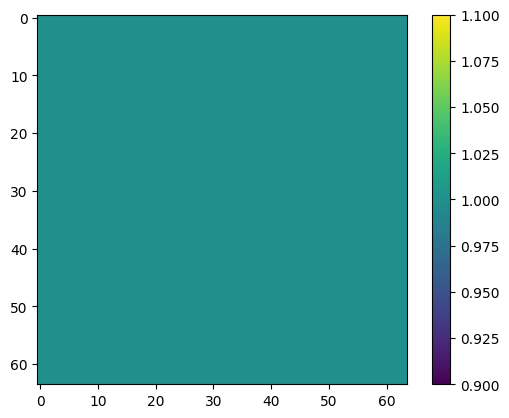

Epoch 10, loss 0.3346762850880623
Epoch 20, loss 0.237304126098752
Epoch 30, loss 0.20549467531964186
Epoch 40, loss 0.17254156647250055
Epoch 50, loss 0.17219783574109893
Epoch 60, loss 0.1649240675556939
Epoch 70, loss 0.14313126716588156
Epoch 80, loss 0.13243851650840952
Epoch 90, loss 0.1266248465144599
Epoch 100, loss 0.12058757152262842
Epoch 110, loss 0.12957229772582649
Epoch 120, loss 0.12359058183792515
Epoch 130, loss 0.12107056201348314
Epoch 140, loss 0.11369656611568642
Epoch 150, loss 0.1170100217203526
Epoch 160, loss 0.10996839239305699
Epoch 170, loss 0.12132506253765316
Epoch 180, loss 0.10517199302921655
Epoch 190, loss 0.10176984769714181
Epoch 200, loss 0.08966706347546279
training PC complete, time: 0.5783159732818604
Epoch 10, loss 0.3346762850880623
Epoch 20, loss 0.237304126098752
Epoch 30, loss 0.20549467531964186
Epoch 40, loss 0.17254156647250055
Epoch 50, loss 0.17219783574109893
Epoch 60, loss 0.1649240675556939
Epoch 70, loss 0.14313126716588156
Epoch 8

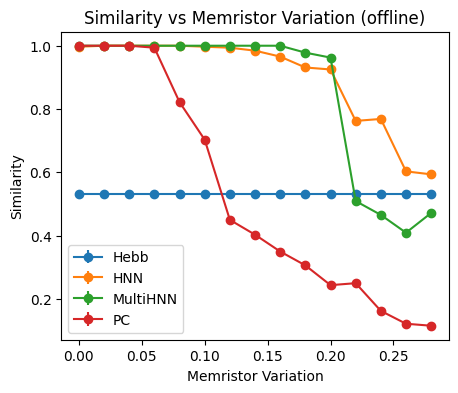

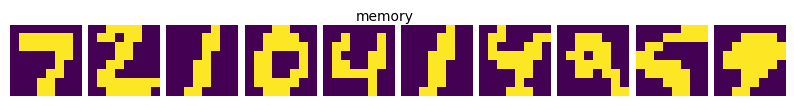

In [41]:
import json

device='cpu'
input_size=stored_data.shape[1]
encoder_dim=32
num_hidden_layers=1
nonlin='tanh'
learn_lr=1e-3
learn_iters=200
params={
    'input_size':input_size,
    'encoder_dim':encoder_dim,
    'num_hidden_layers':num_hidden_layers,
    'nonlin':nonlin,
    'learn_lr':learn_lr,
    'learn_iters':learn_iters,
    'device':device,
    'recall_iters':100,
    'data_type':'binary',
    
    'sep':1,
    'plot_num_per_row':10,
}


params['data_set']='mnist'
params['repeat']=10
params['query_type']='offline'
params['distance_type']='cos'
#plot settings
plot_weight_flag=True
num_simulation=1

#memristor variation and stuck at fault
mem_var_list=np.arange(0,0.3,0.02)
stuck_at_fault_rate=0.0
stored_data=stored_data[0:10]
mask_0=1-stuck_0
mask_1=1-stuck_1

mem_stuck_mask=mask_0[0:input_size,0:input_size]*mask_1[0:input_size,0:input_size]
mem_stuck_mask=torch.from_numpy(mem_stuck_mask).float()

mem_stuck_mask=torch.ones(input_size,input_size)
# mem_stuck_mask=generate_mask(1,49,stuck_at_fault_rate)
plt.imshow(mem_stuck_mask)
plt.colorbar()
plt.show()

Hebb_similarities=[]
HNN_similarities=[]
MultiHNN_similarities=[]
PC_similarities=[]
for _ in range(num_simulation):
    for mem_var in mem_var_list:
        # create the network
        hnn=SingleLayerHNN_lambda(input_size=input_size)
        multi_hnn=MultiLayerHNN_beta(input_dim=input_size,encoding_dim=encoder_dim,num_hidden_layers=num_hidden_layers,nolinear=nonlin)
        pc=SingleLayertPC(input_size=input_size,nonlin=params['nonlin'])
        multi_pc=MultilayertPC(hidden_size=encoder_dim,output_size=input_size)

        Hebb=ModernAsymmetricHopfieldNetwork(input_size=input_size,sep=params['sep'])
        optimizer_hnn = torch.optim.RMSprop(hnn.parameters(), lr=learn_lr)
        optimizer_multi = torch.optim.RMSprop(multi_hnn.parameters(), lr=learn_lr)
        optimizer_pc=torch.optim.RMSprop(pc.parameters(),lr=learn_lr)
        optimizer_multi_pc=torch.optim.RMSprop(multi_pc.parameters(),lr=learn_lr)

        hnn.clear_mask()
        hnn_losses=train_multilayer_sequence_batch(hnn, optimizer_hnn, stored_data, learn_iters, device)
        hnn.add_variation(var=mem_var)
        multi_hnn_losses=train_multilayer_sequence_batch(multi_hnn,optimizer_multi,stored_data,learn_iters,device)
        multi_hnn.add_variation(var=mem_var)
        pc_losses=train_singlelayer_tPC(pc,optimizer_pc,stored_data,learn_iters,device)
        pc.add_variation(variation=mem_var)  
        # multi_pc_losses=train_multilayer_tPC(multi_pc,optimizer_multi_pc,stored_data,learn_iters,inf_iters=100,inf_lr=1e-2,device=device)
        
        Hebb_recall=hn_sequence_recall(Hebb,stored_data,device,params)
        HNN_recall = singlelayer_sequence_recall(hnn, stored_data, device, params)
        MultiHNN_recall=singlelayer_sequence_recall(multi_hnn,stored_data,device,params)
        PC_recall=singlelayer_sequence_recall(pc,stored_data,device,params)

        Hebb_similarities.append(to_np(torch.mean(calculate_sim(Hebb_recall,stored_data,distance_type=params['distance_type']))).item())
        HNN_similarities.append(to_np(torch.mean(calculate_sim(HNN_recall,stored_data,distance_type=params['distance_type']))).item())
        MultiHNN_similarities.append(to_np(torch.mean(calculate_sim(MultiHNN_recall,stored_data,distance_type=params['distance_type']))).item())
        PC_similarities.append(to_np(torch.mean(calculate_sim(PC_recall,stored_data,distance_type=params['distance_type']))).item())

results={}
results['Hebb']=Hebb_similarities
results['HNN']=HNN_similarities
results['MultiHNN']=MultiHNN_similarities
results['PC']=PC_similarities
# json.dump(results, open(num_path + f"/memristor_sequence_variation_datatype={params['data_type']}_query_type={params['query_type']}.json", 'w'))

Hebb_similarities=np.array(Hebb_similarities).reshape(num_simulation,len(mem_var_list))
HNN_similarities=np.array(HNN_similarities).reshape(num_simulation,len(mem_var_list))
MultiHNN_similarities=np.array(MultiHNN_similarities).reshape(num_simulation,len(mem_var_list))
PC_similarities=np.array(PC_similarities).reshape(num_simulation,len(mem_var_list))



plt.figure(figsize=(5,4))
plt.errorbar(mem_var_list,np.mean(Hebb_similarities,axis=0),yerr=np.std(Hebb_similarities,axis=0),label='Hebb',marker='o')
plt.errorbar(mem_var_list,np.mean(HNN_similarities,axis=0),yerr=np.std(HNN_similarities,axis=0),label='HNN',marker='o')
plt.errorbar(mem_var_list,np.mean(MultiHNN_similarities,axis=0),yerr=np.std(MultiHNN_similarities,axis=0),label='MultiHNN',marker='o')
plt.errorbar(mem_var_list,np.mean(PC_similarities,axis=0),yerr=np.std(PC_similarities,axis=0),label='PC',marker='o')
plt.legend()
plt.xlabel('Memristor Variation')
plt.ylabel('Similarity')
plt.title(f'Similarity vs Memristor Variation ({params["query_type"]})')
plt.show()


plot_memory(stored_data, 1, fig_path, params)

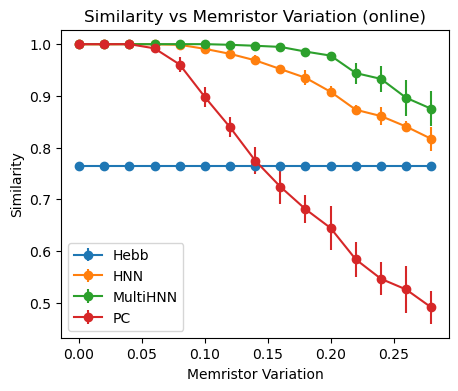

In [45]:
params['query_type']='online'
params['data_type']='binary'
num_simulation=10
# 指定JSON文件路径
json_file_path = num_path + f"/memristor_sequence_variation_datatype={params['data_type']}_query_type={params['query_type']}.json"
# 从JSON文件中读取数据
with open(json_file_path, 'r') as json_file:
    data = json.load(json_file)
mem_var_list=np.arange(0,0.3,0.02)
Hebb_similarities=data['Hebb']
HNN_similarities=data['HNN']
MultiHNN_similarities=data['MultiHNN']
PC_similarities=data['PC']

Hebb_similarities=np.array(Hebb_similarities).reshape(num_simulation,-1)
HNN_similarities=np.array(HNN_similarities).reshape(num_simulation,-1)
MultiHNN_similarities=np.array(MultiHNN_similarities).reshape(num_simulation,-1)
PC_similarities=np.array(PC_similarities).reshape(num_simulation,-1)

plt.figure(figsize=(5,4))
plt.errorbar(mem_var_list,np.mean(Hebb_similarities,axis=0),yerr=np.std(Hebb_similarities,axis=0),label='Hebb',marker='o')
plt.errorbar(mem_var_list,np.mean(HNN_similarities,axis=0),yerr=np.std(HNN_similarities,axis=0),label='HNN',marker='o')
plt.errorbar(mem_var_list,np.mean(MultiHNN_similarities,axis=0),yerr=np.std(MultiHNN_similarities,axis=0),label='MultiHNN',marker='o')
plt.errorbar(mem_var_list,np.mean(PC_similarities,axis=0),yerr=np.std(PC_similarities,axis=0),label='PC',marker='o')
plt.legend()
plt.xlabel('Memristor Variation')
plt.ylabel('Similarity')
plt.title(f'Similarity vs Memristor Variation ({params["query_type"]})')
plt.show()

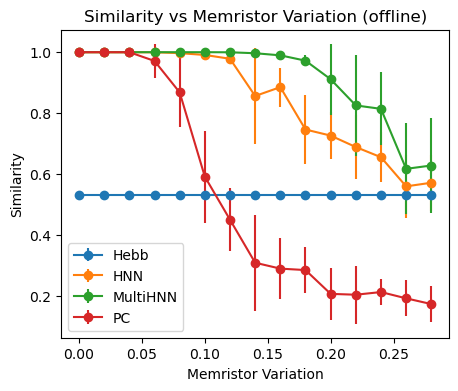

In [46]:
params['query_type']='offline'
params['data_type']='binary'
num_simulation=10
# 指定JSON文件路径
json_file_path = num_path + f"/memristor_sequence_variation_datatype={params['data_type']}_query_type={params['query_type']}.json"
# 从JSON文件中读取数据
with open(json_file_path, 'r') as json_file:
    data = json.load(json_file)
mem_var_list=np.arange(0,0.3,0.02)
Hebb_similarities=data['Hebb']
HNN_similarities=data['HNN']
MultiHNN_similarities=data['MultiHNN']
PC_similarities=data['PC']

Hebb_similarities=np.array(Hebb_similarities).reshape(num_simulation,-1)
HNN_similarities=np.array(HNN_similarities).reshape(num_simulation,-1)
MultiHNN_similarities=np.array(MultiHNN_similarities).reshape(num_simulation,-1)
PC_similarities=np.array(PC_similarities).reshape(num_simulation,-1)

plt.figure(figsize=(5,4))
plt.errorbar(mem_var_list,np.mean(Hebb_similarities,axis=0),yerr=np.std(Hebb_similarities,axis=0),label='Hebb',marker='o')
plt.errorbar(mem_var_list,np.mean(HNN_similarities,axis=0),yerr=np.std(HNN_similarities,axis=0),label='HNN',marker='o')
plt.errorbar(mem_var_list,np.mean(MultiHNN_similarities,axis=0),yerr=np.std(MultiHNN_similarities,axis=0),label='MultiHNN',marker='o')
plt.errorbar(mem_var_list,np.mean(PC_similarities,axis=0),yerr=np.std(PC_similarities,axis=0),label='PC',marker='o')
plt.legend()
plt.xlabel('Memristor Variation')
plt.ylabel('Similarity')
plt.title(f'Similarity vs Memristor Variation ({params["query_type"]})')
plt.show()

### Memristor Stuck At Fault

In [13]:
#load data
num_samples = 100
stored_data_list=torch.from_numpy(new_mnist_data_binary).float()
# 生成随机排列的索引
random_indices = torch.randperm(stored_data_list.size(0))[:num_samples]
# 使用随机索引选择数据
stored_data = stored_data_list[random_indices]
stored_data=stored_data_list[0:num_samples]
print(stored_data.shape)

torch.Size([100, 64])


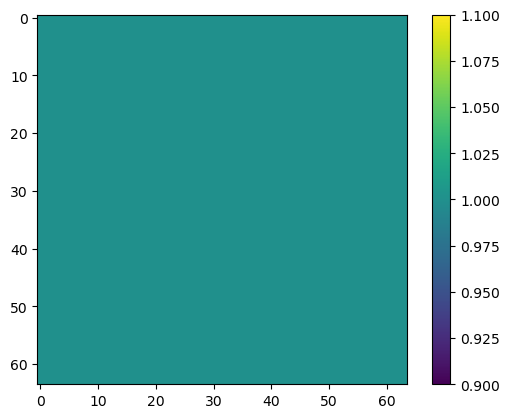

Epoch [1/200], Loss: 1.0204168558120728
Epoch [2/200], Loss: 0.6736893057823181
Epoch [3/200], Loss: 0.4825510084629059
Epoch [4/200], Loss: 0.3647944927215576
Epoch [5/200], Loss: 0.2871471345424652
Epoch [6/200], Loss: 0.2328193485736847
Epoch [7/200], Loss: 0.19350653886795044
Epoch [8/200], Loss: 0.16440008580684662
Epoch [9/200], Loss: 0.14235475659370422
Epoch [10/200], Loss: 0.12525354325771332
Epoch [11/200], Loss: 0.11167185008525848
Epoch [12/200], Loss: 0.10064858198165894
Epoch [13/200], Loss: 0.0915277898311615
Epoch [14/200], Loss: 0.0838538333773613
Epoch [15/200], Loss: 0.07730387151241302
Epoch [16/200], Loss: 0.07164409756660461
Epoch [17/200], Loss: 0.0667009949684143
Epoch [18/200], Loss: 0.06234215572476387
Epoch [19/200], Loss: 0.05846418812870979
Epoch [20/200], Loss: 0.05498684570193291
Epoch [21/200], Loss: 0.051849037408828735
Epoch [22/200], Loss: 0.04900359734892845
Epoch [23/200], Loss: 0.0464123897254467
Epoch [24/200], Loss: 0.04404362663626671
Epoch [25/

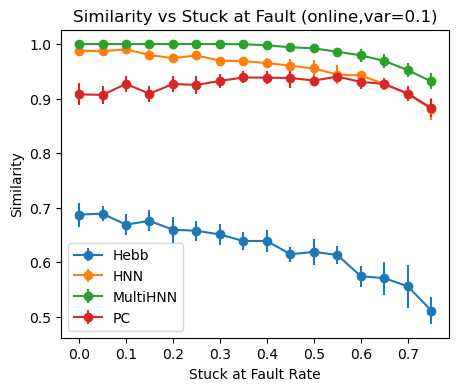

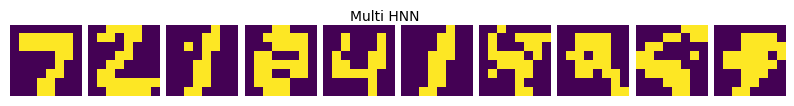

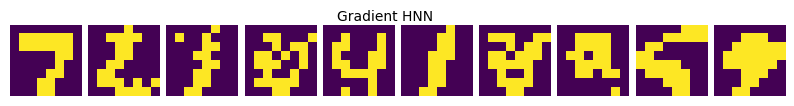

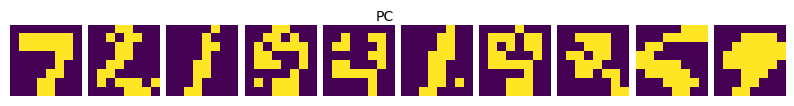

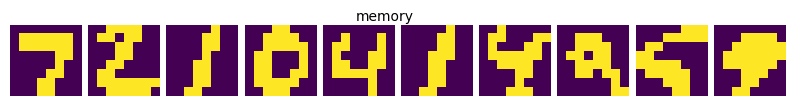

In [26]:
device='cpu'
input_size=stored_data.shape[1]
encoder_dim=32
num_hidden_layers=1
nonlin='tanh'
learn_lr=1e-3
learn_iters=200
params={
    'input_size':input_size,
    'encoder_dim':encoder_dim,
    'num_hidden_layers':num_hidden_layers,
    'nonlin':nonlin,
    'learn_lr':learn_lr,
    'learn_iters':learn_iters,
    'device':device,
    'recall_iters':100,
    'data_type':'binary',
    
    'sep':'hebb',
    'plot_num_per_row':10,
}


params['data_set']='mnist'
params['repeat']=1
params['query_type']='online'
params['distance_type']='cos'
#plot settings
plot_weight_flag=True
num_simulation=10

#memristor variation and stuck at fault
stuck_at_fault_list=np.arange(0,0.8,0.05)
mem_var=0.1

stored_data=stored_data[0:10]
mask_0=1-stuck_0
mask_1=1-stuck_1

mem_stuck_mask=mask_0[0:input_size,0:input_size]*mask_1[0:input_size,0:input_size]
mem_stuck_mask=torch.from_numpy(mem_stuck_mask).float()

mem_stuck_mask=torch.ones(input_size,input_size)
# mem_stuck_mask=generate_mask(1,49,stuck_at_fault_rate)
plt.imshow(mem_stuck_mask)
plt.colorbar()
plt.show()

Hebb_similarities=[]
HNN_similarities=[]
MultiHNN_similarities=[]
PC_similarities=[]
for _ in range(num_simulation):
    for stuck_at_fault_rate in stuck_at_fault_list:
        mem_stuck_mask=generate_mask(64,stuck_at_fault_rate)
        # create the network
        hnn=SingleLayerHNN_lambda(input_size=input_size)
        multi_hnn=MultiLayerHNN_beta(input_dim=input_size,encoding_dim=encoder_dim,num_hidden_layers=num_hidden_layers,nolinear=nonlin,noise_level=0.0,mask_prob=stuck_at_fault_rate)
        pc=SingleLayertPC(input_size=input_size,nonlin=params['nonlin'])
        multi_pc=MultilayertPC(hidden_size=encoder_dim,output_size=input_size)

        Hebb=ModernAsymmetricHopfieldNetwork(input_size=input_size,sep=params['sep'])
        optimizer_hnn = torch.optim.RMSprop(hnn.parameters(), lr=learn_lr)
        optimizer_multi = torch.optim.RMSprop(multi_hnn.parameters(), lr=learn_lr)
        optimizer_pc=torch.optim.RMSprop(pc.parameters(),lr=learn_lr)
        optimizer_multi_pc=torch.optim.RMSprop(multi_pc.parameters(),lr=learn_lr)


        hnn.clear_mask()
        hnn.set_mask(mem_stuck_mask)
        hnn_losses=train_multilayer_sequence(hnn, optimizer_hnn, stored_data, learn_iters, device)
        hnn.add_variation(var=mem_var)
        multi_hnn_losses=train_multilayer_sequence(multi_hnn,optimizer_multi,stored_data,learn_iters,device)
        multi_hnn.add_variation(var=mem_var)
        Hebb.train(stored_data)
        Hebb.add_weight_variation(variation=mem_var)
        Hebb.add_mask(mem_stuck_mask)


        pc.set_mask(mem_stuck_mask)
        pc_losses=train_singlelayer_tPC(pc,optimizer_pc,stored_data,learn_iters,device)
        pc.add_variation(variation=mem_var)  
        # multi_pc_losses=train_multilayer_tPC(multi_pc,optimizer_multi_pc,stored_data,learn_iters,inf_iters=100,inf_lr=1e-2,device=device)
        
        Hebb_recall=hn_sequence_recall(Hebb,stored_data,device,params)
        HNN_recall = singlelayer_sequence_recall(hnn, stored_data, device, params)
        MultiHNN_recall=singlelayer_sequence_recall(multi_hnn,stored_data,device,params)
        PC_recall=singlelayer_sequence_recall(pc,stored_data,device,params)

        Hebb_similarities.append(to_np(torch.mean(calculate_sim(Hebb_recall,stored_data,distance_type=params['distance_type']))).item())
        HNN_similarities.append(to_np(torch.mean(calculate_sim(HNN_recall,stored_data,distance_type=params['distance_type']))).item())
        MultiHNN_similarities.append(to_np(torch.mean(calculate_sim(MultiHNN_recall,stored_data,distance_type=params['distance_type']))).item())
        PC_similarities.append(to_np(torch.mean(calculate_sim(PC_recall,stored_data,distance_type=params['distance_type']))).item())

results={}
results['Hebb']=Hebb_similarities
results['HNN']=HNN_similarities
results['MultiHNN']=MultiHNN_similarities
results['PC']=PC_similarities
json.dump(results, open(num_path + f"/memristor_sequence_stuck_at fault_variation={mem_var}_datatype={params['data_type']}_query_type={params['query_type']}.json", 'w'))

Hebb_similarities=np.array(Hebb_similarities).reshape(num_simulation,-1)
HNN_similarities=np.array(HNN_similarities).reshape(num_simulation,-1)
MultiHNN_similarities=np.array(MultiHNN_similarities).reshape(num_simulation,-1)
PC_similarities=np.array(PC_similarities).reshape(num_simulation,-1)



plt.figure(figsize=(5,4))
plt.errorbar(stuck_at_fault_list,np.mean(Hebb_similarities,axis=0),yerr=np.std(Hebb_similarities,axis=0),label='Hebb',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(HNN_similarities,axis=0),yerr=np.std(HNN_similarities,axis=0),label='HNN',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(MultiHNN_similarities,axis=0),yerr=np.std(MultiHNN_similarities,axis=0),label='MultiHNN',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(PC_similarities,axis=0),yerr=np.std(PC_similarities,axis=0),label='PC',marker='o')
plt.legend()
plt.xlabel('Stuck at Fault Rate')
plt.ylabel('Similarity')
plt.title(f'Similarity vs Stuck at Fault ({params["query_type"]},var={mem_var})')
plt.show()


plot_recalls(MultiHNN_recall, 'Multi HNN', fig_path, params)
plot_recalls(HNN_recall, 'Gradient HNN', fig_path, params)
plot_recalls(PC_recall, 'PC', fig_path, params)

plot_memory(stored_data, 1, fig_path, params)

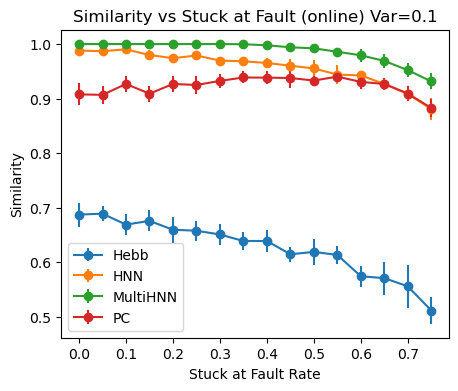

In [32]:
mem_var=0.1
params['query_type']='online'
params['data_type']='binary'
num_simulation=10
# 指定JSON文件路径
json_file_path = num_path + f"/memristor_sequence_stuck_at fault_variation={mem_var}_datatype={params['data_type']}_query_type={params['query_type']}.json"
# 从JSON文件中读取数据
with open(json_file_path, 'r') as json_file:
    data = json.load(json_file)

Hebb_similarities=data['Hebb']
HNN_similarities=data['HNN']
MultiHNN_similarities=data['MultiHNN']
PC_similarities=data['PC']

Hebb_similarities=np.array(Hebb_similarities).reshape(num_simulation,-1)
HNN_similarities=np.array(HNN_similarities).reshape(num_simulation,-1)
MultiHNN_similarities=np.array(MultiHNN_similarities).reshape(num_simulation,-1)
PC_similarities=np.array(PC_similarities).reshape(num_simulation,-1)

plt.figure(figsize=(5,4))
plt.errorbar(stuck_at_fault_list,np.mean(Hebb_similarities,axis=0),yerr=np.std(Hebb_similarities,axis=0),label='Hebb',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(HNN_similarities,axis=0),yerr=np.std(HNN_similarities,axis=0),label='HNN',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(MultiHNN_similarities,axis=0),yerr=np.std(MultiHNN_similarities,axis=0),label='MultiHNN',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(PC_similarities,axis=0),yerr=np.std(PC_similarities,axis=0),label='PC',marker='o')
plt.legend()
plt.xlabel('Stuck at Fault Rate')
plt.ylabel('Similarity')
plt.title(f'Similarity vs Stuck at Fault ({params["query_type"]}) Var={mem_var}')
plt.show()

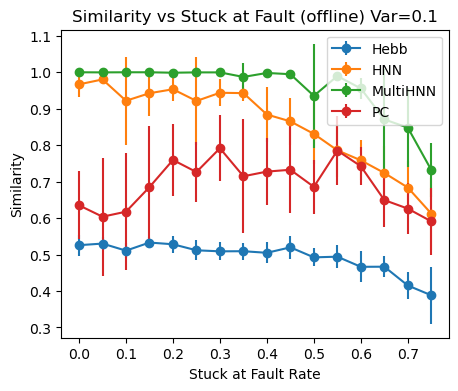

In [36]:
mem_var=0.1
params['query_type']='offline'
params['data_type']='binary'
num_simulation=10
# 指定JSON文件路径
json_file_path = num_path + f"/memristor_sequence_stuck_at fault_variation={mem_var}_datatype={params['data_type']}_query_type={params['query_type']}.json"
# 从JSON文件中读取数据
with open(json_file_path, 'r') as json_file:
    data = json.load(json_file)

Hebb_similarities=data['Hebb']
HNN_similarities=data['HNN']
MultiHNN_similarities=data['MultiHNN']
PC_similarities=data['PC']

Hebb_similarities=np.array(Hebb_similarities).reshape(num_simulation,-1)
HNN_similarities=np.array(HNN_similarities).reshape(num_simulation,-1)
MultiHNN_similarities=np.array(MultiHNN_similarities).reshape(num_simulation,-1)
PC_similarities=np.array(PC_similarities).reshape(num_simulation,-1)

plt.figure(figsize=(5,4))
plt.errorbar(stuck_at_fault_list,np.mean(Hebb_similarities,axis=0),yerr=np.std(Hebb_similarities,axis=0),label='Hebb',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(HNN_similarities,axis=0),yerr=np.std(HNN_similarities,axis=0),label='HNN',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(MultiHNN_similarities,axis=0),yerr=np.std(MultiHNN_similarities,axis=0),label='MultiHNN',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(PC_similarities,axis=0),yerr=np.std(PC_similarities,axis=0),label='PC',marker='o')
plt.legend()
plt.xlabel('Stuck at Fault Rate')
plt.ylabel('Similarity')
plt.title(f'Similarity vs Stuck at Fault ({params["query_type"]}) Var={mem_var}')
plt.show()

## sequence memory for continuous patterns

### contrast between different algorithms

In [52]:
#load data
num_samples = 100
stored_data_list=torch.from_numpy(new_mnist_data).float()
# 生成随机排列的索引
random_indices = torch.randperm(stored_data_list.size(0))[:num_samples]
# 使用随机索引选择数据
stored_data = stored_data_list[random_indices]
print(stored_data.shape)

torch.Size([100, 64])


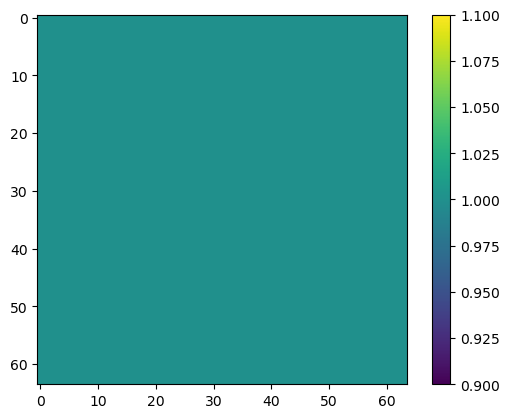

Epoch [1/200], Loss: 0.930432915687561
Epoch [2/200], Loss: 0.44480448961257935
Epoch [3/200], Loss: 0.22445686161518097
Epoch [4/200], Loss: 0.12925966084003448
Epoch [5/200], Loss: 0.08045735955238342
Epoch [6/200], Loss: 0.05554051697254181
Epoch [7/200], Loss: 0.04208808392286301
Epoch [8/200], Loss: 0.033847399055957794
Epoch [9/200], Loss: 0.028243068605661392
Epoch [10/200], Loss: 0.02420417033135891
Epoch [11/200], Loss: 0.021131739020347595
Epoch [12/200], Loss: 0.018735073506832123
Epoch [13/200], Loss: 0.016800910234451294
Epoch [14/200], Loss: 0.015218300744891167
Epoch [15/200], Loss: 0.013891912065446377
Epoch [16/200], Loss: 0.012771342881023884
Epoch [17/200], Loss: 0.011806664988398552
Epoch [18/200], Loss: 0.010972918942570686
Epoch [19/200], Loss: 0.010240728966891766
Epoch [20/200], Loss: 0.009597022086381912
Epoch [21/200], Loss: 0.00902307778596878
Epoch [22/200], Loss: 0.00851172674447298
Epoch [23/200], Loss: 0.008050329051911831
Epoch [24/200], Loss: 0.00763486

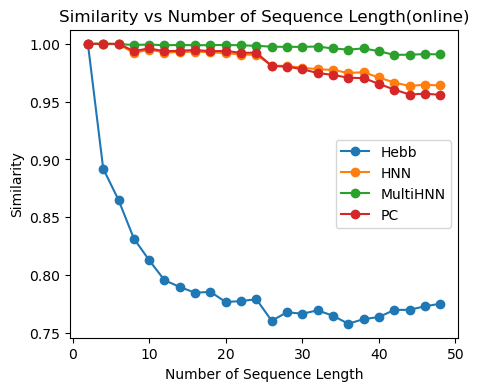

In [41]:
device='cpu'
input_size=stored_data.shape[1]
encoder_dim=32
num_hidden_layers=1
nonlin='tanh'
learn_lr=1e-3
learn_iters=200
params={
    'input_size':input_size,
    'encoder_dim':encoder_dim,
    'num_hidden_layers':num_hidden_layers,
    'nonlin':nonlin,
    'learn_lr':learn_lr,
    'learn_iters':learn_iters,
    'device':device,
    'recall_iters':100,
    'data_type':'continuous',
    
    'sep':1,
}


params['data_set']='mnist'
params['repeat']=10
params['query_type']='online'
params['distance_type']='cos'
#plot settings
plot_weight_flag=True

seq_length=np.arange(2,50,2)
#memristor variation and stuck at fault
mem_var=0.0
stuck_at_fault_rate=0.0

mask_0=1-stuck_0
mask_1=1-stuck_1

mem_stuck_mask=mask_0[0:input_size,0:input_size]*mask_1[0:input_size,0:input_size]
mem_stuck_mask=torch.from_numpy(mem_stuck_mask).float()
mem_stuck_mask=torch.ones(input_size,input_size)
# mem_stuck_mask=generate_mask(1,49,stuck_at_fault_rate)
plt.imshow(mem_stuck_mask)
plt.colorbar()
plt.show()

Hebb_similarities=[]
HNN_similarities=[]
MultiHNN_similarities=[]
PC_similarities=[]
for num_seq in seq_length:
    stored_data=stored_data_list[0:num_seq]
    # create the network
    hnn=SingleLayerHNN_lambda(input_size=input_size)
    multi_hnn=MultiLayerHNN(input_dim=input_size,encoding_dim=encoder_dim,num_hidden_layers=num_hidden_layers,nolinear=nonlin)
    pc=SingleLayertPC(input_size=input_size,nonlin=params['nonlin'])
    multi_pc=MultilayertPC(hidden_size=encoder_dim,output_size=input_size)

    Hebb=ModernAsymmetricHopfieldNetwork(input_size=input_size,sep=params['sep'])
    optimizer_hnn = torch.optim.RMSprop(hnn.parameters(), lr=learn_lr)
    optimizer_multi = torch.optim.RMSprop(multi_hnn.parameters(), lr=learn_lr)
    optimizer_pc=torch.optim.RMSprop(pc.parameters(),lr=learn_lr)
    optimizer_multi_pc=torch.optim.RMSprop(multi_pc.parameters(),lr=learn_lr)

    hnn.clear_mask()
    hnn_losses=train_multilayer_sequence(hnn, optimizer_hnn, stored_data, learn_iters, device)
    hnn.add_variation(var=mem_var)
    multi_hnn_losses=train_multilayer_sequence(multi_hnn,optimizer_multi,stored_data,learn_iters,device)
    pc_losses=train_singlelayer_tPC(pc,optimizer_pc,stored_data,learn_iters,device)
    # multi_pc_losses=train_multilayer_tPC(multi_pc,optimizer_multi_pc,stored_data,learn_iters,inf_iters=100,inf_lr=1e-2,device=device)
    
    Hebb_recall=hn_sequence_recall(Hebb,stored_data,device,params)
    HNN_recall = singlelayer_sequence_recall(hnn, stored_data, device, params)
    MultiHNN_recall=singlelayer_sequence_recall(multi_hnn,stored_data,device,params)
    PC_recall=singlelayer_sequence_recall(pc,stored_data,device,params)

    Hebb_similarities.append(to_np(torch.mean(calculate_sim(Hebb_recall,stored_data,distance_type=params['distance_type']))))
    HNN_similarities.append(to_np(torch.mean(calculate_sim(HNN_recall,stored_data,distance_type=params['distance_type']))))
    MultiHNN_similarities.append(to_np(torch.mean(calculate_sim(MultiHNN_recall,stored_data,distance_type=params['distance_type']))))
    PC_similarities.append(to_np(torch.mean(calculate_sim(PC_recall,stored_data,distance_type=params['distance_type']))))
    
plt.figure(figsize=(5,4),dpi=100)
plt.plot(seq_length,Hebb_similarities,label='Hebb',marker='o')
plt.plot(seq_length,HNN_similarities,label='HNN',marker='o')
plt.plot(seq_length,MultiHNN_similarities,label='MultiHNN',marker='o')
plt.plot(seq_length,PC_similarities,label='PC',marker='o')
plt.legend()
plt.xlabel('Number of Sequence Length')
plt.ylabel('Similarity')
plt.title(f'Similarity vs Number of Sequence Length({params["query_type"]})')
plt.show()

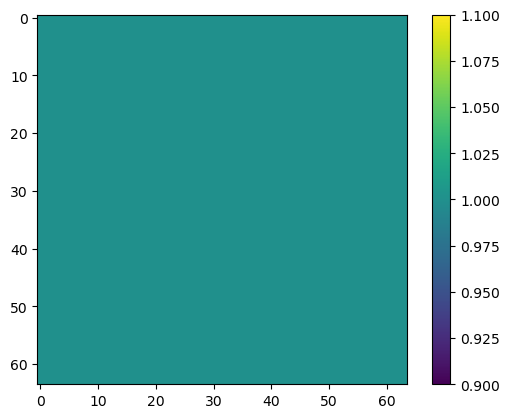

Epoch [1/1000], Loss: 0.8886475563049316
Epoch [2/1000], Loss: 0.7243678569793701
Epoch [3/1000], Loss: 0.622588574886322
Epoch [4/1000], Loss: 0.548285722732544
Epoch [5/1000], Loss: 0.49011215567588806
Epoch [6/1000], Loss: 0.44272658228874207
Epoch [7/1000], Loss: 0.4031156897544861
Epoch [8/1000], Loss: 0.36938756704330444
Epoch [9/1000], Loss: 0.3402659595012665
Epoch [10/1000], Loss: 0.31484442949295044
Epoch [11/1000], Loss: 0.29245349764823914
Epoch [12/1000], Loss: 0.27258387207984924
Epoch [13/1000], Loss: 0.2548384368419647
Epoch [14/1000], Loss: 0.23890180885791779
Epoch [15/1000], Loss: 0.22451913356781006
Epoch [16/1000], Loss: 0.21148182451725006
Epoch [17/1000], Loss: 0.19961731135845184
Epoch [18/1000], Loss: 0.1887812316417694
Epoch [19/1000], Loss: 0.178851917386055
Epoch [20/1000], Loss: 0.1697259396314621
Epoch [21/1000], Loss: 0.16131491959095
Epoch [22/1000], Loss: 0.15354272723197937
Epoch [23/1000], Loss: 0.14634360373020172
Epoch [24/1000], Loss: 0.13966022431

KeyboardInterrupt: 

In [67]:
device='cpu'
input_size=stored_data.shape[1]
encoder_dim=64
num_hidden_layers=1
nonlin='tanh'
learn_lr=3e-4
learn_iters=1000
params={
    'input_size':input_size,
    'encoder_dim':encoder_dim,
    'num_hidden_layers':num_hidden_layers,
    'nonlin':nonlin,
    'learn_lr':learn_lr,
    'learn_iters':learn_iters,
    'device':device,
    'recall_iters':100,
    'data_type':'continuous',
    
    'sep':1,
}


params['data_set']='mnist'
params['repeat']=10
params['query_type']='online'
params['distance_type']='cos'
#plot settings
plot_weight_flag=True

seq_length=np.arange(2,50,2)
#memristor variation and stuck at fault
mem_var=0.0
stuck_at_fault_rate=0.0

mask_0=1-stuck_0
mask_1=1-stuck_1

mem_stuck_mask=mask_0[0:input_size,0:input_size]*mask_1[0:input_size,0:input_size]
mem_stuck_mask=torch.from_numpy(mem_stuck_mask).float()
mem_stuck_mask=torch.ones(input_size,input_size)
# mem_stuck_mask=generate_mask(1,49,stuck_at_fault_rate)
plt.imshow(mem_stuck_mask)
plt.colorbar()
plt.show()

Hebb_similarities=[]
HNN_similarities=[]
MultiHNN_similarities=[]
PC_similarities=[]
for num_seq in seq_length:
    stored_data=stored_data_list[0:num_seq]
    # create the network
    hnn=SingleLayerHNN_lambda(input_size=input_size)
    multi_hnn=MultiLayerHNN(input_dim=input_size,encoding_dim=encoder_dim,num_hidden_layers=num_hidden_layers,nolinear=nonlin)


    optimizer_hnn = torch.optim.RMSprop(hnn.parameters(), lr=learn_lr)
    optimizer_multi = torch.optim.RMSprop(multi_hnn.parameters(), lr=learn_lr)


    hnn.clear_mask()
    hnn_losses=train_multilayer_sequence(hnn, optimizer_hnn, stored_data, learn_iters, device)
    hnn.add_variation(var=mem_var)
    multi_hnn_losses=train_multilayer_sequence(multi_hnn,optimizer_multi,stored_data,learn_iters,device)

    

    HNN_recall = singlelayer_sequence_recall(hnn, stored_data, device, params)
    MultiHNN_recall=singlelayer_sequence_recall(multi_hnn,stored_data,device,params)



    HNN_similarities.append(to_np(torch.mean(calculate_sim(HNN_recall,stored_data,distance_type=params['distance_type']))))
    MultiHNN_similarities.append(to_np(torch.mean(calculate_sim(MultiHNN_recall,stored_data,distance_type=params['distance_type']))))

np.savez(f'HNN_Hetero_Asso_cont_{num_hidden_layers}_{encoder_dim}.npz',HNN_similarities=HNN_similarities,MultiHNN_similarities=MultiHNN_similarities,seq_length=seq_length)
    
plt.figure(figsize=(5,4),dpi=100)
plt.plot(seq_length,HNN_similarities,label='HNN',marker='o')
plt.plot(seq_length,MultiHNN_similarities,label='MultiHNN',marker='o')
plt.legend()
plt.xlabel('Number of Sequence Length')
plt.ylabel('Similarity')
plt.title(f'Similarity vs Number of Sequence Length({params["query_type"]})')
plt.show()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


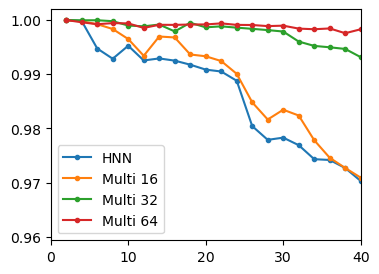

In [57]:
params={}
params['query_type']='online'   
results=np.load(f'HNN_Hetero_Asso_cont_1_16.npz')
HNN_similarities=results['HNN_similarities']
MultiHNN_similarities_16=results['MultiHNN_similarities']
seq_length=results['seq_length']
results=np.load(f'HNN_Hetero_Asso_cont_1_24.npz')
MultiHNN_similarities_24=results['MultiHNN_similarities']
results=np.load(f'HNN_Hetero_Asso_cont_1_32.npz')
MultiHNN_similarities_32=results['MultiHNN_similarities']
results=np.load(f'HNN_Hetero_Asso_cont_1_48.npz')
MultiHNN_similarities_48=results['MultiHNN_similarities']
results=np.load(f'HNN_Hetero_Asso_cont_1_64.npz')
MultiHNN_similarities_64=results['MultiHNN_similarities']


plt.figure(figsize=(4,3),dpi=100)
plt.plot(seq_length,HNN_similarities,label='HNN',marker='.')
plt.plot(seq_length,MultiHNN_similarities_16,label='Multi 16',marker='.')
# plt.plot(seq_length,MultiHNN_similarities_24,label='MultiHNN_24',marker='.')
plt.plot(seq_length,MultiHNN_similarities_32,label='Multi 32',marker='.')
# plt.plot(seq_length,MultiHNN_similarities_48,label='MultiHNN_48',marker='.')
plt.plot(seq_length,MultiHNN_similarities_64,label='Multi 64',marker='.')
plt.legend()
plt.xlim(0,40)
# plt.xlabel('Number of Sequence Length')
# plt.ylabel('Similarity')
# plt.title(f'Similarity vs Number of Sequence Length({params["query_type"]})')
plt.savefig(f'fig/HNN_Hetero_Asso_cont_1.eps',format='eps',bbox_inches='tight')
plt.show()

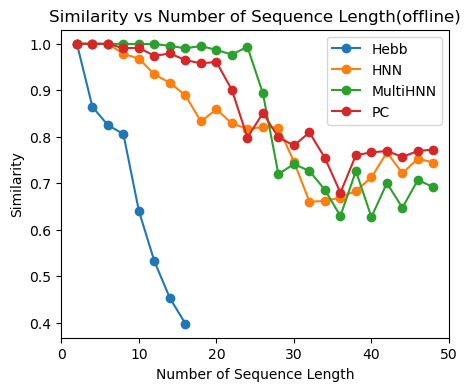

In [40]:
plt.figure(figsize=(5,4),dpi=100)
plt.plot(seq_length,Hebb_similarities,label='Hebb',marker='o')
plt.plot(seq_length,HNN_similarities,label='HNN',marker='o')
plt.plot(seq_length,MultiHNN_similarities,label='MultiHNN',marker='o')
plt.plot(seq_length,PC_similarities,label='PC',marker='o')
plt.legend()
plt.xlabel('Number of Sequence Length')
plt.ylabel('Similarity')
plt.xlim(0,50)
plt.title(f'Similarity vs Number of Sequence Length({params["query_type"]})')
plt.show()

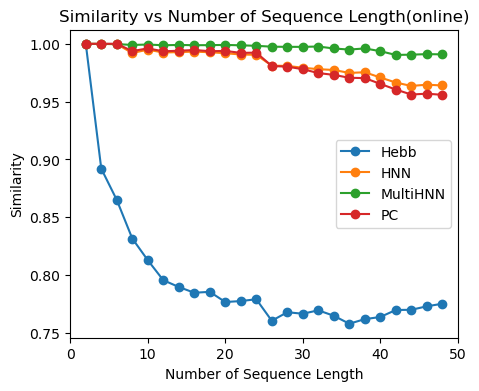

In [42]:
plt.figure(figsize=(5,4),dpi=100)
plt.plot(seq_length,Hebb_similarities,label='Hebb',marker='o')
plt.plot(seq_length,HNN_similarities,label='HNN',marker='o')
plt.plot(seq_length,MultiHNN_similarities,label='MultiHNN',marker='o')
plt.plot(seq_length,PC_similarities,label='PC',marker='o')
plt.legend()
plt.xlabel('Number of Sequence Length')
plt.ylabel('Similarity')
plt.xlim(0,50)
plt.title(f'Similarity vs Number of Sequence Length({params["query_type"]})')
plt.show()

### Memristor Variation

In [43]:
#load data
num_samples = 100
stored_data_list=torch.from_numpy(new_mnist_data).float()
# 生成随机排列的索引
random_indices = torch.randperm(stored_data_list.size(0))[:num_samples]
# 使用随机索引选择数据
stored_data = stored_data_list[random_indices]

stored_data=stored_data_list[0:num_samples]
print(stored_data.shape)

torch.Size([100, 64])


In [19]:
n=405
num_samples = 10
stored_data_list=torch.from_numpy(new_mnist_data_order).float()
stored_data = stored_data_list[n::1000]
stored_data=stored_data[0:num_samples]

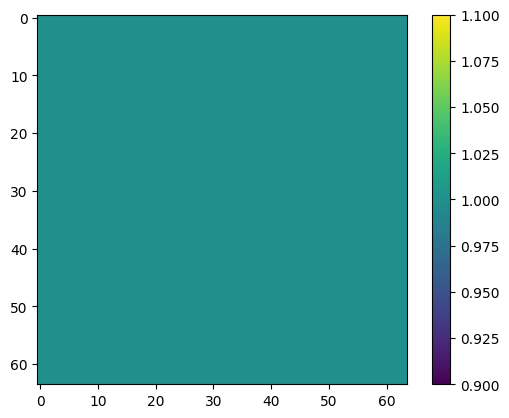

Epoch 10, loss 0.1621929671615362
Epoch 20, loss 0.1097374782897532
Epoch 30, loss 0.0829138387925923
Epoch 40, loss 0.06880959959235042
Epoch 50, loss 0.07293233885429799
Epoch 60, loss 0.06679216770571655
Epoch 70, loss 0.06423281589522957
Epoch 80, loss 0.0700006236158515
Epoch 90, loss 0.05437494757534296
Epoch 100, loss 0.05579990604564955
Epoch 110, loss 0.0692255504342029
Epoch 120, loss 0.059206590597023025
Epoch 130, loss 0.0661484869708147
Epoch 140, loss 0.06852947813613354
Epoch 150, loss 0.06698343248099266
Epoch 160, loss 0.06522156148876092
Epoch 170, loss 0.07408842082331832
Epoch 180, loss 0.06917831174150707
Epoch 190, loss 0.06888340066288949
Epoch 200, loss 0.055340712548786544
training PC complete, time: 0.6476390361785889
Epoch 10, loss 0.1621929671615362
Epoch 20, loss 0.1097374782897532
Epoch 30, loss 0.0829138387925923
Epoch 40, loss 0.06880959959235042
Epoch 50, loss 0.07293233885429799
Epoch 60, loss 0.06679216770571655
Epoch 70, loss 0.06423281589522957
Epoc

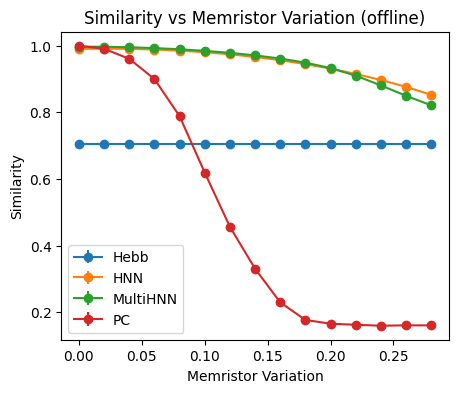

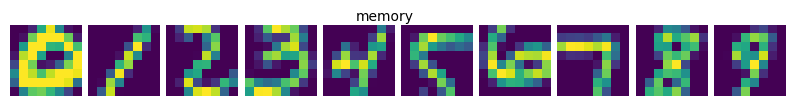

In [27]:
import json

device='cpu'
input_size=stored_data.shape[1]
encoder_dim=32
num_hidden_layers=1
nonlin='tanh'
learn_lr=1e-3
learn_iters=200
params={
    'input_size':input_size,
    'encoder_dim':encoder_dim,
    'num_hidden_layers':num_hidden_layers,
    'nonlin':nonlin,
    'learn_lr':learn_lr,
    'learn_iters':learn_iters,
    'device':device,
    'recall_iters':100,
    'data_type':'continuous',
    
    'sep':1,
    'plot_num_per_row':10,
}


params['data_set']='mnist'
params['repeat']=10
params['query_type']='offline'
params['distance_type']='cos'
#plot settings
plot_weight_flag=True
num_simulation=10

#memristor variation and stuck at fault
mem_var_list=np.arange(0,0.3,0.02)
stuck_at_fault_rate=0.0
stored_data=stored_data[0:10]
mask_0=1-stuck_0
mask_1=1-stuck_1

mem_stuck_mask=mask_0[0:input_size,0:input_size]*mask_1[0:input_size,0:input_size]
mem_stuck_mask=torch.from_numpy(mem_stuck_mask).float()

mem_stuck_mask=torch.ones(input_size,input_size)
# mem_stuck_mask=generate_mask(1,49,stuck_at_fault_rate)
plt.imshow(mem_stuck_mask)
plt.colorbar()
plt.show()

Hebb_similarities=[]
HNN_similarities=[]
MultiHNN_similarities=[]
PC_similarities=[]
for _ in range(num_simulation):
    for mem_var in mem_var_list:
        # create the network
        hnn=SingleLayerHNN_lambda(input_size=input_size)
        multi_hnn=MultiLayerHNN_beta(input_dim=input_size,encoding_dim=encoder_dim,num_hidden_layers=num_hidden_layers,nolinear=nonlin)
        pc=SingleLayertPC(input_size=input_size,nonlin=params['nonlin'])
        multi_pc=MultilayertPC(hidden_size=encoder_dim,output_size=input_size)

        Hebb=ModernAsymmetricHopfieldNetwork(input_size=input_size,sep=params['sep'])
        optimizer_hnn = torch.optim.RMSprop(hnn.parameters(), lr=learn_lr)
        optimizer_multi = torch.optim.RMSprop(multi_hnn.parameters(), lr=learn_lr)
        optimizer_pc=torch.optim.RMSprop(pc.parameters(),lr=learn_lr)
        optimizer_multi_pc=torch.optim.RMSprop(multi_pc.parameters(),lr=learn_lr)

        hnn.clear_mask()
        hnn_losses=train_multilayer_sequence_batch(hnn, optimizer_hnn, stored_data, learn_iters, device)
        hnn.add_variation(var=mem_var)
        multi_hnn_losses=train_multilayer_sequence_batch(multi_hnn,optimizer_multi,stored_data,learn_iters,device)
        multi_hnn.add_variation(var=mem_var)
        pc_losses=train_singlelayer_tPC(pc,optimizer_pc,stored_data,learn_iters,device)
        pc.add_variation(variation=mem_var)  
        # multi_pc_losses=train_multilayer_tPC(multi_pc,optimizer_multi_pc,stored_data,learn_iters,inf_iters=100,inf_lr=1e-2,device=device)
        
        Hebb_recall=hn_sequence_recall(Hebb,stored_data,device,params)
        HNN_recall = singlelayer_sequence_recall(hnn, stored_data, device, params)
        MultiHNN_recall=singlelayer_sequence_recall(multi_hnn,stored_data,device,params)
        PC_recall=singlelayer_sequence_recall(pc,stored_data,device,params)

        Hebb_similarities.append(to_np(torch.mean(calculate_sim(Hebb_recall,stored_data,distance_type=params['distance_type']))).item())
        HNN_similarities.append(to_np(torch.mean(calculate_sim(HNN_recall,stored_data,distance_type=params['distance_type']))).item())
        MultiHNN_similarities.append(to_np(torch.mean(calculate_sim(MultiHNN_recall,stored_data,distance_type=params['distance_type']))).item())
        PC_similarities.append(to_np(torch.mean(calculate_sim(PC_recall,stored_data,distance_type=params['distance_type']))).item())

results={}
results['Hebb']=Hebb_similarities
results['HNN']=HNN_similarities
results['MultiHNN']=MultiHNN_similarities
results['PC']=PC_similarities
json.dump(results, open(num_path + f"/memristor_sequence_variation_datatype={params['data_type']}_query_type={params['query_type']}.json", 'w'))

Hebb_similarities=np.array(Hebb_similarities).reshape(num_simulation,len(mem_var_list))
HNN_similarities=np.array(HNN_similarities).reshape(num_simulation,len(mem_var_list))
MultiHNN_similarities=np.array(MultiHNN_similarities).reshape(num_simulation,len(mem_var_list))
PC_similarities=np.array(PC_similarities).reshape(num_simulation,len(mem_var_list))



plt.figure(figsize=(5,4))
plt.errorbar(mem_var_list,np.mean(Hebb_similarities,axis=0),yerr=np.std(Hebb_similarities,axis=0),label='Hebb',marker='o')
plt.errorbar(mem_var_list,np.mean(HNN_similarities,axis=0),yerr=np.std(HNN_similarities,axis=0),label='HNN',marker='o')
plt.errorbar(mem_var_list,np.mean(MultiHNN_similarities,axis=0),yerr=np.std(MultiHNN_similarities,axis=0),label='MultiHNN',marker='o')
plt.errorbar(mem_var_list,np.mean(PC_similarities,axis=0),yerr=np.std(PC_similarities,axis=0),label='PC',marker='o')
plt.legend()
plt.xlabel('Memristor Variation')
plt.ylabel('Similarity')
plt.title(f'Similarity vs Memristor Variation ({params["query_type"]})')
plt.show()


plot_memory(stored_data, 1, fig_path, params)

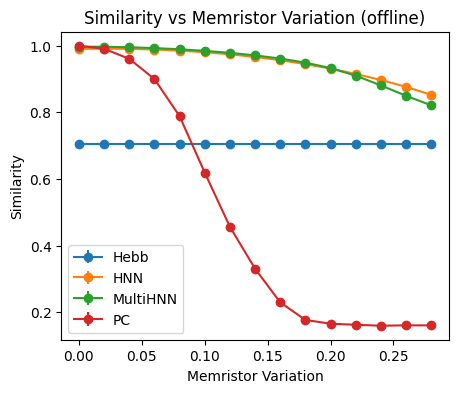

In [30]:
params['query_type']='offline'
params['data_type']='continuous'
num_simulation=10
# 指定JSON文件路径
json_file_path = num_path + f"/memristor_sequence_variation_datatype={params['data_type']}_query_type={params['query_type']}.json"
# 从JSON文件中读取数据
with open(json_file_path, 'r') as json_file:
    data = json.load(json_file)

Hebb_similarities=data['Hebb']
HNN_similarities=data['HNN']
MultiHNN_similarities=data['MultiHNN']
PC_similarities=data['PC']

Hebb_similarities=np.array(Hebb_similarities).reshape(num_simulation,-1)
HNN_similarities=np.array(HNN_similarities).reshape(num_simulation,-1)
MultiHNN_similarities=np.array(MultiHNN_similarities).reshape(num_simulation,-1)
PC_similarities=np.array(PC_similarities).reshape(num_simulation,-1)

plt.figure(figsize=(5,4))
plt.errorbar(mem_var_list,np.mean(Hebb_similarities,axis=0),yerr=np.std(Hebb_similarities,axis=0),label='Hebb',marker='o')
plt.errorbar(mem_var_list,np.mean(HNN_similarities,axis=0),yerr=np.std(HNN_similarities,axis=0),label='HNN',marker='o')
plt.errorbar(mem_var_list,np.mean(MultiHNN_similarities,axis=0),yerr=np.std(MultiHNN_similarities,axis=0),label='MultiHNN',marker='o')
plt.errorbar(mem_var_list,np.mean(PC_similarities,axis=0),yerr=np.std(PC_similarities,axis=0),label='PC',marker='o')
plt.legend()
plt.xlabel('Memristor Variation')
plt.ylabel('Similarity')
plt.title(f'Similarity vs Memristor Variation ({params["query_type"]})')
plt.show()

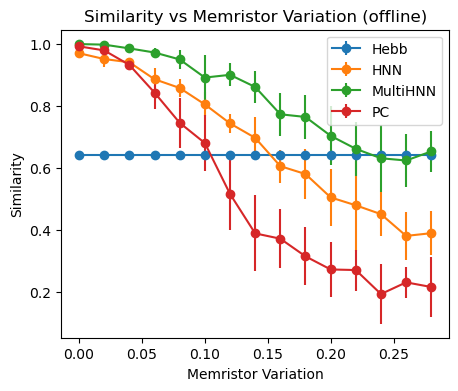

In [57]:
params['query_type']='offline'
params['data_type']='continuous'
num_simulation=10
# 指定JSON文件路径
json_file_path = num_path + f"/memristor_sequence_variation_datatype={params['data_type']}_query_type={params['query_type']}.json"
# 从JSON文件中读取数据
with open(json_file_path, 'r') as json_file:
    data = json.load(json_file)

Hebb_similarities=data['Hebb']
HNN_similarities=data['HNN']
MultiHNN_similarities=data['MultiHNN']
PC_similarities=data['PC']

Hebb_similarities=np.array(Hebb_similarities).reshape(num_simulation,-1)
HNN_similarities=np.array(HNN_similarities).reshape(num_simulation,-1)
MultiHNN_similarities=np.array(MultiHNN_similarities).reshape(num_simulation,-1)
PC_similarities=np.array(PC_similarities).reshape(num_simulation,-1)

plt.figure(figsize=(5,4))
plt.errorbar(mem_var_list,np.mean(Hebb_similarities,axis=0),yerr=np.std(Hebb_similarities,axis=0),label='Hebb',marker='o')
plt.errorbar(mem_var_list,np.mean(HNN_similarities,axis=0),yerr=np.std(HNN_similarities,axis=0),label='HNN',marker='o')
plt.errorbar(mem_var_list,np.mean(MultiHNN_similarities,axis=0),yerr=np.std(MultiHNN_similarities,axis=0),label='MultiHNN',marker='o')
plt.errorbar(mem_var_list,np.mean(PC_similarities,axis=0),yerr=np.std(PC_similarities,axis=0),label='PC',marker='o')
plt.legend()
plt.xlabel('Memristor Variation')
plt.ylabel('Similarity')
plt.title(f'Similarity vs Memristor Variation ({params["query_type"]})')
plt.show()

### Memristor Stuck At Fault

In [23]:
#load data
num_samples = 100
stored_data_list=torch.from_numpy(new_mnist_data).float()
# 生成随机排列的索引
random_indices = torch.randperm(stored_data_list.size(0))[:num_samples]
# 使用随机索引选择数据
stored_data = stored_data_list[random_indices]
stored_data=stored_data_list[0:num_samples]
print(stored_data.shape)

torch.Size([100, 64])


In [24]:
n=405
num_samples = 10
stored_data_list=torch.from_numpy(new_mnist_data_order).float()
stored_data = stored_data_list[n::1000]
stored_data=stored_data[0:num_samples]

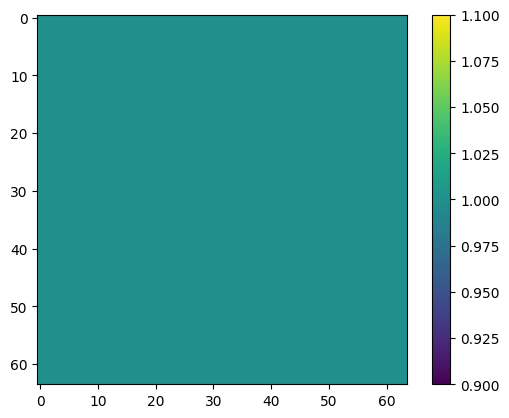

Epoch 10, loss 0.17031614258885383
Epoch 20, loss 0.10498621407896282
Epoch 30, loss 0.09428957882337272
Epoch 40, loss 0.0753689346369356
Epoch 50, loss 0.07641460050363091
Epoch 60, loss 0.06832409634371288
Epoch 70, loss 0.06196251884684899
Epoch 80, loss 0.06842690537014276
Epoch 90, loss 0.06730757208060822
Epoch 100, loss 0.06624047353107017
Epoch 110, loss 0.06879481663854677
Epoch 120, loss 0.0702805268661905
Epoch 130, loss 0.06465722902103153
Epoch 140, loss 0.07683314211280957
Epoch 150, loss 0.0597635796853865
Epoch 160, loss 0.06999807397296536
Epoch 170, loss 0.08893758466128932
Epoch 180, loss 0.06678363142709715
Epoch 190, loss 0.06059936052915873
Epoch 200, loss 0.059866292043443535
training PC complete, time: 0.7140376567840576
Epoch 10, loss 0.17466009631752966
Epoch 20, loss 0.10821439959108829
Epoch 30, loss 0.09715399481356143
Epoch 40, loss 0.07701485049910843
Epoch 50, loss 0.0778550359653309
Epoch 60, loss 0.06752995079732499
Epoch 70, loss 0.062436836594133634

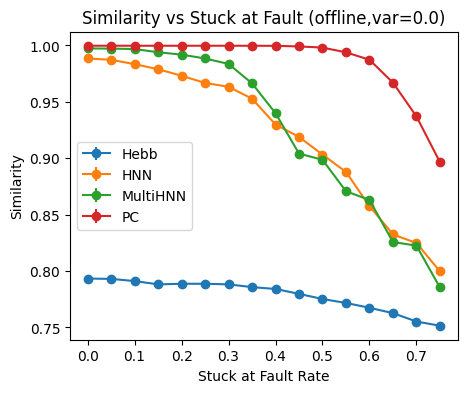

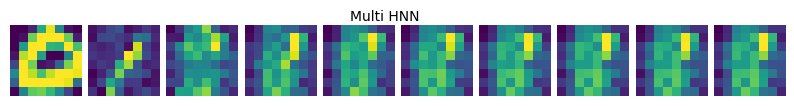

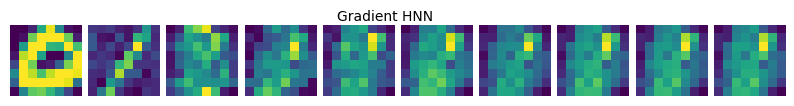

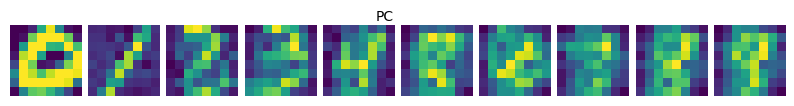

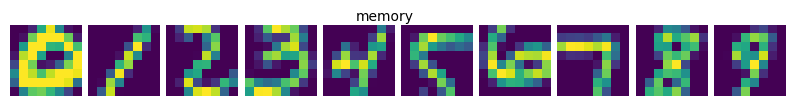

In [28]:
device='cpu'
input_size=stored_data.shape[1]
encoder_dim=32
num_hidden_layers=1
nonlin='tanh'
learn_lr=1e-3
learn_iters=200
params={
    'input_size':input_size,
    'encoder_dim':encoder_dim,
    'num_hidden_layers':num_hidden_layers,
    'nonlin':nonlin,
    'learn_lr':learn_lr,
    'learn_iters':learn_iters,
    'device':device,
    'recall_iters':100,
    'data_type':'continuous',
    
    'sep':'hebb',
    'plot_num_per_row':10,
}


params['data_set']='mnist'
params['repeat']=10
params['query_type']='offline'
params['distance_type']='cos'
#plot settings
plot_weight_flag=True
num_simulation=10

#memristor variation and stuck at fault
stuck_at_fault_list=np.arange(0,0.8,0.05)
mem_var=0.0

stored_data=stored_data[0:10]
mask_0=1-stuck_0
mask_1=1-stuck_1

mem_stuck_mask=mask_0[0:input_size,0:input_size]*mask_1[0:input_size,0:input_size]
mem_stuck_mask=torch.from_numpy(mem_stuck_mask).float()

mem_stuck_mask=torch.ones(input_size,input_size)
# mem_stuck_mask=generate_mask(1,49,stuck_at_fault_rate)
plt.imshow(mem_stuck_mask)
plt.colorbar()
plt.show()

Hebb_similarities=[]
HNN_similarities=[]
MultiHNN_similarities=[]
PC_similarities=[]
for _ in range(num_simulation):
    for stuck_at_fault_rate in stuck_at_fault_list:
        mem_stuck_mask=generate_mask(64,stuck_at_fault_rate)
        # create the network
        hnn=SingleLayerHNN_lambda(input_size=input_size)
        multi_hnn=MultiLayerHNN_beta(input_dim=input_size,encoding_dim=encoder_dim,num_hidden_layers=num_hidden_layers,nolinear=nonlin,noise_level=0.0,mask_prob=stuck_at_fault_rate)
        pc=SingleLayertPC(input_size=input_size,nonlin=params['nonlin'])
        multi_pc=MultilayertPC(hidden_size=encoder_dim,output_size=input_size)

        Hebb=ModernAsymmetricHopfieldNetwork(input_size=input_size,sep=params['sep'])
        optimizer_hnn = torch.optim.RMSprop(hnn.parameters(), lr=learn_lr)
        optimizer_multi = torch.optim.RMSprop(multi_hnn.parameters(), lr=learn_lr)
        optimizer_pc=torch.optim.RMSprop(pc.parameters(),lr=learn_lr)
        optimizer_multi_pc=torch.optim.RMSprop(multi_pc.parameters(),lr=learn_lr)


        hnn.clear_mask()
        hnn.set_mask(mem_stuck_mask)
        hnn_losses=train_multilayer_sequence_batch(hnn, optimizer_hnn, stored_data, learn_iters, device)
        hnn.add_variation(var=mem_var)
        multi_hnn_losses=train_multilayer_sequence_batch(multi_hnn,optimizer_multi,stored_data,learn_iters,device)
        multi_hnn.add_variation(var=mem_var)
        Hebb.train(stored_data)
        Hebb.add_weight_variation(variation=mem_var)
        Hebb.add_mask(mem_stuck_mask)


        pc.set_mask(mem_stuck_mask)
        pc_losses=train_singlelayer_tPC(pc,optimizer_pc,stored_data,learn_iters,device)
        pc.add_variation(variation=mem_var)  
        # multi_pc_losses=train_multilayer_tPC(multi_pc,optimizer_multi_pc,stored_data,learn_iters,inf_iters=100,inf_lr=1e-2,device=device)
        
        Hebb_recall=hn_sequence_recall(Hebb,stored_data,device,params)
        HNN_recall = singlelayer_sequence_recall(hnn, stored_data, device, params)
        MultiHNN_recall=singlelayer_sequence_recall(multi_hnn,stored_data,device,params)
        PC_recall=singlelayer_sequence_recall(pc,stored_data,device,params)

        Hebb_similarities.append(to_np(torch.mean(calculate_sim(Hebb_recall,stored_data,distance_type=params['distance_type']))).item())
        HNN_similarities.append(to_np(torch.mean(calculate_sim(HNN_recall,stored_data,distance_type=params['distance_type']))).item())
        MultiHNN_similarities.append(to_np(torch.mean(calculate_sim(MultiHNN_recall,stored_data,distance_type=params['distance_type']))).item())
        PC_similarities.append(to_np(torch.mean(calculate_sim(PC_recall,stored_data,distance_type=params['distance_type']))).item())

results={}
results['Hebb']=Hebb_similarities
results['HNN']=HNN_similarities
results['MultiHNN']=MultiHNN_similarities
results['PC']=PC_similarities
json.dump(results, open(num_path + f"/memristor_sequence_stuck_at fault_variation={mem_var}_datatype={params['data_type']}_query_type={params['query_type']}.json", 'w'))

Hebb_similarities=np.array(Hebb_similarities).reshape(num_simulation,-1)
HNN_similarities=np.array(HNN_similarities).reshape(num_simulation,-1)
MultiHNN_similarities=np.array(MultiHNN_similarities).reshape(num_simulation,-1)
PC_similarities=np.array(PC_similarities).reshape(num_simulation,-1)



plt.figure(figsize=(5,4))
plt.errorbar(stuck_at_fault_list,np.mean(Hebb_similarities,axis=0),yerr=np.std(Hebb_similarities,axis=0),label='Hebb',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(HNN_similarities,axis=0),yerr=np.std(HNN_similarities,axis=0),label='HNN',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(MultiHNN_similarities,axis=0),yerr=np.std(MultiHNN_similarities,axis=0),label='MultiHNN',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(PC_similarities,axis=0),yerr=np.std(PC_similarities,axis=0),label='PC',marker='o')
plt.legend()
plt.xlabel('Stuck at Fault Rate')
plt.ylabel('Similarity')
plt.title(f'Similarity vs Stuck at Fault ({params["query_type"]},var={mem_var})')
plt.show()


plot_recalls(MultiHNN_recall, 'Multi HNN', fig_path, params)
plot_recalls(HNN_recall, 'Gradient HNN', fig_path, params)
plot_recalls(PC_recall, 'PC', fig_path, params)

plot_memory(stored_data, 1, fig_path, params)

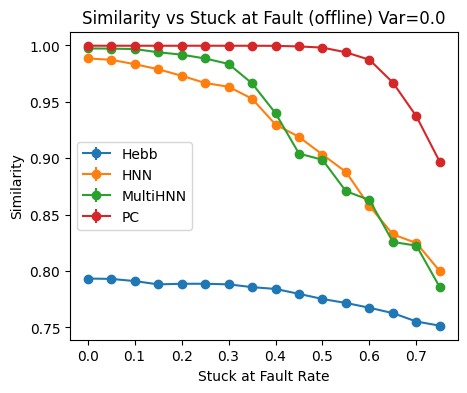

In [31]:
mem_var=0.0
params['query_type']='offline'
params['data_type']='continuous'
num_simulation=10
# 指定JSON文件路径
json_file_path = num_path + f"/memristor_sequence_stuck_at fault_variation={mem_var}_datatype={params['data_type']}_query_type={params['query_type']}.json"
# 从JSON文件中读取数据
with open(json_file_path, 'r') as json_file:
    data = json.load(json_file)

Hebb_similarities=data['Hebb']
HNN_similarities=data['HNN']
MultiHNN_similarities=data['MultiHNN']
PC_similarities=data['PC']

Hebb_similarities=np.array(Hebb_similarities).reshape(num_simulation,-1)
HNN_similarities=np.array(HNN_similarities).reshape(num_simulation,-1)
MultiHNN_similarities=np.array(MultiHNN_similarities).reshape(num_simulation,-1)
PC_similarities=np.array(PC_similarities).reshape(num_simulation,-1)

plt.figure(figsize=(5,4))
plt.errorbar(stuck_at_fault_list,np.mean(Hebb_similarities,axis=0),yerr=np.std(Hebb_similarities,axis=0),label='Hebb',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(HNN_similarities,axis=0),yerr=np.std(HNN_similarities,axis=0),label='HNN',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(MultiHNN_similarities,axis=0),yerr=np.std(MultiHNN_similarities,axis=0),label='MultiHNN',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(PC_similarities,axis=0),yerr=np.std(PC_similarities,axis=0),label='PC',marker='o')
plt.legend()
plt.xlabel('Stuck at Fault Rate')
plt.ylabel('Similarity')
plt.title(f'Similarity vs Stuck at Fault ({params["query_type"]}) Var={mem_var}')
plt.show()

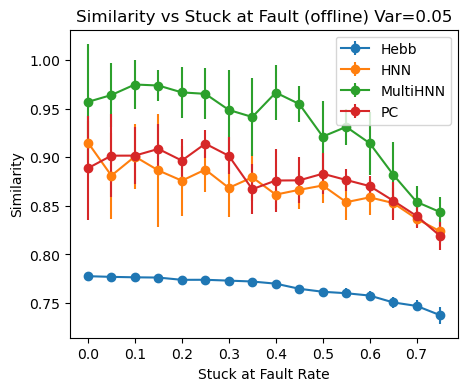

In [22]:
mem_var=0.05
params['query_type']='offline'
params['data_type']='continuous'
num_simulation=10
# 指定JSON文件路径
json_file_path = num_path + f"/memristor_sequence_stuck_at fault_variation={mem_var}_datatype={params['data_type']}_query_type={params['query_type']}.json"
# 从JSON文件中读取数据
with open(json_file_path, 'r') as json_file:
    data = json.load(json_file)

Hebb_similarities=data['Hebb']
HNN_similarities=data['HNN']
MultiHNN_similarities=data['MultiHNN']
PC_similarities=data['PC']

Hebb_similarities=np.array(Hebb_similarities).reshape(num_simulation,-1)
HNN_similarities=np.array(HNN_similarities).reshape(num_simulation,-1)
MultiHNN_similarities=np.array(MultiHNN_similarities).reshape(num_simulation,-1)
PC_similarities=np.array(PC_similarities).reshape(num_simulation,-1)

plt.figure(figsize=(5,4))
plt.errorbar(stuck_at_fault_list,np.mean(Hebb_similarities,axis=0),yerr=np.std(Hebb_similarities,axis=0),label='Hebb',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(HNN_similarities,axis=0),yerr=np.std(HNN_similarities,axis=0),label='HNN',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(MultiHNN_similarities,axis=0),yerr=np.std(MultiHNN_similarities,axis=0),label='MultiHNN',marker='o')
plt.errorbar(stuck_at_fault_list,np.mean(PC_similarities,axis=0),yerr=np.std(PC_similarities,axis=0),label='PC',marker='o')
plt.legend()
plt.xlabel('Stuck at Fault Rate')
plt.ylabel('Similarity')
plt.title(f'Similarity vs Stuck at Fault ({params["query_type"]}) Var={mem_var}')
plt.show()